# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
running file: action_list.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

 Asset 
jPOOL Class 10.000000000000002 POOL Class 1    Asset POOL Class i  Class Price =  0.09802716637821567   A value =  0.5 Asset  i  Class Price =  0.09574560465877706
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09574560465877706
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09574560465877706
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =  1.0
2041.0
 A value =   A value =  1.5 Asset  i1898.0 Class Price =  i  Class Price =  0.09413902707900178
POOL Class   A value =  1 Asset  j  Class Price =  0.09413902707900178
POOL Class   A value =  1 Asset  k  Class Price =  0.09413902707900178
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2072.0
  Asset 
  0.0961551933217212
POOL Class POOL Class POOL Class  k  A value =  0.5 Asset  i  Class Price =  0.0960058051149909
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0960058051149909
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0960058051

0.09408956022610157POOL Class  
 A value =  1 Asset  i  Class Price =  0.08693633051363446
POOL Class   A value =  1 Asset  j  Class Price =  0.08693633051363446
POOL Class   A value = 
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1773.0  A value = 
POOL Class   A value =  1 
1.5Asset  A value =  0.5 Asset  i  Class Price =  0.08888121244966021
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08888121244966021
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08888121244966021
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1735.0POOL Class  Asset  i  Class Price =  0.09091062979207366
POOL Class   A value =    A value =  0.5 Asset  i   k  Class Price =  0.0923833874378842
POOL Class   A value = 1.5 R over W=  10.000000000000002 Q over Wq =  1.0
1903.0
POOL Class   
 Asset  j  Class Price =  0.09091062979207366
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09091062979207366
POOL Class   A value =  1.5  R ove

POOL Class  0.09050024052755876iPOOL Class   A value = 0.09016656738425616 A value =  0.5 Asset  i  Class Price =  0.08535004434983823
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08535004434983823
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08535004434983823
POOL Class   A value = 
POOL Class   A value =  1 Asset  k  Class Price =  0.09050024052755876
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93830  110000  159354  170000  150000    0   115946  130000  180000   
2  2    50000  160000   51267  258732  154709    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000 

  Class Price =  0.0815876372787905
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0815876372787905
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0815876372787905
POOL Class   
1878.0POOL Class  A value = 1POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1717.0    A value =  1.5 Asset  k  Class Price =  0.09237104855282861
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1795.0
1POOL Class Asset 
 1.5   
POOL Class  A value =  Asset k A value = POOL Class  POOL Class       A value =  R over W=   A value =  1.5 Asset  i  Class Price =  0.09118317653754275
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09118317653754275
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09118317653754275
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.08214400092723262
POOL Class   A value =  0.5 Asset  j0.50.5 Class Price = 1795.0  A value = i Asset  i  Class Price

1784.0 1.5 A value =   Asset  i  Class Price =  1647.0POOL Class 0.0888887311283734
 Class Price = 
 Asset 0.07973360993129396  A value =  0.5 Asset  i  Class Price =  0.08464320046335007
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08464320046335007
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08464320046335007
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1667.00.5

POOL Class   
 POOL Class   A value =  1 Asset  i  Class Price =  0.08444715476879694
POOL Class   A value =  1 Asset  j  Class Price =  0.08444715476879694
POOL Class   A value =  1 Asset  k  Class Price =  0.08444715476879694
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1469.0j  Class Price =  0.0816097660432332
POOL Class   A value =  1 Asset  k  Class Price =  0.0816097660432332
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = 0.0810062417534943Asset  1.0
  A value =   i  Class Price =  0.08115389455398621
POOL Class   A

POOL Class Asset   i  Class Price =  0.08016299801562876
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08016299801562876
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08016299801562876
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1705.0
 A value = POOL Class   A value = 
 1 Asset  i  Class Price =  0.07972593380991887
POOL Class   A value =  1 Asset  j  Class Price =  0.07972593380991887
POOL Class   A value =  1 Asset  k  Class Price =  0.07972593380991887
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1501.0POOL Class   1 Asset  A value =  A value =  1.5  A value =  0.5 Asset  i  Class Price =  0.07939338804447636
POOL Class   A value =  0.5 Asset   1 Asset  i  0.5 Asset  i  Class Price =  0.07905390438599644
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07905390438599644
POOL Class   A value =  0.5 Asset  k  Class Price =  Asset  i  Class Price =  0.07784493204879135
POOL Class   A value =  1.5 Asse

   A value =  1.5 Asset  k  Class Price =  0.07691924508675421
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   Class Price =  0.07909515721756705
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07909515721756705
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07909515721756705
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.07378740811166132
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1POOL Class 1417.0  1660.0 
Asset POOL Class  A value = 11306.0
   0.5 Asset  i A value =  0.5 Asset    Class Price =  0.07636898185332686
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07636898185332686
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07636898185332686
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i A value =  1.5 Asset  i  Class Price =  0.08047670482137398
POOL Class   A value =  1.5 Asset  j  Class

POOL Class   0.5 Asset  i  Class Price =  0.07302283932070952
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07302283932070952
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07302283932070952
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   1530.00.5 Asset  i  Class Price =  0.07284813100260346
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07284813100260346
POOL Class   A value =  1 Asset  i  Class Price =  0.08240315069184478
POOL Class   A value =  1 Asset  j  Class Price =  0.08240315069184478
POOL Class   A value =  1 Asset  k  Class Price =  0.08240315069184478
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  
0.5 1.0
1507.0
 Asset  k  Class Price =  0.07284813100260346
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1517.0
POOL Class POOL Class 1 A value =   A value =  0.5 Asset  i  Class Price =  0.07302283932070952
POOL Class   A value =  0.5 Asset  j  Class Price =

1426.0 j  Class Price =  0.07107749952295539
POOL Class   A value =  0.5   Asset  j  Class Price =  0.07876000397540366
POOL Class   A value =  1 Asset  k  A value = POOL Class Asset  Class Price =  
 A value = Asset    A value =  0.5 Asset  i  Class Price =  0.07724961105773866
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07724961105773866
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07724961105773866
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5  1 1453.0   k0.07876000397540366
  Class Price =  0.07107749952295539
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0k  Class Price =  0.07438765414904909
POOL Class   A value = 0.5  1  R over W=  10.000000000000002 Q over Wq =  Asset  i  Class Price =  0.07135970933887949
POOL Class   A value =  0.5 Asset 
1696.0Asset   A value = j  Class Price =  0.07135970933887949
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07135970933887949
POOL Class 

POOL Class   POOL Class   A value =  1 Asset  i  Class Price =  0.07441438766233618
POOL Class   A value =  1 Asset  j  Class Price =  0.07441438766233618
POOL Class   A value =  1 Asset  k  Class Price =  0.07441438766233618
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   A value = i A value = 0.51438.0 A value =  1.5 Asset  i  Class Price =   0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1495.0  

POOL Class POOL Class  0.07250231044644526 0.07171242348531115 Asset Asset   A value =  1 Asset  i  Class Price =  0.07355735330657176
POOL Class   A value =  1 Asset  j  Class Price =  0.07355735330657176
POOL Class   A value =  1 Asset  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07171242348531115
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07171242348531115
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1423.01 Class Price =  A value = k
  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0725023

POOL Class 0.07012554284748393
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1157.0  
  POOL Class j  Class Price =  POOL Class i  A value =  0.5 Asset  POOL Class   Class Price =  0.06943516765749058
POOL Class   A value =  1 Asset  j  Class Price =  0.06943516765749058 A value =   A value =  1.5 Asset  i  Class Price =  0.07012554284748393
i  Class Price =  0.0683124672140048 1.5 Asset    A value =  1 Asset  i  Class Price =  0.07352396426915557
POOL Class   A value =  1 kPOOL Class   A value =  1.5 Asset  j  Class Price =  0.07012554284748393
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07012554284748393
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  j  Class Price =  0.07352396426915557
POOL Class   A value =  1 
0.06704887611203199  Class Price =  0.07279419499150638
POOL Class 
Asset  k  Class Price =  0.07352396426915557
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1262.00.5i

 1 Asset  i  Class Price =  0.06876856158449411
POOL Class   A value =  1 Asset  j  Class Price =  0.06876856158449411
POOL Class   A value =  1 Asset  k  Class Price =  0.06876856158449411
POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.06779369317886051
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06779369317886051
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06779369317886051
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1305.0 A value = 0.06791500453365917
POOL Class 0.5
  A value =  0.5 Asset  i  Class Price =  0.06384630260992576
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06384630260992576
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06384630260992576
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1266.0POOL Class   
POOL Class 
 A value = POOL Class   Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.06635344908916893
POOL Class   A value =  1.5 Ass

1091.00.5 Asset  j  Class Price =  0.06119611345193884
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06119611345193884
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1184.0POOL Class  POOL Class    A value =  1.5 Asset  i  Class Price =  0.06482445658407206
POOL Class   A value =  1.5 Asset  j A value =   Class Price =  0.06482445658407206
 A value = 

 POOL Class  A value = POOL Class  j0.5 Asset    1.5 Asset  i  Class Price =  0.06705542125300164
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06705542125300164
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06705542125300164
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  k  Class Price =  0.06482445658407206
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1322.0
POOL Class   A value = 1169.0
POOL Class POOL Class   A value =  0.5   POOL Class   Class Price =  A value =  1.5 Asset  i  A value =  1.5 Ass

 Asset  i  Class Price =  0.06504293138346386
POOL Class   A value =  1 Asset  j  Class Price =  0.06504293138346386
POOL Class   A value =  1 Asset  k  Class Price =  0.06504293138346386
POOL Class   A value =  1  R over W=    A value =  1 Asset  i  Class Price =  0.06710211135288777
POOL Class   A value =   A value =  10.000000000000002 Q over Wq =  1.0
1231.0
 R over W=  A value =  0.5 1 Asset  j  Class Price =  0.06710211135288777
POOL Class   A value =  1 Asset  10.000000000000002 Q over Wq =  1.0
1235.0
POOL Class  1.0 Asset POOL Class   A value =  1 Asset  i  Class Price =  0.06435550223038641
POOL Class   A value =  1 Asset  j  Class Price = 0.5 Asset  i  Class Price =  0.06726269952115815
POOL Class   A value =  0.5 Asset    A value =  0.5  i  Class Price =  0.05994911992686236
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05994911992686236
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05994911992686236
POOL Class   A value =  0.5  R over W=  10.0000000000000

1012.0j R over W=   Class Price =   Class Price =   Class Price = POOL Class j
POOL Class   A value =  0.5 Asset  i  Class Price =  0.057501251959918176  A value =  1 Asset  j  Class Price =  0.06565145998858868
POOL Class   A value =  1 Asset  k  Class Price =  0.06565145998858868
POOL Class   A value =  1  R over W=  10.000000000000002  10.000000000000002
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057501251959918176
POOL Class   A value =  0.5 Asset  k Q over Wq =  1.0
0.062121280421712270.06226591512541007
POOL Class   A value =  1 Asset  k  Class Price =  0.06226591512541007
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1238.01331.0  0.06425076682466184 POOL Class 

 Class Price = Q over Wq = 
 Class Price = 
  A value =  0.5 Asset  i  Class Price =  0.06503120965108193
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06503120965108193
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06503120965108193
POOL Class   A value =  0.5  

1181.0 0.51Q over Wq =  Q over Wq =  1.0
965.0 A value =  0.5 Asset  i

1198.0 A value =   POOL Class POOL Class  Class Price =    A value =  1.5 Asset   A value =  1 Asset  i  Class Price =  0.06349856042696223
POOL Class   A value =  1 Asset  j  Class Price =  0.06349856042696223
POOL Class   A value =  1 Asset  k  Class Price =  0.06349856042696223
POOL Class   A value =  1  R over W=   0.0556949856592222
POOL Class   A value =  0.5 1.0Asset  i  Class Price =  0.058527632837434646
POOL Class     Asset Asset  j  Class Price =  0.0556949856592222
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0556949856592222
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1183.0
10.000000000000002i 

1017.0POOL Class 
iPOOL Class 1   Class Price =   A value =  0.5 Asset  i  Class Price =  0.06157367999791164
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06157367999791164
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06157367999791164
POOL Class   

POOL Class   A value =   jPOOL Class  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1015.0
 Class Price =    POOL Class  A value =  A value =    A value =  0.5 Asset  i  Class Price =  0.05890537329535909
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05890537329535909
POOL Class   A value =  0.5 Asset  k  1.5 Asset  i  Class Price =    Class Price =  0.05890537329535909
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1009.00.0601852999705839651.50.05826759982319506
POOL Class  

 Class Price =   A value =  0.5 Asset  i  Class Price =  0.05890537329535909
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05890537329535909
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05890537329535909
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  j  Class Price =  0.059537580265077134
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059537580265077134
POOL Class   A value =  1.5  R over W=  10.00000000000

POOL REMOVE LIQUIDITY Timestep ===  3569.15417766506061.0
154627
POOL Class  
   1   A value =  0.5 Asset  i  Class Price =  0.05645798301626074
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05645798301626074
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05645798301626074
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
940.0 0.05623389342849034iAsset  i  Class Price =  0.06144855778543574
POOL Class   A value =  1 Asset  j   Class Price =  0.05768657077795635
POOL Class   A value =  1.5 Asset  j
POOL Class 154759 Class Price =   Class Price = 
delta S   A value =  0.5 Asset  i  Class Price =  0.05645798301626074
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05645798301626074
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05645798301626074
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1122.0POOL Class  90
 Class Price =   
POOL Class   POOL Class   A value =  1.5 delta W  0.05299058691644221  A 

 0.05384532273804493 
  0.0549007210141224
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0549007210141224
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0549007210141224
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
1159.0
 A value = 
POOL Class  A value = 
 POOL Class 1  A value =  0.5 Asset  i  Class Price =  0.05158721158496675
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05158721158496675
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05158721158496675
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.00.5 Asset  i  Class Price =  0.05242534925441456
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05242534925441456
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05242534925441456
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
923.0 
  1.5 Asset  i  Class Price =  0.05680922302225853
POOL Class   A value =  1.5 Asset  j  Class Price =  0.

POOL Class   A value =  1 Asset  A value = POOL Class    904.0  A value =  1.5 Asset  i  Class Price =  0.0549608532077465
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0549608532077465
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0549608532077465
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
891.00.5
POOL Class 
 kj  Class Price =  0.05164018438150502
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
956.0   1Asset  k  Class Price =  0.050861946909663065
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  A value =   1.5 Asset  i  Class Price =  0.0549608532077465
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0549608532077465
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0549608532077465
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class Asset 0.05607556590283511
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05

POOL Class   A value =    Class Price =  0.09423614415031475
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1879.01.5   Asset  k  Class Price =  0.09616736143338539
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2102.0
 Class Price =  0.09602906699653828
POOL Class  Class Price =  0.09607300646243215
POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09410967513211088
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09410967513211088
POOL Class   A value =  1.5 0.09400004109093783
POOL Class   A value =  1.5  R over W=   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset   10.000000000000002   k  Class Price =  0.09410967513211088
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2018.0 A value =  Class Price = 1895.0 Class Price =  0.09617262431570231
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1959.0
  
POOL Class Q over Wq = 
POOL Cl

1869.0    POOL Class 0.5  A value =  Asset  i A value =  1 Asset  j  Class Price =    Class Price =  0.09231138219847342
POOL Class   A value =  1 Asset  j  Class Price =  A value =  R over W= 0.0873292973754786
POOL Class   A value =  1 Asset  k  Class Price =   0.09231138219847342
POOL Class   A value =  1 Asset   Asset  0.5 Asset  k  Class Price =  0.09625747980412823
POOL Class   A value = 
0.0873292973754786 k A value =  POOL Class     1.5
0.5  A value =  1.5 Asset  i  Class Price =  0.09056442089268922
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09056442089268922
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09056442089268922
POOL Class   A value =  1.5  R over W=  i POOL Class  10.000000000000002 Q over Wq =  1.0
1802.010.000000000000002 Q over Wq =  1.0
1850.0
 Class Price =  0.09617033174066397
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09617033174066397
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09617033174066397
  A value =  1  R o

1761.01.5  
1 jQ over Wq = Asset POOL Class Asset  k  Class Price =  0.08948082423041041
POOL Class   A value =  1.5 1.5   A value =  1.5 Asset  i  Class Price =  0.08716010309875591
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08716010309875591
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08716010309875591
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1902.0 R over W= Asset     
Asset 0.0874063004377889  j  Class Price =  0.08829691740885591
POOL Class   A value =  1 Asset  k  Class Price =  0.08829691740885591
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = kPOOL Class  
1.0  A value =  1.5 Asset  i  Class Price =  0.08716010309875591
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08716010309875591
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08716010309875591
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1867.0 kPOOL Class 
  1722.0  Class Price 

POOL Class   A value =  1  R over W=  10.000000000000002 POOL Class POOL Class    Q over Wq =  A value = 1iPOOL Class    A value =  0.5 Asset  i  Class Price =  0.09252790103269615
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09252790103269615
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09252790103269615
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1833.0 Q over Wq = 0.08721196620661034    
 R over W=  A value =  1.0
POOL Class  1.5 Asset  i  Class Price =  0.08716010309875592
POOL Class   A value =  1.5 1.0
POOL Class 0.5 Asset  j  Class Price =  0.08716010309875592
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08716010309875592
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1712.0  Class Price =  10.000000000000002
1793.0 
Asset  1801.0 A value =  0.5 Asset  i  Class Price =  0.09252790103269615
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09252790103269615
POOL Class   A value =  0.5 

 k  Class Price =  0.08416982777168583
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1579.0
  A value =  1POOL Class   A value =  0.5 Asset  kAsset  i  Class Price =  0.08344185169151051
POOL Class   A value =    Class Price =  0.09131369416585076
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1706.01.5 POOL Class  Asset  j  Class Price =  0.08344185169151051
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08344185169151051
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1765.0Asset  1.0
 i  Class Price =  0.08301221544007845
POOL Class   A value =  1 Asset  j  Class Price =  0.08301221544007845
POOL Class   A value =  1 Asset  k  Class Price =  0.08301221544007845
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1519.0 A value = 

POOL Class 
 POOL Class 1623.0   A value =  0.5 Asset  i  Class Price =  0.09131369416585076
POOL Class   A value =  0.5 Asset  j  Class Pr

    A value = Asset POOL Class  Class Price = POOL Class  Class Price =  A value =       A value =  1k1.50.085695152178093870.08274732107038442   Asset  i  Class Price =  0.08095885452128318
POOL Class   A value =  1 Asset  j  Class Price =  0.08095885452128318
POOL Class   A value =  1 Asset  k  Class Price =  0.08095885452128318
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =   Asset  i  Class Price =  0.08208863249369576
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08208863249369576
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.07955861959296578
0.07773332830777496
POOL Class   A value =  1
1
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1509.00.09021108035767798  1585.0POOL Class POOL Class 
 1.5 Asset  k  Class Price =  0.08208863249369576
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1646.0  A value =  1.5 Asset  j  Class Price =  0.0795586195929657

POOL Class  1509.0  A value = Asset i POOL Class POOL Class    A value = POOL Class 
  j Class Price =     A value =  1 Asset  i  Class Price =  0.08073625786059321
POOL Class   A value =  1 Asset  j  Class Price =  0.08073625786059321
POOL Class   A value =  1 Asset  k  Class Price =  0.08073625786059321
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =    Class Price =  0.07818638200737375
POOL Class   A value =  1 Asset  k  Class Price =  0.07818638200737375
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1607.01.0 A value = 

1.51 A value = POOL Class     POOL Class    A value =  0.50.08796016549123288
POOL Class   A value =  0.51.5 Asset  i  Class Price =  0.08151381242312766
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08151381242312766
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08151381242312766
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1449.0Asset  j  Class Price =  0.0785598172

POOL Class  A value =   1.5 Asset  i  Class Price =  0.07903814138916457
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07903814138916457
POOL Class   A value = 1  A value =  1 Asset  1 Asset  k  Class Price =  0.07691333125092666
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1555.0   A value =  A value =   A value = 
POOL Class  i  A value = Asset   A value =  1 Asset  i  Class Price =  0.0759995782470337
POOL Class   A value =  1 Asset  j  Class Price =  0.0759995782470337
POOL Class   A value =  1 Asset  k  Class Price =  0.0759995782470337
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1535.01.5   0.5 
POOL Class i   Class Price =  0.07430463322867178
POOL Class   A value =  1 Asset  j  Class Price =  0.07430463322867178
POOL Class   A value =  1   A value =  1 Asset  i  Class Price =  0.0751028937013552
POOL Class   A value =  1 Asset  j  Class Price =  0.0751028937013552
POOL Class   A value =  1 Asset  k  Class Price

Asset  Class Price =  A value =  i  Class Price =  0.07454036116349022
POOL Class   A value =  1 Asset  j  Class Price =  0.07454036116349022
POOL Class   A value =   0.5 Asset  i  Class Price =  0.08265527908543349
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08265527908543349
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08265527908543349
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1197.0 1  R over W= 1.01.51532.00.08046816716674923
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1506.0

1.5
1467.0  
 POOL Class Asset POOL Class  
 R over W=   10.000000000000002  A value =  0.5 Asset  i  Class Price =  0.07953843866058626
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07953843866058626
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07953843866058626
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1310.0k  R over W= POOL Class  10.000000000000002 Q over Wq =  1.0


POOL Class POOL Class 1 A value =   A value = 
  A value =   A value =  1.5 Asset  i  Class Price =  0.06994103597915986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06994103597915986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06994103597915986
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.07165971078662652
POOL Class   A value =  1 Asset  j  Class Price =  0.07165971078662652
POOL Class POOL Class    1361.0  A value =  1 Asset  k  Class Price =  0.07165971078662652
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1392.0
1.50.07856531848262877  A value =  0.5

POOL Class   A value =  0.5 Asset  k  Class Price =  0.07856531848262877
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1505.0 1.5POOL Class Asset  Asset 
  A value =  1 Asset  i  Class Price =  0.07165971078662652
POOL Class   A value =  1 Asset  j  Class Price =  0.07165971078662652


1268.0  A value = 
 A value = 
POOL Class  1382.01 Asset  i  Class Price =  0.06959132510340374
POOL Class   A value =  1 Asset  j  Class Price =  0.06959132510340374
POOL Class   A value =  1 Asset  k  Class Price =  0.06959132510340374
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1363.0k
POOL Class  POOL Class    A value = 
  A value =  1 Asset  i  Class Price =  0.07165971078662652
POOL Class   A value =  1 Asset  j  Class Price =  0.07165971078662652 1.5 Asset  i  Class Price =  0.0751574844652286
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0751574844652286
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0751574844652286
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1422.0
  Class Price =  0.06758590890532971
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1339.0POOL Class  A value = 
 1
POOL Class 10.000000000000002 A value =   0.5 Asset   A value =  1.5 Asset  i  Class Price =

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  R over W= POOL Class   j  Class Price =  0.0699765357457572
POOL Class   A value =  1 Asset  k  Class Price =  0.0699765357457572
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1377.01.5  Asset  A value =  
POOL Class   1.010.000000000000002 A value =    A value =  1 Asset  i  Class Price =  0.0691771168095554
POOL Class   A value =  1 Asset  j  Class Price =  0.0691771168095554
POOL Class   A value =  1 Asset  k  Class Price =  0.0691771168095554
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Q over Wq =  1.0
1581.01384.00.5 i

  Class Price =  0.07894242512071699
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07894242512071699
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07894242512071699
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1680.01218.0Asset 

POOL Class  POOL Class k 
  POOL Class   A value = Asset  A v

 1.0
1348.0
 POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1248.0
POOL Class 
POOL Class i
  A value =  1.5 Asset  i  Class Price =  0.06898104668939327
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06898104668939327
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06898104668939327
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  
POOL Class POOL Class 0.066922071189478311202.0 Class Price = POOL Class    
    A value =  1.5 Asset  i  Class Price =  0.06941228602760534
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06941228602760534
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06941228602760534
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1197.0POOL Class  A value =  A value =  A value = 
0.061711544223478465
POOL Class   
 POOL Class 0.5 Asset  iPOOL Class   A value =  1.5 Asset  j  Class Price =  0.061711544223478465
POOL Class   A value =  1.5 Asset  

1338.0  i  Asset  i  Class Price =  0.060415315693924186
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060415315693924186
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060415315693924186
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1157.0 A value =  1.5  i

 Class Price =  0.06630466334320688
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06630466334320688
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06630466334320688
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.06613756504539989
POOL Class   A value =  1 Asset  j  Class Price =  0.0651627562701063
POOL Class   A value =  1.5 Asset  k  Class Price =  Class Price =  0.06223276008351222
POOL Class   A value =  1 Asset  j Class Price = 1241.0POOL Class   
  POOL Class Asset 0.06516275627010631 Asset  i  Class Price =  0.0653869419759102
POOL Class   A value =  1 Asset  j  Class Price =  0.0653869419759102
POOL Class   A val

   Class Price =   A value =  0.5 Asset  i  Class Price =  0.06764945182312061
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06764945182312061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06764945182312061
POOL Class  A value =   1.5POOL Class 0.064466063094871781   A value =    A value =  1.5 Asset  i  Class Price =  0.05854684804753428
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05854684804753428
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05854684804753428
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1114.01
   Class Price = Asset  
Asset  i  Class Price =  0.06084731214577436
POOL Class   A value =  1 Asset  j  Class Price =  0.06084731214577436
POOL Class   A value =  1 Asset  k  Class Price =  0.06084731214577436
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1289.0 1 POOL Class  A value = POOL Class Asset    
0.07097263010990108   A value =  1.5 Asset  i  Class Price =  0.058546848

1111.0 POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.06277879766439212
POOL Class   A value =  1 Asset  j  Class Price =  0.06277879766439212
POOL Class   A value =  1 Asset  k  Class Price =  0.06277879766439212
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 
0.51262.0 Asset  j  Class Price =  0.06618853023789124
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06618853023789124
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
829.0POOL Class 1.5 A value =    Asset  

 A value =    A value =  R over W= 1 Asset POOL Class 1     i POOL Class 10.000000000000002   A value =  R over W=   R over W=  10.000000000000002 Q over Wq =  1.01.5 Class Price =  0.06283639714988772
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06283639714988772
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06307239747252291
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06307239747252291
POOL Class   A value =

POOL Class    A value =  1 Asset  j  Class Price =  0.058938824901763484
POOL Class   A value =  1 Asset  k  Class Price =  0.058938824901763484 POOL Class 
 Asset  i  Class Price =  0.06153575845773451
POOL Class   A value =  1.5   A value =  1.5 Asset  i  Class Price =  0.053330842516263584
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053330842516263584
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053330842516263584
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1121.0
POOL Class 10.000000000000002POOL Class Asset POOL Class  A value = 0.060742292406950914   1047.0
POOL Class   A value =  1 Asset  k  Class Price =  0.060742292406950914
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1124.0j  
 A value =   A value =   Class Price =  0.06153575845773451
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06153575845773451
POOL Class   

 Asset     POOL Class  j  Class Price =  0.05823552715042776
POOL Class   A value =  1 Asset 0.5  R over W=  10.000000000000002 Q over Wq =  1.0
963.0  A value =  1 Asset  
 A value =  1 Asset  i POOL Class 
  Class Price =  Class Price = POOL Class  j  POOL Class   A value = 0.05706694133926931k0.05279055263189697k   A value =  1.5 Asset  i  Class Price =  0.059544798087349304
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059544798087349304
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059544798087349304
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1147.0 Class Price =  
 
  A value = 
POOL Class 0.5POOL Class POOL Class   Class Price =   Class Price =   A value =  1.5 Asset  i  Class Price =  0.05894528945473266
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05894528945473266
POOL Class   A value =  1.5 0.06546357091622239
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.05823552715042776
POOL Clas

 Asset POOL Class k A value =   A value =   i  Class Price =  0.05894528945473266
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05894528945473266
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05894528945473266
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
916.00.5  1106.0
  
  A value = POOL Class POOL Class    11.5 Class Price = Asset   A value =  1.5 Asset  i  Class Price =  0.05851530798060341
POOL Class   A value =  1.5 Asset  j  Class Price =   A value = 1  Asset  0.05851530798060341
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05851530798060341
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  0.5  1196.0j  Class Price =  1.5 Asset  i  Class Price =  j0.05951552776148998
 Asset 0.05894528945473266Asset Asset  POOL Class 
   j  Class Price =  0.06646103743553562
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06646103743553562
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q ov

 j POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = 154629k Asset 
 1.0
 Class Price =  0.06045051868693863
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06045051868693863
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1212.0  
 1120.0POOL REMOVE LIQUIDITY Timestep === k Class Price = POOL Class   A value =  0.5 Asset  k  Class Price =  0.06354377094941681
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

i  Class Price =  0.05580577278761148
POOL Class   A value =  1 Asset  j  Class Price =  0.05580577278761148
POOL Class   A value =  1 Asset  k  Class Price =  0.05580577278761148
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
1043.0POOL Class   
820.0
  0.05804496722372361 Class Price =  0.05476518241663382
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
15462990  Class Price = 

 A value = 
 POOL Class delta W POOL Class 1.5POOL C

jAsset  POOL Class   i 
POOL Class  Class Price =  0.06354377094941682
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06354377094941682
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
1170.0 A value =  i
   1 Asset  i  Class Price =  0.0539065026141105
POOL Class   A value =  1 Asset  j  Class Price =  0.0539065026141105
POOL Class   A value =  1 Asset  Class Price =  0.05424495842046272
POOL Class   A value =  1 Asset  j  Class Price =  0.05424495842046272
POOL Class   A value =  1 Asset  k  Class Price =  0.05424495842046272
POOL Class   A value =  1POOL Class    A value =   A value =  0.5 Asset  i  Class Price =  0.06265244873857442
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06265244873857442
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06265244873857442
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
1262.0 A value = 
   R over W= POOL Class 1.5  Class Price =  k 10.0

1974.0 
0.09079420061427414 A value =  0.5 Asset  i  Class Price =  0.0942676084854901
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0942676084854901
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0942676084854901
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1878.0 
1774.0
 A value = POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1737.0 1.5 Asset  i  A value =  Class Price = 916.0 1.5

POOL Class POOL Class  Asset  i 
  A value =  0.5 Asset  i  Class Price =  0.09244400162181146
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09244400162181146
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09244400162181146
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta SqPOOL Class   A value =  0.5 Asset  i  Class Price =  0.08913919297802125
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08913919297802125
POOL Class   A value =  0.5 Asset  k  Class Price =

POOL Class   A value =  0.5 Asset  j  Class Price =    A value = POOL Class 0.09622213335265146POOL Class   R over W=  A value = 0.09601902832834103  A value =  0.5 Asset  i  Class Price =  0.08835495514421442
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08835495514421442
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08835495514421442
POOL Class   A value =  0.5
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09601902832834103
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2064.0   
  Asset 
0.5 Asset  i  Class Price =  0.08913919297802125
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08913919297802125
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08913919297802125
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1847.0POOL Class 10.000000000000002 R over W= POOL Class    A value = 1.5
    A value =  0.5 Asset  i  Class Price =  0.09601902832834103
POOL Class   A value =  0.5 Asset  j  C

1927.00.5POOL Class  0.08708079268198421POOL Class   A value = Asset 0.09437898230099875
 Class Price =   
POOL Class 
 POOL Class  1.5 A value =    A value =  0.5 Asset  i  Class Price =  0.09221243633271745
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09221243633271745
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09221243633271745
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1769.0 iPOOL Class  A value = 0.09079772884466486 
1 Asset  i  Class Price =  0.09241454582043647
POOL Class   A value =  1 Asset  j  Class Price =  0.09241454582043647
POOL Class   A value =  1 Asset  k  Class Price =  0.09241454582043647
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0  Class Price =  0.08719481655410095
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08719481655410095
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08719481655410095
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1

0.5  1664.0 A value =  10.000000000000002j A value = POOL Class  
  Class Price =  0.08764784867052228
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08764784867052228
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2094.0 j Asset  1.5 Asset  i  Class Price =  0.09260803463930521
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09260803463930521
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09260803463930521
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1856.0 A value = POOL Class   Q over Wq =  

   A value =  1.5 Asset  i  Class Price =  0.08796699031709843
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08796699031709843
POOL Class   A value =  1.5 Asset   Class Price = k10.5 addliq - Sq delta Sq  POOL Class    1.0
k0.0873391468784377Asset   A value =  1.5 Asset  i  Class Price =  0.09140191913460002
POOL Class    Class Price =  0.08796699031709843
POOL Class   A value =  1.5 
POOL Class   A valu

POOL Class POOL Class 
 0.5 Asset  i  Class Price =  0.07971647482379662
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07971647482379662
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07971647482379662
POOL Class   A value =  0.5  R over W=  10.000000000000002   A value =  1.5 Asset  i  Class Price =  0.08541388525273619
POOL Class   A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.08915703629493302
    POOL Class   A value =  1.5 Asset  j  Class Price =  0.08915703629493302
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08915703629493302
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1814.0Q over Wq = 1.5 A value = Asset  A value =  0.5 Asset  j  Class Price =  0.08541388525273619
POOL Class   A value =  1.5 Asset  k  j 0.5 Asset  i  Class Price =  0.08810853183253643
POOL Class   A value =  0.5     A value = 
 Class Price =  Asset  j  Class Price =  0.08810853183253643
POOL Class   A value =  0.5 Asset  k  Class Pr

 POOL Class  POOL Class 
1.0POOL Class  POOL Class   A value =  POOL Class   
0.5110.000000000000002  A value =  1.5 Asset  i  Class Price =  0.08353584814292422
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08353584814292422
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08353584814292422
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1611.0    A value =  A value =  A value =  0.5 Asset  i  Class Price =  0.0860747389436534
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0860747389436534
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0860747389436534
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1792.0Asset Q over Wq = 1660.0 Asset 

1.5 Asset  i  Class Price =  0.08814926217867707
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08814926217867707
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08814926217867707
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = 

1412.0  R over W=  10.000000000000002 Q over Wq =  1.0
1708.0
POOL Class  POOL Class  
i Class Price = POOL Class   A value = POOL Class   POOL Class   A value = 
 Class Price =  0.08699716557706358   A value =  1 Asset  i  Class Price =  0.07814520886490056
POOL Class   A value =  1 Asset  j  Class Price =  0.07814520886490056
POOL Class   A value =  1 Asset  k  Class Price =  0.07814520886490056
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 
 A value = POOL Class 1547.0 A value =   POOL Class 1.5  A value =  0.5 Asset  i  Class Price =  0.08206637905016433
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08206637905016433
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08206637905016433
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.5 Asset  i  Class Price =  0.07419812407404104
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07419812407404104
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07419812407

1380.0  Class Price =  0.08590300196985728
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08590300196985728
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
k 
 A value =  A value = 1418.0j  Class Price =  0.07419812407404104
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1251.0 Class Price =     

 Class Price =  1 Asset  i  Class Price =  0.0836520221024384
POOL Class   A value =  11.5  A value = 0.08022068480868084
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08022068480868084
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1560.0
Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.08590300196985728
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08590300196985728
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08590300196985728
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1348.0  POOL Class 
Asset 0.5 j  Class Price =  0.0836520

POOL Class  POOL Class   A value =  1 Asset  k  Class Price =  0.08264903956299646
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1366.0k A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1573.0  
 
Asset  j  Class Price =  0.07419812407404104
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07419812407404104
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1118.0POOL Class k  
 Class Price =  POOL Class   Class Price = kPOOL Class  A value =  Asset POOL Class    A value =  0.5 Asset  i  Class Price =  0.07419812407404104
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07419812407404104
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07419812407404104
POOL Class   i  Class Price =  0.07280660554305628  A value =  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.0782225623777326
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1161.00.0762423

POOL Class   A value =  0.5 1386.01343.0
 R over W=  10.000000000000002 Q over Wq =  1.0
1571.0
POOL Class  A value = 
 POOL Class   A value =  1 Asset  i  Class Price =  0.07966468083580794
POOL Class   A value =  1 Asset  j  Class Price =  0.07966468083580794
POOL Class   A value =  1 Asset  POOL Class   1.5 A value =  0.5 Asset    A value =  0.5 Asset  i  Class Price =  0.071244862101487
POOL Class   A value =  0.5 Asset  j  Class Price =   k  Class Price =  0.07966468083580794
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1451.00.0712448621014871iAsset 
POOL Class  
    A value =  1 Asset  i  Class Price =  0.07878463781222761
POOL Class   A value =  1POOL Class   A value =  0.5 Asset  k  Class Price =  0.071244862101487
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1418.0 Class Price = Asset i
 k  Class Price =  0.0711373543172685
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1391.0  POOL Class  

1538.0
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.06699731107297073
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06699731107297073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06699731107297073
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1184.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.07080158373229439
POOL Class   A value =  1.5 Asset  j  A value =  0.5 Asset  i  Class Price =  0.06633839740959403
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06633839740959403
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06633839740959403
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1227.0 Class Price = 
 0.07080158373229439POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.06633839740959403
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06633839740959403
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06633839740959403
POOL Class   A value = 

POOL Class POOL Class    k  Class Price =  0.07878463781222761
POOL Class 1.5 Asset  j  Class Price =  0.06843744610704382
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06843744610704382
POOL Class   A value =  1.5    A value =  1.5 Asset  i  Class Price =  0.07976802618784411
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07976802618784411
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07976802618784411
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1154.0 A value =   A value = 
 A value =  0.5 Asset  i  Class Price =  0.06206649470171223
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06206649470171223
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06206649470171223
POOL Class   A value =  0.5  0.5 Asset  i  Class Price =  0.07197671380821884
POOL Class   A value =  0.5 R over W=  10.000000000000002 1  R over W=  10.000000000000002 Q over Wq =  1.0
1418.0 
Asset  POOL Class   A value =  1.5 Asset  i  Class Price =  

POOL Class   A value =  1.5 0.06873715509230889
POOL Class   A value =  1 Asset  k  Class Price =  0.06873715509230889
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1258.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06801827199335797
POOL Class   A value =  1 Asset  j  Class Price =  0.06801827199335797
POOL Class   A value =  1 Asset  k  Class Price =  0.06801827199335797
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1229.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06801827199335797
POOL Class   A value =  1 Asset  j  Class Price =  0.06801827199335797
POOL Class   A value =  1 Asset  k  Class Price =  0.06801827199335797
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1143.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06801827199335797
POOL Class   A value =  1 Asset  j  Class Price =  0.06801827199335797
POOL Class   A value =  1 Asset  k  Class Price =  0.06801827199335797

1256.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06313528084939551
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06313528084939551
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06313528084939551
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1170.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06313528084939551
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06313528084939551
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06313528084939551
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1209.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06313528084939551
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06313528084939551
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06313528084939551
POOL Class   Asset  k  Class Price =  0.06843744610704382
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1330.0
POOL Class   A value =  1.5 A

POOL Class POOL Class    A value =  1.5 90 Asset  j  Class Price =  0.07175665520448404
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07175665520448404
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
970.0  A value = POOL Class  
delta W   A value =  1 Asset  i  Class Price =  0.07104197474598203
POOL Class   A value =  1 Asset  j  Class Price =  0.07104197474598203
POOL Class   A value =  1 Asset  k  Class Price =  0.07104197474598203
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1384.00.5 POOL Class  3463.406832210074 delta S  4721
POOL REMOVE LIQUIDITY share fraction of pool = 0.1914915348901952
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3133121829425265
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3133121829425265
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05642301920546492
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05642301920546492
POOL Class   A value =  0.5 Asset  k  Class Pri

POOL Class   A value =  1 Asset  i  Class Price =  0.06655383380257858
POOL Class   A value =  1 Asset  j   A value =  1.5 Asset  i  Class Price =  0.06230903530776398
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06230903530776398
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06230903530776398
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 1152.0 0.06655383380257858
POOL Class   A value =  1 Asset  k  Class Price =  0.06655383380257858
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
992.0

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.06655383380257858
POOL Class   A value =  1 Asset  j  Class Price =   A value =  1.50.06655383380257858
POOL Class   A value =  1 Asset  i  Class Price =  Asset  k  Class Price =  0.06655383380257858
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1315.0 
0.06230903530776398POOL Class 
  A value =  1 Asset  i  Class Price =

POOL Class   A value =  0.5   A value =  1 Asset  i  Class Price =  0.05896726497064565
POOL Class   A value =  1 Asset  j  Class Price =  0.05896726497064565
POOL Class  Asset  k   R over W=  10.000000000000002 Q over Wq =  1.0
1085.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06132488064946777
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06132488064946777
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06132488064946777
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1091.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06132488064946777
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06132488064946777
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06132488064946777
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1200.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06069489008859356
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06069489008859356
POOL Class   A

POOL Class     A value =  Asset  i  Class Price =  0.05783259480565068
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05783259480565068
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05783259480565068
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.06549417364445786
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06549417364445786
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06549417364445786
POOL Class   A value =  1.5  R over W=  1.5 Asset  10.000000000000002 Q over Wq =  1.0
1297.0i i A value = 
POOL Class    1983.0 Class Price =  0.05896075582532804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05896075582532804
POOL Class   A value =   
  Class Price = 1 Asset  i  Class Price =  0.06376302801691
POOL Class   A value =  1 Asset  j A value =  1.5 Asset  i  Class Price =  0.06478564283752097
POOL Class  1.5Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.0980271663

1277.0POOL Class POOL Class   Class Price = 
  A value =  1.5 Asset  i  Class Price =  0.06343333436270564
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06343333436270564
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06343333436270564
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.0943573646461766
POOL Class   A value =  1 Asset  j  Class Price =  POOL Class   A value =  1 Asset  i  Class Price =  1189.0 A value =  0.0617294224453903
POOL Class 0.055415868656090946 0.0943573646461766  A value =  1.5 Asset  i  Class Price =  0.06279416928304676
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06279416928304676
POOL Class   A value =  1.5 Asset  k  Class Price = 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055415868656090946
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055415868656090946
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154757
 0.06279416928304

POOL Class   A value =  0.5 R over W=  Asset   i  Class Price =  0.05614985015021567
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05614985015021567
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05614985015021567
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
907.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05614985015021567
10.000000000000002 POOL Class   A value =  0.5 Asset  j  Class Price =  0.05614985015021567
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05614985015021567
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =  1.0
938.0
977.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.055438346543465515
POOL Class   A value =  0.5 Asset  j  Class Price =  POOL Class 0.055438346543465515 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055438346543465515
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1109.0
POOL Class  A value =   A v

 0.059137558225597915
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
812.0
POOL Class 1040.0
POOL Class  Class Price = Asset POOL Class     0.06105971862564191
POOL Class   A value =  1 Asset  j  Class Price =  0.06105971862564191
POOL Class   A value =  1 Asset  k  Class Price =  0.06105971862564191
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1186.0 A value =  A value = POOL Class   A value =  1 Asset  i  Class Price =  0.09062803399984164
POOL Class   A value =  1 Asset  j  Class Price =  0.09062803399984164
POOL Class   A value =  1 Asset  k  Class Price =  0.09062803399984164
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1855.0
i   
POOL Class 1.5 A value =  POOL Class   Class Price =  1.5   A value =  1 Asset  i  Class Price =  0.06014721247812174
POOL Class   A value =  1 Asset  j  Class Price =  0.06014721247812174
POOL Class   A value =  1 Asset  k  Class Price =  0.06014721247812174
POOL Cla

2152.00.5 
897.0Asset  i  Class Price =  0.09606438953542871 Asset  i  Class Price =  0.08507119241108264
POOL Class   A value =  1 Asset  j  Class Price =  0.08507119241108264
POOL Class   A value =  1 Asset  k  Class Price =  0.08507119241108264
POOL Class   A value =  

1974.0POOL Class POOL Class 
1 1974.0POOL Class   R over W=   A value =  1.5 Asset  i  Class Price =  0.05539620010501917
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05539620010501917
POOL Class   A value =  
   A value = 1.5 Asset  k  Class Price =  0.05539620010501917
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
840.0 A value = 10.000000000000002 Q over Wq =  1.0
1627.0
POOL Class    A value =  1 Asset  i  Class Price =  0.08507119241108264
POOL Class   A value =  1 Asset  j  Class Price =  0.08507119241108264
POOL Class   A value =   0.5 Asset  i  Class Price =  0.09609085308489568
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09609085308489568
POOL Class   A valu

1878.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08777086673208087
POOL Class   A value =  1 Asset  j  Class Price =  0.08777086673208087
POOL Class   A value =  1 Asset  k  Class Price =  0.08777086673208087
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1823.0POOL Class 
POOL Class    A value =  1 Asset  i  Class Price =  0.0866100290614343
POOL Class   A value =  1 Asset  j  Class Price =  0.0866100290614343
POOL Class   A value =  1 Asset  k  Class Price =  0.0866100290614343
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1760.0
 A value =  1.5 Asset  i  Class Price =  0.08827076605902341
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08827076605902341
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08827076605902341
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1561.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.08549665161272235
POOL Class   A value =  1 Asset  j 

1835.0
POOL Class  1688.0  A value =  1 Asset  i  Class Price =  0.08463823612807378
POOL Class   A value =  1 Asset  j  Class Price =  0.08463823612807378
POOL Class   A value =  1 Asset  k  Class Price = addliq - Sq delta S 
 0.5 4743.404519104983
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4536.863992320239
POOL ADD LIQUIDITY Timestep ===  10 delta W  4536.863992320239
POOL Class POOL Class Asset 0.08463823612807378  
  A value =  1 Asset  i  Class Price =  0.07800751677661626
POOL Class   A value =  1 Asset  j  Class Price =  0.07800751677661626
POOL Class   A value =  1 Asset  k  Class Price =  0.07800751677661626
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1491.0Asset POOL Class   A value = 
 
  A value =  0.5 Asset  i  Class Price =  0.08780692212339015
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08780692212339015
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08780692212339015
POOL Class   A value =  0.5  R over W=  10.00000000

 
1705.0 Class Price =  0.0895496315989781
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1813.0POOL Class   A value = 
POOL Class 
 0.5 Asset  i  Class Price =  0.08954059212174668
 POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.08536049769302621
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08536049769302621
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08536049769302621
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1649.0POOL Class POOL Class 
POOL Class     A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  1 Asset  i  Class Price =   A value =   0.07622605585861054
POOL Class   A value =  1 Asset  j  Class Price =  0.07622605585861054
POOL Class   A value =  1 Asset  k  Class Price =  0.07622605585861054
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1396.0  A value =  0.5 Asset  i  Class Price =  0.08430324353731827
POOL

POOL Class   A value =  1.5  POOL Class   A value =      R over W= 0.51 Asset  i  Class Price =  0.07945724285747631
POOL Class   10.000000000000002 Q over Wq =  1.0
1664.0 A value =  0.51.01.5
Asset  i  Class Price =  0.08032368142318504
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08032368142318504
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08032368142318504
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1820.0
   R over W=  10.000000000000002 Q over Wq =  1.0
1653.01657.01 Asset  j  Class Price =  0.07945724285747631
POOL Class   A value =  1 Asset  k  Class Price =  0.07945724285747631
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1539.0


 POOL Class POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.08729225961059071
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08729225961059071
POOL Class   A value =  
 A value =  A value =  0.5 Asset  i  Class Price =  0.08032368142318504
PO

 R over W= POOL Class  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class  1714.0  A value =  1.5 Asset  i  Class Price =  0.08517870430957558
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08517870430957558
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08517870430957558
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1769.0
 A value =  
 A value =  1.5 Asset  k  Class Price =  0.07950380580392626
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1711.0 POOL Class   A value =  1
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0784705279957108
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0784705279957108
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0784705279957108
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1328.0 0.5POOL Class 
Asset  i  Class Price =  0.07496575309257486
POOL Class   A value =  1 Asset  j  Class Price =  0.07496575309257486
POOL Cla

POOL Class  POOL Class  A value =  A value =  1.5 Asset  i  Class Price =  0.07652882510235973
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07652882510235973
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07652882510235973
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1532.0    A value =  1 Asset  k  Class Price =  0.07402548873267366
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1544.0 A value = 1.5
0.08072070816005224
 POOL Class 
POOL Class  1  POOL Class POOL Class  1  Asset   A value = Asset   0.5 Asset  i  Class Price =  0.07729783180658596
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07729783180658596
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07729783180658596
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1424.0 Asset   A value =  i  A value =  A value =  1.5 Asset  0.5 Asset  k  Class Price =  0.08072070816005224
POOL Class   A value =    Class Price 

1562.0  POOL Class  A value = i   Class Price =  0.076136695683949
POOL Class   A value =  0.5 Asset  j  Class Price =  0.076136695683949
POOL Class   A value =  0.5 Asset  k  Class Price =  0.076136695683949
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1423.00.5POOL Class   A value =  0.5 Asset  i
   Class Price =  0.07718839095557234
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07718839095557234
POOL Class POOL Class 
  A value =   A value =  1 Asset  i  Class Price =  0.07231895871122997
POOL Class   A value =  1 Asset  j  Class Price =  0.07231895871122997
POOL Class   A value =  1 Asset  k  Class Price =  0.07231895871122997
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1459.0POOL Class 
 Asset    A value =  0.5 Asset  i  Class Price =  0.076136695683949
POOL Class   A value =  0.5 Asset  j  Class Price =  0.076136695683949
POOL Class   A value =  0.5 Asset  k  Class Price =  0.076136695683949
1.5 Asset  i  Class

POOL Class   A value =  0.5 Asset  1.5ii  Class Price =  0.07443844913756799
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07443844913756799
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07443844913756799
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1457.0   A value = 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07443844913756799
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07443844913756799
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07443844913756799
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1457.0 POOL Class  Class Price =  R over W= 
POOL Class  10.000000000000002 Q over Wq =  1.0
1271.0 1 
  A value =  1.5 Asset  k0.072179180138198
POOL Class  A value =    A value =  0.5 Asset  j  Class Price =  0.072179180138198 POOL Class Asset    A value =  1.5 Asset  i Class Price = 
  0.5 0.07719939151328813 iPOOL Class  Class Price = 
Asset  i  Class Price =  0.07357067212629824

1372.0  A value =  0.5 i  Class Price =  0.06529922795044786
POOL Class   A value =  1 Asset  POOL Class  A value = j 
 0.0659857149733788   Class Price =  0.06529922795044786
POOL Class   A value =  1 Asset  k  Class Price =  0.06529922795044786
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1056.0 Asset  i  Class Price =  0.06818092802283382
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06818092802283382
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06818092802283382
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1304.0
 A value = POOL Class 
10.000000000000002
1POOL Class     A value =  1 Asset  k  Class Price =  0.0659857149733788
POOL Class   A value =  1  R over W=   10.000000000000002 Q over Wq = POOL Class    A value =  1 Asset  i  Class Price =  0.06529922795044786
POOL Class   A value =  1 Asset  j  Class Price =  0.065299227950447861.5Asset  j  Class Price =  0.06750317070459194
POOL Class   A value = 

Asset  A value = POOL Class  A value =  Class Price =   A value =  j  Class Price =  0.06606864630499161
POOL Class   A value =  1 Asset  k  Class Price =  0.06606864630499161
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1280.0     0.5 1.5 Asset  i  Class Price =  0.07042131799890078
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07042131799890078
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07042131799890078
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1196.01.5  A value = 1 Asset  j  Class Price =  0.0645926682146983
POOL Class   A value =  1 Asset  k  Class Price =  0.0645926682146983
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  k  Class Price =  0.06734956531438563
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1120.0
Asset 
 0.07018750914387745i1339.0
POOL Class 
  Class Price =  0.06391013413670182
POOL Class   A value =  1 Asset  j  Clas

POOL Class  POOL Class  1254.0 A value =  0.5 Asset  i  Class Price =  0.06638364397303906
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06638364397303906
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06638364397303906
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = POOL Class   A value = 1415.0 1 Asset 
POOL Class 1.5   
  A value =  0.5 Asset  i  Class Price =  0.06860450101613945
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06860450101613945
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06860450101613945
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0 A value =  1.5 Asset  i 
 Class Price = iAsset 1378.0   Class Price =  0.06467088884695905
POOL Class   A value =  1 Asset  j  Class Price =  0.06467088884695905
POOL Class   A value =  1 Asset  k  Class Price =  0.06467088884695905
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.068112715407529
POOL Clas

1357.0  A value =  Class Price =   A value = POOL Class   A value =  A value =  
1   1.5 Asset  i  Class Price =  0.0652386973078048
POOL Class   A value =  1.5 Asset  j  Class Price =  Asset  i  Class Price =  0.06320589281150563
POOL Class   A value =  1 Asset  j  Class Price =  0.06320589281150563
POOL Class   A value =  1 Asset  k  Class Price =  0.06320589281150563
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1172.0 0.064163082539149251.5 Asset  j  Class Price =  0.0650874212645983
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0650874212645983
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1217.0  A value = 
 R over W= 

POOL Class  POOL Class   A value =  0.5 Asset  i1 Asset  i  0.0652386973078048 10.000000000000002 Q over Wq =  1.0
1283.0POOL Class 
 Class Price =  0.06268094499011603
 A value = POOL Class  POOL Class POOL Class  
0.5   A value =  1 Asset  i  Class Price =  0.06257234248924225
POOL Class   A valu

POOL Class    Asset   A value = 0.5k
POOL Class  1.0
1062.0  A value =     1163.0 0.5 Asset  i  Class Price =  0.05862410535070415
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05862410535070415
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05862410535070415
POOL Class   A value =  Asset  i  Class Price =  i10.5  R over W=  10.000000000000002 Q over Wq =  1.0
1092.0 Class Price = 
0.06282577217044384  

POOL Class 
Asset   Class Price = POOL Class POOL Class   A value =  0.5 Asset  j  Class Price =  0.06282577217044384
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06282577217044384
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1271.0  A value = 0.059424568292656466   POOL Class   A value =  1.5 Asset  A value = 0.059465311917778346
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1106.0 i
 A value = 
  
POOL Class   A value =  1 Asset  j  Class Price =  0.059465311917778346
POOL Class   A value =  1 Asset

   1 Asset  i  Class Price =  0.06135283704055308
POOL Class   A value =  1 Asset  j  Class Price =  0.06135283704055308
POOL Class   A value =  1 Asset  k  Class Price =  0.06135283704055308
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5  1Asset POOL Class 1172.0 Class Price =  0.055672842038739526
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055672842038739526
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055672842038739526
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1149.0
 A value =    Asset i  Class Price =  0.06115815155553564
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06115815155553564
POOL Class   A value =  1.5 Asset  k  Class Price =   A value =  1.5 Asset  j  Class Price =  Asset   
POOL Class 0.061158151555535640.06117458591387889 POOL Class  Asset  0.5

iPOOL Class    kPOOL Class  A value =     Class Price =   A value = jAsset    Class Price =  0.06080627848061812
POOL Class   A v

1087.0  
 Class Price = POOL REMOVE LIQUIDITY share fraction of reserve = 0.3045077743575634 0.5Asset  i  Class Price =  0.05725177262285919
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05725177262285919
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05725177262285919
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.0552818477616974851107.0
iPOOL Class 
 0.057602156076386406POOL Class   A value =  1.5POOL Class   A value =  1 Asset  j  Class Price =  0.055281847761697485
POOL Class   A value =  1 Asset  k  Class Price =  0.055281847761697485
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1071.0 
  A value =  0.5 Asset  i  Class Price =  0.05667450703872266
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05667450703872266
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05667450703872266
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1080.0POOL REMOVE LIQUIDITY weight fra

 A value = POOL Class  Class Price =  0.05444290768944565  POOL Class    Asset 0.510.000000000000002
  A value =  1 Asset  i  Class Price =  0.05703948752787725
POOL Class   A value =  1 Asset  j  Class Price =  0.05703948752787725
POOL Class   A value =  1 Asset  k  Class Price =  0.05703948752787725
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
154761  1.5 R over W=  10.000000000000002 Q over Wq =  1.0
989.0
 Q over Wq =  1.0
i POOL Class 
 1112.01873.0  A value =  0.5 
POOL Class POOL Class  POOL Class Asset 
  A value =   Class Price = Asset   A value =  0.5 Asset  j  Class Price =  0.05444290768944565 i  Class Price =  0.05571882256421794
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05571882256421794
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05571882256421794
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
POOL Class 1050.01POOL Class    A 

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = 1058.0 Class Price = 0.05561611141834444
  R over W=  
1.0
 0.053763918786822504
POOL Class   A value =  1.5 Asset  j  Class Price = Asset POOL Class   A value =  1 Asset  k  Class Price =  0.05561611141834444
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
933.0 
POOL Class 
 j  A value =  0.5 Asset  i  Class Price =  0.05332977883285065
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05332977883285065
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05332977883285065
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
980.0
154637
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3397.241186546751 delta S  4637
10.000000000000002  j  Class Price =  0.052285167883390236
POOL Class   A value =  0.5 Asset  k  Class Price =  0.052285167883390236
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.053763918786822504885.0
POOL Class  

POOL Class   A value =  1  A value = 0.05359245390998277POOL Class 
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
1045.0 Asset    R over W= 
0.5 1.5 k  Class Price =  Asset  i  Class Price =  0.0502110946290023
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0502110946290023
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0502110946290023
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1045.0
POOL Class  10.000000000000002 POOL Class   A value =  0.5 Asset  i  Class Price =  Asset  k  Class Price =  0.09026025176749257
0.0502110946290023
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0502110946290023
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0502110946290023
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
947.0 0.05561611141834444 POOL Class   A value =  
POOL Class Q over Wq = 1.5  A value =  0.5 Asset  i  Class Price =  0.0502110946290023
POOL Class 

1909.0 Class Price =  0.05218902164778759
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05218902164778759
POOL Class   A value =  1.5 Asset  k  A value = 
POOL Class 1.5 Asset  j  Class Price =  0.09419208256469223
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09419208256469223
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
POOL Class  
 1945.0 A value =  1.5 Asset  j  Class Price =  0.08460770088287985
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08460770088287985
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1740.00.5 Class Price = 
0.5 0.05218902164778759
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
POOL Class    Asset  i  Class Price =  0.052769909960202796
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052769909960202796
POOL Class   A value =  0.5 Asset  k  Class Price =  0.052769909960202796
POOL Class   A value =  0.5  R over W=  10.0000000

2078.0   A value =  0.5 Asset  j  Class Price =  0.09446637796306999
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09446637796306999
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1733.0
 Class Price = Q over Wq =  
POOL Class POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.09415744313812728
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09415744313812728
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09415744313812728
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.00.5POOL Class  
 POOL Class  A value =  1.5 Asset  k  Class Price =  0.09419208256469223
POOL Class   A value =  1.5  R over W=  10.000000000000002  A value =  1.5 Asset  i  Class Price =  0.09418830466053867
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09418830466053867
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09418830466053867
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1954.0
P

POOL Class   A value =  1.5  R over W=    j  A value =  0.5 Asset  k  Class Price =  0.09293397555013395
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1759.0 A value =  A value = 10.000000000000002 
 10.000000000000002
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4440.757962122441
POOL ADD LIQUIDITY Timestep ===  10 delta W  4440.757962122441
POOL Class i    Class Price = POOL Class 1Q over Wq =    1  A value =  0.5 Asset  i  Class Price =  0.09293397555013395
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09293397555013395
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09293397555013395
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.09055671717652222
POOL Class   A value =  0.5 Asset  k  Class Price =  0.090556717176522221738.0 Class Price =    
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1811.0Asset 1.0Q over Wq =   
Asset 
0.09419208256469225
POOL Class   A value =  1.5 Asse

POOL Class  
 POOL Class  A value = 1.5POOL Class   0.09171167427937742  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1958.0  POOL Class  
 A value =  A value =  0.5 Asset  i  Class Price =  0.08983501659511953
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08983501659511953
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08983501659511953
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   A value = 
Asset  i  Class Price =  0.09177247499297891
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09177247499297891
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09177247499297891
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1773.0  1
POOL Class POOL Class 1.0POOL Class  1.5  A value =  1.5 Asset  i Asset  j  Class Price =  0.07673591122014198
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07673591122014198
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1455

  A value =  1.5 Asset  i  Class Price =  0.074892174021943
POOL Class   A value =  1.5 Asset  j  Class Price =  0.074892174021943
POOL Class   A value =  1.5 Asset  k  Class Price =  0.074892174021943
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1547.0  Class Price = 
1.5 A value =  0.5 Asset  i  Class Price =  0.08839094052087776
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08839094052087776
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08839094052087776
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1610.0POOL Class 
 0.5
POOL Class  Asset  POOL Class  Asset POOL Class     A value =  1.5  A value = 0.08864899587042056
POOL Class   A value =  0.5  R over W=  i  Class Price =  0.08744989674945755
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08744989674945755
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08744989674945755
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq

 A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1924.0
 A value =  A value =  0.5 Asset    R over W=  10.000000000000002 Q over Wq =  1.0
1509.0
 Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.08581278153791137
j POOL Class   A value =  1 Asset  j  Class Price =  0.08581278153791137
POOL Class   A value =  1 Asset  0.08041948349615614 k  Class Price =  0.08581278153791137
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class POOL Class   0.5 A value =  1.5 Asset  i  Class Price =  0.0810750776852788
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0810750776852788
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0810750776852788
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1572.0 1732.0 
POOL Class   Class Price =  A value =   1.5 Asset  i  Class Price =  0.06903463404414259
POOL Class   A value =  1.5 Asset  j 
 POOL Class   A value =  1 Asset  i A value =  1.5 Asset 

1465.0 10.000000000000002 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.06753104908616624
POOL Class   A value = 1525.0
 1 Asset   
i  Class Price =  0.07236009696247922
POOL Class   A value =  1  
POOL Class  A value = POOL Class Asset 
 A value =  j  Class Price =  0.07236009696247922
POOL Class   A value =  1 Asset  k  Class Price =  0.07236009696247922
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1557.0    A value =   A value =  1 Asset  i  Class Price =  0.08060064408886831
POOL Class   A value =  1 Asset  j  Class Price =  0.08060064408886831
POOL Class   A value =  1 Asset  k  Class Price =  0.08060064408886831
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1575.0
0.5
POOL Class   A value =  0.5 Asset  i  Class Price =  A value = 1.5POOL Class   A value =    0.07838165536312855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07838165536312855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07838165536312855


1   A value =  1 Asset  i  Class Price =  0.07147431797812985
POOL Class   A value =  1 Asset  j  Class Price =  0.07147431797812985
POOL Class   A value =  1 Asset  k  Class Price =  0.07147431797812985
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1439.0 Q over Wq =  1.0
1220.0
POOL Class POOL Class   Class Price =  
POOL Class  
  Asset  i 0.07944397071315895
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07944397071315895
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value = POOL Class Asset   Class Price =  A value =    1.5 Asset  i  Class Price =  0.06542152943420092
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06542152943420092
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06542152943420092
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1154.0  1452.00.5 A value =   A value = i  Class Price =  0.07575773140061583
POOL Class   A value =  1 Asset  j  Clas

POOL Class    A value =  1.5 Asset  j  Class Price =  0.07746937043702389
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07746937043702389
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1387.0 1.0 Class Price =  0.07781604856910877
POOL Class   A value =  0.5 Asset  j  Class Price =  
POOL Class 1
 A value =     A value =  1.5 Asset  i  Class Price =  0.07746937043702389
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07746937043702389
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07746937043702389
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1307.010.07781604856910877
POOL Class  
 1444.01.5 Asset  i  Class Price =  0.0754512764901346
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0754512764901346
POOL Class  POOL Class   A value =  0.5 Asset  k  Asset  k  Class Price =  0.07396835000914032
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1399.0 A value =  1.5 Asset  k 


POOL Class 1447.0  A value =  1 Asset  i  Class Price =  0.07152578483564076
POOL Class   A value =  1 Asset  j  Class Price =  0.07152578483564076
POOL Class   A value =  1 Asset  k  Class Price =  0.07152578483564076
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1366.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06998573435482434
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06998573435482434
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.07072657960323371
POOL Class   A value =  1 Asset  j  Class Price =  0.07072657960323371
POOL Class   A value =  1 10.000000000000002 Q over Wq =  1.0
1267.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06409479622599885
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06409479622599885
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06409479622599885
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1227.0
POOL Class   A value =  1.5

POOL Class   A value =  
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07373050511344116
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1349.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07373050511344116
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07373050511344116
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07373050511344116
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1380.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07373050511344116
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07373050511344116
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07373050511344116
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1257.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07373050511344116
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07373050511344116
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07373050511344

1297.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06977225146888948
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06977225146888948
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06977225146888948
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1096.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.06977225146888948
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06977225146888948
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06977225146888948
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1187.0 A value =  1.5 Asset  i  Class Price =  0.06976705952087635
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06976705952087635
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06976705952087635
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1450.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06977225146888948
POOL Class   A

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.06835080158354374
POOL Class   A value =  1 Asset  j   A value =  1 Asset  i  Class Price =  0.06338404742096496
POOL Class   A value =  1 Asset  j  Class Price =  0.06338404742096496
POOL Class   A value =  1 Asset  k  Class Price =  0.06338404742096496
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1250.0 Class Price = 
 0.06835080158354374
POOL Class   A value =  1 Asset  k  Class Price =  0.06835080158354374
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1444.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.06752549919587922
POOL Class   A value =  1 Asset  j  Class Price =  0.06752549919587922
POOL Class   A value =  1 Asset  k  Class Price =  0.06752549919587922
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1484.0 
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.06752549919587922
POOL Class   A value =  

POOL Class   A value =  1Asset  i  Class Price =  0.05965316032941834
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05965316032941834
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05965316032941834
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1207.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05902037152041072
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05902037152041072
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05902037152041072
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1217.0
 POOL Class 0.06763586422551715
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.05838554181588981
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05838554181588981
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05838554181588981
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1099.0
0.5POOL Class   A value =  1.5 Asset  i  Class Price

POOL Class   0.06977225146888948
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1117.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06977225146888948
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06977225146888948
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06977225146888948
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1026.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06977225146888948
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06977225146888948
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06977225146888948
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1086.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06977225146888948
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06977225146888948
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06977225146888948
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06397049026495995
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06397049026495995
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06397049026495995
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1048.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06397049026495995
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06397049026495995
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06397049026495995
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
959.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06397049026495995
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06397049026495995
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06397049026495995
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
968.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06397049026495995
POOL Class   A value = 

1085.0 A value =  1 Asset  i  Class Price =  0.0631683859348126
POOL Class   A value =  1 Asset  j  Class Price =  0.0631683859348126
POOL Class   A value =  1 Asset  k  Class Price =  0.0631683859348126
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1184.0

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.05581527422490023
POOL Class   A value =  1 A value =  1 Asset  i  Class Price =  0.0631683859348126
POOL Class   A value =  1 Asset  j  Class Price =  0.0631683859348126
POOL Class   A value =  1 Asset  k  Class Price =  0.0631683859348126
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1180.0 Asset  j 
POOL Class  Class Price =  0.05581527422490023
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.0631683859348126
POOL Class   A value =  1 Asset  j  Class Price =  0.0631683859348126
POOL Class   A value =  1 Asset  k  Class Price =  0.0631683859348126
POOL Class   A value =  1  R over W=  10.0000000

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05388312598594097
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05388312598594097
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05388312598594097
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1116.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.053073700286737885
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053073700286737885
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053073700286737885
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1074.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05230021872310219
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05230021872310219
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05230021872310219
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq = 993.0 1.0

1

894.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.0579607098908198
POOL Class   A value =  0.5 Asset  POOL Class j  A value =  1.5 Asset  i  Class Price =  0.06356252443907111
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06356252443907111
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06356252443907111
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1323.0 
 Class Price =  0.0579607098908198
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0579607098908198
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
POOL Class 1110.0  A value =  1.5 Asset  i  Class Price =  0.06283987929809094
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06283987929809094
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06283987929809094
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1280.0

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.0571388066

989.0 A value =  1.5 Asset  i 
 Class Price =  0.06194547539929742
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06194547539929742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06194547539929742
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
941.0POOL Class 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.06194547539929742
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06194547539929742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06194547539929742
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
951.0 A value = 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.06194547539929742
0.5POOL Class   A value =  1.5 Asset  j  Class Price =  0.06194547539929742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06194547539929742
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
951.0 
POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.06194547539929

POOL Class   A value =  0.5 Asset  i  Class Price =  0.055511785426879894
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055511785426879894
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055511785426879894
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1108.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05495207278045372
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05495207278045372
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05495207278045372
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1040.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05495207278045372
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05495207278045372
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05495207278045372
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1118.0
154758
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3487.390291622368 delta S  4758
POOL

1794.0  A value =  1 Asset  i  Class Price =  0.05746377559605747
POOL Class   A value =  1 Asset  j  Class Price =  0.05746377559605747
POOL Class   A value =  1 
Asset  k  Class Price =  0.05746377559605747
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1087.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.09235502611893337
POOL Class   A value =  1.5 
Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.05663457561229058
POOL Class   A value =  1 Asset  j  Class Price =  0.05663457561229058
POOL Class   A value =  1 Asset  k  Class Price =  0.05663457561229058
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
j1114.0  Class Price =  0.09235502611893337
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09235502611893337
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1818.0

POOL Class   A value = POOL Class   1.5 A value =  Asset  i  Class Price =  0.0906092468750642
POOL Class   A valu

1801.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1927.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.08110846845440275
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08110846845440275
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08110846845440275
POOL Class   A value =  0.5  R over W=  10.000000000000002   A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq = 1968.0
POOL Class    A value =  1 Asset  i 1.0 Class Price =  0.09608003340968987
POOL Class   A value =  1 Asset  j  Clas

1719.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09597181350537662
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09597181350537662
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09597181350537662
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1844.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09597181350537662
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09597181350537662
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09597181350537662
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2101.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09391394429193888
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09391394429193888
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09391394429193888
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1837.0
POOL Class 0.5  A value =  0.5 Asset  i  Class Price =  0.09391394429193888
POOL Class 

1553.0 A value = Q over Wq = 
 1.0 
1018.00.5addliq - Sq delta Sq 4559.545100739348
addliq - Sq delta S 4559.545100739348
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4367.201455311719
POOL ADD LIQUIDITY Timestep ===  10 delta W  4367.201455311719
POOL Class   A value =  1 Asset 
  i  Class Price =  0.08734402910623437
POOL Class   A value =  1 Asset  j  Class Price =  0.08734402910623437
POOL Class   A value =  1 Asset  k  Class Price =  0.08734402910623437
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Asset    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    92110  110000  158335  170000  150000    0   118081  130000  180000   
2  2    50000  160000   54070  255929  154634    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    

addliq - Sq delta Sq  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
871.0  A value = 4933.289464265789
addliq - Sq delta S 4933.289464265789
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4724.399166625757
POOL ADD LIQUIDITY Timestep ===  10 delta W  4724.399166625757
POOL Class   A value =  1 Asset  i  Class Price =  0.09448798333251515

 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1683.0POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.054936970612040614
POOL Class   A value =  1 Asset  j  Class Price =  0.054936970612040614
POOL Class   A value =  1 Asset  k  Class Price =  0.054936970612040614
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1027.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.05417028934568901
POOL Class   A value =  1 Asset  j  Class Price =  0.05417028934568901
POOL Class   A value =  1 Asset  k  Class Price =  0.05417028934568901
POOL Class   A value =  1  R over W=  10.000000000000002 Q over 

1964.01.5
addliq - Sq delta SqPOOL Class  0.5 Asset  i  Class Price =  0.07743314582350061
POOL Class   Asset  k  A value =  0.5  A value =  1 Asset    Class Price =  0.07954358802794508
POOL Class   A value =  1.5  R over W= 4564.080118921105
addliq - Sq delta S 4564.080118921104
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4366.82230263845i  Class Price =  0.09187110629709547
POOL Class   A value =  1 Asset  j
 Asset  j  Class Price =  0.07743314582350061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07743314582350061
 POOL ADD LIQUIDITY Timestep === 10.000000000000002 Q over Wq =  1.0
1621.0 Class Price =  POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1434.0 

0.09187110629709547
POOL Class   A value =  1 Asset  k  Class Price =  0.09187110629709547
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = POOL Class   A value =  1.5 Asset  i 10 delta W  4366.82230263845
POOL Class   1.0 Class Price = POOL Class  A value = 
1712.0  

POOL Class    A value =  1 Asset  i  Class Price =  0.08623416693327891
POOL Class   A value =   0.5 Asset  i  Class Price =  0.07552735725271881
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07552735725271881
POOL Class   A value =  0.5k  Class Price =  0.09028347043392379
POOL Class   A value = 1 Asset  j  Class Price =  0.08623416693327891
POOL Class   A value =  1 Asset  k  Class Price =  0.08623416693327891
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1577.0  Asset  k  Class Price = 0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1762.0 
0.07552735725271881
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1442.0
POOL Class POOL Class   A value =  1 
  A value =  Asset 0.5POOL Class  i  Class Price =  0.08623416693327891
POOL Class   A value =  1 Asset  j  Class Price =  0.08623416693327891
POOL Class   A value =  1 Asset  k  Class Price =  0.08623416693327891
POOL Class   A value =  1  R over W=   10.000000000000

1836.0POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1568.0
 Class Price = 
POOL Class POOL Class   A value =  0.5 Asset   0.08310966506402462
POOL Class i  Class Price =  0.0908788941467185
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0908788941467185
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0908788941467185
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1668.0
POOL Class 1760.0  A value =  0.5 Asset   A value =  1 Asset  i  Class Price =  0.08310966506402462
POOL Class   A value =  1 Asset  j  Class Price =  0.08310966506402462
POOL Class   A value =  1 Asset 
  POOL Class ki  A value =  0.5 Asset  i  Class Price =  0.0908788941467185
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0908788941467185
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0908788941467185
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over 

 1.0

POOL Class 1696.0 
POOL Class  A value =  1 Asset  i  Class Price =  0.07914711417661391
POOL Class   A value =  1 Asset  j  Class Price =  0.07914711417661391
POOL Class   A value =  1 Asset  k  Class Price =  0.07914711417661391
POOL Class    A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1710.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.08135903347360218
POOL Class   A value =  A value =  0.5 Asset  j  Class Price =  0.08135903347360218
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08135903347360218POOL Class 
   A value =  1 Asset  i  Class Price =  0.07914711417661391
POOL Class   A value =  1 Asset  j  Class Price =  0.07914711417661391
POOL Class   A value =  1 Asset  k  Class Price =  0.07914711417661391
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1475.0POOL Class 1
POOL Class     A value =  1 Asset  i  Class Price =  0.07824821416085792
POOL Class   A value =  1 Asset  j  Class Price =  0.07824821416085792


POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.08017550570659342
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08017550570659342
POOL Class   A value =  1.5 Asset  k  Class Price =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.08017550570659342
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1551.01589.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07764634614429974
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07764634614429974
POOL Class   A value = 
POOL Class  1.5 Asset  k  Class Price =  0.07764634614429974
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1536.0POOL Class    A value = 
 1 Asset  i  Class Price =  0.08215422450551774
POOL Class   A value =  1 Asset   A value =  1.5 Asset  i  Class Price =  0.07922869431408754
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07922869431408754
POOL Class   A value =  1.5 Asset  POOL Class k  A value =  1.5 Asset  i  C

POOL Class 1422.0  A value =  0.5 Asset  i  Class Price =  0.06955953083830516
POOL Class   A value =  0.5 Asset  j   Class Price =  0.06955953083830516
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06955953083830516
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.07319729078973727
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07319729078973727
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07319729078973727
POOL Class   A value =  1.5  R over W=  10.000000000000002
1337.0
POOL Class  POOL Class Q over Wq =  1.0
   A value =  0.5 Asset  i  Class Price =  0.06881186765580959
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06881186765580959
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06881186765580959
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1418.01358.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06802284803189852
POOL Class   A value =  0.

POOL Class POOL Class POOL Class   A value =  1 Asset  i  Class Price =   0.07641545594639552
POOL Class   A value =  1 Asset   A value =  1 Asset  i  Class Price =  0.07716369497174032
POOL Class   A value =  1 Asset  j  Class Price =  0.07716369497174032
POOL Class   A value =  1 Asset  k  A value =  0.5 Asset  i  Class Price =  0.08158445488030487
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08158445488030487
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08158445488030487
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.07716369497174032
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1495.0
POOL Class POOL Class  1.0 j  Class Price =  0.07641545594639552
POOL Class   A value =  1 Asset  k  Class Price =  0.07641545594639552
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  k  Class Price =  0.06451967716928438
POOL Class   A value =  0.5  R over W=  

1400.0 POOL Class 0.5 
 A value =  A value =  1 Asset  i  Class Price =  0.07922915032078696
POOL Class   A value =  1 Asset  j  Class Price =  0.07922915032078696
POOL Class   A value =  1 Asset  k  Class Price =  0.07922915032078696
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =   0.5 Asset  j  Class Price =  0.07854542978171805
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07854542978171805
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.07878149432738804
POOL Class  POOL Class 1.0 A value =   A value =  1 Asset  i  Class Price =  0.07460587870810863
POOL Class   A value =  1 Asset  j  Class Price =  0.07460587870810863
POOL Class   A value =  1 Asset  k  Class Price =  0.07460587870810863
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1533.01546.0

1465.0
 POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.07460587870810863
POOL Class   A value =  1 Asset  j  Class

POOL Class   Asset 0.5 A value =  1 Asset  j  Class Price =  0.07217577335420716
POOL Class   A value =  1 Asset  k  Class Price =  0.07217577335420716
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1519.0 Q over Wq =   0.07364039932109046
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1328.0
 Asset POOL Class POOL Class  1.0i 
  A value =  0.5 Asset  i  Class Price =  0.06104136532180405
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06104136532180405
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06104136532180405
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1290.0 A value =  
 Class Price = 
iPOOL Class  0.07272826293242722
POOL Class   A value =  1 Asset  j  Class Price =  0.07272826293242722
POOL Class   A value =  1 Asset  k  Class Price =  0.07272826293242722
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1287.0 1274.0
POOL Class  
 Class Price = POOL

POOL Class    A value =  POOL Class 1  10.000000000000002 Q over Wq =  1.0
1173.0 A value =  1.5 Asset  i  Class Price =  0.06602481272354728
POOL Class   A value =  1.5  Asset 
iPOOL Class   Asset   A value =  0.5 Asset  i  Class Price =  0.05919255950752297
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05919255950752297
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05919255950752297
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
k  Class Price =  0.07111905785803292
POOL Class   A value =  j  Class Price =  0.06602481272354728
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06602481272354728
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.01238.0  Class Price = 
1255.0
 
POOL Class 0.07599158873388204
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07599158873388204
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.05919255950752297
POOL Class   A value =  0.5 Asset  j  Class Pric

1310.0  A value =  Asset i Asset   
POOL Class Asset   i  A value =  1 Asset  i  Class Price =  0.07025457595921512
POOL Class   A value =  1 Asset  j  Class Price =  0.07025457595921512
POOL Class   A value =  1 Asset  k  Class Price =  0.07025457595921512
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 j  Class Price =  0.07508834166216238
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07508834166216238
POOL Class   A value =  0.5  R over W=  10.000000000000002i Class Price =  0.06812350668637418
POOL Class   A value = 0.51231.0 1 Asset  j  Class Price =  0.06812350668637418
POOL Class   A value =  1 Asset  k  Class Price =  0.06812350668637418
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1249.0    

POOL Class Asset  Class Price =   Class Price = Q over Wq =   A value =  1 Asset  i 0.06463369989670824
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06463369989670824
 k Class Price =  0.07025457595921512
POOL Clas

1456.0 
POOL Class 1422.0j  A value =  1 Asset  i  Class Price =  0.06783995484852055
POOL Class   A value =  1 Asset  j  Class Price =  0.06783995484852055
POOL Class   A value =  1 Asset  k  Class Price =  0.06783995484852055
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class 1295.0  A value =  1 Asset  i  Class Price =  0.06963049951343972
POOL Class   A value =  1 Asset  j  Class Price =  0.06963049951343972
POOL Class   A value =  1 Asset  k  Class Price =  0.06963049951343972
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1290.0 
POOL Class Asset 
   POOL Class   Asset 0.07280076370485405  A value =  1 Asset  i  Class Price =  0.06710968301461315
POOL Class   A value =  1 Asset  j  A value = 
 Class Price =  0.06710968301461315
POOL Class   A value =  1 Asset  k i Class Price =    Class Price =  0.07246734240797982
POOL Class   A value =  0.5 Asset  j POOL Class  1 i Class Price = POOL Class    Class Price =  A value =

POOL Class  Asset  Class Price =  A value =     Asset   0.06948383324995869
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06948383324995869
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  j  Class Price =  0.0651753071357598
POOL Class   A value =  1 Asset  k  Class Price =  0.0651753071357598
POOL Class   A value =  A value =  A value =  i1381.0 1  R over W=  10.000000000000002 Q over Wq =  1.0
1274.0
 1 i 
POOL Class  Asset  j  Class Price =  0.5  Class Price =  0.07089346261878965 Class Price =  0.06196098105191607
POOL Class   A value = 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07089346261878965
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07089346261878965
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1311.0 0.0658852799574968
POOL Class   0.5POOL Class  1.5
Asset  A value =    A value =  1.5 Asset  i  Class Price =  0.06869933819942928
POOL Class   A value =  1.5 Asset 

1254.0POOL Class POOL Class  POOL REMOVE LIQUIDITY Timestep ===  1  90 delta W  3497.754174838811 delta S  4764
POOL REMOVE LIQUIDITY share fraction of pool = 0.19252525504619294
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3160088659092847
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3160088659092847
POOL Class POOL Class  POOL Class Asset 
 A value =  A value = 1   A value =  1.5 Asset  i  Class Price =  0.06070469287506391
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06070469287506391
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06070469287506391
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1213.0 A value =   
 i  Class Price =  0.06515989768288594
POOL Class   A value =  1 Asset  j  Class Price =  0.06515989768288594
POOL Class   A value =  1 Asset  k  Class Price =  0.06515989768288594
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1212.0 A value =   POOL Class POOL Class 1.50.5  
 Asset   A 

 POOL Class  Class Price =  R over W=   Class Price = i   0.06447171208497056 POOL Class 10.06332233818374526
POOL Class   A value =  0.5 Asset  10.000000000000002   A value = 
POOL Class   A value =  1 Q over Wq =   0.5 Asset   A value =  1.5 Asset  j 0.06355668115871385
POOL Class   A value =  1 Asset  j  Class Price =  0.06355668115871385
POOL Class   A value =  1.0
1015.0  R over W= k1 Class Price = k
 10.000000000000002 Q over Wq =  1.0
1006.0
    Class Price =  0.05301755308301195
POOL Class   A value =  0.5 Asset  j  Class Price =  0.070136385896564980.059431374717224865
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059431374717224865
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
980.0Asset 
POOL Class POOL Class     Class Price =  
 Class Price =  0.05301755308301195
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05301755308301195
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1046.0POOL Class k 
Asset 

i  0.06853928289068177 POOL Class  Class Price =  0.06447171208497056
POOL Class   A value =  1 Asset  j  Class Price =  0.06447171208497056
POOL Class 
1
 Asset  i  Class Price =  0.06355668115871385
POOL Class   A value =  1 Asset  j  Class Price =  0.06355668115871385
POOL Class   A value =  1 Asset  k  Class Price =  0.06355668115871385
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1041.0POOL Class POOL Class 
POOL Class  POOL Class   A value =  1.5 Asset  i  A value =   A value =  0.5 Asset  k  Class Price =  0.06853928289068177
POOL Class   0.5 Asset  i  Class Price =  0.06009018048798435
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06009018048798435
POOL Class   A value =  0.5 Asset  k  Class Price =   Class Price =  0.06424291622376331
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06424291622376331
POOL Class    A value =  0.5  R over W=  10.000000000000002  A value =  1 Asset  i  Class Price =  0.06355668115871385
POOL Class   A v

1148.0 k  Class Price =  0.06373350012081207
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1288.0POOL Class  Class Price = 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05883763641839818
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05883763641839818
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05883763641839818
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset   A value =  1 Asset  i  Class Price =  0.06287728622454662
POOL Class   A value =  1 Asset  j  Class Price = 
1974.0
POOL Class POOL Class   1176.0
0.06183880887943016  
POOL Class POOL Class 0.06287728622454662i  A value =  0.5 Asset  i  Class Price =  0.05821970826115042
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05821970826115042
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05821970826115042
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1146.0 A value = 
POOL Class   A value =  1 Asset 

POOL Class   A value =  0.5  R over W=  10.000000000000002  A value =  1 Q over Wq = POOL Class   A value =  1.5 Asset  i  Class Price =  0.06096183964603468
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06096183964603468
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06096183964603468
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1181.00.05414665808463703POOL Class   A value =  0.5 Asset  i  Class Price =  0.05593808650602557
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05593808650602557
POOL Class   A value =  0.5 Asset 
 1.0
 Asset   Class Price =  0.061697726397500666
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1093.0POOL Class 821.0
154799
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3557.0451440986744
 k j
 delta S  4799
POOL REMOVE LIQUIDITY share fraction of pool = 0.19264845549075593
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29581592503962123
POOL REMOVE LIQUIDITY weight fractio

1100.0
POOL Class 1   A value =  0.5 Asset  i  Class Price =  0.05421683668089478
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05421683668089478
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05421683668089478
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1177.0   Class Price =  
 Class Price = 1735.0
Asset  j  Class Price =  0.05977913353920605
POOL Class   A value =  1 Asset  k  Class Price =  0.05977913353920605
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
961.0
POOL Class  Class Price = POOL Class  0.05569336741717405
 
POOL Class   A value =  1 Asset  k  Class Price =  0.05569336741717405
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
968.0
POOL Class POOL Class  A value =  0.06361569001974876   A value =  1 Asset  i  Class Price =  0.05569336741717405
POOL Class   A value =  1 Asset  j  A value =  1 Asset  i  Class Price =  0.08789144259618378

POOL Class   A value =  0.5 Asset

  POOL Class 0.5POOL Class  Asset 0.0980259450774597    Class Price =  0.05341040059343137
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05341040059343137
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05341040059343137
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1061.0Asset 10.000000000000002 A value =    A value = 

POOL Class  j  A value =     A value =  0.5 Asset  i  Class Price =  0.05341040059343137
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05341040059343137
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05341040059343137
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
984.0
j Q over Wq = 1.5 11 Asset  k  Class Price =  0.05569336741717405
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1160.0   POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price = 


POOL Class       1.51  Class Price =  R over W=  A value =  Class Price =  Class Price =  0.057236684757411095
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057236684757411095
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.09630675414795407
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09630675414795407
POOL Class   A value =  0.5 Asset  k  Class Price =  0.096306754147954071148.0      
0.05197810548409946
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1115.01
Asset 
POOL Class Asset  i  Class Price =  0.09608620941526826
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09608620941526826POOL Class 0.08683658878278692
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1679.0 Asset  k  Class Price =  0.058529851354807885
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
994.0   A value =  0.5 Asset  i  Class Price =  0

7  160000  

 POOL Class Asset POOL Class 1  A value =  1POOL Class     POOL Class   A value = Asset Asset i
 i  Class Price =  0.05790707726998366
POOL Class   A value =  1 Asset  j  Class Price =  0.05790707726998366
POOL Class   A value =  1 Asset  k  Class Price =  0.05790707726998366
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
989.0   
154816
POOL REMOVE LIQUIDITY Timestep === POOL Class  A value =  A value = 0.5i  Class Price =  0.08575413161551898
POOL Class   A value =  1 Asset  j  Class Price =  0.08575413161551898
POOL Class   A value =  1 Asset  k  Class Price =  0.08575413161551898
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1432.0
  A value =  1.5 Asset  POOL Class 90    0.5 Asset  i  Class Price =  0.09437241058606853
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09437241058606853
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09437241058606853
POOL Class   A value =  0.5  R over W=  10.000000000

1937.0POOL Class 0.5 1.5 Asset  i  Class Price =  0.052728435361489294
POOL Class   A value =  1.5 Asset  j  Class Price =  0.052728435361489294
POOL Class   A value =  1.5 Asset  k  Class Price =  0.052728435361489294
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
914.0POOL Class 10.000000000000002
 
POOL Class  POOL Class Asset    A value =  1 Asset  j  Class Price =  0.05775018409543453
POOL Class   A value =  1 Asset  k  Class Price =  0.05775018409543453
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  j  Class Price =  0.09601021206166334
POOL Class   A value =  1 Asset  k  Class Price =  0.09601021206166334
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1930.0
  A value = POOL Class    A value = 1 Asset  k  Class Price =  0.08468649852664246
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1387.0 j POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.

 1Asset  i  Class Price =  0.09596992554435088
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09596992554435088
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09596992554435088
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  j  Class Price =  0.09610318660814945
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09610318660814945
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1824.0
Asset  POOL Class   i  Class Price = POOL Class  
 A value =  Class Price = POOL Class   A value =  1.5 Asset  i   Asset 0.08265824049546212  Class Price =  0.09610318660814945
POOL Class   A value =  1.5 Asset  j  Class Price = 0.05449451246139583
POOL Class   A value =  1 Asset  j  Class Price =  0.05449451246139583
POOL Class   A value =  1POOL Class 
POOL Class   A value =  1 Asset  j  Class Price =  0.08265824049546212
POOL Class   A value =  1 Asset  k  Class Price =  0.08265824049546212
POOL Class   A value =  1 

 Q over Wq = POOL Class  A value =   Class Price =   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1431.01   POOL Class 
1.0  Class Price = 0.50.09249571027796787 POOL Class Asset  POOL Class 
   A value =  1 Asset  i  Class Price =  0.08065171106578502
POOL Class   A value =  1 Asset  j  Class Price =  A value =  1.5 Asset  i  Class Price =  0.08164365876691214
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08164365876691214
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08164365876691214
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1666.0POOL Class  0.08501735944196012  
Asset 
 A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1940.00.08065171106578502
POOL Class   A value =  1 Asset  k  Class Pri

POOL Class POOL Class POOL Class  delta W = i  Class Price = 1573.0  A value =  1 Asset  k      
4611.066197049213
POOL ADD LIQUIDITY Timestep ===  10 delta W  4611.066197049213
POOL Class  0.091251483976299 A value =  A value =  Class Price =   A value =  0.5 Asset  i  Class Price =  0.09222132394098426
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09222132394098426
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09222132394098426
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95876  110000  159017  170000  150000    0   114093  130000  180000   
2  2    50000  160000   47752  262247  154801    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000  

POOL Class   A value =  Class Price =  0.08006979367909409
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08006979367909409
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1364.0 1746.00.08307256458350597 1  A value = 
1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1724.00.09007261980617232  A value =  0.5 Asset  i  Class Price =  0.09105953304020943
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09105953304020943
POOL Class   A value =  0.5 1 Asset  j  Class Price =  0.07428587005622068
POOL Class   A value =  1 Asset  k  Class Price =  0.07428587005622068
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1366.0
Asset  k  POOL Class 
 Class Price = 
Asset  i  Class Price =  0.08868186271277614
POOL Class   A value =  1 Asset  j  Class Price =  0.08868186271277614
POOL Class   A value =  1 Asset  k  Class Price =  0.08868186271277614
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1541.0P

 POOL Class   A value =  0.5 Asset  j  Class Price =  0.0754940688857224
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0754940688857224
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1418.0   A value =  1 Asset  j  Class Price =  0.0716866869270198
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class  Class Price = 1.0Asset 
Q over Wq = 
1416.0  0.0716866869270198  POOL Class k1.0
 A value = 0.08429366863163912
  A value =  1.5 Asset  i  Class Price =  0.08557417812115638
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08557417812115638
POOL Class   A value = 
1509.0POOL Class 
 POOL Class  POOL Class  
1.5POOL Class    A value =  0.5 Asset  i  Class Price =  0.07464904978191285
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07464904978191285
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07464904978191285
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  k  Class Price =  0.08557417

 Asset  
  
 A value = i  Class Price =  A value =  1 Asset  i  Class Price =  0.07091713247849069
POOL Class   A value =  1 Asset  j  Class Price =  0.07091713247849069
POOL Class   A value =  1 Asset  k  Class Price =  0.07091713247849069
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1122.0 1476.00.07382156212359382
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07382156212359382
POOL Class   A value =  0.5 Asset  k  Class Price = POOL Class POOL Class  
 j
  A value =  1.5 Asset  i  Class Price =  0.07216210170424281
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07216210170424281
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07216210170424281
POOL Class   A value =    Class Price =  0.0822121553860996
POOL Class   A value =  1 Asset  k  Class Price =  0.0822121553860996
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1448.01.5 POOL Class 1 0.07382156212359382 A value =   A value =  1.5 Asset  i  Class Pr

 A value =   A value =  0.5 Asset  k  Class Price =  0.07298252102812104
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1261.0
POOL Class  A value =  R over W=  A value =   1 Asset  i  Class Price =  0.06713523289803885
POOL Class   A value =  1 Asset  j  Class Price =  0.06713523289803885
POOL Class   A value =  1 Asset  k  Class Price =  0.06713523289803885
POOL Class   POOL Class    A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1025.01.5  A value =  A value =   Asset 
1.5 Asset  j  Class Price =  0.08223933552588551
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08223933552588551
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1672.0 A value = POOL Class 
    10.000000000000002   A value =  1 Asset  i  Class Price =  0.06713523289803885
POOL Class   A value =  1 Asset  j  Class Price =  0.06713523289803885
POOL Class   A value =  1 Asset  k  Class Price =  0.06713523289803885
POOL Class   A value =  1  R

POOL Class   A value =  1.5 1332.0 R over W=  10.000000000000002 Q over Wq =  1.0
1613.0
  POOL Class 
 
POOL Class 1.0  A value = Asset POOL Class  A value = POOL Class  
    A value =  1 Asset  i  Class Price =  0.06639490404007482
POOL Class   A value =  1 Asset  j  Class Price =  0.06639490404007482
POOL Class   A value =  1 Asset  k  Class Price =  0.06639490404007482
POOL Class   A value =  1  R over W=  10.0000000000000021207.01.5 A value = 1  POOL Class  A value = i  Class Price =  0.07750024288590418
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07750024288590418
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07750024288590418
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1315.0     
 
Asset  Q over Wq =  1.0
1211.0Asset POOL Class 
1 POOL Class  A value =  1.5j POOL Class i  A value =   Asset    A value =  1 Asset  i  Class Price =  0.06571311037574734
POOL Class   A value =  1 Asset  j  Class Price =  0.06571311037574734
POOL Cl

POOL Class  1.5  A value =  1 Asset  i  Class Price =  0.07454323682073379
POOL Class   A value =  1 Asset  j Asset  k  Class Price =  0.06749495931814661
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1224.0
  i  Class Price =   POOL Class  Class Price =  A value = 0.076609054324809 POOL Class Asset 1  A value =  1.5 Asset  i  Class Price =  0.06749495931814661
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06749495931814661
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06749495931814661
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1189.0    i
 
POOL Class Asset 0.074543236820733791 POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.06749495931814661
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06749495931814661
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06749495931814661
 1.5  R over W=    A value =  0.5 Asset  j  Class Price =  0.076609054324809
POOL Class   A value =  0

 Asset  i  Class Price =  Asset  j  Class Price = POOL Class   A value =  1.5   A value =  0.5 Asset  0.07206934915449262
POOL Class   A value = Asset  k  Class Price =  0.07457329476494098
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1150.00.06993733235693915     
i  Class Price =  0.07485464393083613
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07485464393083613
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07485464393083613
Asset  i  Class Price =  0.06895807543020199
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06895807543020199
POOL Class   A value = 0.06295899010149279Asset 1
POOL Class   A value =  1 Asset  j  Class Price =  0.06295899010149279
POOL Class   A value =  1 Asset  k  Class Price =  0.06295899010149279
POOL Class   A value = POOL Class  0.08024680812387876 1  R over W=  10.000000000000002 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08024680812387876
POOL Class   A value =  1.5  R over W=  10.0000

POOL Class 1 A value =  11.5 Asset  i  Class Price =  0.07371955019940014
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07371955019940014
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07371955019940014
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1177.0    0.5 Asset  i  Class Price =  0.06467339499741051
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06467339499741051
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06467339499741051
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
985.0Asset  A value =  1 Asset  i  Class Price =  0.07206934915449262
POOL Class   A value =  1 Asset  j  Class Price =  0.07206934915449262
POOL Class   A value =  1 Asset  k  Class Price =  0.07206934915449262
POOL Class   A value =  1  R over W=  
POOL Class  
 10.000000000000002Asset POOL Class  Q over Wq =  1.0
1401.0 A value = i  Class Price =  0.06916830170956649
POOL Class   A value =  1 Asset  j  Class Price = 

Asset  0.07128918443310077POOL Class  A value =  i  Class Price =  0.06972291177470373
POOL Class   A value =  1 Asset  j  Class Price =  0.06972291177470373
POOL Class   A value =  1 Asset  k  Class Price =  0.06972291177470373
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  0.5 Asset  k  Class Price =  0.07325055819331824
POOL Class   A value =  
POOL Class 0.5POOL Class i  A value = 1342.0  A value =  1.5 Asset  k  Class Price =  0.07128918443310077
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1510.0    

 R over W=  10.000000000000002 Q over Wq =  1.0
1365.0 Class Price =  A value = POOL Class  0.06228046315115649
POOL Class   A value =  1 Asset POOL Class 1.5 A value =  
   A value =  1 Asset  i  Class Price =  0.06896567085030798
POOL Class   A value =  1 Asset  j  Class Price =  0.06896567085030798
POOL Class   A value =  1 Asset  k  Class Price =  0.06896567085030798
POOL Class   A value =  1  R over W=  10.000000000000

1030.01330.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06615338502203774
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06615338502203774
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06615338502203774
POOL Class   A value =  POOL Class 0.5  A value =  1.5 Asset  i  Class Price =  0.05987942179835495
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05987942179835495
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05987942179835495
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  R over W=  10.000000000000002 Q over Wq =  1.0
1331.01142.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06542143180920175
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06542143180920175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06542143180920175
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1156.0

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.05928857729805

POOL Class   A value =  1 Asset  i  Class Price =  0.061385452312761574
POOL Class   A value =  1 Asset  j  Class Price =  0.061385452312761574
POOL Class   A value =  1 Asset  k  Class Price =  0.061385452312761574
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1020.0
POOL Class   A value =  1 Asset  i  Class Price =  0.061385452312761574
POOL Class   A value =  1 Asset  j  Class Price =  0.061385452312761574
POOL Class   A value =  1 Asset  k  Class Price =  0.061385452312761574
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1065.0
POOL Class   A value =  1 Asset  i  Class Price =  0.061385452312761574
POOL Class   A value = 1 Asset  i  Class Price =  0.06814683022734958
POOL Class   A value =  1 Asset  j  Class Price =  0.06814683022734958
POOL Class   A value =  1 Asset  k  Class Price =  0.06814683022734958
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1035.0
POOL Class   A value =  1 Asset  i  Class

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06011456879561756
POOL Class   A value =  
0.5POOL Class  Asset  j  Class Price =  0.06011456879561756
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06011456879561756
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 892.0
POOL Class  A value =  1.5 Asset  i  Class Price =  0.06654765135818515
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06654765135818515
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06654765135818515
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1411.0 
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.06577929694021936
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06577929694021936
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06577929694021936
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1268.0 
0.5 Asset  i  Class Price =  0.06011456879561756
POOL Class   A value 

POOL Class  0.5 Asset  i  Class Price =  0.0626541075459448
POOL Class   A value =  0.5 Asset  j  Class Price =   0.0626541075459448
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0626541075459448
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.05755400480084857
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05755400480084857
POOL Class 1209.0 
 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.062007064004580684
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062007064004580684
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062007064004580684
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1308.01.5 Asset  k  Class Price =  0.05755400480084857
POOL Class   A value =  1.5 
 R over W= POOL Class    A value =  0.5 Asset  i  Class Price =  0.06131079288577822
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06131079288577822
POOL Class   A

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0680739597601677
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0680739597601677
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0680739597601677
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
987.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0680739597601677
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0680739597601677
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0680739597601677
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1013.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0680739597601677
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0680739597601677
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0680739597601677
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
880.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0680739597601677
POOL Class   A value =  1.5 Asset

POOL Class 1974.0
  A value =  1 Asset  i  Class Price =  0.06106584301187972
POOL Class   A value =  1 Asset  j  Class Price =  0.06106584301187972
POOL Class   A value =  1 Asset  k  Class Price =  0.06106584301187972
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1219.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1906.0
POOL Class POOL Class   A value =   1.5 Asset  i  Class Price =  A value =  1 Asset  i  Class Price =  0.06042196378571864
POOL Class   A value =  1 Asset  j  Class Price =  0.06042196378571864
POOL Class   A value =  1 Asset  k  Class Price =  0.06042196378571864
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
913.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06

Wq ADD LIQUIDITY Timestep ===  10  delta W =  POOL Class 4615.834409355566  A value =  1.5 Asset  i  Class Price =  0.05801565514557516
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05801565514557516
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05801565514557516
POOL Class   A value =  1.5  R over W= 
POOL ADD LIQUIDITY Timestep ===  10.000000000000002 Q over Wq =  1.0
1181.0
154808
 POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3524.310045544507 delta S  4808
POOL REMOVE LIQUIDITY share fraction of pool = 0.19360963436538767
POOL REMOVE LIQUIDITY share fraction of reserve = 0.312464995026608
POOL REMOVE LIQUIDITY weight fraction of pool = 0.312464995026608
POOL Class 10  A value =  1.5 Asset  i  Class Price =   delta W  4615.834409355566
POOL Class   A value =  1 Asset 0.05801565514557516
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05801565514557516
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05801565514557516
POOL Class   A value =  1.5  R o

154801
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.05637784167896207
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05637784167896207
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05637784167896207
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
919.00.0927731252412624
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.05637784167896207
POOL Class   A value = POOL Class  0.5 Asset  j  Class Price =  0.05637784167896207
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0927731252412624
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0927731252412624
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1836.0 
 A value =  0.5 Asset  k  Class Price = POOL Class  0.05637784167896207
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
  A value =  0.5 984.0Asset 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.05637784167896207
POOL C

POOL Class   A value =  1.5  R over W=  10.000000000000002 1773.0Q over Wq =  1.0000000000000002
782.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06654269218389118
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06654269218389118
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06654269218389118
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
1206.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.08713252730592497
POOL Class   A value =  0.5 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0655875333205953
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0655875333205953
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0655875333205953
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
1135.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06469453669282758
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06469453669282758
POOL Class   A val

POOL Class   A value =  1.5POOL Class   R over W=  10.000000000000002 Q over Wq =  1.0
1821.0
 addliq - Sq delta Sq A value =  4668.3059209443845
addliq - Sq delta S 4668.3059209443845
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4469.7321298580455 1 Asset  i  Class Price =  0.08846163094458319
POOL Class   A value =  1 Asset  j  Class Price =  0.08846163094458319
POOL Class   A value =  1 Asset  k  Class Price =  0.08846163094458319
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1739.0

POOL Class POOL ADD LIQUIDITY Timestep ===  10 delta W  4469.7321298580455
POOL Class   A value =  1 Asset  i  Class Price =  0.08735630941236013
POOL Class   A value =  1 Asset  j  Class Price =  0.08735630941236013
POOL Class   A value =  1 Asset  k  Class Price =  0.08735630941236013
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1350.0  A value =  1.5 Asset  i  Class Price =  0.08939464259716093
POOL Class   A value =  1.5 Asset  j  Class Price

 1788.00.5 Asset  i  Class Price =  0.09055843712285631
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09055843712285631
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09055843712285631
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class 1985.0  A value =  1 Asset  i  Class Price =  0.0944143111293547
POOL Class   A value =  1 Asset  j  Class Price =  0.0944143111293547
POOL Class   A value =  1 Asset  k  Class Price =  0.0944143111293547
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

addliq - Sq delta Sq 1819.0 A value =  1 Asset  i  Class Price =  0.08297416838927
POOL Class   A value =  1 Asset  j  Class Price =  0.08297416838927
POOL Class   A value =  1 Asset   4729.674277995727
addliq - Sq delta S 4729.674277995727
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4527.921856142816
POOL ADD LIQUIDITY Timestep ===  10 delta W  4527.921856142816
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0905584

1660.010.000000000000002 Q over Wq =  1.0
1793.0

POOL Class POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.08844491777935506
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08844491777935506
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08844491777935506
POOL Class   A value =  0.5  R over W=  POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.08280454945867183
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08280454945867183
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08280454945867183
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.08307556705415325
POOL Class   A value =  1 Asset  j  Class Price =  0.08307556705415325
POOL Class   A value =  1 Asset  k  Class Price =  0.08307556705415325
POOL Class   A value =  1  R over W=  1614.010.000000000000002 Q over Wq =  1.0
1619.0

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.08208200547946394
POOL Class  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08883439159128904
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08883439159128904
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08883439159128904
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1791.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08883439159128904
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08883439159128904
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08883439159128904
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.5 Asset  j  Class Price =  0.0812038834248634
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0812038834248634
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1363.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0812038834248634
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0812038834248634
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08120

 0.07901526873773523
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1462.0
POOL Class   A value =  1 Asset   i  Class Price =  0.0781368056341105
POOL Class   A value =  1 Asset  j  Class Price =  0.0781368056341105
POOL Class   A value =  1 Asset  k  Class Price =  0.0781368056341105
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1629.00.08727277215600739
POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.07716368933799614
POOL Class   A value =  1 Asset  j  Class Price =  0.07716368933799614
POOL Class   A value =  1 Asset  k  Class Price =  0.07716368933799614
POOL Class   A value =  1   R over W=  10.000000000000002 Q over Wq =  A value = POOL Class    1.0
1246.0 A value = 0.5
 POOL Class  1.5  A value =  1 Asset  i  Class Price =  0.07716368933799614
POOL Class   A value =  1 Asset  j  Class Price =  0.07716368933799614
POOL Class   A value =  1 Asset  k Asset  i  Class Price =  0.07984619765258369
POOL Class   A 

1
k  Class Price =  0.07827984877917928
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  k  Class Price =  0.07448558390605164
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1261.0POOL Class 1502.0
 
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.07738475118296757
POOL Class   A value =  1 Asset  j  Class Price =  0.07738475118296757
POOL Class   A value =  1 Asset  k  Class Price =  0.07738475118296757
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1867.0 POOL Class  A value =  0.5 Asset  
  A value =  1 Asset  i  Class Price =  0.07448558390605164
POOL Class   A value =  1 Asset  j  Class Price =  0.07448558390605164
POOL Class   A value =  POOL Class   A value =  1 Asset i  Class Price =  0.07586586666517887
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07586586666517887
POOL Class   A value =  0.5 Asset  k  Class Price =   A value =   0.5 Asset  k  Class Price =  0.08179

POOL Class POOL Class   1.5 A value =  1.5 Asset  i  Class Price =  0.07909857233716175
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07909857233716175
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07909857233716175
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.07452767460294664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07452767460294664
POOL Class   A value =  1.5 Asset  k  1497.0 Class Price =  0.07452767460294664

 A value =  0.5 Asset  k  Class Price =  0.08246617623663487
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1458.0 A value = POOL Class POOL Class   
  A value =  1.5 Asset  i  Class Price =  0.07820721833107812
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07820721833107812
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07820721833107812
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5  R over W= 

 A value =  1.5 Asset  i  Class Price =  0.07204524081633899
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07204524081633899
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07204524081633899
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1480.01064.0 
POOL Class  A value = 

  A value =  1.5 Asset  i  Class Price =  0.07119321506537477
 POOL Class 1.5 POOL Class  Asset POOL Class  i  Class Price =  0.07798766625717458
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07798766625717458
POOL Class   A value =  1.5 Asset  k   A value =   Class Price =  0.07798766625717458
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 1448.0 
1 Asset  i  Class Price =  0.07448558390605164
POOL Class   A value =  1 Asset  j  Class Price =  0.07448558390605164
POOL Class   A value =  1 Asset  k  Class Price =  0.07448558390605164
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1085.0 A value =

1233.01344.0
POOL Class 
1.0  0.5
1442.0 A value = 
 A value = POOL Class  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  
 1391.01.5Asset POOL Class    0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class j i
 1490.0  Class Price =  0.07620323102219165
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07620323102219165
POOL Class   A value =  1.5 Asset  k 
 Class Price =  0.07424753003013704
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07424753003013704
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1471.0
POOL Class POOL Class    A value =   1 Asset  i  Class Price =  0.07123984352254939
POOL Class   A value =   A value =  0.5 Asset  A value = POOL Class  1 1.5 Asset  i  Class Price =  0.07524793916017919  A value =  1 Asset  i  Class Price =  0.07198832225990406
POOL Class   A value =  1 Asset  j  Class Price =  0.07198832225990406
POOL Class   A value =  1 Asset  k  Class Price =  0.07198832225990406
POOL C

POOL Class  A value = Asset  POOL Class      A value = iQ over Wq =  1.0
1013.0 A value =  A value =  1.5
POOL Class     1  A value =  1.5 Asset  i  Class Price =  0.07032840623304261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07032840623304261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07032840623304261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.07859466157124627
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07859466157124627
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07859466157124627
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1568.0Asset   Class Price = 1421.0 i  Class Price =  0.07261288273921697
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07261288273921697
0.5 0.06710455635723833
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06710455635723833
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06710455635723833
POOL Cl

1317.01502.0


  Class Price =  0.06350501826923842
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06350501826923842
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1244.0POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.07092781611447363
POOL Class   A value =  1.5POOL Class 
  A value =   A value =  1.5 Asset  i  Class Price =  0.06580007893494146
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06580007893494146
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06580007893494146
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.07584058874882048
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07584058874882048
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07584058874882048
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1492.0959.0Asset 

POOL Class POOL Class   POOL Class  A value =  1.5 Asset  i  Class Price =  0.0658

1065.0 A value =  R over W= 
Asset   0.5 Asset   R over W=  10.000000000000002 Q over Wq =  1.0
1330.010.0000000000000020.5POOL Class  j  Class Price =  0.06527451895800152
POOL Class   A value =  1 Asset  k  Class Price =  0.06527451895800152
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1350.0  
 i 
  Class Price =  0.06701910495738356
POOL Class   A value =  1.5 Asset  jQ over Wq = Asset iPOOL Class   POOL Class   i  Class Price =  A value =   A value =  1 Asset  i  Class Price =  0.06453936640652388
POOL Class   A value =  1 Asset  j  Class Price =  0.06453936640652388
POOL Class   A value =  1 Asset  k  Class Price =  0.06453936640652388
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1340.01.0 Class Price =    A value =  
0.5 Asset  i  Class Price =  0.06210467956602894
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06210467956602894
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06210467956602894
POOL Class   

 Asset POOL Class  Class Price = POOL Class    1.50.06312567162844843j  A value =  0.5 Asset  i  Class Price =  0.0653707478605589
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0653707478605589
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0653707478605589
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1430.0
  Asset  A value = 0.0725180611485497 
 Class Price =  
 R over W= POOL Class  POOL Class   A value =  0.5 Asset  k  Class Price =  0.0725180611485497
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1402.00.06318726855414004 POOL Class   i
  A value =  10.000000000000002 Q over Wq =  1.0
907.00.5 
i A value = 0.5POOL Class    Asset  i  Class Price =  0.060037177718895794
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060037177718895794
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060037177718895794
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1178.0 
POOL Cla

POOL Class   R over W= POOL Class i   A value =   A value = 10.000000000000002
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.06074660354694029
POOL Class   A value =   A value =    Class Price = 1.5 1.5 Asset  i  Class Price =  Asset  j  Class Price =  0.06074660354694029
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06074660354694029
POOL Class   A value =   Class Price = 1.5POOL Class   1.5     A value =  0.5 Asset  i  Class Price =  0.05818705795856794
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05818705795856794
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05818705795856794
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
939.00.070934454859218470.06348992588000675Asset  1 0.0625355086345083

POOL Class   A value =  1.5 Asset  j  Class Price =  0.06348992588000675
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06348992588000675
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1370.

  iAsset Q over Wq =  A value =  0.5 Asset  i     Class Price =  0.06114011700157472
k  Class Price =  0.06043095097362128
POOL Class   A value =  1  R over W=  10.000000000000002  A value =  1.5 Asset  i  Class Price =  0.05950607963632742
POOL Class   A value =  1.5 Asset  j  Class Price =  Class Price =  0.05856063364835548
POOL Class   A value = POOL Class 
 Class Price =      A value =  0.5 Asset  j  Class Price =  0.06114011700157472
POOL Class   A value =  0.5POOL Class  0.05647132363027186
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.06862224717027711
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06862224717027711
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06862224717027711
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1347.00.5Q over Wq = 0.0595060796363274211.0 POOL Class 
POOL Class    
Asset Asset 1992.0 j  Class Price =  0.05856063364835548
POOL Class   A value =  1 Asset Asset   
  
1.0  A value = 


POOL Class Asset  j  Class Price =  0.06501296967873936
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06501296967873936
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1245.01354.0Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.09618623278002975
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09618623278002975
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09618623278002975
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2004.0
890.0

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.09094369083136636
POOL Class   A value =  1 Asset  j  Class Price =  0.09094369083136636
POOL Class   A value =  1 Asset  k  Class Price =  0.09094369083136636
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price = 1974.01071.0
POOL Class  
 0.05718132884339757
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05718132884339757
POOL Class   A value =

831.0 A value =   i  Class Price =  0.05794237649878166
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05794237649878166
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05794237649878166
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2035.0 1974.0

1124.0



POOL Class  POOL Class addliq - Sq delta Sq 4733.37607478213250.5 4560.292560915595
addliq - Sq delta S 4560.2925609155955
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4364.720169326164
POOL ADD LIQUIDITY Timestep ===  10 delta W  4364.720169326164
POOL Class POOL Class 
 A value =   A value =  1 Asset  i  Class Price = POOL Class  addliq - Sq delta S  A value =   0.0852598972714968   4733.3760747821331.5
 A value =  Asset  i  Class Price =  0.0636758048943342
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0636758048943342
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0636758048943342
POOL Class   A value =  0.5  R over

POOL Class  POOL Class  A value =  Class Price =      1.5 Asset  i  Class Price =  0.05867437677562282
POOL Class   A value =  1.5 Asset  j  Class Price =  k  Class Price =  0.08418931305169541
1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1834.0 A value = 0.05867437677562282 A value =  
 A value =  POOL Class POOL Class  0.5  1 Asset  i0.5POOL Class Asset  j  Class Price =  0.056591682557161765
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056591682557161765
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1092.0
     0.0636758048943342
 A value =  1.5 Asset  k  Class Price =  0.05867437677562282
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002Asset  A value = 
POOL Class   A value =  1 Asset  i A value =  1.5 Asset POOL Class   A value =    Class Price =  0.098027

POOL Class POOL Class Asset POOL Class    Asset      A value =  A value = k 0.05695408005019815Asset Asset  A value =  0.5 Asset  i  Class Price =  
i  Class Price =  0.08623789584813953
POOL Class   A value =  1.5 POOL Class   A value =  1 Asset  j  Class Price =  0.08623789584813953
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08623789584813953
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
     0.054261309169646161714.0i  Class Price =  0.09415174437469997
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09415174437469997
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09415174437469997
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

 Class Price = 
POOL Class 0.51791.0  R over W= i  Class Price =  0.08110261562607848
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08110261562607848
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08110261562607848
POOL Class   A value =  0.5  R over W=  10

853.0  
 POOL Class Asset addliq - Sq delta Sq  A value =  1 Asset  i  Class Price =  0.07995490014070403

POOL Class i 4739.04212912442
addliq - Sq delta S 4739.04212912442
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4532.971459456863
POOL ADD LIQUIDITY Timestep ===  10 delta W  4532.971459456863
POOL Class  POOL Class    1.5 A value =  1 Asset  j  Class Price =  0.055786679953382136
POOL Class   A value =  1 Asset  k  Class Price =  0.055786679953382136
POOL Class   A value = POOL Class  A value =  1.5 Asset  i  Class Price =  0.09065942918913726
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09065942918913726
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09065942918913726
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94005  110000  159061  170000  150000    0   115937  13

0.07995490014070403
POOL Class  POOL Class 
   i  A value =  1.5 Asset  i  Class Price =  0.08717309905902314
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08717309905902314
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08717309905902314
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
k  Class Price =  0.08460662549586499
POOL Class   A value =  1 POOL Class Asset   A value =    A value =  1 Asset  j  Class Price =  0.07995490014070403
POOL Class   A value =  1 Asset  k  Class Price =  0.07995490014070403
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1476.0Asset   A value = 1812.0 R over W=  i  Class Price =  0.09597623735101514
POOL Class   A value =  1 Asset   Class Price =  0.07653254607771513
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07653254607771513
POOL Class   A value =  0.5 Asset  k j  Class Price =  0.09597623735101514

POOL Class   A value =  1 Asset  i  Class Price = POOL Class   A value 

POOL Class  Class Price =   
i   1.5 Asset  i  Class Price =  0.08613140266037426
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08613140266037426
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08613140266037426
POOL Class   A value =  1.5  R over W= 
0.09406032808525705
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1743.0  Class Price =  0.09053974933195734
POOL Class   A value =  1 Asset  j  Class Price =  0.090539749331957341410.0
POOL Class POOL Class 0.07533006809118468
0.08065629095668503  A value =  
  A value =  0.5 Asset  i  Class Price =  0.07233813006263766
POOL Class   A value =  0.5 Asset  10.000000000000002 j
POOL Class   A value =  1 Asset  j  Class Price =  0.07533006809118468
POOL Class   A value =  1 Asset   Class Price =  0.07233813006263766
POOL Class   A value =   A value =  1.5 Asset  i 0.5 Asset  k  Class Price =  0.07233813006263766
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1707.0  P

addliq - Sq delta Sq 
1.5 Asset  j  Class Price =  0.08613140266037426
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08613140266037426
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1586.0 POOL Class 4641.060126677575

jPOOL Class   A value =  1 addliq - Sq delta S 4641.060126677576
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4440.349024668662
POOL ADD LIQUIDITY Timestep ===  10 delta W  4440.349024668662
POOL Class   A value =  1 Asset  i  Class Price =  0.08880698049337327
POOL Class   A value =  1 Asset  j  Class Price =  0.08880698049337327
POOL Class   A value =  1 Asset  k  Class Price =  0.08880698049337327
POOL Class  A value =   A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.07808581789085699
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07808581789085699
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07808581789085699
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
     Clas

  POOL Class    k  0.08671021702552477 A value =  R over W= 0.08578185972046988POOL Class  
 
  Q over Wq =  A value = POOL Class  A value =  Class Price =   1.5POOL Class 10.0000000000000021.01.5      Asset  i  Class Price = Q over Wq =   A value =  A value = 1 0.0810511576841586
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0810511576841586
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0810511576841586
POOL Class   A value = 0.07973635153906371
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1502.0Asset     

 0.511.51.0i   R over W=  10.000000000000002 Q over Wq =  1.0
1611.0
  Class Price =  
1383.0POOL Class POOL Class  R over W=  Asset    
1228.0 A value =  0.5 Asset  i  Class Price =  0.08578185972046988
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08578185972046988
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08578185972046988
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1568.0
 A val

1POOL Class 10 Class Price = 1.5  i  Class Price =  0.06767130099851104
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06767130099851104
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06767130099851104
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1412.010.000000000000002    0.5 
 A value =  1 Asset  j  Class Price =  0.07610404746312291
POOL Class   A value =  1 Asset  k  Class Price =  0.07610404746312291
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1440.0POOL Class  R over W=   delta W =  0.0719783232861233Asset 
  A value =  0.5 Asset  i  Class Price =  0.0668790012149745
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0668790012149745
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0668790012149745
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =  Asset  
4541.368456261755k  POOL Class 10.000000000000002 Class Price = 1514.0POOL Class 
     
POOL Class PO


1
POOL Class 0.06615784176872284  A value =  0.5 Asset  POOL Class 0.08008489770809POOL Class k
 POOL Class  A value =   POOL Class  A value = POOL Class  
    A value =  1 Asset  i  Class Price =  0.07354861731920341
POOL Class   A value =  1 Asset POOL Class   A value =  0.5 Asset  k  Class Price =  0.06615784176872284
POOL Class   A value =   A value =  1.5 Asset  i  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.07957439182509939
POOL Class   A value =  1 Asset  j  Class Price =  0.07957439182509939
POOL Class   A value =  1 Asset  k  Class Price =  0.07957439182509939
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1535.0
 0.5 Class Price =   POOL Class  Class Price =   j1.5 Asset  i  Class Price =  0.07340609716126242
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07340609716126242
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07340609716126242
POOL Class   A value =  1.5  R over W=  10.00000

 A value =  1.5 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07260805293874541
POOL Class   A value =    Asset POOL Class   A value =  0.5 Asset  i1 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1159.0
POOL Class  A value =    ik Class Price =   A value =  1.5 Asset  i  Class Price =  0.07260805293874541
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07260805293874541
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07260805293874541
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1188.0 Class Price =  0.06958123547795313
POOL Class   A value =  1 Asset  k  Class Price =  0.06958123547795313
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1338.0   Asset Asset  
1 Class Price =  
POOL Class    R over W=  10.000000000000002 Q over Wq =  1.0
1721.0 i0.07719188686923345
 0.06615784176872284i
POOL Class  Class Price = POOL Class   A value =  1.5 Asset  j  Class Price =  0.07719188686923345
POOL Class   A va

POOL Class   Class Price =    A value =  1.5 Asset  i  Class Price =  0.07359070114438325
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07359070114438325
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07359070114438325
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1395.0 0.5 0.08538322018725046
995.0

 Asset  
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1774.0i
POOL Class i0.08068060189168269  A value =  1 Asset  POOL Class 
 
POOL Class POOL Class POOL Class  j  A value =  0.5  Class Price =  Class Price =  0.06398671419773018
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06398671419773018
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06398671419773018
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.07595322691492704
POOL Class   A value =  1 Asset  k  Class Price =  0.07595322691492704
POOL Class   A value =  1  R over W=  10.000000000000002 

POOL Class   POOL Class 
 Class Price =  1.5 Asset  i  Class Price =  0.08538322018725046
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08538322018725046
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08538322018725046
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1753.0 POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.06729519770963685
POOL Class   A value =  1 Asset  k  Class Price =  0.06729519770963685
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1282.0  
 
0.07013900969553591
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07013900969553591
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07013900969553591
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1049.0POOL Class  A value =  A value =  A value =  A value =  POOL Class    
  A value = 0.5 Asset  i  Class Price =  0.06336059671705956
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06336059

POOL Class 0.5  A value =  0.5 Asset    1.5i  Class Price =  0.06199069697867807
POOL Class   A value =  0.5 Asset  j  Class Price =   POOL Class POOL Class  Asset  i  Class Price =  0.0670443800635469  A value =  1 Asset  i  Class Price =  0.0644866346813014
POOL Class   A value =  1 Asset  j  Class Price =  0.0644866346813014
POOL Class   A value =  1 Asset  k  Class Price =  0.0644866346813014
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5Asset 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0670443800635469
 Asset  j  Class Price =  0.06567131966673527
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06567131966673527
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1201.0 A value =  Class Price = POOL Class   1139.0 0.06880389919294737
POOL Class   A value =  1 Asset  k  Class Price =  0.06880389919294737
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1296.0

Asset  
i0.061990696978

1441.0  Asset  j  Class Price =  0.06378502334409966
POOL Class   A value =  1 Asset  k  Class Price =  0.06378502334409966
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1114.00.06383222687877352 
 A value = 
 0.06284641635781266
POOL Class POOL Class 1
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06284641635781266
POOL Class   A value =  1.5  R over W=  10.000000000000002Asset   A value =  1 Q over Wq =  1.0
1304.0  
POOL Class Asset  Asset POOL Class  k  Class Price =  0.06383222687877352
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1220.0   A value =   
i  Class Price =  0.06692382164538938
POOL Class   A value =  1 Asset  j  Class Price =  0.06692382164538938
POOL Class   A value =  1 Asset j  Class Price =  0.07148004385661738
POOL Class   A value =  0.5 Asset  k  Class Price =  1 Asset  i  Class Price =  0.06378502334409966
POOL Class   A value =  1  0.07148004385661738
POOL Class   A value =  0.5  R over W=  10.0

1159.0 
POOL Class 1063.0  A value =  1 Asset  i  Class Price =  0.05931349682572852
POOL Class   A value = Asset 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0596286473611014
POOL Class   A value =  1.5  i  Class Price =  0.05993105269287232
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05993105269287232
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05993105269287232
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1268.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05926166595637456
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05926166595637456
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05926166595637456
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1128.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05866967680745963
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05866967680745963
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05866967680745

1061.0POOL Class 
  A value = POOL Class    A value =  1.5 Asset  i  Class Price = 1 Asset  i  Class Price =  0.06168313454164815
POOL Class   A value =  1 Asset  j  Class Price =  0.06168313454164815
POOL Class   A value =  1 Asset  k  Class Price =  0.06168313454164815
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1227.0 
0.06362831966844427
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06362831966844427
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06362831966844427
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
867.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.06103053848379738
POOL Class   A value =  1 Asset  j  Class Price =  0.06103053848379738
POOL Class   A value =  1 Asset  k  Class Price =  0.06103053848379738
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1240.0 A value =  1.5 Asset  i  Class Price =  0.06362831966844427
POOL Class   A value =  1.5 Asse

1344.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07313715749609348
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07313715749609348
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07313715749609348
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1550.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07223966892899358
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07223966892899358
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07223966892899358
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1458.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07140026925818042
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07140026925818042
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07140026925818042
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1359.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07140026925818042
POOL Class   A

1117.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.06896420788760954
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06896420788760954
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06896420788760954
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1124.0
POOL Class POOL Class  POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.05527208332420899
POOL Class   A value =  1 Asset  j  Class Price =  0.05527208332420899
POOL Class   A value =  1 Asset  k  Class Price =  0.05527208332420899
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1073.0
POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.05527208332420899
POOL Class   A value =  1 Asset  j  Class Price =  0.05527208332420899
POOL Class   A value =  1 Asset  k  Class Price =  0.05527208332420899
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1120.0 0.5
 Asset  i  Class Price =  0.06896420788760954
POOL C

1144.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05902057576736783
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05902057576736783
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05902057576736783
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1126.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05902057576736783
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05902057576736783
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05902057576736783
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1219.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05902057576736783
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05902057576736783
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05902057576736783
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1139.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05841812997169161
POOL Class   A

POOL Class   A value =  1 Asset  POOL Class k  Class Price =  0.05705068047262056
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1116.0 
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.05621420795427963
POOL Class   A value =   1.5 Asset  i  Class Price =  0.05780657338289608
POOL Class   A value =  1.5 Asset  j  Class Price =  1 Asset  j  Class Price =  0.05621420795427963
POOL Class  0.05780657338289608
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05780657338289608
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 1195.0 1 Asset  k  Class Price =  0.05621420795427963
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1061.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.05542443921229469
POOL Class   A value =  1 Asset  j  Class Price =  0.05542443921229469
POOL Class   A value =  1 Asset  k  Class Price =  0.05542443921229469
POOL Class   A value =  1  R over W=  1

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06675988294595425
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06675988294595425
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06675988294595425
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1095.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06675988294595425
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06675988294595425
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06675988294595425
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1109.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06675988294595425
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06675988294595425
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06675988294595425
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1276.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0660539043375512
POOL Class   A value =

POOL Class  POOL Class   Class Price =   A value =  1 Asset  i  Class Price =   A value =  0.5 Asset  i  Class Price =  0.06188550557849234
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06188550557849234
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06188550557849234
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1244.0 0.0595575535366727

POOL Class   A value =  1 Asset  j  Class Price =  0.0595575535366727
POOL Class   A value =  1 Asset  k  Class Price =  0.0595575535366727
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1267.00.05288430126306146POOL Class 

  A value =  0.5 Asset  i  Class Price =  0.06123356832106057
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06123356832106057
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06123356832106057
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1194.0POOL Class   A value =  1 Asset  j  Class Price =  0.0528843012630614

POOL Class   A value =  1.5  R over W=  10.000000000000002  A value =  0.5 Asset   Q over Wq =  1.0
1851.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09422863807556647
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09422863807556647
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09422863807556647
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1815.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09246893318435519
POOL Class   A value =  1.5 Asset  j 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05339674107130234
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05339674107130234
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
154717
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0526141683650859
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0526141683650859
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0526141683650859
POOL Class   A value

POOL Class   A value =  1 Asset  i  Class Price =  0.0883019361682987
POOL Class   A value =  1 Asset  j  Class Price =  0.0883019361682987
POOL Class   A value =  1 Asset  k  Class Price =  0.0883019361682987
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1705.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0883019361682987
POOL Class   A value =  1 Asset  j  Class Price =  0.0883019361682987
POOL Class   A value =  1 Asset  k  Class Price =  0.0883019361682987
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1710.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08720633849464783
POOL Class   A value =  1 Asset  j  Class Price =  0.08720633849464783
POOL Class   A value =  1 Asset  k  Class Price =  0.08720633849464783
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1723.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08610931690823517
POOL Class   A value =  1 Asset  j  Class Price =  0.


POOL Class   A value =  1.5 Asset  i  Class Price =  0.0844584267376936
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0844584267376936
POOL Class   A value =  1.5 Asset  kPOOL Class   Class Price =  0.0844584267376936
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1934.0
  A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.0844584267376936
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0844584267376936
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0844584267376936
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1824.0
POOL Class 0.5  A value =  1.5 Asset  i  Class Price =  0.0844584267376936
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0844584267376936
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0844584267376936
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1654.0 
POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.0834231403425

1015.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.061795845238893116
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061795845238893116
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061795845238893116
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1212.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0611507497988341
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0611507497988341
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0611507497988341
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1187.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06052208020776608
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06052208020776608
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06052208020776608
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
965.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06052208020776608
POOL Class   A 

POOL Class  POOL Class  0.05359835961933942 A value = 
  A value =  1 Asset  i  Class Price =  0.09433346876533862
POOL Class   A value =  1 Asset  j  Class Price =  0.09433346876533862
POOL Class   A value =  1 Asset  k  Class Price =  0.09433346876533862
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2061.0
POOL Class   A value =  1 Asset  j   Class Price =  0.05359835961933942
POOL Class   A value =  1 POOL Class 0.5 Asset  i  Class Price =  0.09077339825759013
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09077339825759013
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09077339825759013
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0  A value =  
1784.0Asset  k  Class Price =  0.05359835961933942
POOL Class   A value =  1  R over W=  10.000000000000002 
1Q over Wq = POOL Class   1.0
1030.0Asset 
 i  Class Price =  0.09433346876533862
POOL Class   A value =  1 Asset  j  Class Price =  0.09433346876533862
POOL Cl

POOL Class   A value =  1 Asset  i  Class Price =  0.07798127406965183
POOL Class   A value =  1 Asset  j  Class Price =  0.07798127406965183
POOL Class   A value =  1 Asset  k  Class Price =  0.07798127406965183
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1570.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07798127406965183
POOL Class   A value =  1 Asset  j  Class Price =  0.07798127406965183
POOL Class   A value =  1 Asset  k  Class Price =  0.07798127406965183
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1424.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07712386395224699
POOL Class   A value =  1 Asset  j  Class Price =  0.07712386395224699
POOL Class   A value =  1 Asset  k  Class Price =  0.07712386395224699
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1366.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07630582730008002
POOL Class   A value =  1 Asset  j  Class Price

0.079064760767041051354.0
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07906476076704105
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1694.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07906476076704105
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07906476076704105
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07906476076704105
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1582.0 
 A value =  1.5 Asset  i  Class Price =  0.0716079526948562
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0716079526948562
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0716079526948562
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1716.0POOL Class 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0716079526948562
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0716079526948562
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07160

POOL Class   A value =  1.5 Asset  i  Class Price =  0.057366035270880994
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057366035270880994
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057366035270880994
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1974.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1894.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.0835009414236038
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0835009414236038
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1384.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   

POOL Class   A value =  1.5  A value =  1.5  R over W=  Asset  i  Class Price =  0.09095749263985746
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09095749263985746
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09095749263985746
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1854.010.000000000000002
 Q over Wq =  1.0
1283.01716.0
POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09095749263985746
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09095749263985746
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09095749263985746
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.08625660130589001
POOL Class   A value =  1 Asset  j  Class Price =  0.08625660130589001
POOL Class   A value =  1 Asset  k  Class Price =  0.08625660130589001
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1687.0POOL Class 
1736.0  A value =  1


POOL Class   A value =  0.5 Asset  i  Class Price =  0.07441072781357107
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07441072781357107
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07441072781357107
POOL Class   A value =  0.5 POOL Class  R over W=  10.000000000000002 Q over Wq =  1.0
1495.0  A value =  1 Asset  i  Class Price =  0.07197356516390746
POOL Class   A value =  1 Asset  
POOL Class j  Class Price =  0.07197356516390746
POOL Class   A value =  1 Asset  k  Class Price =  0.07197356516390746
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.07441072781357107
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07441072781357107
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07441072781357107
POOL Class   A value =  0.5  R over W= 1202.0
POOL Class    A value =  1 Asset  i  Class Price =  0.07197356516390746
POOL Class   A value =  1 Asset  j  Class Price =  0.07197356516390746
PO

7  160000   A value = 1.0 0.5 Asset  k 
 Class Price =  0.07434980079980717
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1196.0

POOL Class   A value =  0.5 POOL Class 1410.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06837688547946397
POOL Class   A value =  Asset 1.5 Asset  j  Class Price =  0.06837688547946397
POOL Class   A value =  1.5 Asset   i  Class Price =  0.07434980079980717
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07434980079980717
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07434980079980717
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1582.0 k  Class Price =  0.06837688547946397
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07342557462403192
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07342557462403192
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07342557462403192
POOL 

1639.01590.0  A value =  1.5 Asset  j 0.5 Asset  i  Class Price =  0.07010011190400048
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07010011190400048
POOL Class   A value =  0.5 Asset  k 
 Class Price =  

POOL Class    A value =  1.5 Asset  i  Class Price =  0.08647835109493558
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08647835109493558
POOL Class   A value =  1.5 Asset  0.08300680893123698
POOL Class   A value =  1 Asset  j  Class Price =  0.08300680893123698
POOL Class  Class Price = kPOOL Class   Class Price =  0.08647835109493558
POOL Class   A value =  1.5  R over W=  10.000000000000002  0.06611860479396185
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06611860479396185
 Q over Wq =  1.0
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1272.0
 A value =  POOL Class  POOL Class  A value =  1698.0  A value = 1.5 
 0.5 Asset  i  Class Price =  0.08775168439553553
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0877516

1.5  A value =  1.5 Asset  i  Class Price =  0.07747117916390259
POOL Class   A value =  1.5 Asset  j   Class Price = 10.000000000000002POOL Class  Q over Wq =  1.0
1405.0  
POOL Class  A value =  Asset   A value =  1 Asset  i  Class Price =  0.07801384297510754
POOL Class   A value =  1 Asset  j  Class Price =  0.07801384297510754
POOL Class   A value =  1 Asset  k  Class Price =  0.07801384297510754
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1465.0
POOL Class  0.07007409861235153  A value =  1 Asset  i  Class Price =  0.07713132205559717
POOL Class   A value =  1 Asset  j  Class Price =  0.07713132205559717
POOL Class   A value =  1 Asset  k  Class Price =  0.07713132205559717
POOL Class   A value =  1  R over W=  j  Class Price =  0.07011436892473376
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07011436892473376
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1360.0 10.000000000000002 Q over Wq =  1.0
1490.0

1POOL

  A value =  0.5 Asset  i  Class Price =  0.08335238443484833
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08335238443484833
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08335238443484833
 A value = POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.06611860479396185
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06611860479396185
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06611860479396185
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1325.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06538493242528834
POOL Class   A value =  POOL Class 1.51434.0 Asset  j  Class Price =  0.06538493242528834
POOL Class   A value =  1.5 Asset  k
  POOL Class  Class Price =  A value =   A value =  0.5 Asset   0.5 Asset  i  Class Price =  0.0678287688585911
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0678287688585911
i  Class Price =  0.08335238443484833
POOL

Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.0641387552808814
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0641387552808814
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0641387552808814
POOL Class   A value =  0.5  R over W=   k  Class Price =  0.06556039860531888
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1203.0 
POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.0784501702686184
POOL Class   A value =  0.5  R over W=  10.000000000000002   A value =  1.5 Asset i 
  Q over Wq = ji Class Price =    POOL Class 1.0 Class Price =  Class Price =    0.06781666089886626
POOL Class 0.07186574992541911
POOL Class  A value = 
  A value =  0.5 Asset  k  Class Price =  0.06781666089886626
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1538.0   
POOL Class 0.07305785192406734 A value = 1.51318.0 1 Asset  j  Class Price =  0.07186574992541911
POOL Class   A value =  1 Asset  k  Class Pric

  Class Price =   Class Price =   1069.0 A value = jPOOL Class 
   Class Price =   A value =  0.5 Asset  i  Class Price =  0.06349034708675087
POOL Class   A value =  0.5 Asset  j  Class Price = 0.061251187925724586
POOL Class   A value =  1.5 0.06349034708675087
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06349034708675087
POOL Class   A value =    1  POOL Class   A value =  0.5 Asset  Class Price =  0.0702286100996322
POOL Class   A value =  1 Asset  k  Class Price =  0.0702286100996322
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1337.00.0697523876464305 0.063457602358007290.5Asset  Asset  k  Class Price =  0.061251187925724586
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
972.0
  
i

 R over W=  10.000000000000002 Q over Wq =  1.0
1002.0POOL Class POOL Class 
POOL Class   A value =   A value = POOL Class   POOL Class   1.5  A value = i  A value =  1 Asset  i  Class Price =  0.061251187925724586
POOL Class   A value

   A value =  A value = POOL Class  A value =  POOL Class  0.5 Asset  j  Class Price =  0.07397408229340054
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07397408229340054  A value =  1.5 Asset  i  Class Price =  0.05879403180809673
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05879403180809673
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05879403180809673
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1Q over Wq = 
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1603.0
POOL Class   956.0   A value =    A value =  0.5 Asset  i  Class Price =  0.07305353977441788
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07305353977441788
POOL Class   A value =  0.5 Asset  k  Class Price = 0.5 Asset  i  Class Price =  0.06264471195402024
POOL Class   A value =  1.0
988.0  R over W= 0.51  A value = 
  1.5  0.07305353977441788POOL Class 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1274.010.00000000000

942.0 A value =  0.05816222074422821
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05816222074422821
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1249.0  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1280.0
  Class Price = 
0.5
POOL Class jPOOL Class   154681Asset  i  Class Price =  0.06264471195402024
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06264471195402024
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06264471195402024
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1100.0
  POOL Class  
 Class Price =  0.06975830834977186
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06975830834977186
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1269.0 A value = POOL REMOVE LIQUIDITY Timestep ===   1.5 Asset  i  Class Price =  0.06735500823395717
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06735500823395717
POOL Class   A value =  1.5  90 delta W  3442

POOL Class   A value =  1.5 Asset  i  POOL Class POOL Class   Class Price =  A value =  1 Asset  i  0.06193260052415544
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06193260052415544
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1070.0  Class Price = POOL Class   Class Price = 
 0.05697957805413482
POOL Class   A value =  1 Asset  j  Class Price =  0.05697957805413482
POOL Class   A value =  1 Asset  k  Class Price =  0.05697957805413482
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
888.0
POOL Class 
 i  Class Price =  0.05650080486554211
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05650080486554211
POOL Class   A value =  1.5 Asset  k  Class Price = POOL Class   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.06193260052415544
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06193260052415544  A value =  
POOL Class   A value =  0.5 Asset  0.05650080486554211  A value =  0.06530374378

1068.0 A value = POOL Class  i  Class Price =  0.06389113433039567
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06389113433039567
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06389113433039567
POOL Class   A value =   1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1108.0

   Class Price =  0.05842897706306238
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05842897706306238
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05842897706306238
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value = POOL Class 
998.0
1.5 Asset  i  Class Price =  0.05484394862716078
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05484394862716078
POOL Class  
 0.5 Asset  i  Class Price =  POOL Class POOL Class 0.060018007597585986   A value =  0.5 Asset  i  Class Price =  0.06065961319752462
POOL Class   A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.05842897706306238
POOL Class   A value =  1.5 Asset  j  Clas

j A value = 

 1087.0 Class Price =  0.06065961319752462
POOL Class   A value =  0.5 Asset  k  Class Price = POOL Class 
POOL Class POOL Class       A value =    A value =  1.5 Asset  i  Class Price =  0.0923425517712876
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0923425517712876
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0923425517712876
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
i  Class Price =  0.059164691716834535
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059164691716834535
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059164691716834535
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1158.01927.0  A value = 1.5j A value = 0.06065961319752462


 1.5   Asset  j  Class Price =  0.06389113433039567
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06389113433039567
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1050.01POOL Class  Class Price = 0

POOL Class   A value =  0.5  POOL Class  Asset  k  Class Price =  0.05830943777340427
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
762.0  Class Price = 1.5POOL Class      A value =  1 Asset  k  Class Price =  0.06299051070735703
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
983.0Asset 
0.06065961319752462 0.06371145644860733
POOL Class 
Asset  POOL Class POOL Class   A value =     A value =  0.5 Asset  i  Class Price =  0.05830943777340427
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05830943777340427
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05830943777340427
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
871.0 A value = 1974.0 1 Asset  i  Class Price =  
 i  Class Price =  0.090797773234551
POOL Class   A value = k A value =  0.5 Asset  i

0.5 Asset  k  Class Price =  0.06065961319752462
POOL Class  POOL Class   A value =  0.5 Asset  k  Class Price =  0.06371145644860733
POO

 0.06253325846062723POOL Class 
POOL Class  Class Price = 0.06241945382871631
   A value =  1.5 Asset  i  Class Price =  0.08906210387530099
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08906210387530099
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08906210387530099
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  
  1785.0  A value = POOL Class  0.5 Asset POOL Class  A value =  0.5 Asset  j  Class Price =  0.09422352852316872
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09422352852316872
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  i  Class Price =  0.057500691890167197
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057500691890167197
1POOL Class 1828.00.09619872210276342 
 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09619872210276342
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09619872210276342
POOL Class   A value =  0.5  R over W=  10.000000000000002 

Asset   Class Price =  A value = 1 Asset POOL Class Asset    A value =      A value =  0.5 Asset  i  Class Price =  0.08819414232628464
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08819414232628464
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08819414232628464
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Asset  j  Class Price =  0.08466701496004642
POOL Class   A value =  1954.0 Asset i 1.5 Asset  k  Class Price =  0.08466701496004642
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1809.0 0.058591893952803180.5 
i

POOL Class   A value =  0.5 Asset  k  Class Price =  0.05859189395280318
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1232.0 Class Price = POOL Class 
 j  POOL Class i Class Price = Asset  0.09233089277020887   Class Price =  0.060351647886821395
POOL Class   A value =  1 Asset  j j 
POOL Class   A value =   Class Price =  0.09610646398042792
POOL Class   A valu

 Class Price =  922.0 POOL Class 4563.013673148356
addliq - Sq delta S 4563.013673148357
 A value = 90 delta W  3469.894049605847 delta S  4717
POOL REMOVE LIQUIDITY share fraction of pool = 0.1906222947903843
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3072824344187249
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3072824344187249
POOL Class   A value =  1 Asset  i  Class Price =  0.05851061620598871
POOL Class   A value =  1 Asset  j  Class Price =   kAsset Wq ADD LIQUIDITY Timestep === 
  0.05851061620598871
POOL Class   A value =  1 Asset  k  Class Price =  0.05851061620598871
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
154717
1.5 Asset  i A value =     Class Price =  0.08268343279505654
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08268343279505654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08268343279505654
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1609.00.093727399810

 0.5 iAsset  0.057633988508665750.08422074787183732
POOL Class   Class Price =  0.0796315950749791
POOL Class   0.056152116169503406

POOL Class Asset i 
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.09139131966375377
POOL Class   A value =  1 Asset  j  Class Price =  0.09139131966375377
POOL Class   A value =  1 Asset  k  Class Price =  0.09139131966375377
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056152116169503406
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056152116169503406
POOL Class   A value =  0.5  A value =  1  A value = 1940.0   R over W=  10.000000000000002 Q over Wq =  1.0
1001.0 A value =     A value =  Class Price = 

 1  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
1105.0k
POOL Class 0.5POOL Class Asset       Class Price =  0.0901767863545212
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  

POOL Class POOL Class   j  A value =  0.5 Asset  i  Class Price =  0.09618736000898924
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09618736000898924
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09618736000898924
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    A value =  1.5 Asset  i  Class Price =  0.07773280423175627
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07773280423175627
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07773280423175627
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 0.5 Asset  i  Class Price =  0.07970309229468896
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07970309229468896
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07970309229468896
POOL Class   A value =  0.5 2008.0
POOL Class k  Class Price = 1498.0
  R over W=  POOL Class   0.05444741890290064
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05444741890290064
POOL C

  Asset POOL Class   A value =  0.5 Asset  k  Class Price =  0.09094542908366215
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0POOL Class Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.07499093352692883
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07499093352692883
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07499093352692883
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1310.0
POOL Class  
1807.0
addliq - Sq delta Sq  POOL Class 1.0  4749.5024199150685
addliq - Sq delta S 4749.5024199150685
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4547.271454183107
POOL ADD LIQUIDITY Timestep ===  10 delta W  4547.271454183107
POOL Class  A value =  1 Asset  i  Class Price =  0.07838678769845166
POOL Class   A value =  1 Asset  j  Class Price =  0.07838678769845166
POOL Class   A value =  1 Asset  k  Class Price =  0.07838678769845166
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i

 0.08855120785378874POOL Class   A value =  1.5 Asset  j  Class Price =  0.07410568884770485
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07410568884770485
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1527.0POOL Class  
 10.09078578460434346
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05057943266681368
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.09078578460434346
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09078578460434346
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1844.00.5 POOL Class 
 Asset  i  Class Price =  0.08175548375406341
POOL Class   A value =  1 Asset  j  Class Price =  0.08175548375406341
POOL Class   A value =  1 Asset  k  Class Price =  0.08175548375406341
POOL Class   A value =  1  R over W=   A value = POOL Class   A value =  0.5 Asset  k  Class Price =  0.08855120785378874
POOL Class   

 A value =  POOL Class  A value = POOL Class   A value =  1.5 Asset  j  Class Price =  0.08962616314493466
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08962616314493466
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1736.0  1209.0POOL Class 
 A value = 1POOL Class   A value =    0.5 Asset  0.5 Asset  k  Class Price =  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07875227789112023
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07875227789112023
POOL Class   A value =  0.5 Asset  0.08737886470099254  A value =  1.5 Asset  i  Class Price =  0.08962616314493466
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08962616314493466
POOL Class   A value =  POOL Class 11.5 A value =  
k   A value =  1.5 Asset  i  Class Price =  0.07233976276162127
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07233976276162127
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07233976276162127
POOL Class   A value =  1.5  R over W=  10

 0.5 10.000000000000002 Q over Wq =  1.0
1424.0 Asset  i  Class Price =  0.07511803545354058
POOL Class   A value =  0.5 Asset  jPOOL Class POOL Class 
 
1278.0 1  A value =  1.5 Asset  i  Class Price =  0.08518918229098298
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08518918229098298
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08518918229098298
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   1417.0POOL Class  Class Price = POOL Class Asset 
   0.5 A value =   A value =  1.5 Asset  i  Class Price =  0.0691099320596953
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0691099320596953
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0691099320596953
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1144.0   POOL Class 0.07511803545354058 A value = 
iAsset 1 A value =   A value =  1.5 Asset  j  Class Price =  0.08831301085563838
POOL Class   A value =  1 Asset  k  Class Price =  0.0883130

POOL Class 1  POOL Class 1POOL Class   A value =  0.5  A value =   POOL Class  A value = Asset  Asset  A value =  1.5 Asset  i  Class Price =  0.06754649619974987
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06754649619974987
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06754649619974987
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
     1153.0Asset  k  Class Price =  0.08504479078696789
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
k
POOL Class  1.5Asset  j  Class Price =  0.07427463089721054
POOL Class   A value =  1 Asset  k  Class Price =  0.07427463089721054
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1489.0
POOL Class   0.5 A value =  i1770.0  A value =  1 Asset  i  Class Price =  0.07340772452303433
POOL Class   A value =  1 Asset  j  Class Price =  0.07340772452303433
POOL Class  1 Asset  i    A value =  1 Asset  k  Class Price =  Class Price = 
Asset    A value =  0.0734

1364.0   
POOL Class Asset  i A value = Asset  0.07900504310326494  A value =  1 Asset  i  Class Price =  0.07043948596338631
POOL Class   A value =  1 Asset  j  Class Price =  0.07043948596338631
POOL Class   A value =  1 Asset  k  Class Price =  0.07043948596338631
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =   1.5 Asset  i  Class Price =  0.07532133693422997
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07532133693422997
POOL Class   A value =  1.5 Asset  k 1442.0
0.07003639510428035 A value =   Class Price =  Class Price =  0.07532133693422997
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1433.0POOL Class 
 i 
 
0.5 Asset  i  Class Price =  0.06576402107917435
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06576402107917435
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06576402107917435
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1348.00.0693231202769

POOL Class  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.06856777629459912
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06856777629459912  POOL Class  10.0000000000000021.50.5
 A value =  0.5 Asset  i  Class Price =  0.062181949415487055
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062181949415487055
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062181949415487055
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.07900504310326494
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07900504310326494
POOL Class   A value =  0.5  1241.0 POOL Class  Asset  k  Class Price =  0.07900504310326494
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1507.0Asset 
 A value =  Q over Wq = 
 1.0
1380.0POOL Class POOL Class  A value = 
     A value =  0.5 Asset  i  Class Price =  0.07809703225084141
POOL Class   A value =  i  Class Price =  0.06535459245505287
POOL Class

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06777450931944033
POOL Class   A value =  0.5 Asset 
POOL Class POOL Class     A value =  0.5 Asset  i  Class Price =  0.059076083750511425
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059076083750511425
POOL Class   A value =  0.5 Asset  k  Class Price = j  Class Price =  0.06777450931944033
 0.059076083750511425
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1187.0 A value = POOL Class 
POOL Class     A value =  0.5 Asset  i  Class Price =  0.059076083750511425
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059076083750511425
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059076083750511425
POOL Class   A value = 1 Asset  i  Class Price =  0.07904999100220954
POOL Class   A value =  1 Asset  j  Class Price =  0.07904999100220954
POOL Class   A value =  1 Asset  k  Class Price =  0.07904999100220954
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1492

POOL Class   A value =  
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1236.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.061911795933482845
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061911795933482845
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061911795933482845
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1228.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06124395281068466
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06124395281068466
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06124395281068466
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
952.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06124395281068466
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06124395281068466
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06124395281068466
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over W

 A value =  0.5 Asset  i  Class Price =  0.07015303471265617
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07015303471265617
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07015303471265617
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1337.0POOL Class  
  A value =  1.5 Asset   A value =  1 Asset  k  Class Price =  0.06490300461210796
i  Class Price =  0.057146421128572836
POOL Class POOL Class POOL Class   A value =  1.5 Asset  j  Class Price =  0.057146421128572836
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057146421128572836
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
939.0  A value =  0.5 Asset  i 
POOL Class  A value =  1   R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.06939446114793268
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06939446114793268
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.5 Asset  k  Class Price =  0.06939446114793268
P

  A value =  1 POOL Class   A value =  1.5 Asset  i  Class Price =  0.07104990486223968
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07104990486223968
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07104990486223968
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1491.0Asset  i  Class Price =  0.0641943582319358
POOL Class   A value =  1 Asset  j  Class Price =  0.0641943582319358
POOL Class   A value = 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07019433940742459
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07019433940742459
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07019433940742459
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1352.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0694230598538772
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0694230598538772
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0694230598538772
POOL Class   A value =  1.5 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05490136479407309
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05490136479407309
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05490136479407309
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1105.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05408365014349605
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05408365014349605
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05408365014349605
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1029.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05408365014349605
POOL Class   A value =  0.5 Asset  j  Class Price = 1461.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07366751138977955
POOL Class   A value =  1 Asset  j  Class Price =  0.07366751138977955
POOL Class   A value =  1 Asset  k  Class Price =  0.07366751138977955
POOL Class   A value =  1  R over W=  10.0000000000

1304.0
  1 Asset  k  Class Price =  0.0641943582319358
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1246.0delta S POOL Class  
4809
POOL REMOVE LIQUIDITY share fraction of pool = 0.19365894916916251
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3132916644609327
  A value =  0.5 Asset  i  Class Price =  0.06426514973577781
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06426514973577781
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06426514973577781
POOL Class   A value = POOL REMOVE LIQUIDITY weight fraction of pool = 0.3132916644609327
POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.06352065507467863
POOL Class   A value =  1 Asset  j  Class Price =  0.06352065507467863
POOL Class   A value =  1 Asset  k  Class Price =  0.06352065507467863
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1291.0 A value =  1 Asset  i  Class Price =  0.05792176615811808
POOL Class  0.5 A value =  1 Asset  j  C

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06423125890636684
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06423125890636684
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06423125890636684
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1202.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06357515121311905
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06357515121311905
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06357515121311905
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1295.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06287226267685149
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06287226267685149
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06287226267685149
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1235.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.062205555180170756
POOL Class   A value

1288.0
POOL Class    A value =  1 Asset  i  Class Price =  0.06575364206592914
POOL Class   A value =  1 Asset  j  Class Price =  0.06575364206592914
POOL Class   A value =  1 Asset  k  Class Price =  0.06575364206592914
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.0891335377816237
1271.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06504314721146937
POOL Class   A value =  1 Asset  j  Class Price =  0.06504314721146937
POOL Class   A value =  1 Asset  k  Class Price =  0.06504314721146937
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1164.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06504314721146937
POOL Class   A value =  1 Asset  j  Class Price =  0.06504314721146937
POOL Class   A value =  1 Asset  k  Class Price =  0.06504314721146937
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1154.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06504314721

1626.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.0629481420878254
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0629481420878254
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0629481420878254
POOL Class   A value =  POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1301.0
1 Asset  k  Class Price =  0.05533526102155506
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08412585986027094
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08412585986027094
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08412585986027094
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1618.0
POOL Class POOL Class  1974.0
  A value =  0.5 Asset  i  Class Price =  0.06224907972587716
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06224907972587716
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06224907972587716
POOL Clas

7  160000  
POOL Class  A value = delta W   A value =  1.5 Asset  i  Class Price =  0.08923837409895367
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08923837409895367
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08923837409895367
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1820.0  
1 Asset  i  Class Price =  0.056492221325609014
POOL Class   A value =  13503.748099073736 delta S  4768POOL Class  Asset  j  Class Price =  0.056492221325609014
POOL Class   A value =  1 Asset  k  Class Price =  0.056492221325609014
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.08808844410526193
POOL Class  
POOL REMOVE LIQUIDITY share fraction of pool = 0.1926503377362187
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30893333527053457
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30893333527053457
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05900913356464953
POOL 

1180.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.055379907918023726
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055379907918023726
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055379907918023726
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1136.0
154721
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3458.9568930055884 delta S  4721
POOL REMOVE LIQUIDITY share fraction of pool = 0.1907944301431802
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31483737136382034
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31483737136382034
POOL Class   A value =  1.5 Asset  i  Class Price =  0.055379907918023726
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055379907918023726
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055379907918023726
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154721
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05457361547569509
POOL Class   A val

1210.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06035997405152261
POOL Class   A value =  1 Asset  j  Class Price =  0.06035997405152261
POOL Class   A value =  1 Asset  k  Class Price =  0.06035997405152261
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1052.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06035997405152261
POOL Class   A value =  1 Asset  j  Class Price =  0.06035997405152261
POOL Class   A value =  1 Asset  k  Class Price =  0.06035997405152261
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1155.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05974176666065696
POOL Class   A value =  1 Asset  j  Class Price =  0.05974176666065696
POOL Class   A value =  1 Asset  k  Class Price =  0.05974176666065696
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1285.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05905783382637821
POOL Class   A value =  1 Asset  j  Clas

1459.0   A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1937.0
i
POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.07523128063825786
POOL Class    Class Price =  A value =  0.5 Asset  j  Class Price =  0.07523128063825786
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07523128063825786
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1584.0
 POOL Class  A value = 0.08475304088819138  A value =  0.5 Asset  i  Class Price =  0.07428330886697912
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07428330886697912
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07428330886697912
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.09611024227927785
POOL

1919.0 A value =   1.5 Asset  i  Class Price =  0.0848868656923809
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0848868656923809
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0848868656923809
POOL Class   A value = 
 j
POOL Class 1.5  Class Price =  0.05229876324107554
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05229876324107554
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
983.0  A value =  1.5 Asset  i  Class Price =  0.07968429888743392
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07968429888743392
POOL Class  
  A value =  1.5 Asset  k  Class Price =  0.07968429888743392
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1563.0 R over W= POOL Class 
 POOL Class  10.000000000000002POOL Class  A value =     A value =  1.5 Asset  i  Class Price =  0.05229876324107554
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05229876324107554
POOL Class   A value =  1.5 Asset  k  Class Price = 

POOL Class   A value =  0.5 Asset  j  Class Price =  0.09435953462534942
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09435953462534942
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1790.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09435953462534942
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09435953462534942
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09435953462534942
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1901.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09435953462534942
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09435953462534942
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09435953462534942
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1815.0
addliq - Sq delta Sq 4931.732066741429
addliq - Sq delta S 4931.732066741429
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4717.976731267471
POOL ADD LIQUIDITY Timeste


POOL Class 2066.0  A value =  0.5 Asset  i  Class Price =  0.07110683120997982
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07110683120997982
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07110683120997982
POOL Class   A value =  0.5  R over W=  10.000000000000002
 A value = POOL Class  1.5 Asset  k  Class Price =  0.07774636821129835
 POOL Class   A value =   A value =  1.5  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1561.0Q over Wq = Asset  1.0
 
1268.0iPOOL Class  
 Class Price =  0.09424509128348253
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09424509128348253
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09424509128348253
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1792.0POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.07110683120997982
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07110683120997982
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07110683120997982
POOL Class   

7  160000  j Class Price = 0.5   Q over Wq = 
 Asset  j  Class Price =  0.0703251296054847
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0703251296054847
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1396.0POOL Class 0.07433243534957712
   A value =  1.5 Asset  i  Class Price =  0.09255621960602121
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09255621960602121
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09255621960602121
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1646.0
 Class Price = 
POOL Class POOL Class 1.0 POOL Class 0.07800939050172924
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07800939050172924
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1459.0  
 
 A value =  1.5 Asset  j  Class Price =  0.07433243534957712
POOL Class 1717.0 A value = 
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.08158340435549405
POOL Class   A value =  1


POOL Class 11403.0  A value =  0.5 Asset  i  Class Price =  0.09198768879134446
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09198768879134446
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09198768879134446
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1714.0   

0.07081660093081257
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1400.00.5POOL Class  
Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.07284592477341952
POOL Class   A value =  1.5  i  Class Price =  0.07960299031480966
POOL Class Asset  j  Class Price =  0.07284592477341952
POOL Class   A value =  1.5 Asset  k  Class Price = Asset  i  Class Price =  0.06735077759550415
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06735077759550415
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06735077759550415
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1236.0  POOL Class 0.07284592477341952
 A value

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0861878503578982
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0861878503578982
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0861878503578982
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1378.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0861878503578982
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0861878503578982
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0861878503578982
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1654.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08513432784212602
POOL Class   A value =  0.5 Asset  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1204.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07759731064345139
POOL Class   A value =  1 Asset  j  Class Price =  0.07759731064345139
POOL Class   A value =  1 Asset  k  Class Price =  0.07759731064345139
POOL Class   

1297.0POOL Class  1 Asset  i  Class Price =  0.07159476439942977
POOL Class   A value =  1 Asset  j  Class Price =  0.07159476439942977
POOL Class   A value =  1 Asset  k  Class Price =  0.07159476439942977
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1143.0
 1706.0

 A value =  
POOL Class  1  R over W=  10.000000000000002 Q over Wq =  1.0
1067.0
POOL Class 1.5 Asset  i  Class Price =  0.06776776631978439
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06776776631978439
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06776776631978439
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07581208178334821
POOL Class   A value =  1 Asset  j  Class Price =  0.07581208178334821
POOL Class   A value =  1 Asset  k  Class Price =  0.07581208178334821
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1707.01382.0 POOL Class POOL Class 
  A value = 
   

POOL Class   A value =  1.5 1.0 POOL Class k Asset  j  Class Price =  0.06419519219732814
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06419519219732814
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

Asset  Asset 1266.0 i  Class Price =  0.08344531285522566
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08344531285522566
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08344531285522566
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1727.01199.0  
 Class Price = 
 A value = 
kPOOL Class    1 Asset  i  Class Price =  0.07162175417880699
POOL Class   A value =  1 Asset   A value =  1.5 Asset  i  Class Price =  0.06419519219732814
POOL Class POOL Class  POOL Class  A value =  1.5 Asset  j  Class Price =  0.06419519219732814
POOL Class   A value =  1.5 Asset  k0.08513432784212602   A value =  1.5 Asset  i  Class Price =  0.08344531285522566
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0834453128552

 A value =  A value =  1.5 Asset  i  Class Price =  0.06512004801093109
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06512004801093109
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06512004801093109
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1290.0 
POOL Class 1520.0   A value =  1.5 Asset   A value = 0.5 Asset  i  Class Price =  0.059770587076854106
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059770587076854106
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059770587076854106
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1152.0 POOL Class i  Class Price =  

0.0644029865299643
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0644029865299643
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0644029865299643
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1335.00.5 POOL Class  A value =  1.5 Asset  i  Class Price =  0.06285473038086686
POOL Class  

957.0
POOL Class   A value =  0.5 Asset   A value =  1 Asset  i  i  Class Price =  0.07912653847161284
POOL Class   A value =  0.5 Asset  Class Price = 1096.0 0.07244139164281273
POOL Class   A value =  
POOL Class j  A value =  1 Asset  i  Class Price =   0.07001585952335655
POOL Class   A value =  11  Asset  j  Class Price =  0.07244139164281273
POOL Class   A value =  1  Class Price =  Asset  k  Class Price =  0.07244139164281273
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1454.0 Asset 
POOL Class 0.07912653847161284 
j   Class Price =  0.07001585952335655
POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.07001585952335655
POOL Class  A value =    A value =  A value =   1  10.5 Asset   i  R over W=  Class Price = Asset  10.000000000000002 Q over Wq =  1.0
 k  Class Price =  0.07912653847161284
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1099.0
0.07160049219921401
POOL Class   A value =  1 Asset  j  Class Pr

POOL Class  
POOL Class   A value =  1 Asset  j  Class Price =  0.06698724408599599
POOL Class   A value =  1 Asset  k  Class Price =  0.06698724408599599
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1514.0  0.06154927583196081POOL Class  Class Price = 
1431.0
  A value =  1.5 Asset  i  Class Price =  0.06050542713316393
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06050542713316393
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06050542713316393
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0 A value = 
POOL Class 0.5
POOL Class   POOL Class  1339.0
POOL Class  A value =   10.06707601249872727   A value =  1.5 Asset  i  Class Price =  0.06050542713316393
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06050542713316393
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06050542713316393
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =

 0.059637013323219384
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1259.0
 POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.059637013323219384  A value =  1.5 Asset 

 Class Price =  j  Class Price =  0.05864083749483474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05864083749483474
POOL Class   A value =  1.5  R over W=  0.057100354184237735
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057100354184237735
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
894.0
 POOL Class 10.000000000000002  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1565.0POOL Class 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.07721893843062026
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07721893843062026
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07721893843062026
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1463.0 A value = 

POOL Class   A value =  1  R over W= POOL Class 1492.0 10.000000000000002
 A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.06473794033998259
POOL Class   A value =  1 Asset  j  Class Price =  0.06473794033998259
POOL Class   A value =  1 Asset  k  Class Price =  0.06473794033998259
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1323.010.000000000000002  POOL Class  R over W= 0.5Q over Wq =     A value =  1.5 Asset  i  Class Price =  0.07299728180296687
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07299728180296687
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07299728180296687
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1171.0   
 A value = Q over Wq = 
POOL Class Asset 1.0  A value =  1 Asset  i  Class Price =  0.06401707030844922
POOL Class   A value =  1 Asset  j  Class Price =  0.06401707030844922
POOL Class   A value =  1 Asset  k  Class Price =  0.06401707030844922
POOL Class   A value =

 i10.000000000000002  A value =  0.5 Asset  i  Class Price =  0.056205182978574554 POOL Class   A value =  1.5 Asset  i  Class Price =  0.05678939242999256
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05678939242999256 154770 Class Price =  A value = 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05678939242999256

POOL REMOVE LIQUIDITY Timestep === 
1Q over Wq =   0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1080.00.07143499786816321POOL Class   1.0
POOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07143499786816321
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07143499786816321
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1146.0 
 Asset  
POOL Class  90 delta W  3520.8650334320096 delta S  4770
POOL REMOVE LIQUIDITY share fraction of pool = 0.19272209394349918
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3046950864161896
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3046950864161896
POOL Cla

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  Asset  k  Class Price =  0.07380905585959768
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1396.0
1.5POOL Class 1.0 
Asset  j  Class Price =  0.05521457061680564
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05521457061680564
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1164.0iPOOL Class 

POOL Class POOL Class   1175.0 Class Price =  0.06913230171756665
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06913230171756665
POOL Class   A value =  1.5 
POOL Class  Asset    A value =   A value =  0.5 Asset  i  Class Price =  0.0729870450704547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0729870450704547
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0729870450704547
POOL Class   A value =   1 Asset  k  Class Price =  0.0603578065404632
POOL Class   A value =  10.5  R over W=  10.000000000000002 Q over Wq =  1.0
1014.0POOL Class 

  POOL Class   A value =  1 Class Price =  R over W=   A value =  1 Asset  i  Class Price =  0.059381544890302236
POOL Class   A value =  1 Asset  j  Class Price =  0.059381544890302236
POOL Class   A value =  1 Asset  k  Class Price =  0.059381544890302236
POOL Class  POOL Class   A value =   R over W=     A value =  1.5 Asset  i  Class Price =  0.06691549630722879
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06691549630722879
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06691549630722879
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1114.00.05521457061680564  Asset  A value = 10.000000000000002
 i  Class Price =  0.05265226846672802
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05265226846672802
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05265226846672802
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1091.0  110.000000000000002

POOL Class POOL Class 0.5Q over Wq =   A value =   Asset

  Class Price =  0.06895296740599657 Q over Wq =  1.0
1964.0
1.5
POOL Class 1 POOL Class   POOL Class   0.05421072118798655  A value =  1 Asset  i  Class Price =  0.055760096114535675
POOL Class   A value =  1 Asset  j  Class Price =  0.055760096114535675
POOL Class   A value =  1 Asset  k  Class Price =  0.055760096114535675
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.05820521411405768
POOL Class   A value =  1 Asset  j  Class Price =  0.05820521411405768
POOL Class   A value =  1 Asset  k  Class Price =  0.05820521411405768
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1150.0
  A value = Asset 
POOL Class POOL Class   A value = Asset    A value =  1 Asset  i  Class Price =  0.05820521411405768
POOL Class   A value =  1 Asset  j  Class Price =  0.05820521411405768
POOL Class   A value =  1 Asset  k  Class Price =  0.05820521411405768k  Class Price =   A value =  1.5 Asset   j  Class Price =  0.05114845291066892
POOL Class   A

 
POOL Class  Class Price =  A value =   A value =  0.5 Asset  i  Class Price =  0.0872597423583524
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0872597423583524
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0872597423583524
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1809.0POOL Class  
 0.056409111508638796
POOL Class   A value =  1 Asset  j  Class Price =  0.056409111508638796
POOL Class   A value =  1 Asset  k  Class Price =  0.056409111508638796
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1121.01.5
154674
POOL REMOVE LIQUIDITY Timestep === POOL Class    POOL Class Asset   i  Class Price =  0.05052612010510462
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05052612010510462
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05052612010510462
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 90 A value =  0.5 Asset  i  Class Price =  0.08610672119103395
PO

POOL Class  POOL Class 
10.000000000000002  A value =  1.5 Asset  i  Class Price =  0.058896785972768775
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058896785972768775
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058896785972768775
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.0605518666274088
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0605518666274088 POOL Class 
Q over Wq = 1056.0  A value =  1 Asset  i  Class Price =  0.05324182713840081
POOL Class   A value =  1 Asset  j  Class Price =  0.05324182713840081
POOL Class   A value =  1 Asset  k  Class Price =  0.05324182713840081
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
873.0 POOL Class   A value =  0.5 1.0
1590.0Asset  k  Class Price =  0.0605518666274088
POOL Class   A value =  0.5  R over W=  

POOL Class  10.000000000000002
 Q over Wq =  1.0
1137.0 A value = 
POOL Class  POOL Cla

1301.0
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07252062906133569
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07252062906133569
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07252062906133569
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1288.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05344424869421751
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05344424869421751
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05344424869421751
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1049.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07252062906133569
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07252062906133569
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07252062906133569
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1449.0
POOL Class POOL Class    A value =  A value =  0.5 1.5 Asset  Asset  i i  Class Price 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0654460705011908
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0654460705011908
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0654460705011908
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1311.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06472232277619831
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06472232277619831
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06472232277619831
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1275.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06402233841830879
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06402233841830879
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06402233841830879
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1382.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06326798633452137
POOL Class   A value =  

POOL Class   A value =  1 Asset  k  Class Price =  0.08484490399218324
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1868.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08484490399218324
POOL Class   A value =  1 Asset  j  Class Price =  0.08484490399218324
POOL Class   A value =  1 Asset  k  Class Price =  0.08484490399218324
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1628.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08382191168346706
POOL Class   A value =  1 Asset  j  Class Price =  0.08382191168346706
POOL Class   A value =  1 Asset  k  Class Price =  0.08382191168346706
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1704.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08382191168346706
POOL Class   A value =  1 Asset  j  Class Price =  0.08382191168346706
POOL Class   A value =  1 Asset  k  Class Price =  0.08382191168346706
POOL Class   A value =  1  R over W=  10.000000

1371.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06634506919713892
POOL Class   A value =  1 Asset  j  Class Price =  0.06634506919713892
POOL Class   A value =  1 Asset  k  Class Price =  0.06634506919713892
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1039.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06634506919713892
POOL Class   A value =  1 Asset  j  Class Price =  0.06634506919713892
POOL Class   A value =  1 Asset  k  Class Price =  0.06634506919713892
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1349.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06559588619454304
POOL Class   A value =  1 Asset  j  Class Price =  0.06559588619454304
POOL Class   A value =  1 Asset  k  Class Price =  0.06559588619454304
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1391.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06482743710282421
POOL Class   A value =  1 Asset  j  Clas

POOL Class   A value =  1.5 Asset  j  Class Price =  0.08507374670302385
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08507374670302385
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1861.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08393331278325165
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08393331278325165
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08393331278325165
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1794.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08393331278325165
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08393331278325165
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08393331278325165
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1683.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08393331278325165
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08393331278325165
POOL Class   A value 

1529.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0744783040414985
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0744783040414985
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0744783040414985
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1529.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07360054031673356
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07360054031673356
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07360054031673356
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1509.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07273903594654109
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07273903594654109
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07273903594654109
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1332.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0719829719385204
POOL Class   A val

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0666146032967004
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0666146032967004
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0666146032967004
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1294.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0659114130001292
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0659114130001292
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0659114130001292
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
891.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0659114130001292
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0659114130001292
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0659114130001292
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
945.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0659114130001292
POOL Class   A value =  1.5 Asset

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09256179232397364
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09256179232397364
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09256179232397364
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1779.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09084975611206453
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09084975611206453
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09084975611206453
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1846.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0890901733410911
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0890901733410911
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0890901733410911
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1889.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0890901733410911
POOL Class   A value =  0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0770035303672617
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0770035303672617
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0770035303672617
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1463.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07613043662303472
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07613043662303472
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07613043662303472
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1490.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0752463247847809
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0752463247847809
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0752463247847809
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1415.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07441160103529067
POOL Class   A value =  0.5

POOL Class   A value =  0.5 Asset  i  Class Price =  0.054618329954700416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054618329954700416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054618329954700416
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1297.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.054618329954700416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054618329954700416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054618329954700416
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1252.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.054618329954700416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054618329954700416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054618329954700416
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1009.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.054111235197817915
POOL Class 

   1.50.5 2099.0POOL Class 0.094489789390802170.5 Asset  i  Class Price =  0.09615898390685342
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09615898390685342
POOL Class   A value =  0.5 Asset  k   R over W= 
  
 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2008.0Asset POOL Class  Class Price =  A value = Asset POOL Class  
       A value =  1.5 Asset  i  Class Price =  0.09611260232158057
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09611260232158057
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09611260232158057
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002k1k0.09615898390685342POOL Class     A value =  1 Asset  j  Class Price =  0.09448978939080217

 Q over Wq =  1.0
 Class Price =  0.09625619221483775
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q ov

i1.5  R over W=  10.000000000000002 kPOOL Class   Class Price =  0.09425273478388278
POOL Class   A value =  1 Asset  j  Class Price =  0.09425273478388278
POOL Class   A value =  1 Asset  k  Class Price =  0.09425273478388278
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1705.0 
  A value = 
POOL Class   A value =  1 Asset  i  Class Price =  0.09425273478388278
POOL Class   A value =  1 Asset  j  Class Price =  0.09425273478388278
POOL Class   A value =    Q over Wq = jPOOL Class     Class Price = POOL Class  A value =  1.0 1 Class Price =   A value =  1.5 Asset  i  Class Price =  0.0923906554304936
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0923906554304936
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0923906554304936
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1812.0    A value = 
0.092378027551838781
POOL Class 1.5
   A value =  1.5 Asset  i  Class Price =  0.09065081758710386
POOL Class   A value =  

addliq - Sq delta S k A value =  1Asset  Asset  i  Class Price =  0.09147562852330948
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09147562852330948
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09147562852330948
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 10  1620.04742.854220598075  A value =  0.5 Asset  i   delta W =  4532.540879355193
POOL ADD LIQUIDITY Timestep ===  10 delta W  4532.540879355193
POOL Class 
 Class Price =  R over W=  Class Price =   A value =  1.5 Asset  i  Class Price =  0.09065081758710387
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09065081758710387
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09127016909891189
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1556.0POOL Class 
1.5
      A value =  1.5 Asset  i  Class Price =  0.09147562852330948
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09147562852330948
POOL Class   A value =  1.5 Asset  k 

1550.0 A value =  1 Asset  j  Class Price =  0.08894793779088342
POOL Class   A value =  1 Asset  k  Class Price =  0.08894793779088342
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    
1773.0  A value =  1.5 Asset  i  Class Price =  0.08687619300246711
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08687619300246711
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08687619300246711
 A value =  0.5 Asset  i  Class Price =  0.08661408753436221
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08661408753436221
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08661408753436221
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1673.0  A value = 

POOL Class POOL Class  A value =   A value = POOL Class 0.5 Asset  i  Class Price =  0.08368272361599252
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08368272361599252
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08368272361599252
POOL Cl

POOL Class  A value = POOL Class   A value =    POOL Class    A value =  1.5 Asset    A value =  1.5 Asset  i  Class Price =  0.08810799733787457
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08810799733787457
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08810799733787457
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1663.00.5i11
0.5 Class Price = 
  Class Price =  0.08826484593549609
POOL Class   A value =      0.08257809855782036Asset  i  Class Price =  0.08629973165073784
POOL Class   A value =  1 Asset  j  Class Price =  0.08629973165073784
POOL Class   A value =  1 Asset  k  Class Price =  0.08629973165073784
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1619.01.5POOL Class 
Asset   A value =  1.5 Asset  i  Class Price =  0.08810799733787457
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08810799733787457
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08810799733787457
POOL Class   A value

 POOL Class  10.000000000000002Asset  A value = Asset   A value =  0.5 Asset  i  Class Price =  0.08246942583066885
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08246942583066885
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08246942583066885
POOL Class   A value =  0.5  R over W=  10.000000000000002  i  Class Price =  0.085980520228729650.08694475648153015 Q over Wq =  1.0
1422.0
 
POOL Class  Q over Wq =  1.0POOL Class 
POOL Class  0.5POOL Class  A value =  1.5 Asset  j  Class Price =  0.08598052022872965
POOL Class   A value =  1.5 Asset  k
1508.0
 i   POOL Class  A value =    A value = Asset  A value =   A value =  1 Asset  i  Class Price =  0.08257809855782036
POOL Class   A value =  1 Asset  j  Class Price =  0.08257809855782036
POOL Class   A value =  1 Asset  k  Class Price =  0.08257809855782036
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1460.0  POOL Class 0.5 1.5 Class Price =  Class Price =  0.08598052022872965
POOL Class   A

POOL Class  Class Price = Asset  i  Class Price =  0.08161437872930237
POOL Class   A value =  1 Asset  j  Class Price =  0.08161437872930237
POOL Class   A value =  1 Asset  k  Class Price =  0.08161437872930237
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1578.0
 0.07961038278988947
POOL Class   A value =  1 Asset  j  Class Price =  0.07961038278988947
POOL Class   A value =  1 Asset  k  Class Price =  0.07961038278988947
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1687.01624.0POOL Class 

 
 POOL Class POOL Class  A value =  POOL Class  1 Asset  i  Class Price =  0.08161437872930237
POOL Class   A value =  1 Asset  j  Class Price =  0.08161437872930237
POOL Class POOL Class   A value =   A value =  1  A value =  1.5 Asset  i  Class Price =  0.0838055685802518
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0838055685802518
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0838055685802518
POOL Class   A value =  

POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.07655678878633022
POOL Class   A value =  1 Asset  j  Class Price =   A value =  1.5 Asset  i  Class Price =  0.08273981454313528
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08273981454313528
POOL Class   A value =  1.5 Asset  k 1573.0
 Class Price =  0.08273981454313528
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  POOL Class 1.0 
0.07655678878633022
POOL Class   A value =  1 Asset  k  Class Price =  0.07655678878633022
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1486.0 1586.0
POOL Class   A value =  1 
Asset  i  Class Price =  0.07655678878633022
POOL Class   A value =  1 Asset  j  Class Price =  0.07655678878633022
POOL Class   A value =  1 Asset  k  Class Price =  0.07655678878633022
POOL Class   A value =  1  R over W=  POOL Class 10.000000000000002 A value =   A value =  1.5 Asset  i  Class Price =  0.08273981454313528
POOL Class   A value =  1.5 Asse

POOL Class   A value =  1 Asset  k1.0 1.5 1 Asset  j  Class Price =  0.07773096187986596
POOL Class   A value =  1 Asset  k  Class Price =  0.07773096187986596
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1466.0i
 POOL Class   Asset  i  Class Price =  0.07514447076222058
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07514447076222058
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07514447076222058
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1388.01507.0
POOL Class POOL Class  Class Price =  Class Price = 

 1.0  A value =  1.5 Asset  i  Class Price =  0.07490344574319205
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07490344574319205
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07490344574319205
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1578.0 
1476.0
POOL Class 
 0.07475122661645384 A value =  0.5 Asset  i  Class Price =  0.07593534623993749
POOL Class   A

1617.0 A value = i  Class Price =   Class Price =  0.07759304938466269
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07759304938466269
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    
1  R over W=  10.000000000000002 Q over Wq =  1.0
1291.00.07307910102289180.07511057060809273 Class Price = 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07511057060809273
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1386.01155.0
1.5 Class Price =   0.07340867632972162
POOL Class   A value =  1.5 Asset  j  Class Price = 
0.0768271803386557
  0.07340867632972162POOL Class POOL Class POOL Class Asset 
POOL Class     

  A value =  1 Asset  i  Class Price =  0.07587185630498176
POOL Class   A value =  1 Asset  j  Class Price =  0.07587185630498176
POOL Class   A value =  1 Asset  k  Class Price =  0.07587185630498176
POOL Class   A value =  1  R over W=  10.000000000000002 A value =  0.5i  A value = POOL Class  POOL Class Asset

 0.074165721931618550.07307291128245413

POOL Class   A value =  1.5 Asset  k  Class Price =  0.07307291128245413
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1422.0POOL Class   A value =  1.5 Asset  POOL Class 1
1485.0  A value =  1 Asset  k  Class Price = 
Asset i POOL Class POOL Class  Class Price = 
     A value =  1.5 Asset  i  Class Price =  0.07090875154739763
POOL Class  A value =  1.5 Asset  i  Class Price =  0.07225234343398394
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07225234343398394
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07225234343398394
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1357.0 POOL Class  Asset 0.07416572193161855
k 0.07594755704510657
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07594755704510657
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07594755704510657
POOL Class   A value =  1.5 
POOL Class     R over W=  10.000000000000002 Q over Wq =  1.0
1

  
POOL Class   A value =  1 Asset  j  Class Price =  0.07144034122751669
POOL Class   A value =   POOL Class 1 A value =  1.5 Asset  i  Class Price =  0.07225234343398394
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07225234343398394
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07225234343398394
0.5  A value =  1.5 0.07594755704510657
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07594755704510657
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07594755704510657
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1543.0POOL Class POOL Class   
 Asset   A value =  0.5 Asset  i  Class Price =  0.07407882958265673
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07407882958265673
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07407882958265673
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset Asset  1517.0
1 i  Class Price =  0.07101945281042606
POOL Class   A value =  0.5

POOL Class   A value =   A value =  1.5 Asset  j  Class Price =  0.07225234343398394
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07225234343398394
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  j  Class Price =  0.07166321293956257
POOL Class   A value =  1 Asset  k  Class Price =  0.07166321293956257
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1160.0
POOL Class 
POOL Class    A value =  1 Asset  i  Class Price =  0.07166321293956257
POOL Class   A value =  1 Asset  j  Class Price =  0.07166321293956257
POOL Class   A value =  1 Asset  k  Class Price =  0.07166321293956257
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1466.0 A value = 1111.0
 POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.0708353825389614
POOL Class   A value =  1 Asset  j  Class Price =  0.0708353825389614
POOL Class   A value =  1 Asset  k  Class Price =  0.0708353825389614
POOL Class   A value

   1.0
1456.0
POOL Class 0.07320704794413287    Class Price = Asset POOL Class 0.06673064811497081 A value = 0.06640684093719891  

  A value =  1 Asset  i  Class Price =  0.06924397953937093
POOL Class   A value =  1 Asset  j  Class Price =  0.06924397953937093
POOL Class   A value =  1 Asset  k  Class Price =  0.06924397953937093
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1527.0jPOOL Class 
 
  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1150.0
 
POOL Class POOL Class 1.5POOL Class 0.07158882496307756POOL Class  Class Price =     
POOL Class  0.06908005413859238
POOL Class   A value =  1 Asset  k  Class Price =  0.06908005413859238
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1360.0  A value =  A value = Asset  A value =  POOL Class  A value =  A value =   1   0.5 Asset   R over W=  10.0000000000000020.5 Asset  k  Class Price =  0.06640684093719891
POOL Class   A value =  0.5  R over W=  10.000000000000002

1167.01   Asset  A value =  1.5 Asset  i  Class Price =  0.07141701598134403
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07141701598134403
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07141701598134403
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  j  Class Price =  0.06767173565057377
POOL Class   A value =  1 Asset  k  Class Price =  0.06767173565057377
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1354.00.5
1 Asset  k  Class Price =  0.07241559555892947
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1060.01167.010.000000000000002
   R over W=  10.000000000000002 Q over Wq =  1.0
i  Class Price =  0.07158882496307756
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07158882496307756
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07158882496307756
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1145.0
POOL Class   
POOL Class  A v

Asset i 1256.01 Asset  i  Class Price =  0.06538492780626964
POOL Class   A value =  1 Asset  j  Class Price =  0.06538492780626964
POOL Class   A value =  1 Asset  k  Class Price =  0.06538492780626964
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1327.0POOL Class   Class Price =  0.06492567931613974
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06492567931613974
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06492567931613974
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.07002935406717781
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07002935406717781
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1125.0
k 1202.0
j  Class Price =  0.07002781307114343
POOL Class   A value = 
POOL Class 
 
  A value = POOL Class   POOL Class  Class Price =  0.07060491393695621
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1551.0  A value =  POO


POOL Class 1276.0  A value =  1.5 Asset  i  Class Price =  0.06822488570632557
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06822488570632557
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06822488570632557
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   
0.51.0 A value =  1.5 Asset  i  Class Price =  0.06852182802577186
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06852182802577186
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06852182802577186
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1271.0 

POOL Class Asset 1023.0POOL Class  
POOL Class i    A value =  1.5 Asset  i  Class Price =  0.06822488570632557
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  1 Asset  i  Class Price =  0.06400439341125577
POOL Class   A value =  1 Asset  j  Class Price =  0.06400439341125577
POOL Class   A value =  1 Asset  k  Class Price =  0.06400439341125577
POOL Class   A value =  1  R over W=

1237.0   A value = 1272.011.5 Asset  i  Class Price =  0.06271990087148349
POOL Class   A value =    R over W=  1.5 Asset  k  Class Price =  0.05832207327921359
POOL Class   A value =  1.5  R over W=    10.000000000000002 Q over Wq =  1.0
1045.01.5 R over W= POOL Class 10.000000000000002
Asset 
  
  A value =  1 Asset  i  Class Price =  0.06474357377594175
POOL Class   A value =  1 Asset  j  Class Price =  0.06474357377594175
POOL Class   A value =  1 Asset  k  Class Price =  0.06474357377594175
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
914.0  POOL Class 10.000000000000002
POOL Class Q over Wq =  Asset POOL Class   j   A value =   A value =  0.5 Asset  i  Class Price =  0.06632801347134701
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06632801347134701
POOL Class Q over Wq =  1.0
1360.01.0
1209.0POOL Class 
   j A value = 
  A value =  1 Asset  i  Class Price =  0.06128084106844355
POOL Class   A value =  1 Asset  j  Class Price =  0.06128084106

10.000000000000002i 1212.0POOL Class 1149.0 
 A value =  1.5 Asset  i  Class Price =  0.06463862286565804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06463862286565804
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06463862286565804
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.055426683834936506
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055426683834936506
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055426683834936506
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price =  
POOL Class 1096.0
POOL Class  Q over Wq =   A value =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.055426683834936506
POOL Class   1 Asset  i  Class Price =  0.061412197885599734
POOL Class   A value =  1 Asset  j  Class Price =  0.061412197885599734
POOL Class   A value =  1 Asset  k  Class Price =  0.061412197885599734
POOL Class   A value =  1  R

  A value =   Class Price =     A value =  1.5 Asset  i  Class Price =  0.0531746515236436
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0531746515236436
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0531746515236436
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
987.0 A value = 10.50.06032542601023908POOL Class   

POOL Class   A value =  0.5 Asset  j  Class Price =  0.06032542601023908
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06032542601023908
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.0626545553396224
POOL Class     A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1298.01.5 938.0 
 1 A value = 
POOL Class POOL Class  Asset  Asset    A value =  1.5 Asset  i  Class Price =  0.05269188315664736
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05269188315664736
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05269188315664736
POOL Class   A value =  1.5  R over W=  

1.0i1.03461.595089700565
  POOL REMOVE LIQUIDITY Timestep === 154715delta S  A value =   154815 1.5 Asset  i  Class Price =  0.06074191504048149
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06074191504048149
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06074191504048149
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154812  
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3545.8718928967196 delta S  4815
POOL REMOVE LIQUIDITY share fraction of pool = 0.19379372315007026
POOL REMOVE LIQUIDITY share fraction of reserve = 0.308748082789867
POOL REMOVE LIQUIDITY weight fraction of pool = 0.308748082789867
POOL Class   A value =  1 Asset  i  Class Price =  0.06010905579401237
POOL Class   A value =  1 Asset  j  Class Price =  0.06010905579401237
POOL Class   A value =  1 Asset  


904717 Class Price =  Class Price = k
 1175.0 POOL Class 0.05195732057856394
POOL REMOVE LIQUIDITY share fraction of pool = 0.19064090011382617 Class Price =   POOL

 A value =  1.5 Asset  i  Class Price =  0.05981755434137698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05981755434137698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05981755434137698
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
886.0 Asset  i  Class Price =  0.0497037391321859
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0497037391321859
POOL Class   A value =  1.5 Asset  k  Class Price =  Class Price = 
 A value =  0.5 Asset  i  Class Price =  0.05428712311457032
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05428712311457032
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05428712311457032
POOL Class   A value =  0.5  0.0497037391321859
POOL Class   A value =  1.5  R over W= 
 0.0552556268148255
POOL Class   A value =  1 Asset  j  Class Price =  0.0552556268148255
POOL Class   A value =  1 Asset  k  Class Price =  0.0552556268148255
POOL Class   A value =  1  R over W=  POOL Class   A value =  0.5 Asset 

POOL Class   A value =  0.5 Asset  j  Class Price =  POOL Class  A value = POOL Class 1.50.05981755434137698 10.000000000000002   
0.5   0.05479492408645467
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05479492408645467
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
866.0Q over Wq = 10.000000000000002 A value = Asset  POOL Class 
 Q over Wq =  1.0
1954.0   
POOL Class 1.0POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.09609085917311823
POOL Class   A value =  0.5 Asset  j  A value =  0.5 Asset  i  Class Price =  0.05479492408645467
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05479492408645467
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05479492408645467
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 1.5 Asset  k  Class Price = k
 A value = Asset   Asset  i  Class Price =  0.05746045037235666
POOL Class   A value =  1 Asset  j  Class Price =  0.05746045037235666
POOL Class   A 

 Class Price =     POOL Class POOL Class 0.09609085917311823
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  0.09802716637821567   A value =  1.5 Asset  i  Class Price =  0.09432944398114386
POOL Class   A value =  1.5 Asset  j  Class Price =  1967.0
j0.09432944398114386
POOL Class   A value =  A value =  A value =   Class Price =  0.09240388984070075
POOL Class   A value =  1 Asset  k  Class Price =  0.09240388984070075
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1678.0

    A value = POOL Class POOL Class POOL Class  1.50.50.5POOL Class  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =     A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =   A value =  1.5 Asset  i Asset  k  Class Price =  0.09432944398114386
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1765.01  A value =  1.5   1 Asset  i  Class Price =  0.09079080000583468
POOL Cla

1819.0 A value =  
i A value =  addliq - Sq delta Sq  POOL Class   4623.801795209211j0.50.08890623893967559  A value =  1.5 Asset  i  Class Price =  0.08971403346593053
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08971403346593053
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08971403346593053
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL ADD LIQUIDITY Timestep ===  10 delta W  4623.801795209211
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09247603590418425
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09247603590418425
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09247603590418425
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    96014  110000  159048  170000  150000    0   113932  130000  180000   
2  2    50000

POOL Class  A value =   A value =  Class Price =  Class Price =  0.0805188387625696
POOL Class   A value =  1 Asset  j  Class Price =  0.0805188387625696
POOL Class   A value =  1 
 R over W=  10.000000000000002 Q over Wq =  1.0
  Asset POOL Class 0.5  1.5k  Class Price =  0.0805188387625696
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.09009377048024889
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09009377048024889
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09009377048024889
POOL Class   A value =   1597.0POOL Class  Asset 
1879.0  A value =  1.5 Asset  i  Class Price =  0.09014838744912619
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09014838744912619
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09014838744912619
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1621.0POOL Class Asset 
POOL Class  0.5
  A value =  1.5 Asset  i POOL Class  Class Price =  k    A value =  1 Asset  i  Class 

  A value = i1782.0 R over W=  10.000000000000002 Q over Wq =  1.0
1738.0
POOL Class  
Asset    A value =  0.5 Asset  i  Class Price =  0.08586960476539977
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08586960476539977
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08586960476539977
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.08671017163656289
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08671017163656289
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08671017163656289
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1773.0
POOL Class 1POOL Class   POOL Class  A value = Asset 1651.0  A value =  0.5 Asset  i  Class Price =  0.09177993064112792
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09177993064112792
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09177993064112792
POOL Class   A value =  0.5  R over W=  10.000000000000002 i  Class Price =   Q over Wq = 

1530.0
POOL Class    Class Price = 1756.0  A value =  A value =  A value =  A value =  1.5 Asset  i  Class Price =  0.08218842156071277
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08218842156071277
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08218842156071277
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1561.0POOL Class  1.5 Asset  i  Class Price =  0.08298909771250237
POOL Class   A value =  1.5 Asset    A value =  0.5 Asset  i  Class Price =  0.08265176499478262
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08265176499478262
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08265176499478262
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1739.0 
 j
   Class Price =  0.08298909771250237
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08298909771250237
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1681.01
0.08682652642959493POOL Class  
POOL Class   A val

POOL Class   A value =  1 Asset  j  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset 0.51762.0 Asset  i  Class Price =  0.0881754077519447
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0881754077519447
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0881754077519447
POOL Class   

  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1723.0POOL Class 
 R over W=  Class Price =  i 0.08342863241140495
POOL Class   Class Price =  A value =  1 Asset  kPOOL Class       A value = 0.08018585880168343
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1567.0  Class Price = 10.000000000000002 Class Price =  POOL Class  0.5  A value =  
 A value =   1 Asset  i  Class Price =  0.0765875979449687
POOL Class   A value =  1 Asset  j  Class Price =  0.0765875979449687
POOL Class   A value =  1 Asset  k  Class Price =  0.0765875979449687
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.085702

1654.0POOL Class j  A value =  1.5 Asset  i  Class Price =  0.07528431648509473
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07528431648509473
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07528431648509473
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1684.0 POOL Class   A value =  1 Asset  i  Class Price =  0.07296639853378091
POOL Class   A value =  1 Asset  j  Class Price =  0.07296639853378091
POOL Class   A value =  1 Asset  k  Class Price =  0.07296639853378091
POOL Class   A value =  1  R over W=   A value =    Class Price = 
 0.5 Asset  i  Class Price =  0.07681723341119073
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07681723341119073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07681723341119073
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.010.000000000000002POOL Class    A value = Asset   A value =  1.5 Asset  i  Class Price =  0.07729854692530116
POOL Class   A value =  1.5 As

1263.0 

 0.5Asset  Class Price =  0.08360132078470606
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1278.0 
POOL Class  POOL Class POOL Class  R over W=   iPOOL Class   j  A value =   A value =   A value =  1.5 Asset  i  Class Price =  0.08360132078470606
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08360132078470606
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08360132078470606
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =    Class Price =  0.07459408632987939
POOL Class  A value =  1.5 Asset  i  Class Price =  0.07352132672917214
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07352132672917214
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07352132672917214
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1618.01.0 Class Price =  A value = 10.000000000000002   
0.5
   A value =  POOL Class 1336.0
    A value =  1.5 Asset  i  Class Price =  0.07259206722591746
POOL Cl

1468.0 A value =   Class Price = kPOOL Class    A value =  1 Asset  i  Class Price =  0.068092319590979
POOL Class   A value =  1 Asset  j  Class Price =  0.068092319590979
POOL Class   A value =  1 Asset  k  Class Price =  0.068092319590979
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1708.0  
 Class Price =  Q over Wq =  
 Class Price =  0.07018733348175979
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   0.07812976993850998
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1589.01.50.07369894369391851 1.0 A value = 1.0
1539.0 POOL Class 
 POOL Class Asset 
0.5 
POOL Class   A value =  1 Asset  i  Class Price =  0.068092319590979
POOL Class   A value =  1 Asset  j  Class Price =  0.068092319590979
POOL Class   A value =  1 Asset  k  Class Price =  0.068092319590979
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1339.0 A value =   
POOL Class   A value = 
 k1403.0 R over W=  10.00

POOL Class POOL Class  
  Asset   k  Class Price =  0.07299507046297599
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1444.0POOL Class  A value =   A value =  A value = 
k
  A value =  1 Asset  j  Class Price = POOL Class     A value =  0.5 Asset  i  Class Price =  0.07415763870548259
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07415763870548259
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07415763870548259
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1212.00.5 1.5j  1.5 Asset   Class Price =  0.06988086802497587
POOL Class   A value =  Asset  i  Class Price =  
POOL Class   0.066599568302253720.07546711383609851 0.5POOL Class k  Class Price =  0.06779634223678144
POOL Class   A value =  1.5  R over W=   R over W=  10.000000000000002 Q over Wq =    A value =  1 Asset  i  Class Price =    R over W=  10.000000000000002 Class Price = 10.000000000000002 0.07299507046297599
POOL Class   A value =  1 Asset  j  Cl

1498.0  i  Class Price =  POOL Class 
POOL Class  0.06536694821115027
i POOL Class 1.5 Asset  i  Class Price =  0.06559961727097749
POOL Class   A value =     A value =  1 Asset  i  Class Price =  0.06436912236177397
POOL Class   A value =  1 Asset  j  Class Price =  0.06436912236177397
POOL Class   A value =  1 Asset  k  Class Price =  0.06436912236177397
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1133.0 A value = 
POOL Class   A value =  A value =  POOL Class  Class Price =    A value = 1.5
   A value =  0.5 Asset  i  Class Price =  0.07156845126311229
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07156845126311229
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07156845126311229
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.00.5 Asset  i  Class Price =  0.07462657467759244
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07462657467759244
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0746265746

1.5    A value =  0.5 Asset  i  Class Price =  0.07371024054675607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07371024054675607
POOL Class   A value =  0.5 Asset  k  Class Price =  Asset  i  Class Price = 
1442.0
POOL Class  Class Price = 0.07371024054675607 A value =  A value =  

POOL Class   A value =  0.5POOL Class  1283.0  A value =  0.5    R over W= 
Asset  i  Class Price =   POOL Class 0.063512078195768260.069143659368739221.50.06398554908046557  1  A value =  1 Asset  i  Class Price =  0.06741744268856346
POOL Class   A value =  1 Asset  j  Class Price =  0.06741744268856346
POOL Class   A value =  1 Asset  k  Class Price =  0.06741744268856346
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1526.0 A value =  


10.000000000000002  1.5 Asset  i  Class Price =  0.07248636312726887
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07248636312726887
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07248636312726887
POOL Class   A va

POOL Class   1396.0i  Class Price =  0.06114614843539014
POOL Class   A value =  POOL Class 
  A value =  1 Asset  i  Class Price =  0.06454329268692982
POOL Class   A value =  1 Asset  j  Class Price =  0.06454329268692982
POOL Class   A value =  1 Asset  k  Class Price =  0.06454329268692982
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1159.0  A value =  Class Price = 10.5

POOL Class 1382.0 A value =  
   1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  j  Class Price =  0.06114614843539014
POOL Class   A value =  1 1293.0
 Asset  Asset 0.5 Asset  j  Class Price =  0.06329241281206177
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06329241281206177
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class 0.066293062979040541229.0 A value =  
POOL Class   
POOL Class  jk A value =   A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.06655561962668662
POOL Class   A value =  1.5 Asse

1172.01005.0POOL Class POOL Class  
POOL Class  POOL Class 

   A value =  A value = POOL Class  A value =    POOL Class 0.5   A value = 0.5POOL Class  A value =  0.5 Asset  j  Class Price =  0.07113552731722676
POOL Class   A value =  0.5 Asset   1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 A value =     A value =  1.5 Asset  i  Class Price =  0.07007179690383256
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07007179690383256
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07007179690383256
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1047.0Asset Asset  k1376.0
  A value =    
Asset  jPOOL Class    Class Price = 1 POOL Class  Class Price =  0.06266098317179608
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06266098317179608
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1107.0 1  ii 
Asset  i  Class Price =  0.06385834047149837
POOL Class   A value =  1 Asset  j  Class Price =  0.06385834047

POOL Class   A value =  0.5 Asset  0.057999414451435550.0684478741844896 0.06807975820498137
POOL Class   A value =  0.5 Asset  j  Class Price = 
Asset 
 k  Class Price =  0.060594905591572386
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1150.0 POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.05799941445143555
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1122.0
  POOL Class 0.06807975820498137
POOL Class  
i A value =   A value =  1 Asset  i  Class Price =  0.05741188791152508
POOL Class   A value =  1 Asset  j  Class Price =  0.05741188791152508
POOL Class   A value =  1 Asset  k  Class Price =  0.05741188791152508
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  k  Class Price =  0.06430759362579676
POOL Class   A value =   Class Price =  0.05902579335049663
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05902579335049663 1.5  R over W=  10.00000000000000

POOL Class   A value =  0.5 Asset POOL Class    A value =  A value =  0.5 Asset  i  Class Price =  Class Price =   A value =  1 Asset  i  Class Price =  0.05567403490236376
POOL Class   j 0.06083860839927309
POOL Class   Class Price =  0.05996356036369329
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05996356036369329
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
977.0
  A value =  0.5 Asset  j  Class Price =  0.06083860839927309
POOL Class   A value =  0.5 Asset  k  Class Price =   A value =  0.06658484191657559 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1076.0

POOL Class 1.5   A value =  0.5 Asset  j  Class Price =  0.06658484191657559
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06658484191657559
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1252.0 A value = POOL Class POOL Class 0.06083860839927309  A value =  1.5 Asset  i  Class Price =  0.06093913213791514
POOL Class   A value =  1.5 Asset  j



 A value = 0.5
POOL Class     A value =  1 Asset  i  Class Price =  0.061065330697819456
POOL Class   A value =  1 Asset  j  Class Price =  0.061065330697819456
POOL Class   A value =  1 Asset  k  Class Price =  0.061065330697819456
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
941.0
POOL Class  A value = POOL Class   POOL Class Asset   A value =   i A value =  1.5 1 Asset  i  Class Price =  0.061065330697819456
POOL Class   A value =  1 Asset  j  Class Price =  0.061065330697819456
POOL Class   A value =  1 Asset  k  Class Price =  0.061065330697819456
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1223.0 A value =    1  Class Price = 1.5Asset POOL Class 0.5 Asset  i    A value =  1.5 Asset  i  Class Price =  0.060216778249158644
POOL Class   A value =  1.5 
    Class Price =  0.06517341146944627
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06517341146944627
POOL Class   A value =  0.5 Asset  k  Class Price =  0.065173

 A value =   842.01.5 A value = 
0.5  POOL Class   1.51  A value =  1.5 Asset  i  Class Price =  0.06410153676662783
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06410153676662783
POOL Class   A value =  1.5  Asset  Asset  k  Class Price =  0.05662762078883854
POOL Class   A value =  1.5  R over W=   Asset  i  Class Price =  0.057873290572839305
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057873290572839305
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057873290572839305
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = Asset Asset 10.000000000000002j i  Class Price =  0.058249545776616105
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058249545776616105
POOL Class   A value =  0.5 Asset  k 1.0
1093.0    Q over Wq =  1.0
1061.0 Class Price = 
 Class Price = k 0.058249545776616105
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
955.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.057310262955

POOL Class   A value =  1.5   Class Price =  0.060928462006261994
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060928462006261994
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1109.0
154851
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3570.3065931383344 delta S  4851
POOL REMOVE LIQUIDITY share fraction of pool = 0.19467197132127487
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3080637053631628
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3080637053631628
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06092846200626199
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06092846200626199
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06092846200626199
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154851Asset 
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.06092846200626199
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06092846200626199
POOL Class   A value =  0.5 Ass

POOL Class   A value =  0.5  R over W=  10.000000000000002    A value =  1.5 Asset  i  Class Price =  0.06334711417773907
POOL Class   A value =  1.5 R over W=  Q over Wq = 10.000000000000002 Q over Wq =  1.0
1118.0 1
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05650965926599635
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05650965926599635
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05650965926599635
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Asset 1.0
983.0 j  Class Price =  0.06334711417773907
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06334711417773907
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154808

1974.0Asset POOL Class  POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.062289901137100326
POOL Class   A value =  1.5 Asset  j  Class Price =  0.062289901137100326
POOL Class   A value =  1.5 Asset  k  Class Price =  0.062289901137100326
POOL Class   A value =  1.5

POOL Class 
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2046.0   A value =   1.5 Asset 
POOL Class  4766 A value =   A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class 
POOL REMOVE LIQUIDITY share fraction of pool = 0.19259238618904848
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3175261197050894
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3175261197050894
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05563642490977455
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05563642490977455
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05563642490977455
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
154766  i
POOL Class  1.5POOL Class   A value =  0.5 Asset  i  Class Price =  0.05465704429756581
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.05563642490977455
POOL Class   A v

  1974.0 90 delta W  3488.3981778713955 delta S  4759
POOL REMOVE LIQUIDITY share fraction of pool = 0.19237030314312648
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3235907098118894
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3235907098118894
POOL Class   A value =  1.5 Asset  i  Class Price =  0.053353191640266806
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053353191640266806
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053353191640266806
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154759POOL Class  A value = 1.5

 1 Asset    i  Class Price =  0.05348572642359021
POOL Class   A value =  1 Asset  j  Class Price =  0.05348572642359021
POOL Class   A value =  1 Asset  k  Class Price =  0.05348572642359021
POOL Class  POOL Class  R over W=  A value =  10.000000000000002 Q over Wq =  1.0000000000000002
 985.0 A value =  1.5 Asset  i  Class Price =  0.05263489785835045
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0

2157.0

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1989.0 A value =  1.5 Asset  i  Class Price =  0.096080550395784
POOL Class   A value =  1.5 Asset  j  Class Price =  0.096080550395784
POOL Class   A value =  1.5 Asset  k  Class Price =  0.096080550395784
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1947.0

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.096080550395784
POOL Class   A value =  1.5 Asset  j  Class Price =  0.096080550395784
POOL Class   A value =  1.5 Asset  k  Class Price =  0.096080550395784
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1971.0 A value = 
POOL Class  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A val

0.5Asset POOL Class   
Asset  i  Class Price =  0.09068491395461688
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09068491395461688
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09068491395461688
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =   A value =  1.5 Asset POOL Class i    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93994  110000  158749  170000  150000    0   116115  130000  180000   
2  2    50000  160000   50992  259007  154716    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000 

7  160000    Class Price =  0.09452903910391572
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09452903910391572
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09452903910391572
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1891.0POOL Class  0.08646950303519327
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1634.0


 1531.0
 A value = POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.08646950303519327
POOL Class   A value =  1 Asset  j  Class Price =  0.08646950303519327
POOL Class   A value =  1 Asset  k  Class Price =  0.08646950303519327
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1727.0 
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.09427659594514295
POOL Class   A value =  1 Asset  j  Class Price =  0.09427659594514295
POOL Class   A value =  1 Asset  k  Class Price =  0.09427659594514295
POOL Class   A value =  1  R over W=  10.000000000000002 Q 

POOL Class 1.0 10.000000000000002  A value =  i 1.5 Asset  i  Class Price =  0.09009929378230674
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09009929378230674
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09009929378230674
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1678.0Q over Wq =  
 1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94190  110000  158930  170000  150000    0   115829  130000  180000   
2  2    50000  160000   50663  259336  154725    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  1

 1681.0
 A value =  0.5 Asset  i  Class Price =  0.08565500144628739
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08565500144628739
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08565500144628739
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1689.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.08185252257266533
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08185252257266533
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08185252257266533
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1879.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.08565500144628739
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08565500144628739
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08565500144628739
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1644.0
POOL Class   A value =  Asset  i  Class Price =  0.07884512750326204
POOL Class   A va

  A value =  1  R over W=   POOL Class 
Q over Wq =    A value =  0.5 Asset  k  Class Price =  0.0864305069571031
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 Q over Wq =  1.0
1522.0
  Class Price = POOL Class 1.0
1549.0
POOL Class POOL Class  1631.0Asset  A value =  1.5 Asset  i  Class Price =  
 i  Class Price =  0.07525062350062549
POOL Class   A value =  1 Asset  j  Class Price =  0.07525062350062549   A value =  0.5 Asset  0.08185252257266533
POOL Class   A value =  1 Asset  k  Class Price =  0.07525062350062549
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1621.0iPOOL Class   A value = 0.0831544071662081
POOL Class   A value =  1 Asset  j  Class Price =  0.0831544071662081
POOL Class   A value =  1 Asset  k  Class Price = POOL Class 
  
    A value =  1 Asset  i  Class Price =  0.07916200962077896
POOL Class   A value =  1 Asset  j  Class Price =  0.07916200962077896
POOL Class   A value =  1 Asset  k  

  Class Price =  0.08460501946854401
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08460501946854401
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08460501946854401
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1609.0
1.5 Asset  i  Class Price =  0.08083656988725532
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08083656988725532
POOL Class   A value =  1.5 
1 Asset  i  Class Price =  0.08100848876813811
POOL Class   A value =  1 Class Price = POOL Class  POOL Class  A value =  Asset POOL Class    Asset   A value =  0.5 Asset  i  Class Price =  0.08358356003739434
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08358356003739434
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08358356003739434
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1652.00.5  k0.07730741252879465 Asset  i  Class Price =  0.08312124526709097
POOL Class   A value =  0.5 Asset  j  Class Price = 
POOL Class   A value 

POOL Class 0.5 Asset  i  Class Price =  0.07679118228997413
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07679118228997413
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07679118228997413
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1345.0   Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.07946628454017922
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07946628454017922
POOL Class   A value =  0.5 Asset  
 A value =  k  Class Price =  0.07946628454017922
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1548.0
0.077971281787002 A value =  POOL Class POOL Class 
1    A value =  0.5 Asset  i  Class Price =  0.07598002602435286
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07598002602435286
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07598002602435286
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1628.00.5POOL Class   A value = 
  0.5 As

POOL Class   Asset  j  Class Price =  0.07351400218854197
POOL Class   A value =  1 Asset  k  Class Price =  0.07351400218854197
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1439.0
POOL Class   A value =  1 Asset  i  Class Price =   0.07351400218854197
POOL Class   A value =  1 Asset  j  Class Price =  0.07351400218854197
POOL Class   A value =  1 Asset  k  Class Price =  0.07351400218854197
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1528.0
 A value =  1.5 Asset  j  Class Price =  0.07365150925803818
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07365150925803818
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1405.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.07282584868353738
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07282584868353738
POOL Class    A value =  1 Asset  i  Class Price =  0.072623927656665
POOL Class   A value =  1 Asset  j  Class Price =  

1368.0POOL Class j A value = POOL Class  Class Price =  0.07355804032613829
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07355804032613829
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1661.0    POOL Class 
 Class Price =  0.07546351809934145 A value =  1.5 Asset  i  Class Price =  0.06876711911862092
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06876711911862092
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06876711911862092
POOL Class   A value =  1.5  R over W=  10.000000000000002   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1367.0 A value = Q over Wq = POOL Class  

  A value = 
   A value =  0.5 Asset  i  Class Price =  0.07564501699776424
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07564501699776424
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07564501699776424
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1334.01.0POOL Class POOL Class   A value =  1.

  Class Price =   A value =  0.5 Asset  i  Class Price =  0.07152612242823807
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07152612242823807
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07152612242823807
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.07087395245713184POOL Class 1Asset 
1345.0   A value =   A value =  1 Asset  i  Class Price =  0.06802112439354308
POOL Class   A value =  1 Asset  j  Class Price =  0.06802112439354308
POOL Class   A value =  1 Asset  k  Class Price =  0.06802112439354308
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1461.0 POOL Class 
 10.5
   A value =  1.5 Asset  k  Class Price =  0.07087395245713184
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1351.0POOL Class Asset  POOL Class   Asset  j i A value =  Asset 
1.5 Asset  i  Class Price =  0.06798457259193377
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06798457259193377
POOL Class   A

1  0.5POOL Class  A value =  0.5   Asset  Asset  A value = 1.5 Asset  i  i  Class Price =  0.06654892516834662
POOL Class   A value =  1 Asset  j  Class Price =  0.06654892516834662
POOL Class   A value =   Asset  i  Class Price =  0.0685798278911529
POOL Class   A value =  1.5 Asset  0.5 Asset  i  Class Price =  0.07152612242823807
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07152612242823807
POOL Class  j  Class Price =  0.0685798278911529
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0685798278911529
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
i 1205.0 Class Price =  0.06896365199488379
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06896365199488379
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06896365199488379
POOL Class   A value =  0.5 
POOL Class   Class Price =   A value =  1.5 Asset  i  Class Price =  0.0685798278911529
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0685798278911529
POOL Class   A v

1164.0   A value =  1 Asset  i  Class Price = i1.0
1361.0 0.06963427969917217
POOL Class   A value =  1 Asset  j
POOL Class  1
   A value =  1 Asset  i  Class Price =  0.06068290743848893
POOL Class   A value =  1 Asset  j  Class Price =  0.06068290743848893
POOL Class   A value =  1 Asset  k  Class Price =  0.06068290743848893
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.06645315224263884
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06645315224263884
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06645315224263884
POOL Class   A value =  1.5 POOL Class Asset  Class Price =  1267.0 0.06963427969917217
POOL Class   A value =  1 Asset  k  Class Price =  0.06963427969917217
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1147.0 
  R over W= 
POOL Class k A value =    Class Price =  0.06654892516834662
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1370.0  POOL Class 0.5 A 

 A value =  10.000000000000002  
  A value =  0.5 Asset  i  Class Price =  0.06442060901573857
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06442060901573857
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06442060901573857
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1111.0POOL Class  R over W= POOL Class  1Q over Wq = 
   10.000000000000002 A value =  Asset  j  Class Price =  0.066630446802686
POOL Class   A value =  1 Asset  k  Class Price =  0.066630446802686
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1299.0POOL Class  1.0  A value =  1 Asset  i  Class Price =  0.06304056974103031
POOL Class   A value =  1 Asset  j  Class Price =  0.06304056974103031
POOL Class   A value =  1 Asset  k  Class Price =  0.06304056974103031
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1159.0
 A value =  POOL Class 

Q over Wq =  1.0
1425.01070.0 
 
POOL Class 0.50.5POOL Class     A value =  1.5 A

POOL Class   A value = POOL Class   A value =  POOL Class 1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.06442060901573857
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06442060901573857
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06442060901573857
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1246.0999.0  A value = POOL Class  
POOL Class  
 A value = 0.5   A value =  1 Asset  i  Class Price =  0.06516843128638493
POOL Class   A value =  1 Asset  j  Class Price =  0.06516843128638493
POOL Class   A value =  1 Asset  k  Class Price =  0.06516843128638493
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.06113471174839512
POOL Class  POOL Class  A value = 1323.0   A value =   1.5 Asset  k  Class Price =  0.06568911191474472
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class  A value = Asset  0.51186.0 i

1203.0Asset 
jPOOL Class POOL Class 
 POOL Class      Class Price =    A value =  1 Asset  i  Class Price =  0.061683342175342305
POOL Class   A value =  1 Asset  j  Class Price =  0.061683342175342305
POOL Class   A value =  1 Asset  k  Class Price =  0.061683342175342305
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1271.0 Class Price =  A value =  A value =  1 Asset  i  Class Price =  0.05583627691970929
POOL Class   A value =  1 Asset  j  Class Price =  0.05583627691970929
POOL Class   A value = 
 i   A value =  POOL Class  0.0598673976995844560.064358099083015210.5 POOL Class   0.5  Class Price =  0.062133847852001906
POOL Class   A value =  1.5 Asset  j  Class Price =  0.062133847852001906
POOL Class   A value =  1.5 Asset  k  Class Price =  0.062133847852001906
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1158.0  A value = 
Asset  
Asset 
 0.5  i  Class Price =  0.06687262556242173
POOL Class   A value =  0.5 Asset  j  C

POOL Class  1.0Q over Wq = 950.00.5 0.5 Asset  i  Class Price =  0.06165849863029669
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06165849863029669
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06165849863029669
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1016.0 
 
 90 A value = 
1035.0 R over W= 
 A value = POOL Class   1.0POOL Class 1.5 1 
 POOL Class  A value = 889.0 0.5 Asset  i  Class Price =  0.06165849863029669
POOL Class   A value =  0.5 Asset  j   
Asset  j  Class Price =  0.060873038452689515
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060873038452689515
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1028.0 A value =  delta W POOL Class  A value =   10.000000000000002 Asset 
  A value =  1.5 Asset  i  Class Price =  0.06230762698014496
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06230762698014496
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06230762698014496
POOL Cl

1126.010.000000000000002 A value = 
  POOL Class Q over Wq = 10.058273859051673566POOL Class  Class Price = POOL Class      POOL Class   A value =  1 Asset   
POOL Class   A value =  1 Asset   A value =  0.5 Asset  i  Class Price =  0.05802937808033229
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05802937808033229
POOL Class   A value =  0.5 Asset  k  Class Price =   A value = 0.06095751654381909
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06095751654381909
POOL Class  1.0
i  Class Price = 0.05802937808033229
POOL Class   A value =  0.5Asset  0.055598585608547885
POOL Class   A value =  1 Asset  j  Class Price =  0.055598585608547885
POOL Class   A value =  1 Asset  k  Class Price =  0.055598585608547885
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1036.0 A value =    1162.0
k  Class Price =  0.05020003214429288
1.5POOL Class   R over W=   A value = 
k POOL Class    1.5Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.0613438

883.0  Class Price = POOL Class 0.5 1.50.060715864005590287
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060715864005590287
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1101.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.059880050252413664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059880050252413664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059880050252413664
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1209.0 
k  POOL Class  R over W=  10.000000000000002 Q over Wq =  1.0
Asset    A value =  0.5 Asset  i  Class Price =  0.057984845175523735
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057984845175523735
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057984845175523735
POOL Class   A value =  0.5  R over W=  10.000000000000002  j  Class Price =  0.09611448927162203
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09611448927162203
POOL Class   A value =  1.

 Class Price = POOL Class 1.0POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.059079922720111824
POOL Class   A value =  1831.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.09618736000898924
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09618736000898924
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09618736000898924
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1977.00.5
  A value =  1.5 Asset  i  Class Price =  0.0542064701888223
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0542064701888223
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0542064701888223
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1080.0
 Asset  j  Class Price =  0.059079922720111824
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059079922720111824
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
862.0POOL Class 
POOL Class 0.05477810349213397
 
POOL Class

0.059079922720111824
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059079922720111824
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059079922720111824
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
1084.01.5 Class Price =   Class Price =  0.09281709826395858
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1766.0   R over W= 1.5POOL Class 
Asset   Asset  i  Class Price =  0.08744772547567438
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08744772547567438
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08744772547567438
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

10.000000000000002 Q over Wq =  1.0
1962.0
POOL Class POOL Class 0.09428965958459079   
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09428965958459079
POOL Class   A value =  0.5 Asset POOL Class 1704.0  A value = j A value =    A value =  1.5 Asset  i  Class Price =  0.092817098263

   1 A value =  A value = POOL Class    kPOOL Class 1.5    A value =  1 Asset  i  Class Price =  0.09434636262730312
POOL Class   A value =  1 Asset  j  Class Price =  0.09434636262730312
POOL Class   A value =  1 Asset  k  Class Price =  0.09434636262730312
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1911.00.5 Class Price =    R over W=  A value =  A value = 
0.5 Asset  j  Class Price =  0.09431906588522718
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09431906588522718
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.08404682876178315
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09107223591817425 Asset  j  Class Price =  0.08404682876178315
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08404682876178315
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1662.0
 0.09054368533765274
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q ove

1899.0    Asset  i  Class Price =  0.08768030916670087
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08768030916670087
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08768030916670087
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1783.0 Asset 0.50.09077162588276155
Asset   
Asset kPOOL Class  Asset 
i POOL Class   k  A value =  Class Price = j  A value =  0.5 Asset  j  Class Price =  0.09077162588276155
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09077162588276155
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1744.0    i Class Price =  0.08299910821706302
 Class Price = 1.5 Asset  i  Class Price =  0.08929546142652126
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08929546142652126
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08929546142652126
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1814.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Pr

  
POOL Class Asset k POOL Class   A value =  1 Asset  i  Class Price =  0.08819257066637261
POOL Class   A value =  1 Asset  j  Class Price =  0.08819257066637261
POOL Class   A value =  4645.850349794935 1 Asset  k  Class Price =  0.08819257066637261
POOL Class   A value =  A value =  0.5 Asset  i  Class Price =  0.0899755813532242
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0899755813532242
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0899755813532242
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1638.0POOL Class   1.5 Asset  i  Class Price =  0.08247808295497543
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08247808295497543
POOL Class   A value =   j  Class Price =  0.08704125140979509
POOL Class   A value =  1.5 Asset 
1.5 Asset  k  Class Price =  0.08247808295497543
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1669.0 Class Price =  k

POOL Class   A value =  1.5 Asset  i  Class Price =  0.

 A value = POOL Class  POOL Class  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   POOL Class  A value =  A value = 1502.0 A value =  1.5 Asset  i  Class Price =  0.08380575701552528
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08380575701552528
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08380575701552528
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 
1678.0     A value = 
110.5 POOL Class   A value =  1.5 Asset  i   1 Asset  k  Class Price =  0.08819257066637261
POOL Class   Class Price =  0.07957285198103946
POOL Class   A value = 1.5 Asset  k  Class Price =  0.08892461883406809
POOL Class   A value =  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1736.0Asset  A value =  POOL Class  Asset 
POOL Class Asset   1.5     A value =  1 Asset  i  Class Price =  0.0870985782580014
POOL Class   A value =  1 Asset  j  Class Price =  0.0870985782580014
POOL Class   A value =  1 Asset  k  Class Price =  0.0870985

0.076731019078369710.08676142855089555Q over Wq =  Asset  j  Class Price =  0.0818971491999695
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0818971491999695
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1574.0
 1.5 Class Price = 
POOL Class 

POOL Class  1.0POOL Class   POOL Class   A value =  0.5 Asset  i  Class Price =  0.080931757477839
POOL Class   A value = POOL Class Asset   A value =  1 Asset  j  Class Price =  0.08676142855089555
POOL Class   A value =  1 Asset  k  Class Price =  0.08676142855089555
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1822.0 
 A value = 0.08549510616784799   
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.08558633846839821
POOL Class   A value =  1 Asset  j  Class Price =  0.08558633846839821
POOL Class   A value =  1 Asset  k  Class Price =  0.08558633846839821
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1673.0  
k1545.0 A value = 0.5
PO

 R over W=   A value =  Class Price =    Class Price = 1.5 A value =    POOL Class      A value =  0.5   A value =  1 Asset  i  Class Price =  0.08355351036861236
POOL Class   A value =  1 Asset  j  Class Price =  0.08355351036861236
POOL Class   A value =  1 Asset  k  Class Price =  0.08355351036861236
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1608.010.000000000000002Asset 10.07673101907836971Asset  i  Class Price =  0.07366627567258109
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07366627567258109
POOL Class   A value =  1.5 Asset  k1.5
POOL Class   A value =  1.5 Asset  j  Q over Wq =  1.0
1499.0 0.08545665774774068
POOL Class   A value =   Class Price = 
 k 
 POOL Class   Class Price =  0.07896090948821594
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.07673101907836971
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07673101907836971
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq

POOL Class 0.08443668467316363 POOL Class 0.07950667346631152 1.5POOL Class 
POOL Class   A value =  0.5 Asset   A value =  1.5 Asset  i  Class Price =  0.07402410548942244
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07402410548942244
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07402410548942244
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.07807210378198787
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07807210378198787
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07807210378198787
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1574.0 
1.5 Class Price =  A value =  1456.0POOL Class   A value =  1 Asset  j  Class Price =  0.08443668467316363
POOL Class   A value =  1 Asset  k  Class Price =  0.08443668467316363
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0  0.0824539921005412j  Class Price = 

POOL Class   A value = 

POOL Class  POOL Class 1387.0 POOL Class 0.07514143456847479  A value =  1 Asset  j  Class Price =  0.08089915365463882
POOL Class   A value =  1 Asset  k  Class Price =  0.08089915365463882
POOL Class   A value =  1 A value = 
 POOL Class      A value = 
 POOL Class  A value =  1.5 Asset  i  Class Price =  0.07316318806406326
POOL Class   A value =  1.5 Asset  1 Asset    A value =  0.5 Asset  i  Class Price =  0.0777753309164992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0777753309164992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0777753309164992
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1373.0i1.5POOL Class  A value =   R over W= 
 Asset  i  Class Price =  0.07118170433494204
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07118170433494204
POOL Class   A value =  1.5 Asset   j  1 k  Class Price =  0.07118170433494204
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1343.00.5 Asset  i  Class P

1356.01478.0 A value = 1.5 Asset  i  Class Price =  0.07233386542309597
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07233386542309597
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07233386542309597
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1392.0POOL Class 
  Class Price =  


  A value =  1 POOL Class Asset i  Class Price =  0.07274729002939483
POOL Class   A value =  i  Class Price =  0.07600097210450112
POOL Class   A value =  1 0.5 0.5 Asset  j  Class Price =  0.07274729002939483
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07274729002939483
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1392.0
POOL Class  Asset  i  Class Price =  0.07507510727750373
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07507510727750373
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07507510727750373
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07274729002939483
POOL Class   A value =  0

 1.5 Asset  i  Class Price =  0.07155954958214245
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07155954958214245
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07155954958214245
 1277.0
POOL Class Asset 
POOL Class 
0.07672397120869538  A value =  1.5 1  A value =  0.5 Asset  i  Class Price =  0.07335544679088535
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07335544679088535
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07335544679088535
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.07631886709854915
POOL Class   A value =  1 Asset  j  Class Price =  0.07631886709854915
POOL Class   A value =  1 Asset  k  Class Price =  0.07631886709854915
POOL Class   A value =  1  R over W=  POOL Class POOL Class POOL Class  1176.010.000000000000002  A value =  1.5  R over W=  10.000000000000002  Q over Wq =  1.0
1592.0
  A value = Asset   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  C

POOL Class  1Asset POOL Class  A value =   POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1493.0 i  Class Price =  0.07081389739248876
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07081389739248876
POOL Class   A value =  1.5  POOL Class  A value = Asset  k  Class Price =  0.07081389739248876
POOL Class 
 10.000000000000002  A value =  1 Asset  i  Class Price =  0.07195965830207973
POOL Class   A value =  1 Asset  j  Class Price =  0.07195965830207973
POOL Class   A value =  1 Asset  k  Class Price =  0.07195965830207973
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset 0.5 1355.0
POOL Class      Asset  A value =  1 Asset  i  Class Price =  0.07118774189723036
POOL Class   A value =  1 Asset i  Class Price =  0.07410033365079262
POOL Class   A value =  1 Asset  j  Class Price =  0.07410033365079262
POOL Class   A value =  1 Asset  k  Class Price =  0.07410033365079262
POOL Class   A value =  1 

Q over Wq =  POOL Class   Asset  j  Class Price =  0.0703246140434276
POOL Class   A value =  1 Asset  k    A value =  0.06444369949366067
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06444369949366067
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1302.01POOL Class   A value =   A value =  0.5 Asset   A value =  1 Asset  i  Class Price =  0.07237504633661622
POOL Class   A value =  1 Asset  j  Class Price =  0.07237504633661622
POOL Class   A value =  1 Asset  k  Class Price =  0.07237504633661622
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1421.0
 Class Price = 1.00.5 1.5 
 0.0703246140434276
POOL Class   A value =  1  R over W=   Asset  kPOOL Class     A value =  1 Asset  i  Class Price =  0.07156724001773275
POOL Class   A value =  1 Asset  j  Class Price =  0.07156724001773275
POOL Class   A value =  1 Asset  k  Class Price =  0.07156724001773275
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq 

POOL Class    A value =  1.5 Asset  i  Class Price =  0.060945803832098654
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060945803832098654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060945803832098654
POOL Class    A value =  1 Asset  j  Class Price =  0.0670692373856524
POOL Class   A value =  1 Asset  k  Class Price =  0.0670692373856524
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1374.0POOL Class Asset  A value = 
  A value =  1.5 Asset  i  i  Class Price =  0.06768486783922548
POOL Class   A value =  1 Asset  j  Class Price =  0.06768486783922548
POOL Class   A value =  1 Asset  k  Class Price =  0.06768486783922548
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1280.0
POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.06631347065410481
POOL Class   A value =  1 Asset  j  Class Price =  0.06631347065410481
POOL Class   A value =  1 Asset  k  Class Price =  0.06631347065410481
POOL Class   

POOL Class   A value =  1.5 Asset  i  Class Price = POOL Class  0.06065022440360733
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06065022440360733
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06065022440360733
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price =  0.06727072518018579
POOL Class 1141.0
 POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.06065022440360733
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06065022440360733
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06065022440360733
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1284.0 
0.5 Asset  k  Class Price =  0.06727072518018579
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1118.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06065022440360733
POOL Class   A value =  1.5 Asset POOL Class    A value =  0.5 Asset  i  Class Price =  0.0672

POOL Class   A value =  1.5 Asset  j  Class Price =  0.06625445595527424
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06625445595527424
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1282.00.06552211614233466

POOL Class   A value =  0.5 Asset  j  Class Price =  0.06552211614233466
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06552211614233466
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1016.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.0655345212673455
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0655345212673455
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0655345212673455
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1306.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.06552211614233466
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06552211614233466
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06552211614233466
POOL

 POOL Class    A value =  1 Asset  i  Class Price =  0.06258420290935565
POOL Class   A value =  1 Asset  j  Class Price =  0.06258420290935565
POOL Class   A value =  1 Asset  k  Class Price =  0.06258420290935565
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1084.0 A value = Asset  i  Class Price =  0.06914163853532036
POOL Class   A value =  1 Asset  j  Class Price =  0.06914163853532036
POOL Class   A value =  1 Asset  k  Class Price =  0.06914163853532036
POOL Class   A value =  1  R over W=  10.000000000000002  1 Asset  i  Class Price =  0.06213644506528314
POOL Class   A value =  1 Asset  Q over Wq =  1.0
1358.0j
  Class Price =  0.06213644506528314
POOL Class   A value =  1 Asset  k  Class Price =  0.06213644506528314
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class 1264.0  A value =  1 POOL Class Asset  i  Class Price =  0.06258420290935565
POOL Class   A value =  1 Asset  
  A value =  1 Asset  i  Class Price = 

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.05953121843205686
POOL Class   A value =  1 Asset 
 j  Class Price =  0.05953121843205686
POOL Class   A value =  1 Asset  k  Class Price =  0.05953121843205686
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1221.0 POOL Class 
 A value =  1 Asset  i  Class Price =  0.06544101681699802
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.05549124120007007
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05549124120007007
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05549124120007007 
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1151.01POOL Class 
   A value =  1 Asset  i  Class Price =  0.05889767607050623
POOL Class   A value =  1 Asset  j  Class Price =  0.05889767607050623
POOL Class   A value =  1 Asset  k  Class Price =  0.05889767607050623
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  j  Class Pri

1342.0
 A value =  1.5POOL Class  Asset  i  Class Price =  0.06020908788422315
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06020908788422315
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06020908788422315
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.06261156511126419
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06261156511126419
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06261156511126419
POOL Class   A value =  0.5 1164.0 R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class 940.0
  A value = POOL Class  1.5 Asset  i  Class Price =  0.05958641363684992
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05958641363684992
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05958641363684992
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0  A value =  0.5 Asset  i  Class Price =  0.06261156511126419
POOL Class   A value =  0.5 Asset  

POOL Class   A value = j  Class Price =  0.06258420290935565
POOL Class   A value =  1 Asset  k  Class Price =  0.06258420290935565
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1222.0
POOL Class   A value =  1 Asset  i  Class Price =  0.061916225317701766
POOL Class   A value =  1 Asset  j  Class Price =  0.061916225317701766
POOL Class   A value =  1 Asset  k  Class Price =  0.061916225317701766
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1214.0
POOL Class   A value =  1 Asset  i  Class Price =  0.061256274430290726
POOL Class   A value =  1 Asset  j  Class Price =  0.061256274430290726
POOL Class   A value =  1 Asset  k  Class Price =  0.061256274430290726
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
997.0
POOL Class   A value =  1 Asset  i  Class Price =  0.061256274430290726
POOL Class   A value =  1 Asset  j  Class Price =  0.061256274430290726
POOL Class   A value =  1 Asset  k  Class Price = 

 1 Asset  i  Class Price =  0.054927959020599465
POOL Class POOL Class     A value =  0.5 Asset  i  Class Price =  0.08748794757029874
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08748794757029874
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08748794757029874
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  A value =  0.05940638543238053
POOL Class   A value =  1 Asset  j  Class Price =  0.05940638543238053
POOL Class   A value =  1 Asset  k  Class Price =  0.05940638543238053
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
1100.01994.0
POOL Class  
  A value =  1 Asset  i  Class Price =  0.058585816858355524
POOL Class   A value =  1 Asset  j  Class Price =  0.058585816858355524
POOL Class   A value =  1 Asset  k  Class Price =  0.058585816858355524
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
894.0
POOL Class  1add

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.05591029304325025
POOL Class   A value =  0.5 Asset  j  Class Price =   A value =  1 Asset  i  Class Price =  0.09615748821368744
POOL Class   A value =  1 Asset  j  Class Price =  0.09615748821368744
POOL Class   A value =  1 Asset  k  Class Price =  0.09615748821368744
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1843.0
 0.05591029304325025
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05591029304325025
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09615748821368744
POOL Class   A value =  1 Asset  j  Class Price =  0.09615748821368744
POOL Class   A value =  1 Asset  k  Class Price =  0.09615748821368744
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2056.0
POOL Class   A value =  1POOL Class   A value =  0.5 Asset  j  Class Price =   Asset  i  Class Price =  0.09414272401

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09617979144106571
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09617979144106571
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09617979144106571
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1801.0  A value =  1.5 Asset  i  Class Price =  0.051840959451363376
POOL Class   A value =  1.5 Asset  j  Class Price =  0.051840959451363376
POOL Class   A value =  1.5 Asset  k  Class Price =  0.051840959451363376
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09441292414316307
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09441292414316307
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09441292414316307
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1896.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09257081208077717
POOL Class   A value =  0

POOL Class   A value =  0.5POOL Class   A value =  1.5 Asset  i  POOL Class   A value =  1 Asset  i  Class Price =  0.053520940679537096
POOL Class   A value =  1 Asset  j Class Price = POOL Class   Asset  A value =  1 Asset  i  Class Price =  0.05176979143513944
POOL Class   A value =  1 Asset  j  Class Price =  0.05176979143513944
POOL Class   A value =  1 Asset  k  Class Price =  0.05176979143513944
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
920.0 Class Price =  
 k  Class Price =  0.08535407820359008
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1871.0 0.09619945707029007POOL Class 
0.053520940679537096
  A value =  1 Asset  i  Class Price =  0.05176979143513944
POOL Class   A value =  1 Asset  j  Class Price =  0.05176979143513944
POOL Class   A value =  1 Asset  k  Class Price =  0.05176979143513944
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Pric

POOL Class 4643.920217489282  
 
addliq - Sq delta S 4643.920217489282
POOL Class Wq ADD LIQUIDITY Timestep ===  A value =  Class Price =   A value =  1 Asset  i  Class Price =  0.09607816914662384
POOL Class   A value =  1 Asset  j  Class Price =  0.09607816914662384
POOL Class   A value =  1 Asset  k  Class Price =  0.09607816914662384
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1951.0   A value =  0.5 Asset  i  Class Price =  0.0924797044816278
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0924797044816278
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0924797044816278
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.08114306202020007
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1778.010 1864.0  delta W =  4444.195815021095
POOL ADD LIQUIDITY Timestep ===  10 delta W  4444.195815021095
POOL Class   A value =  1.5 Asset 
1
 i
 Asset  i  Class Price =  0.09414272401031197
POOL Cl

 POOL Class i4739.423576994497
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4535.472012473098
POOL ADD LIQUIDITY Timestep ===  10 delta W  4535.472012473098
POOL Class   A value =  1 Asset  i  Class Price =  0.09070944024946198
POOL Class   A value =  1 Asset  j  Class Price =  0.09070944024946198
POOL Class   A value =  1 Asset  k  Class Price =  0.09070944024946198
POOL Class   A value =  1  R over W=  10.000000000000002 0.5 POOL Class  Q over Wq =  1.0
  A value =   A value =  1 Asset  i  Class Price =  0.09293706630977044
POOL Class   A value =  1 Asset  j  Class Price =  0.09293706630977044
POOL Class   A value =  1 Asset  k  Class Price =  0.09293706630977044
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1475.0 Class Price = Asset  0.08797945271224214
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08797945271224214
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08797945271224214
POOL Class   A value =  1.5  R over W=  10.00000000000000

POOL Class  A value = 1724.0  
POOL Class 0.5 A value =   A value =  1 Asset  i  Class Price =  0.08941751319380152
POOL Class   A value =  1 Asset  j  Class Price =  0.08941751319380152
POOL Class   A value =  1 Asset  k  Class Price =  0.08941751319380152
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.08551293072717193
POOL Class   A value =  0.5 Asset  j1692.0   Class Price =  0.08551293072717193
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08551293072717193
POOL Class   A value = 
1.5 POOL Class  Asset   A value =  1 Asset  i  Class Price =  0.08941751319380152
POOL Class   A value =  1 Asset  j  Class Price =  0.08941751319380152
POOL Class   A value =  1 Asset  k  Class Price =  0.08941751319380152
POOL Class  i  Class Price =  0.0817676539785781
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0817676539785781
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0817676539785781
POOL Class   A value =  1.5 

   POOL Class Asset Asset 1  A value =  i  Class Price =     Asset  i  Class Price =  0.08712601245189966
POOL Class   A value =  1 Asset  j0.09134310832788735
POOL Class   A value =  0.5 Asset  j  Class Price =    Class Price =  0.08712601245189966
POOL Class   A value =  1 Asset  k  Class Price =  0.08712601245189966
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1872.00.50.09134310832788735j
 
  Class Price =  0.08339732862178185
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08339732862178185
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1694.0POOL Class 
Asset POOL Class   A value =  0.5 Asset  k  Class Price =  0.09134310832788735
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1698.0   A value =  1 Asset  i  Class Price =  0.08595918782968699
POOL Class   A value =  1 Asset  j  Class Price =  0.08595918782968699
POOL Class   A value =  1 Asset  k  Class Price =  0.08595918782968699
POOL 

POOL Class POOL Class   A value =  1 1.0i Asset 
POOL Class   i  Class Price =  0.08713400015826735
POOL Class   A value =  1 Asset  j   A value =  1.5 Asset  i  Class Price =  0.08132854446101756
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08132854446101756
POOL Class   A value =  1.5 1455.0 A value =  1.5 Asset  i  Class Price =  0.0807612683095242

POOL Class  Class Price = Asset  Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.08906472749661713
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08906472749661713
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08906472749661713
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1388.0    
POOL Class 0.07276933379415117k  Class Price =    A value =  0.5 Asset  i  Class Price =  A value =  1.5 Asset  j 
POOL Class   A value =  0.5 Asset  0.08132854446101756
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1520.00.08713400015826735 Class Pric

  A value = 1496.0POOL Class 
0.08031043251189951POOL Class    A value =  0.5 Asset  i  Class Price =  0.08456979260465006
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08456979260465006
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08456979260465006
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1798.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.07710863908552403
POOL Class   A value =  1.5 Asset  j  Class Price =   
0.07710863908552403
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07710863908552403
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  A value =  1 Asset  i  Class Price =  0.08510422370921665
POOL Class   A value =  1 Asset  j  Class Price =  0.08510422370921665
POOL Class   A value =  1 Asset  k  Class Price =  0.08510422370921665
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1705.0POOL Class 1544.0
  A value =  0.5 Asset  i  Class Price =  0.083

POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.07522317192005637
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07522317192005637
POOL Class   A value =  1.5 Asset  k  Class Price =  0.075223171920056370.5 Class Price = 
POOL Class   A value =  Asset   0.07036121278251137
POOL Class   A value =   0.5POOL Class  k1.5  A value =  1 Asset  i  Class Price =  0.07736249969197143
POOL Class   A value =  Asset    R over W=  10.000000000000002k  Class Price =  0.07036121278251137
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1445.0 Q over Wq =  1.0
 
1406.01
POOL Class  Class Price = POOL Class   0.07565595714548438   A value = 
Asset  A value =  POOL Class    j1.50.5 A value =    Asset  i  Class Price =  0.069535107677056
POOL Class   A value =  0.5 Asset  Class Price =  0.07736249969197143
POOL Class   A value =  1 Asset  k  Class Price =  0.07736249969197143
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
A

 Asset  i  Class Price =  0.0663557674517339
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0663557674517339
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0663557674517339
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
i1269.0  Class Price =  0.07836198288714993  A value =  1.5 Asset 
1
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07836198288714993
POOL Class   A value =  POOL Class 0.5POOL Class      A value =  0.5 Asset  i  Class Price =  0.0663557674517339
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0663557674517339
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0663557674517339
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1162.0Asset   A value = Asset 
 i  Class Price =  0.08203806048895362
POOL Class   A value =  1 Asset  ji  Class Price =  k  Class Price =  1 Asset  i 0.07836198288714993
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1

POOL Class Q over Wq = POOL Class  POOL Class POOL Class 
  A value =  1 Asset  i  Class Price =  0.0790815519103583
POOL Class   A value =  1   A value =  0.5 Asset  i  Class Price =  0.07836198288714993
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07836198288714993
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07836198288714993Asset  j  Class Price =  0.0790815519103583
POOL Class   A value =  1 Asset  k  Class Price =  0.0790815519103583
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1555.0
POOL Class   1268.0  A value =  1 Asset  i  Class Price =  0.07814980890210263
1.0

 A value =  
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  POOL Class 1253.0
POOL Class   A value =  0.5 Asset  1.0
1311.0
0.5 i A value = Asset  i  Class Price =  0.06504237685429058
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06504237685429058
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06504237685429058
POOL Class   A 

POOL Class  A value =   Class Price = 1244.0 1.5   A value =  1 Asset  k  Class Price =  0.07724541695955825
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1594.0
POOL Class 
   A value = 0.06978153015011328  A value =  1 Asset  i  Class Price =  0.0763017867832043
POOL Class   A value =  1 Asset  j  Class Price =  0.0763017867832043
POOL Class   A value =  1 Asset  k  Class Price =  0.0763017867832043
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W=  10.000000000000002 Q over Wq =  1.0
1263.0
POOL Class 0.07893200431508085 
POOL Class   A value =  1 Asset  k  Class Price =  0.07893200431508085
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1646.0 1570.0


POOL Class  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.07015563459058355
 0.5 Asset  i  Class Price =  0.06364608770428538
POOL Class   A value =  POOL Class 1  A value =  1 Asset  i  Class Price =  0.07795433302145953
POOL

POOL Class   A value =  1 Asset  k 10.000000000000002POOL Class  Class Price =  POOL Class  Q over Wq =     A value =  0.5 Asset  i  Class Price =  0.07741115090207659
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07741115090207659
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07741115090207659
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1460.0 A value =   Class Price = 0.07620316760182155
1.0
1246.0POOL Class 

 POOL Class POOL Class  0.5   A value =  0.5 Asset  i  Class Price =  0.06158130860762272
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06158130860762272
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06158130860762272
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1230.0 0.06955018885058332 A value =  0.5 Asset  i  Class Price =  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06955018885058332
POOL Class   A value =  1.5 Asset Asset  i  Class Price =  0.06603014554303203
PO

1077.0POOL Class 0.0578279214185512  A value =   A value = 
POOL Class  POOL Class   A value =  0.5  R over W=  10.000000000000002  Class Price =   A value =  1.5 Asset  i  Class Price =  0.06573344273731628
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06573344273731628
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06573344273731628
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1240.01 
1 Q over Wq =  1.0
0.066290754989857
POOL Class   A value =  Asset  i  Class Price =  0.07273683917413899
 POOL Class POOL Class Asset  1.5 Asset  k  Class Price =  0.066290754989857
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1343.01228.0

  j  Class Price =  0.07347824751793948
POOL Class   A value =  1 Asset  k  Class Price =  0.07347824751793948
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
1378.0   A value =  1.5 Asset  i  Class Price =  0.0650383749714449
POOL Class   A value = 

  0.5 Asset  j    Class Price =  0.06318332223988096
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06358009715758475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06358009715758475
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06358009715758475
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1315.0
POOL Class 0.5 Class Price = 1 A value = 
POOL Class    A value =  1 Asset  i  Class Price =  0.07101853388812321
POOL Class   A value =  1 Asset  j  Class Price =  0.07101853388812321
POOL Class   A value =  Asset  k  Class Price =  0.06318332223988096
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  k  Class Price =     A value =  0.5 Asset  i  Class Price =  0.05657774842276408
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05657774842276408
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05657774842276408
POOL Class   A value =  0.51150.0 10.068731495605396391 
 
1.5 POOL Class 0.0721

 i  POOL Class     A value =  1 Asset  i  Class Price =  0.06783395730827685
POOL Class   A value =  1 Asset 
POOL Class Asset  Class Price = i  Class Price =  Class Price =   A value =  1 Asset  i  Class Price =  0.06325814472996476
POOL Class   A value =  1 Asset  j  Class Price =  0.06325814472996476
POOL Class   A value =  1 Asset  k  Class Price =  0.06325814472996476
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
909.0     j  Class Price =   Class Price =  0.060985378507555664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060985378507555664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060985378507555664
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1187.00.05533674904865814POOL Class 0.069716863839286870.06030339681108563

0.06783395730827685
  A value =  1 Asset  i  Class Price =  0.06798063021954115
POOL Class   A value =  1 Asset  j  Class Price =  0.06798063021954115
POOL Class   A value =  1 Asset  k

1065.0POOL Class   A value =  0.5 Asset  i  Class Price =  A value =  POOL Class   k
 A value = 
0.05422164905039652  A value =  1 Asset  i  Class Price =  0.06727918825568778
POOL Class   A value =  1 Asset  j  Class Price =  0.06727918825568778
POOL Class   A value =  1 Asset  k  Class Price =  0.06727918825568778
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  j  Class Price =  0.06251094066870479
POOL Class   A value =  1 Asset  k  Class Price =  0.06251094066870479
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1037.0 A value = 
  Class Price =  0.06783395730827685
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1292.01.5901.0 0.5POOL Class Asset  
POOL Class 
   R over W= POOL Class POOL Class  A value =  
   A value =  1 Asset  i  Class Price =  0.06251094066870479
POOL Class   A value =  1 Asset POOL Class  A value =   A value =    A value =  1 Asset  i  Class Price =  0.06712161429491813


773.0POOL Class  0.0578612611354018740.065669514488520140.06665275488810848

0.5 
 1
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  j  Class Price =  0.06059134306329637
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06059134306329637
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1139.0POOL Class POOL Class 1115.0 A value =  
Asset  0.5 Asset  j  Class Price =  0.05311030540818223
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05311030540818223
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1110.0
 i  Class Price =  0.05789705608438906

POOL Class Asset  POOL Class 154851 i  Class Price =  0.05992618411491263
POOL Class   A value =  1 Asset  j  Class Price =  0.05992618411491263
POOL Class   A value =  1 Asset  k  Class Price =  0.05992618411491263
 A value = 
POOL REMOVE LIQUIDITY Timestep ===   1 Asset   POOL Class  A value =   A value = POOL Class POOL Class     A value = 

  A value =  POOL Class   A value =  0.5 Asset  i Asset i  Class Price =  0.05809448807378475
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05809448807378475
POOL Class   A value =  0.5 A value =  1.5 i  Class Price =  0.06383598302106043
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06383598302106043
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06383598302106043
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
933.0POOL Class   A value =    A value = 
  A value =  1 Asset  k  Class Price =  0.06727918825568778
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1399.01Asset POOL Class 
     Class Price =    A value =  0.5 Asset  i  Class Price =  0.06383598302106043
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06383598302106043
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06383598302106043
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
984.0 0.05152237866911888

 A value =   A value = Asset Q over Wq =  A value =  i  Asset POOL Class k1    1.5  Class Price =  0.05203141502474129
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05203141502474129
POOL Class   A value =  1.5 Asset   Class Price =  0.062386009722305735
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.06309689537000303
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06309689537000303
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06309689537000303
POOL Class   A value =  0.51.0
998.0
POOL Class k  0.5Asset  Asset  k  Class Price =  0.055788760921833255
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    R over W= 1082.0 Class Price =  0.0623549660468583
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
933.0 
 Asset  A value = k  Class Price =  POOL Class  
0.05203141502474129i
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over 

  R over W= POOL Class POOL Class  Class Price = 154808 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
  
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1865.00.09250983593811127  A value = 0.059668825320456455
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09250983593811127
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09250983593811127
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1967.0 
 10.000000000000002
POOL Class   A value = 1.5 Q over Wq =  1.0
1752.0
 1974.0Asset  i  Class Price =  0.09244219918529545
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09244219918529545
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09244219918529545
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1829.0
POOL Class 
POOL Class  A value = POO

0.5POOL Class 
  A value =  1 Asset  i  Class Price =  0.0921639501091554
POOL Class   A value =  1 Asset  j  Class Price =  0.0921639501091554
POOL Class   A value =  1 Asset  k  Class Price =  0.0921639501091554
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1743.0 1898.0Asset  j  Class Price =  0.08925414381767147
POOL Class   A value =  0.5 Asset Asset  Class Price = i  Class Price =  0.05929207406113623
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05929207406113623
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05929207406113623
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1152.0 

 
POOL Class k0.09605925243283267POOL Class   A value =  0.5 Asset  i POOL Class   A value =  1.5 Asset  iPOOL Class 1974.0      A value =  0.5 Asset  i  Class Price =  0.09404019139216761
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09404019139216761
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0940401913921

1839.0 A value =  A value = 0.09244219918529546
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1698.0   
 A value = 1.0

Asset 10.5POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94918  110000  159130  170000  150000    0   115003  130000  180000   
2  2    50000  160000   49424  260575  154758    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000     Asset 


  A value = POOL Class POOL Class POOL Class  A value = Asset   
Asset   A value =  0.5 Asset  i  Class Price =  0.08602799662698353
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08602799662698353
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08602799662698353
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1667.0
POOL Class  A value = 1.5    Asset  i  Class Price =  0.08885539093487478
POOL Class   A value =  1.5 Asset  A value = j1.5  POOL Class  j A value =       A value =  1 Asset  i  Class Price =  0.09110176018839702
POOL Class   A value =  1 Asset  j  Class Price =  0.09110176018839702
POOL Class   A value =  1 Asset  k  Class Price =  0.09110176018839702
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1830.0
POOL Class  1 R over W= 1.5j Class Price =    A value =  1 Asset  i  Class Price =  0.08993630209054118
POOL Class   A value =  1 Asset  j  Class Price =  0.08993630209054118
POOL Class   A value =  1 A


POOL Class POOL Class POOL Class POOL Class  Asset   A value =     A value =  1.5 Asset  i  Class Price =  0.08516069400750256
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08516069400750256
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08516069400750256
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1703.0  A value = i  Class Price =  0.08885539093487478
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08885539093487478
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08885539093487478
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  j  Class Price = POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5   A value = 
0.08993630209054118
POOL Class   A value =  1 Asset  k  Class Price =  0.08993630209054118
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1590.0i1775.0  Class Price =  0.09411707753683174
POOL Class   A value =  1 Asset  j  C

1733.0 4650.180254832982
addliq - Sq delta S 4650.180254832982
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4451.030718688007
POOL ADD LIQUIDITY Timestep ===  10 delta W  
4451.030718688007
POOL Class POOL Class  1.51.5POOL Class    A value =  1 Asset  i   A value =  1.5 Asset  i  Class Price =  0.08548420284868188
POOL Class   A value =  1.5 Asset  j A value =  0.5 Asset  i  Class Price =  0.08081484431271714
POOL Class   A value =  0.5 Asset    A value =  1 Asset  i  Class Price =  0.07846364909018096
POOL Class   A value =  1 Asset  j  Class Price =  0.07846364909018096
POOL Class   A value =  j  Class Price =  0.08081484431271714
POOL Class   A value = 1 Asset  k  Class Price =  0.07846364909018096
POOL Class   A value =  1  R over W=  10.000000000000002 
 0.5 Asset Asset  i  Class Price =  0.0836929212038364 i  Class Price =  0.08565574952962415
POOL Class   A value =  0.5 Asset    0.5 Asset 
POOL Class   A value =  Class Price =  0.08902061437376015
POOL Class   A value =  1 Ass

POOL Class  POOL Class jPOOL Class  
POOL Class   
0.08568615048115172 A value =  Class Price =   A value =  1 Asset  i  Class Price =  0.08438948308179202
POOL Class   A value =  1 Asset  j  Class Price =  0.08438948308179202
POOL Class   A value =  1 Asset  k  Class Price =  0.08438948308179202
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1502.0   A value =  A value = POOL Class 

POOL Class POOL Class    0.07873059351824084
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07873059351824084
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.08438948308179202
POOL Class   A value =  1 Asset  j  Class Price =  0.08438948308179202
POOL Class   A value =  1 Asset  k  Class Price =  A value = 1566.0 A value = 0.51.5   0.08438948308179202
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  1.5 Asset  i  Class Price =  0.08006097089441777
POOL Class   A value =

POOL Class Q over Wq = 1348.0 j  Class Price =  0.08367614205042209 A value =  
1.0
1529.0
Asset  POOL Class 
 A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.0804861438847953
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0804861438847953
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0804861438847953
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1624.0 1
POOL Class   A value =   0.5 Asset POOL Class 1 Asset  k  Class Price =  0.08367614205042209
POOL Class   A value =  1  R over W=    A value =  0.5 Asset  i  Class Price =  0.07358781799316405
POOL Class   A value =  0.510.000000000000002 Q over Wq =  1.0
1694.0    k
POOL Class  Asset  Asset  j  Class Price =  0.07358781799316405
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07358781799316405
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1459.0 Class Price = i i A value = 
 A value =  1 Asset  i  Class Price =  0.08367614205042209
P

POOL Class  POOL Class 0.5 A value =    i  Class Price =  0.07075208523687618
POOL Class   A value =  1 Asset  j  Class Price =  0.07075208523687618
POOL Class   A value =  1 Asset  k  Class Price =  0.07075208523687618
POOL Class   A value =   Class Price =  0.08367614205042209
POOL Class   A value =  1 Asset  j  Class Price =  0.08367614205042209
POOL Class   A value =  1 Asset  k  Class Price =  0.08367614205042209
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1716.0   A value = 1 
 A value =  Asset  i  Class Price =  0.07119353582577942
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07119353582577942
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07119353582577942
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0 POOL Class 
 1.51.50.5  A value =  1 Asset  i  Class Price =  0.08367614205042209
POOL Class   A value =  1 Asset  j  Class Price =  0.08367614205042209
POOL Class   A value =  1 Asset  k  Class Price = 

POOL Class  Class Price =    Class Price =  0.06998500792459005
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.00.5 Asset  i  Class Price =  0.07414274240154446
POOL Class  POOL Class 
 A value =   1481.01.5 Asset  i  Class Price =  0.07275656888786991
  A value = POOL Class  A value = POOL Class      A value =  1 Asset  i  Class Price =  0.06998500792459005
POOL Class   A value =  1 Asset  j  Class Price =  0.06998500792459005
POOL Class   A value =  1 Asset  k  Class Price =  0.06998500792459005
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1451.00.5 A value = 1
POOL Class      A value =  1 Asset  i  Class Price = Asset  j  Class Price =  Asset  i  Class Price =  0.08040102824371191
POOL Class   A value =  1 Asset  j  Class Price =  0.08040102824371191
POOL Class   A value =  1 Asset  k  Class Price =  0.08040102824371191
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1324.0 0.074142742401544461
 Asset  i

1248.0
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1172.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.0640864367696603
POOL Class   A value =  1 Asset  j  Class Price =  0.0640864367696603
POOL Class   A value =  1 Asset  k  Class Price =  0.0640864367696603
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1210.0
 POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.06343174436858544
POOL Class   A value =  1 Asset  j  Class Price =  0.06343174436858544
POOL Class   A value =  1 Asset  k  Class Price =  0.06343174436858544
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1295.0 
POOL Class 1.5  A value =  1 Asset  i  Class Price =  0.06343174436858544
POOL Class   A value =  1 Asset  j  Class Price =   Asset  i  Class Price =  0.07031456723522331
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07031456723522331
POOL Class   A value =  1.5 Asset  k  Class Price =  0.070

1247.0 A value =  0.5 Asset  i  Class Price =  0.06807923784894085
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06807923784894085
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06807923784894085
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1337.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.07216662239260813
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07216662239260813
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07216662239260813
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1080.0 
POOL Class  A value =   POOL Class 0.5 Asset 
  A value =  0.5 Asset  i  Class Price =  0.06915676732091028
POOL Class   A value =  0.5POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.07216662239260813
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07216662239260813
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07216662239260813
POOL Class   A value = 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06314952512815235
POOL Class   A value =  0.5 Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.07593463091243682
POOL Class   A value =  1 Asset  j  Class Price =  0.07593463091243682
POOL Class   A value =  1 Asset  k  Class Price =  0.07593463091243682
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1562.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07502594456941679
POOL Class   A value =  1 Asset  j  Class Price =  0.07502594456941679
POOL Class   A value =  1 Asset  k  Class Price =  0.07502594456941679
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1444.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0741904859194768
POOL Class   A value =  1 Asset  j  Class Price =  0.0741904859194768
POOL Class   A value =  1 Asset  k  Class Price =  0.0741904859194768
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1106.0
POOL Class   

1254.0 
10.000000000000002 Q over Wq =  1.0
1024.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06376049353395477
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06376049353395477
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06376049353395477
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1089.0POOL Class 
 POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.06376049353395477
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06376049353395477
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06376049353395477
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1134.0 
1 Asset  i  Class Price =  0.06276953677332485
POOL Class   A value =  1 Asset  j  Class Price =  0.06276953677332485
POOL Class   A value =  1 Asset  k  Class Price =  0.06276953677332485
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1047.0POOL Class 
  A value =  1.5 Asset  i  Class Price =

 A value =  0.5 Asset  i  Class Price =  0.062498198313416284
POOL Class   A value =  0.5 Asset    A value = j  Class Price =  0.062498198313416284
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062498198313416284
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1214.0 POOL Class   A value =  0.5
 Asset  i 1.5 Class Price =  A value =  1 0.06308419328067917
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06308419328067917
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06308419328067917
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1252.0POOL Class 
POOL Class      A value =  0.5 Asset  i  Class Price =  0.06308419328067917
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06308419328067917
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06308419328067917
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset   A value =  0.5 Asset  i  Class Price =  0.06249819831341628

 A value = 1117.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06625592983111671
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06625592983111671
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06625592983111671
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1050.0 
POOL Class 0.5 Asset  i  Class Price =  0.06100158768663822
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06100158768663822
POOL Class   A value =  0.5 Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.058690739113033616
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058690739113033616
POOL Class   A value =  0.5   Asset  k  Class Price =  0.058690739113033616
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1167.0 A value = k
POOL Class     A value =  0.5 Asset  i  Class Price =  0.058690739113033616
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058690739113033616
POOL Class   A value =  0.5 Asset  k  Class

903.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.0648564541185854
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0648564541185854
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0648564541185854
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
963.0

POOL Class   A value =  1 Asset  i  Class Price =  0.06923070599340997
POOL Class   A value =  1 Asset  j  Class Price =  0.06923070599340997
POOL Class   A value =  1 Asset  k  Class Price =  0.06923070599340997
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1339.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.0648564541185854
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0648564541185854
POOL Class   A value = POOL Class   A value =  1 Asset  i  Class Price =  0.06848608993066262
POOL Class   A value =  1 Asset  j  Class Price =  0.06848608993066262
POOL Class   A value =  1 Asset  k  Class Price =  0.06848608993066262
POOL Class   A value =

POOL Class   A value =  1 Asset  i  Class Price =  0.06393053964365823
POOL Class   A value =  1 Asset  j  Class Price =  0.06393053964365823
POOL Class   A value =  1 Asset  k  Class Price =  0.06393053964365823
POOL Class   A value =  1  R over W=   10.000000000000002 Q over Wq =  1.0
1283.090
POOL Class  delta W  3471.5945116958455 delta S  4719
POOL Class POOL REMOVE LIQUIDITY share fraction of pool = 0.19072862113160283   A value =  1 Asset  i  Class Price =  0.05803761376499885
POOL Class   A value =  1 Asset  j  Class Price =  0.05803761376499885
POOL Class   A value =  1 Asset  k  A value =  1 Asset  i  Class Price =  0.06324106023212325
POOL Class   A value =  1 Asset  j  Class Price =  0.06324106023212325
POOL Class   A value =  1 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.305471953461293
POOL REMOVE LIQUIDITY weight fraction of pool = 0.305471953461293
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05927878474286747 Class Price =  0.05803761376499885
POOL C

POOL Class   A value =  1.5 Asset  j  Class Price =  0.5  0.055862129478515724
10.06351727535450974
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06351727535450974
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
895.0
  R over W= 
POOL Class POOL Class   A value =  0.5 Asset  i   Class Price =  0.05631485886789881
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05631485886789881
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05631485886789881
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1152.0POOL Class Asset  A value =  
 i  Class Price =  0.05924273756280604
POOL Class   A value =  1 Asset  j  Class Price =  0.05924273756280604
POOL Class   A value =  1 Asset  k  Class Price =  0.05924273756280604
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
980.010.000000000000002  POOL Class  1.5 Asset  i  Class Price =  0.06351727535450974
  A value =  0.5 Asset  i  Class Price =  0.0557

1077.0 POOL Class 0.0634473040583682Asset 
  A value =  0.5 Asset  i  Class Price =  0.05457051500375919
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05457051500375919
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05457051500375919
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1127.0
POOL Class  POOL Class 
 i  A value =  0.5 Asset  i  Class Price =  0.0538234963241284
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0538234963241284
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0538234963241284
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
1047.0 A value =  POOL Class 
POOL Class    Class Price =   A value =  0.5 0.5 Asset  Asset  i  Class Price =  0.053062958297535455
POOL Class   A value =  0.5 Asset  j  Class Price =  0.053062958297535455
POOL Class   A value =  0.5 Asset  k  Class Price =  0.053062958297535455
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q ove

POOL Class    A value =  1.5 Asset  i  Class Price =  0.0610829406299021
 A value = POOL Class  1 Asset  i  Class Price =  0.06075409547975106
POOL Class   A value =  1 Asset  j  Class Price =   0.06075409547975106
POOL Class   A value =  1 Asset  k  Class Price =  0.06075409547975106
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
968.0 A value = 
 1.5 Asset  j  Class Price =  0.0610829406299021
POOL Class   A value = POOL Class    A value = 1.5 Asset  k  Class Price =  0.0610829406299021
POOL Class   A value =  1.5  R over W=  10.000000000000002  Q over Wq =  1.0
1193.01
POOL Class   Asset  i  Class Price =  0.06075409547975106
POOL Class   A value =  1 Asset  j  Class Price =  0.06075409547975106
POOL Class   A value =  1 Asset  k  Class Price =  0.06075409547975106
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1246.0
 A value =  1.5 Asset  i  Class Price =  0.06043904862092596
POOL Class   A value =  1.5 Asset  j  Class Price = 

 A value = 0.5POOL Class POOL Class   Asset  k  Class Price =  0.051597508042967505
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
1038.00.5 1974.0
POOL Class 
  A value =    A value =  0.5 Asset  i  Class Price =  0.051597508042967505
POOL Class   A value =  0.5 Asset  j  Class Price =  0.051597508042967505
POOL Class   A value =  0.5 Asset  k  Class Price =  0.051597508042967505
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
 1.5 Asset  i  Class Price =  0.08847667483086943
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08847667483086943
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08847667483086943
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1860.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08730914259695899
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08730914259695899
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0

    10.000000000000002 A value =  0.5 Asset  i  Class Price =  0.09048930481436597
POOL Class   A value =  0.5 Q over Wq =  1.0
1736.010.000000000000002Asset  
  k Q over Wq =  1.0
1806.0
 Class Price =  0.08660539459248214
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1846.0POOL Class POOL Class POOL Class   Asset 
  A value =  A value =  A value =     j  Class Price =  0.09048930481436597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09048930481436597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  POOL Class 11 11.0  Asset Asset  
 A value =    Asset 0.5ii 1793.0  Class Price =  0.09605927700724838
POOL Class i 
 Class Price =     Class Price =  A value = POOL Class  0.052753922523047746Asset     A value = 
 1 Asset  j  Class Price =  0.09605927700724838
POOL Class   A value =  1 Asset  k  Class Price =  0.09605927700724838
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1791.0POOL Class  i  Cla

POOL Class POOL Class     Class Price =  0.08400228443814108
POOL Class   A value =  1 A value =  1 Asset  i  Class Price =  0.08960708511543805
POOL Class   A value =  1 Asset  j  Class Price =  0.08960708511543805
POOL Class   A value =  1 Asset  k  Class Price =  0.08960708511543805
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.08730914259695899Asset 1707.0
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08730914259695899
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 k  Class Price =  0.09593358416112133
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1939.0 1642.0
 A value =  0.5 Asset 

POOL Class    A value =  1.5 Asset  i  Class Price =  0.08628474942598162
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08628474942598162
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08628474942598162
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0POOL Class

 A value = POOL Class   A value =  1.5 Asset  j  Class Price =   0.5 Asset  k  Class Price =  0.0961854863656573
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1957.0POOL Class   A value =  0.5 Asset  k  Class Price =  0.08145725520548064
POOL Class   A value = 0.082174640540444541.0
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08217464054044454
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1751.0 

0.5POOL Class    A value =  R over W= POOL Class 1974.0  
10.000000000000002 Q over Wq =  1.0
1619.0
 0.5 A value =  1.5 Asset  i  Class Price =  0.08217464054044454
POOL Class   A value =    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94746  110000  159595  170000  150000    0   114918  130000  180000   
2  2    50000  160000   49719  260280  154750    0   120000  130000  180000   
3  3   100000  110000  

 Asset  i  Class Price =  0.08191917628257209
POOL Class   A value =  1 Asset  j  Class Price =  0.08191917628257209
POOL Class   A value =  1 Asset  k  Class Price =  0.08191917628257209
POOL Class   A value =   Class Price =  0.0804755492659433
POOL Class   A value =  0.5  R over W=    1  R over W=  10.000000000000002 Q over Wq =  1.0
1471.0  Class Price = 10.000000000000002
 Q over Wq =  1.0
1524.0 A value = Asset POOL Class  Asset  POOL Class 
 i  Class Price =  0.09605415201679104
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09605415201679104
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09605415201679104
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1853.00.08543584911892908POOL Class i  POOL Class 
   Class Price =  0.08217464054044454
POOL Class   A value =  1 Asset  i  Class Price =  0.08519634131925184
POOL Class   A value =  1 Asset  j  Class Price =  0.08519634131925184
POOL Class   A value =  1 Asset  k  Class Price =  0.085

    Class Price =  Class Price =  Class Price =   0.08334877514210313
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08334877514210313
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08334877514210313
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1584.0POOL Class 
 Class Price = 
0.07859785805481112
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07859785805481112
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1706.0  0.08519634131925184
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class  A value =  1.5 Asset     A value =  1.5 Asset  i  Class Price =  0.0858335050809781
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0858335050809781
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0858335050809781
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1902.0POOL Class 0.08519634131925184
i  A value =  0.5 Asset  i  Class Price =  0.08234805557939452
POOL Class

 POOL Class   Class Price = POOL Class  i  
   A value =  0.5 Asset  i  Class Price =  0.08475109877014432
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08475109877014432
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08475109877014432
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.0858335050809781
POOL Class   A value =  1.50.5  Class Price =  0.07486817729717862
POOL Class   Asset  j  Class Price =  0.0858335050809781
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0858335050809781
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1516.01737.0 A value = Asset 0.08897642852502441 A value = 

POOL Class 
POOL Class  POOL Class   1 0.08020654885077362POOL Class   A value =  1.5 Asset  i  Class Price =  0.0858335050809781
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0858335050809781
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0858335050809781
POOL Class   A value =  1.5 

 
POOL Class Asset 
 POOL Class POOL Class Asset   Class Price =     A value =  0.5 Asset  i  Class Price =  0.08261983321050463
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08261983321050463
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08261983321050463
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1782.0   A value =  0.07699983927450749 
 A value =  1 Asset  j  Class Price =  0.07624790380787413
POOL Class   A value =  1 Asset  k  Class Price =  0.07624790380787413
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1591.0k 0.08780168693619128
 A value = jPOOL Class   
 0.5
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08261983321050463
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08261983321050463
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08261983321050463
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.0783748939906942
POOL Class   A 

    k  Class Price =  0.07665975499124554
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1382.01.5 Asset  Class Price =  POOL Class   A value =  
  A value = 
  A value =  1 Asset  i  Class Price =  0.07442299503512666
POOL Class   A value =  1 Asset  j  Class Price =  0.07442299503512666
POOL Class   A value =  1 Asset  k  Class Price =  0.07442299503512666
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1386.00.086720285720791
Asset POOL Class POOL Class POOL Class     j
  A value =  0.5 Asset  i  Class Price =  0.07965569169011677
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07965569169011677
POOL Class   A value =  0.5 j  Class Price =  0.07652644857190741
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07652644857190741
POOL Class   A value =  1.5  R over W=  A value =  0.5 1.5 Asset  i  Class Price =  0.0722620931707956
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0722620931707956
POOL Class   A val

1248.0  R over W=  Class Price =  1.5
  
POOL Class 10.000000000000002   A value = i Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.07108611048104198
POOL Class   A value =  1 Asset  j  Class Price =  0.07108611048104198
POOL Class   A value =  1 Asset  k  Class Price =  0.07108611048104198
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1315.0   Asset 0.07607541064815863 

 A value =   Class Price =  Q over Wq = 0.069811200987007051 POOL Class POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06981120098700705
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06981120098700705
POOL Class   A value =  0.5  R over W=  10.000000000000002 0.07606477376696025
POOL Class   A value =  1.5 Asset      j Q over Wq = 1.0
1261.0j  Class Price =  0.07606477376696025
POOL Class   A value =  1.50.5Asset  
 1.0
1411.0
POOL Class  Class Price =  A value =  0.5 Asset  j  A value =  0.5 Asset  i  Class Price =  0.06981120098700705
POOL 

POOL Class  j1 POOL Class    0.06747385529193302
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.07267502671329552
POOL Class   A value =  1 Asset  j  Class Price =  0.07267502671329552
POOL Class   A value =  1 Asset  k  Class Price =  0.07267502671329552
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1550.0 A value =  1476.0  A value = 
POOL Class  
 Class Price = Asset   Class Price =   A value =  1 Asset  i  Class Price =  0.07177975029786558
POOL Class   A value =  1 Asset  j  Class Price =  0.07177975029786558
POOL Class   A value =  1 Asset  k  Class Price =  0.07177975029786558
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.08256508428335528
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08256508428335528
POOL Class  1.5  A value =   0.0742732080798033
POOL Class   Asset  j  Class Price =  0.07522256337145435
POOL Class   A value =  1.5 Asset  k  Class Price

 Class Price =  1.0
1330.0  1363.0 R over W=  1508.0 
 Class Price = 1 
 
 0.0705059732239523610.000000000000002Asset POOL Class   A value =  0.07244330554082166 1 Asset  i  Class Price =  0.07023089286308251
POOL Class   A value =  1 Asset  j  Class Price =  0.07023089286308251
POOL Class   Q over Wq = 
POOL Class j
 A value = Asset POOL Class  POOL Class   1.0 POOL Class     A value = j
 A value =  1 Class Price =  A value =   1614.0
 A value =  1.5 Asset  k  Asset  k  Class Price =   Class Price =  0.07050597322395236
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   0.5 Asset  Class Price = 1.0  0.06778402033560595
POOL Class   A value =  1 Asset  k  Class Price =  0.06778402033560595
POOL Class   A value =  1  R over W=  10.000000000000002  i  Class Price =  0.07267916249848032
POOL Class POOL Class 0.51.50.07023089286308251  Asset  k  Class Price =  0.07244330554082166
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1159.0  

0.0

POOL Class   A value = 1409.00.06545958594407272
 A value =   
POOL Class   
j  A value =  1.5 Asset  i  Class Price = 0.5 Asset  k  Class Price =  0.06530011040802228
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.06944983718424738
POOL Class   A value =  1.5 iPOOL Class Asset 1 POOL Class  i1272.0 Class Price =      Class Price =   0.07760465979557282
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07760465979557282
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.07076593981788318
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07076593981788318
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07076593981788318
1419.0
 Class Price =  0.06941997979970131
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06941997979970131
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06941997979970131
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class  A value 

1266.0j
POOL Class  POOL Class  i Class Price = 1.5 A value = 
i  A value =  1 Asset  i  Class Price =  0.06640361645921014
POOL Class   A value =  1 Asset  j  Class Price =  0.06640361645921014
POOL Class   A value =  1 Asset  k  Class Price =  0.06640361645921014
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1390.0    1.5  R over W=  Asset  A value =  1 Asset  i  Class Price =  0.0632135724361764
POOL Class   A value =  1 Asset  j  Class Price =  0.0632135724361764
POOL Class   A value =  110.000000000000002 Q over Wq =  1.0
1534.00.06904364830104132   


POOL Class  Class Price = Asset   A value =  1.5 Asset  i  Class Price =  0.06451742064941629
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06451742064941629
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06451742064941629
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1380.0i  POOL Class  Class Price = 0.06863982585978745k  A value =  1 Asset  i  Class Price 

1163.0 Asset  k  Class Price =  0.06904364830104132
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1164.0 0.06481961314243527POOL Class 
 Class Price =   Class Price = 

0.5  A value =  1.5 Asset  i  Class Price =  0.06117004785313796
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06117004785313796
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06117004785313796
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class 1.5 POOL Class 0.06788334971355298Asset   0.07148617683821067 1085.0
POOL Class  A value =  
Asset   A value = 
 1 Asset  i  Class Price =  0.061860343113668816
POOL Class   A value =  1 Asset  j  Class Price =  0.061738594989661374
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061738594989661374
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1111.0POOL Class   POOL Class  A value = j 
POOL Class  0.5  k  A value =   A value =  0.5 Asset  i  Class 

POOL Class 0.061174490111891744 10.000000000000002  A value =  0.5 Asset  i  Class Price =  0.06754202743437876
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06754202743437876
POOL Class   A value =  0.5 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.061174490111891744
POOL Class   A value =  1 Asset  k  Class Price =  0.061174490111891744
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1149.0Asset  1204.01.5  A value = POOL Class   A value =  1.5  i 0.5 Asset  iAsset  i  Class Price =  0.06911891385616453
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06911891385616453
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06911891385616453
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1337.00.059239661472493994   
 
Asset  k  Class Price =  0.06754202743437876
POOL Class   A value = 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059239661472493994
POOL Class   A value =  1.5 Asse

POOL Class POOL Class Asset    A value =  1  A value = POOL Class   A value =  i  Asset  i  Class Price =  0.06480203929063501
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06480203929063501
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06480203929063501
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1228.0  i  Class Price = k 
POOL Class 1Asset   0.5 A value =    A value =  0.5 Asset  i  Class Price =  0.06411878515761127
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06411878515761127
POOL Class   A value =  0.5 Asset  Asset  j  Class Price =  0.06055139798694104
POOL Class   A value =  1 Asset  k  Class Price =  0.06055139798694104
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1195.0  Class Price =  0.06612951065496128  Class Price = 
 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06612951065496128
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06612951065496128
POOL Class   A value 

0.062067940785835427POOL Class  A value = Asset  i  Class Price =  0.05795727217367158
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05795727217367158
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05795727217367158
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1241.0  
 0.05801230663780005 POOL Class POOL Class 
1.5
 A value = 0.5  A value =  1.5 Asset  i  Class Price =  0.05867415831468488
j 1.5 Asset  i    POOL Class POOL Class  A value =  0.5 Asset  j  Class Price =  0.062067940785835427
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062067940785835427
POOL Class   A value =  0.5  R over W=  10.000000000000002 Asset  k  Class Price =  0.0657537302652504Asset Q over Wq =  1.0
1207.0
POOL Class 
  POOL Class   A value =  1.5 Asset i  Class Price =  0.06297564622345891
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06297564622345891
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06297564622345891
POOL Class   A val

POOL Class  0.056729700100569866
POOL Class     A value =  1.5 Asset  i  Class Price =  0.05814369045898326
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05814369045898326
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05814369045898326
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154795 A value =  1 Asset  i  Class Price = 
POOL Class  A value = k  A value =  1.5 Asset  i  Class Price =  0.05730718329525007
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05730718329525007
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05730718329525007
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1167.0  
POOL Class  Class Price = 0.056776825165069635   A value =  1.5 Asset  i  Class Price =  0.05646190679873013
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05646190679873013
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05646190679873013 0.05970001044375617
POOL Class   A value =  0.5  R ove

POOL Class   A value =  1 Asset  i  Class Price =  0.05244820411835323
POOL Class   A value =  1 Asset  j  Class Price =  0.05244820411835323
POOL Class   A value =  1 Asset  k  Class Price =  0.05244820411835323
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
883.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05244820411835323
POOL Class   A value =  1 Asset  j  Class Price =  0.05244820411835323
POOL Class   A value =  1 Asset  k  Class Price =  0.05244820411835323
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1015.0
POOL Class   A value =  1 Asset  i  Class Price =  0.051713835984835144
POOL Class   A value =  1 Asset  j  Class Price =  0.051713835984835144
POOL Class   A value =  1 Asset  k  Class Price =  0.051713835984835144
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1974.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class 

1152.0  A value =  1.5 Asset  i  Class Price =  0.0604074535379553
POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class  
   A value =  0.5 Asset  i  Class Price =  0.05920969188487796
POOL Class  0.0604074535379553
POOL Class   A value =  1.5  A value =  0.5 Asset  j  Class Price =  0.05920969188487796
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05920969188487796
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1178.0Asset POOL Class 
  A value =   A value =  1 Asset  i  Class Price =  0.05523803216803229
POOL Class   A value =  1 Asset  j  Class Price =  0.05523803216803229
POOL Class   A value =  1 Asset  k  Class Price =  0.05523803216803229
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
k896.0
  0.5 Asset  j  Class Price =  0.054753681934282816
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054753681934282816
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1066.0POOL Clas

POOL Class POOL Class 1974.01974.0
  A value =  0.5 Asset  i  Class Price =  0.050451702524458
POOL Class   A value =  0.5 Asset  j   Class Price =  0.050451702524458
POOL Class   A value =  0.5 Asset   A value =  0.5 Asset  i  Class Price =  k  Class Price =  0.050451702524458
POOL Class   A value =  0.5  R over W=  0.05669493698513298
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05669493698513298
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05669493698513298
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 Q over Wq =  1.0

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.06006401815455151
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06006401815455151
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06006401815455151
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1974.01235.0 A value = 
 0.5 Asset  
POOL Class   A value =  1.5 Asset  i  Class Price =  0.059

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05452535496122548
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05452535496122548
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05452535496122548
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
903.0 R over W= 
 10.000000000000002 Q over Wq =  1.0
POOL Class 1080.0  A value =  0.5 Asset  i  Class Price =  0.05452535496122548
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05452535496122548
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05452535496122548
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999

POOL Class 985.0  A value =  1.5 Asset  i  Class Price =  0.05534397707945347
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05534397707945347
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05534397707945347
POOL Class   A value =  1.5 
POOL Class   A value =  0.5 Asset  R over W=  10.000000000000002 Q

POOL Class   A value =  1 Asset  k  Class Price =   A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price = 1.5 Asset  j  Class Price =  0.08996521790646306
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08996521790646306
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1634.0POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.09602962911337769
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09602962911337769
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09602962911337769
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.09802716637821567
 POOL Class 0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1851.02031.0POOL Class  

  A value =  1.5 Asset  i  Class Price =  0.08891042126853817
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08891042126853817
POOL Class   A value =  1.5 Asset  k  Class Price = 

1739.0addliq - Sq delta SqPOOL Class 
POOL Class   4513.246451872002  A value =  1 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09026492903744003
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09026492903744003
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09026492903744003
POOL Class   A value =  0.5  A value = Asset 4838.910689118201 R over W=  10.000000000000002 Q over Wq =  1.0

addliq - Sq delta S 4838.910689118201
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93803  110000  159329  170000  150000    0   115984  130000  180000   
2  2    50000  160000   51312  258687  154708    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  18000

POOL Class  A value = POOL Class   A value =     A value =  1 Asset  k  Class Price =  0.09312819199016134
POOL Class   A value =  1  R over W=  10.000000000000002 POOL Class 1Q over Wq =  Class Price = 1.5  A value =  1 Asset  i  Class Price =  0.09231485539303283
POOL Class   A value =  1 Asset  j  Class Price =  0.09231485539303283
POOL Class   A value =  1 Asset  k  Class Price =  0.09231485539303283
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1917.0   
POOL Class Asset 1.0Asset    A value =  1 Asset  i  Class Price =  0.09047415751621657
POOL Class   A value =  1 Asset  j  Class Price =  0.090474157516216570.08458042144628239
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05430609756070009

POOL Class   A value =  1 Asset   k  Class Price =  0.08458042144628239
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1749.0
POOL Class 
 POOL Class i 1769.0 k A value =  0.5 Asset  i  Class Price =  0.08458042144628239
POOL Cl

 A value =  1.5 Asset  i  Class Price =  POOL Class   A value =  1 Asset  i  Class Price =  0.08666743757789905
POOL Class   A value =  1 Asset  j  Class Price =  0.08666743757789905
POOL Class   A value =  1 Asset  k  Class Price =  0.08666743757789905
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.05000411959888549
POOL Class   A value =  1.5 Asset 1775.0
 POOL Class j  Class Price =  0.05000411959888549
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05000411959888549
POOL Class   A value =  1   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
960.0Asset 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.05000411959888549
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05000411959888549
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05000411959888549
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1035.0i
POOL Class    A value =  1.5 Asset  i  Class Price =  0.05000411959888549
POOL Cl

 A value =  1 Asset  i POOL Class  Class Price = POOL Class  POOL Class    A value =  1.5 Asset  i  Class Price =  0.08560290276590657
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08560290276590657
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08560290276590657
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1669.0  A value =  1.5 Asset  i  Class Price =  0.07654708008101421
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07654708008101421
POOL Class   A value =  1.5 Asset  k  Class Price = 
POOL Class 0.0873762457854991 A value =    A value =  1.5 Asset  i 1 Asset  i  Class Price =  0.08907374545804128
POOL Class   A value =  1 Asset  j  Class Price =  0.08907374545804128
POOL Class   A value =  1 Asset  k  Class Price =  0.08907374545804128
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1648.0
 0.07654708008101421
POOL Class 
 Class Price = POOL Class   A value =  1 Asset   0.08560290276590657
POOL Class

1.5 POOL Class  1  A value =  1 Asset  iAsset    R over W=  10.000000000000002 Q over Wq =    Class Price =  0.08577496342483608
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.08154532234542373
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08154532234542373
POOL Class   A value =  0.5 Asset Asset  i  Class Price =  0.07942618363721027
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07942618363721027
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07942618363721027
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1556.01 1.0
POOL Class 
k   A value =  1.5 Asset  i  Class Price =  0.07942618363721027
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07942618363721027
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07942618363721027
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1517.0
 Asset 1723.0 j  Class Price =  0.08577496342483608
POOL Class   A value =  1 Asset  k  Class 

1.5   Class Price = iPOOL Class   A value =  0.5 Asset  i  Class Price =  0.07852394589866986
POOL Class   A value =  0.5 Asset   0.08355667207779885
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.08208305065814471
POOL Class   A value =  1 Asset  j  Class Price =  0.08208305065814471
POOL Class   A value = j  Class Price =  0.07852394589866986
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07852394589866986
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  1 POOL Class  Class Price =  0.08358796515465514
POOL Class   A value =  1 Asset  j  Class Price =  0.08358796515465514
POOL Class   A value =  1   A value =  0.5 Asset  i  Class Price =  0.09234056254743349
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09234056254743349
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09234056254743349
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1737.0 Asset 1532.01
   Asset POOL Class 
j  Cla

 POOL Class POOL Class   A value =  1 R over W= POOL Class   A value =  1 Asset  i  Class Price =  0.07817123329510758
 10.000000000000002 Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.08714191210004199
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08714191210004199
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08714191210004199
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.0
1559.01754.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08714191210004199
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08714191210004199
POOL Class   A value =  0.5 Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.08160704703695174
POOL Class   A value =  1 Asset  j  Class Price =  0.08160704703695174
POOL Class   A value =  1 Asset  k  Class Price =  0.08160704703695174
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
k1611.0  Class Price =  0.08714191210004199
POOL Class   A value =  0.5  R ove

POOL Class    A value =  1.5 Asset  i  Class Price =  0.0731169610023035
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0731169610023035
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0731169610023035
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1614.0 R over W= 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0731169610023035
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0731169610023035
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0731169610023035
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1448.010.000000000000002 Q over Wq =  1.0

1386.0POOL Class 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07333319579605604
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07333319579605604
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07333319579605604
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1139.0 
 A value =  1.5 Asset  i  Class 

POOL Class POOL Class Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.06747126443941227
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06747126443941227
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06747126443941227
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1424.0 Class Price =   
POOL Class 1.0 Asset    A value =  1.5 Asset  i  Class Price =  0.06747126443941227
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06747126443941227
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06747126443941227
POOL Class   A value =  1.5 
1315.0 A value =  R over W= 0.07380723903766777 
POOL Class k  
  A value =  1 Asset  i  Class Price =  0.07968799241978793
POOL Class   A value =  1 Asset  j  Class Price =  0.07968799241978793
POOL Class   A value =  1 Asset  k  Class Price =  0.07968799241978793
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1261.0 0.510.000000000000002POOL Class 
POOL Class   Class 

1821.01243.0
  j

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1547.0POOL Class 
 Asset POOL Class   Class Price = 1 POOL Class  Asset  j  Class Price =  0.07585582175002424
POOL Class   A value =  1 Asset  k  Class Price =  0.07585582175002424
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i A value =    A value =  0.5 Asset  i  Class Price =  0.07301825463140686
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07301825463140686
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07301825463140686
POOL Class   A value =  0.5    0.50.072797704386375061540.0 Class Price =  0.07616336996955718
POOL Class   A value =  1 Asset  j  Class Price =  0.07616336996955718
POOL Class   A value =  1 
 A value =  R over W=  
Asset  1.5 Asset  i  Class Price =  0.07123747377928435
POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class POOL Class   Asset    A value =  1 Asset  i  Class Price =  0.0749385359383833
POOL Class   A

POOL Class    A value =  1 Asset  i  Class Price =  A value =  A value =  k  Class Price =  0.07528452037906082
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1204.00.0703708362490258  
1 Asset 0.5 Asset  j  Class Price =  0.08199059808088932
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08199059808088932
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1524.0 POOL Class 

  A value =  1 Asset  i  Class Price =  0.07528452037906082
POOL Class   A value =  1 Asset  j  Class Price =  0.07528452037906082
POOL Class   A value =  1 Asset  k  Class Price =  0.07528452037906082
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1218.0POOL Class POOL Class 
 i  A value =  0.5 Asset  i  Class Price =    Class Price =  0.07408463319457813
POOL Class   A value =  1 Asset  j  Class Price =  0.07408463319457813
POOL Class   A value =  1 Asset  k  Class Price =  0.07408463319457813
POOL Class   A value =  1  R over

1398.0POOL Class  A value = 
POOL Class    A value =  1 Asset  i  Class Price =  0.07528452037906082
POOL Class   A value =  1 Asset   0.5 Asset  i  Class Price =  0.06843699346617207
POOL Class   A value =  0.5 Asset  j  Class Price = POOL Class  0.0652205986148628 j0.06843699346617207
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06843699346617207
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1065.0
 A value =   
 A value =  1.5 Asset  i  Class Price =  0.0680364837558297
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0680364837558297
POOL Class   A value =  1.5 Asset   k1 Asset  k  Class Price =  0.06958227901990416
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1192.0POOL Class POOL Class  Class Price =  
  A value =  1.5 Asset  j  Class Price =  0.0652205986148628
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0652205986148628
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.

Asset  j  Class Price =  0.06817702147554675
POOL Class   A value =  1 Asset  k  Class Price =  0.06817702147554675
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1176.0
POOL Class 0.06730910776268573  Class Price =   A value =  1 Asset  i  Class Price =  0.06817702147554675
POOL Class   A value =  1 Asset  j  Class Price =  0.06817702147554675
POOL Class   A value =  1 Asset  k  Class Price =  0.06817702147554675
POOL Class   A value =   0.06898853440594854
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06898853440594854
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1190.0i1127.0

1 POOL Class POOL Class 
  R over W=   A value =  0.5 Asset  i  Class Price =  0.06898853440594854
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06898853440594854
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06898853440594854
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.0638795

i POOL Class   Class Price =  0.06251457110647404
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1222.0  10.06653757538567556
POOL Class  0.070186006216809521 
  A value =  1.5 Asset  i  Class Price =  0.061857309053240626
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061857309053240626
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061857309053240626
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1323.0 A value = 
 Asset POOL Class  Asset POOL Class  POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07814342298507924
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07814342298507924
POOL Class   A value =  0.5 Asset  k  Class Price =   A value =  1.5 Asset  j  Class Price =  0.06653757538567556
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06653757538567556
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1163.0   A value =  1  R over W=  10.000000000000002 Q over

1200.0  
 A value = i  Class Price =  0.07356037818802878
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07356037818802878
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07356037818802878
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1270.0 POOL Class   Class Price = 
1 Asset  i  Class Price =  0.06834745068443585
POOL Class   A value =  1 Asset  j  Class Price =  0.06834745068443585
POOL Class   A value =  1 Asset  k  Class Price =  0.06834745068443585
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1138.0POOL Class 
    A value =  0.5 Asset  i  Class Price =  0.07356037818802878
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07356037818802878
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07356037818802878
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1443.0
 A value = 0.05926938824203387POOL Class  
POOL Class 0.5 Asset  i  Class Price =  0.06631017420769793
POOL Cla

POOL Class POOL Class   A value =  1 1.5  1 Asset  j   Class Price =  0.06308893781608789
POOL Class   A value =  1 Asset  0.056845751044608955
POOL Class   A value =  A value =  1 Asset  i k1446.01.0  Class Price =  0.06540104261517782
POOL Class   A value =  1 Asset  j  Class Price =  0.06540104261517782
POOL Class   A value = POOL Class 
 Asset 
 1 Asset  k  Class Price =  0.06540104261517782
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =    907.0
 A value = 1.5 Asset  j  Class Price =  0.056845751044608955
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056845751044608955
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1136.01.0
1241.0
 0.5 Asset   Class Price = Asset  i  Class Price =  POOL Class   A value =  1 Asset  i  Class Price =  0.06471440236681368
POOL Class   A value =  1 Asset  j  Class Price =  0.06471440236681368
POOL Class   A value =  1 Asset  k  Class Price =  0.06471440236681368
POOL Class   A value =  1  R o

POOL Class Asset  0.055103257569130336     A value = 

1.0
955.0 POOL Class  R over W=  A value = POOL Class   
 POOL Class  A value = 0.5i 10.000000000000002     A value = 1POOL Class   A value =  1 Asset  i  Class Price =  0.0618819446879069
POOL Class   A value =  1 Asset  j  Class Price =  0.0618819446879069
POOL Class   A value =  1 Asset  k  Class Price =  0.0618819446879069
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset   1.5 A value =  Class Price = 1284.0Asset  i  Class Price =  0.06181977838419517
POOL Class   A value =  1 Asset  j  Class Price =  0.06181977838419517
POOL Class   A value =  1 Asset  k  Class Price =  0.06181977838419517
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  
POOL Class     Q over Wq = 1.0   A value =  1 Asset  i  Class Price =  0.06119115839586251
POOL Class   A value =  1 Asset  j  Class Price =  0.06119115839586251
POOL Class   A value =  1 Asset  k  Class Price =  0.06119115839586251
POOL Cla

813.0POOL Class 0.06725711245908939  A value =  A value =  A value =  0.5 Asset  i  Class Price =  0.06055841636636099
POOL Class   A value =  0.5 
POOL Class 
Asset jPOOL Class      POOL Class   Class Price =  0.05803995221029736
POOL Class   A value =  1 Asset  k  Class Price =  0.05803995221029736
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.05992565504716921
POOL Class   A value =  1 Asset  j  Class Price =  0.05992565504716921
POOL Class   A value =  1 A value =  1 Asset  i  Class Price =  0.06275240178202258
POOL Class   A value =  1 Asset  j  Class Price =  0.06275240178202258
POOL Class   A value =  1 Asset  k  Class Price =  0.06275240178202258
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 j861.0 Asset   
Asset  i   A value =  Class Price =  Class Price =  0.05453512746048599
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05453512746048599
POOL Class   A value =  1.5 Asset  0.060

   A value =  1.5 Asset  iPOOL Class  0.05924961929923879POOL Class Asset 
 1.0 i  Class Price =  0.05867226816086647
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05867226816086647
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05867226816086647
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
891.0
POOL Class  Class Price = POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.05867226816086647
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05867226816086647
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05867226816086647
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  1  R over W=  10.000000000000002 Q over Wq =    A value =  0.5 Asset  i  Class Price =  0.061598608183375744
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061598608183375744
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061598608183375744
POOL Class   A value =  0.51189.0  0.06507594973502

 1.0
925.0    POOL Class 1.5j
POOL Class  Class Price = 1.5 A value =    i  A value =  1 Asset  i  Class Price =  0.05756267261677544
POOL Class   A value =  1 Asset  j  Class Price =  0.05756267261677544
POOL Class   A value =  1 Asset  k  Class Price =  0.05756267261677544
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1077.0   A value =  Asset  Class Price = 
POOL Class 0.05230072835856316 R over W=  1     A value =  1 Asset  i  Class Price =  0.056752772005482
POOL Class   A value =  1 Asset  j  Class Price =  0.056752772005482
POOL Class   A value =  1 Asset  k  Class Price =  0.056752772005482
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1073.0
0.5 i  Class Price =    0.054439938292511675 R over W=  10.000000000000002 Q over Wq =  1.0
1052.0
POOL Class 
0.098028383642426110.000000000000002
 Asset 
 Class Price = POOL Class POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Cl

1854.0 i  Class Price =  0.05464483262098936
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05464483262098936
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05464483262098936
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price =  A value = 
 0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1786.0
POOL Class  Asset   POOL Class   A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
 A value =  0.5 i 0.5Asset  i  Class Price =   A value =  0.5 Asset  i  Class Price =  0.0946139060629436
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0946139060629436
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0946139060629436
POOL Class   A value =  0.5  R over 

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = i R over W=  A value =     A value =   POOL Class  10.000000000000002 Class Price = 0.5 1.0 R over W=  A value =    1
 10.000000000000002 Q over Wq =  1.0
1793.0 Q over Wq = 0.0980283836424261 Asset 1724.0
 

1.5POOL Class POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0Asset   1956.0 i  Class Price =  0.09093492449631398
POOL Class   A value =  1 Asset  j  Class Price =  0.09093492449631398

Asset 
 POOL Class POOL Class  A value =  POOL Class 1829.0  A value = i    A value =  1.5 Asset  i  Class Price =  0.09609375329097296
POOL Class   A value =  1.5 Asset    Class Price =  0.05963901531162715
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05963901531162715
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05963901531162715
POOL

POOL Class   A value =  0.5  Asset    A value = POOL Class   A value =  1 Asset  i  Class Price =  0.09117033621757914
POOL Class   A value =  10.09073548400050385 Asset  j  Class Price =  0.09117033621757914
POOL Class   A value =  1 Asset  k  Class Price =  0.09117033621757914
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1817.0  A value =  0.5 Asset  k  Class Price =  0.05899327159996375
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154761
POOL Class  
0.08565450363903646 
 Asset POOL Class POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.08998977894423515 i  Class Price =  0.08807045110056819
POOL Class   A value =  0.5 Asset  j 
 A value =  0.5 Asset  i A value =  1.5 Asset  i  Class Price =  0.08849646324540157
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08849646324540157
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08849646324540157
POOL Class   A value =  1.5  R over W=  10.00000000000

1
 
0.5i0.5Asset  j  Class Price =  0.08210468826739267
POOL Class   A value =  1 Asset  k  Class Price =  0.08210468826739267
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1577.0POOL Class   R over W=  10.000000000000002
 POOL Class POOL Class Asset     A value =  0.5 Asset  i  Class Price =  0.08697357441179222
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08697357441179222
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08697357441179222
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Q over Wq =  Class Price = POOL Class   A value =   1769.0  A value =  1 Asset  i  Class Price =  0.08114244061689022
POOL Class   A value =  1 Asset  j  Class Price =  0.08114244061689022
POOL Class   A value =  1 Asset  k  Class Price =  0.08114244061689022
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.0
1859.0
POOL Class   A value =  0.50.08244741302442124POOL Class   j
 
1499.01 Asset  i  Class Pr

POOL Class  A value =  1.5 Asset  i  Class Price =  0.08516322441145695
POOL Class   A value =  1.5 Asset    A value =  0.5 Asset  i  Class Price =  0.08275607287367513
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08275607287367513
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08275607287367513
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1548.0 j  A value =  1 Asset  i  Class Price =  0.08648015637892227
POOL Class   A value =  1 Asset  j  Class Price =  0.08648015637892227
POOL Class   A value =  1 Asset  k  Class Price =  0.08648015637892227
  A value =   
POOL Class  Class Price =  0.08516322441145695
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08516322441145695
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1647.0 0.08309268040701043Asset  
 i  Class Price =  0.08410395986219339
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08410395986219339
POOL Class   A value =  0.5 Asset  k  Clas

1511.0POOL Class Asset  A value = 0.077922776462518760.08245996545264055 


POOL Class  POOL Class   A value =  0.5 Asset  j  Class Price =  0.07792277646251876
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07792277646251876
POOL Class   A value =  0.5 
 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1436.0POOL Class 
POOL Class  A value =  1.5j  R over W=  0.5 Asset  i  Class Price =  0.08912905588059054
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08912905588059054
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08912905588059054
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1718.0
POOL Class    A value = POOL Class  Asset   A value =   10.000000000000002  A value =  1 Asset  i  Class Price =  0.07290479760701382
POOL Class   A value =  1 Asset  j  Class Price =  0.07290479760701382
POOL Class   A value =  Class Price =  0.07914187621829301
1 Asset  k  A value =  0.5 Asset  i  Class Price =   A value 

1756.0Asset  A value = POOL Class     k  Class Price =  0.07695759498441683
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1457.01.5 

POOL Class  1 Asset  j  Class Price =  A value =  1.5 POOL Class  POOL Class 0.08053756570118126 Class Price =   Class Price = Asset     A value =  0.5 Asset  i  Class Price =  0.07982019890224525
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07982019890224525
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07982019890224525
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset   0.07054706687863722
POOL Class   A value =  1 Asset  j  Class Price =  0.07054706687863722
POOL Class   A value =  1 Asset  k  Class Price =  0.07054706687863722
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0 1631.0 A value =  A value = 

1485.00.0809435332875529 i

POOL Class    
  A value =  1 Asset  i  Class Price =  0.07054706687863722
POOL Class   A value =  1 Asset  j  Clas

1413.0  0.5   A value =  1.5 Asset 
 R over W=  10.000000000000002 Q over Wq =  1.0
1421.01484.0

i
POOL Class Asset   POOL Class  i R over W=   A value =  0.5 Asset  i  Class Price =  0.07698723159726265
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07698723159726265
POOL Class  POOL Class  Asset   A value =  0.5 Asset  k  Class Price =  0.07698723159726265
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.07895035198188867
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07895035198188867
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07895035198188867
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  10.000000000000002 Class Price =  Class Price =  0.07636531396733565
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07636531396733565
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07636531396733565
POOL Class   A value =  1.5  R over W=  10.000000000000002

POOL Class 0.5  A value = Q over Wq = k  A value =  1 Asset  i  Class Price =  0.07485223349083917
POOL Class   A value =  1 Asset  j  Class Price =  0.07485223349083917
POOL Class   A value =  1 Asset  k  Class Price =  0.07485223349083917
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.0
1304.0
POOL Class 
POOL Class   1557.0POOL Class   A value =  A value =  
  0.5 Asset  i  Class Price =  0.0708696084597887
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0708696084597887
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0708696084597887
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1442.0POOL Class  Class Price =  Asset 1.5Asset 
  A value =  1 Asset  i  Class Price =  0.07393620261559639
POOL Class   A value =  1 Asset  j  Class Price =  0.07393620261559639
POOL Class   A value =  1 Asset  k  Class Price =  0.07393620261559639
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1478.0 i  C

 Class Price =  0.06167192498704368   A value =  1.5 Asset  i  Class Price =  0.07288013182737343
POOL Class   0.07248192443378773

Q over Wq =   A value =  1.5 Asset  j  Class Price =   1.0
1407.0 0.081636274765375510.07288013182737343POOL Class   A value =  0.5 Asset  j  Class Price = POOL Class 
POOL Class POOL Class    A value = 10.000000000000002

   A value =  1.5 Asset  i  Class Price =  0.07353256190671557
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07353256190671557
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07353256190671557
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  j  Class Price =  0.06167192498704368
POOL Class   A value =  1 Asset  k  Class Price =  0.06167192498704368
POOL Class   A value =  1  R over W=  POOL Class POOL Class 0.07248192443378773 A value = 1237.0
POOL Class  
 Q over Wq =    A value =  1.5 Asset  i  Class Price =  0.07353256190671557
POOL Class   A value =  1.5 Asset  j  Class 

 A value =    Class Price = POOL Class  0.5 Asset  i 
1265.0 Class Price =  A value = POOL Class Asset   
  0.06695018596344343  A value =  0.5 Asset  i  Class Price =  0.07960691555782572
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07960691555782572
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07960691555782572
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1607.0  A value = 1.50.07081585853637068
POOL Class i POOL Class Asset  1
 
   A value =  1 Asset  i  Class Price =  0.058478393344847814
POOL Class   A value =  1 Asset  j  Class Price =  0.058478393344847814
POOL Class   A value =  1 Asset  k  Class Price =  0.058478393344847814
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.07960691555782572
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07960691555782572
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07960691555782572
POOL Class   A value =  0.

 A value = POOL Class  POOL Class  R over W=  A value =    A value =  1.5 Asset  i  Class Price =  0.06960693726339881
POOL Class   A value =  1.5      A value = Asset  j  Class Price =  0.06960693726339881
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06960693726339881
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  j  Class Price =  0.07081585853637068
POOL Class   A value =  0.5 POOL Class 10.0000000000000020.5 A value = Asset 0.5  A value =  1.5 Asset  i  Class Price =  0.06412027958364697
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06412027958364697
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06412027958364697
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1201.0   1160.0
POOL Class  kAsset Q over Wq =  
  A value =  1.5 Asset  i  Class Price =  0.06960693726339881
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06960693726339881
POOL Class   A value =  1.5 Asset  k  Class Pr

Asset  Asset  k  Class Price =  0.07769052721978899
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1467.01281.0 POOL Class   

 R over W=  A value =   A value =  1 Asset  i  Class Price =  0.06398361489494842
POOL Class   A value =  1 Asset  j  Class Price =  0.06398361489494842
POOL Class  POOL Class iAsset  A value =   i  Class Price =  0.06863006378499491
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06863006378499491
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06863006378499491
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1267.010.000000000000002     A value = POOL Class 0.5 Asset  j  Class Price =    A value =  1.5 Asset  i  Class Price =  0.06798858871784108
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06798858871784108
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06798858871784108
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1284.0
0.0642018058754120

1240.0
 A value = 0.06657818353238527 1.0  1 Asset  i  Class Price =  0.06123904854899952
POOL Class   A value =  1 Asset  j  Class Price =  0.06123904854899952
POOL Class   A value =  1 Asset  k  Class Price =  0.06123904854899952
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1287.0Asset 0.0627650132686471
POOL Class 
POOL Class   A value =  0.5 Asset 1369.0
 j  Class Price =  0.0627650132686471
POOL Class   A value =  0.5
  POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
 1136.0
POOL Class Asset   A value =   A value =  1.5 Asset  i  Class Price =  0.06712680913800043
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06712680913800043
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06712680913800043
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1340.0 A value =   j0.5 Asset  i  Class Price =  0.07501740424104332
POOL Class   A value =  0.5 Asset  j  Class Price =  0.075017404

1247.0  POOL Class   R over W=  A value = 

  A value =  0.5 Asset  i  Class Price =  0.06481246130486937
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06481246130486937
POOL Class   A value =   0.5 Asset  POOL Class   A value =  1.5 Asset  j 0.5 kPOOL Class Asset   10.000000000000002  Class Price =   Class Price = Asset  k  Class Price =  0.06481246130486937
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1393.0  Q over Wq = i 0.07329843402938799
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07329843402938799
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

0.0649997906045727 1.0
1270.01284.0

 A value =  POOL Class POOL Class POOL Class 
   Class Price = 1.5 Asset  i  Class Price =  0.06445572395422709
POOL Class   A value =  1.5 Asset  j  A value =  1.5  A value =  0.5 Asset  i  Class Price =  0.06445572395422709
POOL Class   A value =  1.5 Asset  k j A value =    Class Price = POOL Class      A value =  0.5 A

1078.0 j1195.00.5 
POOL Class  Class Price =  0.058745227083719674
POOL Class   A value =  1.5 Asset    A value =  1 Asset  k  Class Price =  0.058745227083719674
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1156.0
POOL Class 
i   A value =  1 Asset  i  Class Price =  0.05814242635016002
POOL Class   A value =  1 Asset  j  Class Price =  0.05814242635016002
POOL Class   A value =  1 Asset  k  Class Price =  0.05814242635016002
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =   Class Price =  0.0601077915007488
POOL Class   A value =  1.5 Asset  j  Class Price =  1352.0
POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.06378709112593384
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06378709112593384
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06378709112593384
POOL Class   A value =  1.50.06924183693846457
 0.0601077915007488
POOL Class   A value =  1.5 Asset   A value =  

1268.0
POOL Class POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.05995253435601361
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05995253435601361
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05995253435601361
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1021.0 A value = 
  A value = 1 Asset  i  Class Price =  0.05582450212077006
POOL Class   A value =  1 Asset  j  Class Price =  0.05582450212077006
POOL Class   A value =  1 Asset  k  Class Price =  0.05582450212077006
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1339.0  1 Asset  i  Class Price =  0.05443062715432427
POOL Class   A value =  1 Asset  j  Class Price =  0.05443062715432427
POOL Class   A value =  1 Asset  k  Class Price =  0.05443062715432427
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

0.5 Asset  i  Class Price =  0.0561047368718765
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0561047

POOL Class   A value =  0.5 Asset  1POOL Class   j
0.5  A value =  1.5 Asset  k  Class Price =  0.06228196333300099
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1009.0 Class Price = 1 POOL Class    0.05870706193284669
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  k  Class Price =  0.05229751720895669
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1116.0
1179.0  R over W= 
Asset 
POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.05229751720895669
POOL Class   A value =  1 Asset  j  Class Price =  0.05229751720895669
POOL Class   A value =  1 Asset  k  Class Price =  0.05229751720895669
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1228.0 A value =  Class Price = i  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1234.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.06228196333300099
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0

1.5 Asset  i  Class Price =  0.061072114659087184
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061072114659087184
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061072114659087184
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.06028411302803993
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06028411302803993
POOL Class   A value =  1.5 Asset  k  A value =  0.5 Asset  i  Class Price =  0.06705815137027141
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06705815137027141
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06705815137027141
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1137.0 947.0
POOL Class 
 Class Price =   A value =  0.5 Asset  i  Class Price =  0.06705815137027141
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06705815137027141
POOL Class   A value =  0.5 Asset  k  Class Pric

1113.0  A value =  0.5 Asset  i  Class Price =  0.05747152230718317
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05747152230718317
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05747152230718317
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1104.0
POOL Class POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.050938963123804686
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050938963123804686
POOL Class   A value =  0.5 Asset  k  Class Price =  0.050938963123804686
POOL Class   A value =  0.5  R over W=  A value = POOL Class   10.000000000000002 Q over Wq =  1.0
1076.0
1POOL Class  Asset  i  Class Price =    A value =  0.5 Asset  i  Class Price =  0.05015628447097398
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05015628447097398
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05015628447097398
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1036.0
0.05229751720895669POOL Class   A

 A value =    A value =  1.5 Asset  i  Class Price =  0.058738746152465666
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058738746152465666
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058738746152465666
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.04995744248498433
POOL Class   A value =  1 Asset  j  Class Price =  0.04995744248498433
POOL Class   A value =  1 Asset  k  Class Price =  0.04995744248498433
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1049.0POOL Class 
11183.0  A value =  0.5 Asset  i  Class Price =  0.05503721336360394
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05503721336360394
POOL Class  
POOL Class  A value =   POOL Class  1.5 Asset  Asset  i  Class Price =  0.04921557196911919
POOL Class   A value =  1 Asset  j  Class Price =  0.04921557196911919
POOL Class   A value =  1 Asset  k  Class Price =  0.04921557196911919
POOL Class   A valu

i A value = 1.5  POOL Class   1.50.048598270647535934 Asset  j  Class Price =  Asset  i  Class Price =  0.05522897031236665
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05522897031236665
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05522897031236665
POOL Class   A value =  1.5 
0.05849955810095294
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05849955810095294
POOL Class   A value =  1.5  R over W=  POOL Class   A value =  1 Asset  k  Class Price =  0.048598270647535934
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 10.000000000000002 R over W= POOL Class  1.5 A value =  0.5 Asset  i  Class Price =  0.06009869346212768
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06009869346212768
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06009869346212768
POOL Class   A value =  0.5  R over W=   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1862.0 Class Price =    0.09616126926482324
POOL Class   A value =  

 A value =  POOL Class  A value = POOL Class  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5   POOL Class  A value =  1.5 Asset  i  Class Price =  0.094188317283539850.5  A value =  1 Asset  i  Class Price =  0.09091932602582706
POOL Class   A value =  1  A value =  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09418831728353985
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09418831728353985
POOL Class   A value =  1.5  R over W=   R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   Asset 1945.010.000000000000002 Q over Wq =  1.0
1889.0
 i  Class Price =  0.058266423395287134
POOL Class   A value =  0.5 Asset  j 0.5 Asset  i  Class Price =  0.0889384291315433
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0889384291315433
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08893

1778.0 
POOL Class   A value =  1 Asset  i  Class Price =  R over W=  0.09448799380755879
POOL Class   A value =  1 Asset  j  Class Price =  0.09448799380755879
POOL Class   A value =  1 Asset  k  Class Price =  0.09448799380755879
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 10.000000000000002 Q over Wq =  1.0
1655.01884.0

addliq - Sq delta SqPOOL Class  4932.944404096592
addliq - Sq delta S 4932.944404096592
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4724.39969037794
POOL ADD LIQUIDITY Timestep ===  10 delta W  4724.39969037794
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08772843574069146
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08772843574069146
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08772843574069146
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.09448799380755879
POOL Class   A value =  1 Asset  j  Class Price =  0.09448799380755879
POOL

POOL Class   10.0000000000000021708.0  A value = 
POOL Class Q over Wq =  0.08446045967123961  A value =  1.5 Asset  i  Class Price =  0.09337776955375712
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09337776955375712
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09337776955375712
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1625.0 1POOL Class 
  A value =  1 Asset  i  Class Price =  0.08541241566803147
POOL Class   A value =  1 Asset  j  Class Price =  0.08541241566803147
POOL Class   A value =  1 Asset  k  Class Price =  0.08541241566803147
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.0POOL Class 
1827.0POOL Class   A value =  0.5 Asset  k  Class Price =  0.08446045967123961
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1566.0
 
POOL Class Asset 
  A value =  1.5 Asset  i  Class Price =  0.09337776955375712
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0933777695537

POOL Class   A value =  0.5  R over W=   i  Class Price =   A value =  1 Asset  i  Class Price = j  Class Price =  0.08244327125818975
POOL Class   A value =  1 Asset  k  Class Price =  0.08244327125818975
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1694.0
POOL Class   A value = 10.000000000000002 0.0896878489448623
POOL Class   A value =  1 Asset  j  Class Price =  0.0896878489448623
POOL Class   A value =  1 Asset  Q over Wq =   1 Asset  i  Class Price =  0.08138996613030505
POOL Class   A value =  1 Asset  j  Class Price =  0.08138996613030505
POOL Class   A value =  1  k  Class Price =  0.0896878489448623
POOL Class   A value = 1.0
 1  R over W=  10.000000000000002 Q over Wq =  1.0
1762.00.09212376307945018  R over W= 935.0Q over Wq =  1.0
 0.08896457298764694

POOL Class POOL Class  

Asset 10.0000000000000021703.0POOL Class   A value =  1.5 Asset  j  Class Price =  0.09212376307945018
POOL Class   A value =  1.5 Asset  kPOOL Class   A value =  1.5 As

 A value =  1.5 Asset  i  Class Price = POOL Class POOL Class   A value =    1165.00.5 Asset  i  Class Price =  A value = 0.08674507995930726
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08674507995930726
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08674507995930726
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1905.0  A value =  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05652843401999182
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05652843401999182
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05652843401999182
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
920.0 1.5 A value =   Asset  i  Class Price =  0.08972011715005182
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08972011715005182
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08972011715005182
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1874.00.08984607839289079
POOL 

POOL Class   A value =  1.5 Asset  k  Class Price =  0.08525231527461877
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1698.0 0.09607246845849914 A value =  
POOL Class  A value =   Class Price = 
  A value =  1.5 Asset  i  Class Price =  0.08417970786679982
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08417970786679982
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08417970786679982
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.08622578280515068
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1664.0
POOL Class 1544.0 0.5  A value =  1 Asset  k  Class Price =  0.09607246845849914
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1834.01 
POOL Class 
 Asset POOL Class POOL Class   Asset    A value =  1 Asset  i  Class Price =  0.09607246845849914
POOL Class   A value =  1 Asset  j  Class Price =  0.09607246845849914
POOL Class   A value =  1 Asset  k  Class 

 A value =  1 j  Class Price =  0.09236296633306014
POOL Class   A value =  1 Asset  k  Class Price =  0.09236296633306014
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1895.0  
POOL Class  Asset Asset   
POOL Class  i  Class Price =  0.08211420292238973
POOL Class   A value =  1 Asset  j  Class Price =  A value =  1.5 Asset  j  0.08211420292238973
POOL Class   A value =  1 Asset  k  Class Price =  0.08211420292238973
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1545.0  Class Price =   A value = 
Asset  i  Class Price =   A value = POOL Class  i POOL Class  POOL Class 0.07937228872289143 0.0774297034370545 1.50.5   A value =  1 Asset  i  Class Price =  0.09236296633306014
POOL Class   A value =  1 Asset  j  Class Price =  0.09236296633306014
POOL Class   A value =  1 Asset  k  Class Price =  0.09236296633306014
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1882.0 Class Price = 
   A value = 
 A value =

POOL Class 1629.0 A value =    A value =  0.5 Asset  i  Class Price =  0.07989622171532457
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07989622171532457
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07989622171532457
POOL Class  A value =  1.5 Asset  i  Class Price =  0.08109241016008928
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08109241016008928
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08109241016008928
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1380.0    
POOL Class 
 A value = 1.5 A value = POOL Class  1  1 Asset  i  Class Price =  0.09055543104867525
POOL Class   A value =  1 Asset  j  Class Price =  0.09055543104867525
POOL Class   A value =  1 Asset  k  Class Price =  0.09055543104867525
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1530.01800.0Asset  A value =  A value = Asset  1.5 Asset   
 i  Class Price =  0.0776150

POOL Class  POOL Class  10.000000000000002
 0.082267685611700131  A value =  1.5 Asset  i  Class Price =  0.0791153311104584
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0791153311104584
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0791153311104584
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1383.0
   A value =  0.5  Asset 
POOL Class Q over Wq = POOL Class Asset POOL Class   1.0
1358.0
POOL Class 1  A value =  A value =      A value =  1 Asset  i  Class Price =  0.07916377567038478
POOL Class   A value =  1 Asset  j  Class Price =  0.07916377567038478
POOL Class   A value =  1 Asset  k  Class Price =  0.07916377567038478
POOL Class   A value =  1  R over W=  A value =  0.5 Asset  j  Class Price =  0.08226768561170013
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08226768561170013
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  A value =  j1605.0  Class Price =  0.08937625213796406
POOL Class  

POOL Class   A value =  1  R over W= 10.0000000000000021467.00.07734411590813767     
Asset  i  Class Price =  0.06904001610636112
POOL Class   A value =  1 Asset  j  Class Price =  0.06904001610636112
POOL Class   A value =  1 Asset  k  Class Price =  0.06904001610636112Q over Wq =  1.0
1475.0 A value = 10.000000000000002i
0.5
POOL Class   A value =  0.5 Asset  i  Class Price =     
POOL Class POOL Class  0.07149711740376392
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07149711740376392
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07149711740376392
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1427.0Q over Wq = POOL Class Asset  0.5 
  Class Price =  i  Class Price =  0.07474950403962483
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07474950403962483
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07474950403962483
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  A value = 1530.0PO

Q over Wq =  1.0
1336.0
POOL Class POOL Class  POOL Class  Asset     A value =  1 Asset  i  Class Price =  0.07894379799881948
POOL Class   A value =  1 Asset  j  Class Price =  0.07894379799881948
POOL Class   A value =  1 Asset  k  Class Price =  0.07894379799881948
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.0725188697147101
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0725188697147101
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0725188697147101
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =    1.5 A value =  0.5 Asset  k  Class Price =  0.07143771520432403
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0i  Class Price =  0.07391997326205833
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07391997326205833
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07391997326205833
POOL Class   A value =  1.5  R over W=  10.0000000000000

 A value =  POOL Class 1 A value =  0.5POOL Class  0.5   A value =   1.5  0.5 Asset  A value =  Asset  A value =  R over W= 1 Asset  i  Class Price =  0.07803478701459128
POOL Class   A value =  1 Asset  j  Class Price =  0.07803478701459128
POOL Class   A value =  1 Asset  k  Class Price =  0.07803478701459128
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1503.0   Asset   
Asset  i  Class Price =  0.07054195234898933
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07054195234898933
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07054195234898933
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   i  Class Price =  0.07137193625125154
POOL Class   A value = 1.510.000000000000002iPOOL Class   1.0  1   A value =  1 Asset  i  Class Price =  0.07713496024168619
POOL Class   A value =  1 Asset  j  Class Price =  0.07713496024168619
POOL Class   A value =  1 Asset  k  Class Price =  0.07713496024168619
POOL Class   A value =  1 

  POOL Class  Asset 
POOL Class  A value = 1 A value =   A value =  1.5 Asset  i  Class Price =  0.06499827669927188
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06499827669927188
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06499827669927188
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  k  Class Price =  0.0670581176864659
POOL Class   A value =  0.5 1026.0  A value =  0.5 Asset  i  Class Price =  0.059848673125064956
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059848673125064956
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059848673125064956
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  R over W=  10.000000000000002 Q over Wq =   Asset  1.0
1184.0
POOL Class 1   
1.0  A value =  0.5 Asset  i  Class Price =  0.059232895187754236
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059232895187754236
POOL Class   A value =  0.5 Asset  k  Class Price =  

  A value =    A value = POOL Class i  Class Price = j  A value =  0.5 Asset  i  Class Price =  0.06605397938811385
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06605397938811385
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06605397938811385
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1371.01.5  
  POOL Class 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06530083250355513
POOL Class   A value =  0.5 Asset  j  Class Price =  Class Price =  Class Price =   0.06959888470538868 0.06530083250355513
POOL Class   A value =  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1 Asset  k  Class Price =  0.06959888470538868
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.07171984372333894
POOL Class   A value =  1 Asset  j  Class Price =  0.07171984372333894
POOL Class   A value =  1 Asset  k  Class Price =  0.07171984372333894
POOL Class   A value =  1  R over W=  10.0000

 Class Price =  POOL Class POOL Class  10.0000000000000020.05528867044330104 
  Q over Wq =    A value =  1 Asset  i  Class Price =  0.0672953919143968
POOL Class   A value =  1 Asset  j  Class Price =  0.0672953919143968
POOL Class   A value =  1 Asset  k  Class Price =  0.0672953919143968
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1332.0Q over Wq = 
1POOL Class  Class Price =  A value =  
POOL Class POOL Class     1.0   A value =  1 Asset  j  Class Price =  0.05528867044330104
POOL Class   A value =  1 Asset  k  Class Price =  0.05528867044330104
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1151.0Asset  A value = 0.061158769567651281.5
1.0 
POOL Class 
  A value = 1163.0  
  POOL Class Asset 
POOL Class i1206.0 0.5 A value =   1 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05971406067917476
POOL Class    A value =  j A value =  1.5 Asset  j Asset  i  Class Price =  0.06654707917265944
POOL Class   A value =  1 Ass

POOL Class   A value =  1 1 1353.0 1.5 Asset  k  A value = Asset  A value =  i  Class Price =  0.05971406067917476
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05971406067917476
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05971406067917476
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1267.0 Class Price =  0.06054747307818249
POOL Class   A value =  0.5  Class Price =  
0.5 Asset  i  Class Price =  0.05232243874482501
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05232243874482501
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05232243874482501
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  Asset Asset POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.059049173278828304
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059049173278828304
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059049173278828304
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1

1221.0      POOL Class 0.050168706903604360.06341431662867283Asset 0.05360025085471316
POOL Class   A value =  1 Asset  j  Class Price =  0.05360025085471316
POOL Class   A value =  1 Asset  k  Class Price =  0.05360025085471316
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1189.0
 
 A value = 0.05838683574428183 
 A value = i POOL Class POOL Class 

1 Asset  k  Class Price =  0.06227013679468127
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
940.0 POOL Class   POOL Class   
POOL Class  A value =  A value =  0.5 Asset  j  Class Price =  0.05016870690360436
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05016870690360436
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
922.0  A value = 1.5 Asset  i  Class Price =  0.06253430880663294
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06253430880663294
POOL Class POOL Class   A value =  1.5 Asset  j  Class Price =  0.05838683574428183
POOL Class

POOL Class    POOL Class 1085.0    A value = 1 A value = 
POOL Class  delta W   A value =  Asset  A value =   A value =  0.5 Asset  i  Class Price =  0.05636523889997015
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05636523889997015
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05636523889997015
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  k  Class Price =  0.05501427758994753
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1077.0 1.5 0.51134.0  R over W= 
0.5 Asset  i  Class Price =  0.04890534081892869
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04890534081892869
POOL Class   A value =  0.5 Asset  k  i  Class Price =  0.0519665603111106
POOL Class   A value =  1 Asset  j  Class Price =  0.0519665603111106
POOL Class   A value =  1 Asset  k  Class Price =  0.0519665603111106
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1179.0 Class Price =  3542.31518016516

0.511137.0 1065.0 R over W=   A value = 
 
 Asset  i  Class Price =  0.06342554492640758
POOL Class   A value =  1 Asset  j  Class Price =  0.06342554492640758
POOL Class   A value =  1 Asset  k  Class Price =  0.06342554492640758
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1243.00.09802716637821567 POOL Class POOL Class POOL Class 1.510.000000000000002    
 Asset  A value = POOL Class Q over Wq =  A value =  1 Asset  i  Class Price =  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class   A value =   2069.0  1 0.0519665603111106 1.0 A value =  Asset  i 1
 Class Price =  0.06275482410761746
POOL Class   A value =  1 Asset  j  Class Price =  0.06275482410761746
POOL Class   A value =  1 Asset  k  Cla

  A value =  0.5 Asset  j  Class Price = 1659.0 A value =  0.04831703000341042
 0.08705828924885353
POOL Class   A value =  1 Asset  k  Class Price =  0.08705828924885353
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1858.0
POOL Class Q over Wq = 
 0.052025926532231814  A value =  1 Asset  i  Class Price =  0.08705828924885353
POOL Class   A value =  1 Asset  j  Class Price =  0.08705828924885353
POOL Class   A value =  1 Asset  k  Class Price =  0.08705828924885353
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = 
POOL Class   A value = 0.5 Asset  k
 POOL Class POOL Class  1.0POOL Class   A value =  0.5 Asset   1 Asset  k  Class Price =  0.04831703000341042
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = 1.0
 1.0
 
 i  Class Price =  0.08796586534161503
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08796586534161503
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08796586534161503
POOL Class   A value

  1604.0  
POOL Class  0.06077312831322058 Class Price = POOL Class  k 1.0 Asset   A value =  0.5 Asset  i  Class Price =  0.05052360320441092
 A value =  1 Asset  i  Class Price =  0.08705828924885353
POOL Class   A value =  1 Asset  j  Class Price =  0.08705828924885353
POOL Class   A value =  1 Asset  k  Class Price =  0.08705828924885353
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1638.0 
POOL Class  
j
POOL Class i  Class Price =  POOL Class   A value =  1 Asset  j  A value =  0.5 Asset  j  Class Price =  0.05052360320441092
POOL Class   A value =  0.5 Asset  k0.0980283836424261  Class Price =  0.06077312831322058
POOL Class   A value =  1 Asset  k  Class Price =  0.06077312831322058
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1941.0 1012.0  Class Price = 
0.05494666391089024
POOL Class 
  Class Price =  Class Price = 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.0922284579350063
POOL Class   A value =  0.5 Ass

Q over Wq =  1.0
1717.0 Class Price = 
 POOL Class 0.08498539323120705
POOL Class   A value =  1 Asset  j 964.0Asset 
  A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =   i  Class Price =  0.09072688768329024
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09072688768329024
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09072688768329024
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1981.0POOL Class 0.08498539323120705
 A value =   A value =  1.5 Asset  i  Class Price =  0.08971684858194644
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08971684858194644
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08971684858194644
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

 POOL Class  
 Class Price = POOL Class 0.082539131343729631954.0  A value =  1 Asset  k  Class Price =  0

POOL Class 
   POOL Class  A value =  1 A value =  1 Asset  i  Class Price =  0.0799515844223546
POOL Class   A value =  1 Asset  A value =   A value =  1 Asset  i Asset  i  Class Price =  0.09233619730033708
POOL Class   A value = 
  Class Price =  0.05944230626255029
POOL Class   A value =  1 Asset  j j  Class Price =  0.0799515844223546
POOL Class   A value =  1 Asset  1.5 Asset  j  Class Price =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.08290451348899215
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08290451348899215
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08290451348899215
POOL Class   A value =  0.5    0.08843621031578192
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08843621031578192
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W= 1 Asset  j  Class Price =  0.09233619730033708
POOL Class   A value =  1 Asset  k  Class Price =  0.09233619730033708
POOL Class   A value =  1  R over W=  10.0000000

 1POOL Class   A value =  10.07897579630782081  A value =  1.5 Asset  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07897579630782081
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07897579630782081
POOL Class   A value =  0.5  R over W=  Asset  i  Class Price =  0.0571030974345682
POOL Class   A value =  1 Asset  j  Class Price =  0.0571030974345682
POOL Class   A value =  1 Asset  k  Class Price =  0.0571030974345682
POOL Class   A value =  1  R over W=   iAsset  i  Class Price =  0.09427472315807083
POOL Class   A value =  1 Asset  j  Class Price =  0.09427472315807083
POOL Class   A value =  1 Asset  k  Class Price =  0.09427472315807083
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1886.0
10.000000000000002 POOL Class    A value =  1 Asset  i  Class Price =  0.09244491612538432
POOL Class   A value =  1 Asset  j  Class Price =  0.09244491612538432
POOL Class   A value =  1 Asset  k  Class Price =  0.09244491612538432
POOL Class   A val

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07766459651977073
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07766459651977073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07766459651977073
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1747.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07766459651977073
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07766459651977073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07766459651977073
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1500.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07766459651977073
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07766459651977073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07766459651977073
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1467.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07677196044735554
POOL Class   A value 

  A value =  1 Asset  i  Class Price =  0.08443001931641204
POOL Class   A value =  1 Asset  j  Class Price =  0.08443001931641204
POOL Class   A value =  1 Asset  k  Class Price =  0.08443001931641204
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1738.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0754665935797142
POOL Class   A value =  1 Asset  j  Class Price =  0.0754665935797142
POOL Class   A value =  1 Asset  k  Class Price =  0.0754665935797142
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1444.0POOL Class 
POOL Class    A value =  1 Asset  i  Class Price =  0.0746105791944907
POOL Class   A value =  1 Asset  j  Class Price =  0.0746105791944907
POOL Class   A value =  1 Asset  i  Class Price =  0.08335766600191928 A value = 
POOL Class   A value =  1 Asset  j  Class Price =  0.08335766600191928
POOL Class   A value =  1 Asset  k  Class Price =  0.08335766600191928
POOL Class   A value =  1  R over W=  10.000000000

1635.0
0.5 Asset  j  Class Price =  0.07897579630782081
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07897579630782081
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1563.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.0812934138594782
POOL Class   A value =  1 Asset  j  Class Price =  0.0812934138594782
POOL Class   A value =  1 Asset  k  Class Price =  0.0812934138594782
POOL Class   A value =  1 POOL Class   A value =  0.5 Asset  i  Class Price =  0.07802718948220276
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07802718948220276
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07802718948220276
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1626.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07802718948220276
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07802718948220276
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07802718948220276
POOL Class   A value =  0.5  R 


POOL Class 1570.0  A value =  1.5 Asset  i  Class Price =  0.07910684512942599
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07910684512942599
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07910684512942599
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.07540490014770487
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07540490014770487
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07540490014770487
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1439.01753.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07540490014770487
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07540490014770487
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07540490014770487
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class 1472.0 
 A value = POOL Class  1.5 Asset  i  Class Price =  0.07806375797762548
PO

POOL Class 1.0
1251.0
 POOL Class   A value =  1 Asset  i  Class Price =  0.08138915911694229
POOL Class   A value =  1 Asset  j  Class Price =  0.08138915911694229
POOL Class   A value =  1 Asset  k  Class Price =  0.08138915911694229
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07006994297576997
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07006994297576997
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07006994297576997
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1198.01497.0
 A value = 
 1 Asset  i  Class Price =  0.06975558809683968
POOL Class   A value =  1 Asset  j  Class Price =  0.06975558809683968
POOL Class   A value =  1 Asset  k  Class Price =  0.06975558809683968
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1424.0POOL Class POOL Class 
   A value =  1 Asset  i  Class Price =  0.08138915911694229
POOL Class   A v

1334.0 A value = 
 1 Asset  i  Class Price =  0.06678647754222883
POOL Class   A value =  1 Asset  j  Class Price =  0.06678647754222883
POOL Class   A value =  1 Asset  k  Class Price =  0.06678647754222883
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1359.0POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.06602874018526982
POOL Class   A value =  1 Asset  j  Class Price =  0.06602874018526982
POOL Class   A value =  1 Asset  k  Class Price =  0.06602874018526982
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1363.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06602874018526982
POOL Class   A value =  1 Asset  j  Class Price =  0.06602874018526982
POOL Class   A value =  1 Asset  k  Class Price =  0.06602874018526982
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1272.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06532345956876613
POOL Class   A value =  1 Asset  j  Class

1411.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.07040684652954154
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07040684652954154
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07040684652954154
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

1341.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.07466559648832641
POOL Class   A value =  1 Asset  j  Class Price =  0.07466559648832641
POOL Class   A value =  1 Asset  k  Class Price =  0.07466559648832641
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1518.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.07040684652954154
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07040684652954154
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07040684652954154
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1505.0 A value = 
 1POOL Class    A value =  0.5 Asset  i  Class Price =  0.06954489065880

1401.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08101402608861605
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08101402608861605
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08101402608861605
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1638.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08002151823607774
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08002151823607774
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08002151823607774
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1479.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08002151823607774
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08002151823607774
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08002151823607774
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1335.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08002151823607774
POOL Class   A

1270.01
 A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0POOL Class  
  A value =  1 Asset  i  Class Price =  0.0611430453866224
POOL Class   A value =  1 Asset  j  Class Price =  0.0611430453866224
POOL Class   A value =  1 Asset  k  Class Price =  0.0611430453866224
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1179.0Asset  i  Class Price =  0.0706809143244102
POOL Class   A value =  1 Asset  j  Class Price =  0.0706809143244102
POOL Class   A value =  1 Asset  k  Class Price =  0.0706809143244102
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1306.01184.0

POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.06051438427957479
POOL Class   A value =  1 Asset  j  Class Price =  0.06051438427957479
POOL Class   A value =  1 Asset  k  Class Price =  0.06051438427957479
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1182.0  A value =  0.5 Asset  i  Class Price =  0.0620296983844072

POOL Class   A value =  1 Asset  i  Class Price =  0.05682348055307421
k  Class Price =  0.06626112537839801
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  j  Class Price =  0.05682348055307421
POOL Class   A value =  1 Asset  k  Class Price =  0.05682348055307421
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1209.0
POOL Class 1330.0  A value =  1 Asset  i  Class Price =  0.05682348055307421
POOL Class   A value =  1 Asset  j  Class Price =  0.05682348055307421
POOL Class   A value =  1 Asset  k
POOL Class   A value =  1 Asset  i  Class Price =  0.06553280881813411
POOL Class 1 Asset  i  Class Price =  0.07294173778685985
POOL Class   A value =  1 Asset  j  Class Price =  0.07294173778685985
POOL Class   A value =  1 Asset  k  Class Price =  0.07294173778685985
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1468.0
POOL Class   A value =  1 Asset  i  Class Price =  0.072089

POOL Class   POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  A value =  0.5 Asset  i  Class Price =  0.06104282368273194
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06104282368273194
POOL Class   1.5 Asset  i  Class Price =  0.0671640373653279
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0671640373653279
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0671640373653279
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1028.0 
0.06440588247556346
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06440588247556346
POOL Class   A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.0671640373653279
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0671640373653279
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0671640373653279
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1043.01.5
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0671640373653279
POOL Clas

POOL Class 
POOL Class POOL Class      A value =  1 Asset  i  Class Price =  0.06553280881813411
POOL Class   A value =  A value =  0.5 Asset  i  Class Price =  0.05955667840254239
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05955667840254239
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05955667840254239
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1141.0 A value =  1 Asset  j  Class Price =  0.06553280881813411 R over W=  1 Asset  i  Class Price =  0.05624857092889576
POOL Class   A value =  1 Asset  j  Class Price =  0.05624857092889576
POOL Class   A value =  1 Asset  k  Class Price =  0.05624857092889576
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1108.0


POOL Class   A value =  1 Asset  k  Class Price =  0.06553280881813411
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1381.0POOL Class POOL Class   
  A value =  1 Asset  i  Class Price =  0.05624857092889576
POOL Class   

 POOL Class POOL Class  Class Price =   0.05502472681937754
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1023.0 A value =  
POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.05450704329818561
POOL Class   A value =  1 Asset  j  Class Price =  0.05450704329818561
POOL Class   A value =  1 Asset  k  Class Price =  0.05450704329818561
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1064.0 10.5 Asset  i  Class Price =  0.05591342865567766
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05591342865567766
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05591342865567766
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1110.0 

POOL Class POOL Class   A value = Asset  1 Asset  i  Class Price =  0.05450704329818561
POOL Class   A value =  1 Asset  j  Class Price =  0.05450704329818561
POOL Class   A value =  1 Asset  k  Class Price =  0.05450704329818561
POOL Class   A value =  1  R o

1081.01 Asset  i  Class Price =  0.06050779104375986
POOL Class   A value =  1 Asset  j  Class Price =  0.06050779104375986
POOL Class   A value =  1 Asset  k  Class Price =  0.06050779104375986
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1146.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.06050779104375986
POOL Class   A value =  1 Asset  j  Class Price =  0.06050779104375986
POOL Class   A value =  1 Asset  k  Class Price =  0.06050779104375986
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1293.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.059834627300891625
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059834627300891625
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059834627300891625
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
966.0 A value = 
 1 POOL Class   A value =  0.5 Asset  i  Class Price =  0.059834627300891625
POOL Class   A value =  0

1196.0
  Class Price =  0.05918771143517051
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05918771143517051
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05918771143517051
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1203.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.062308585824835096
POOL Class   A value =  1.5 Asset  j  Class Price =  0.062308585824835096
POOL Class   A value =  1.5 Asset  k  Class Price =  0.062308585824835096
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
988.0POOL Class 
 POOL Class  A value =  1.5 Asset  i  Class Price =  0.05856713492342721
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05856713492342721
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05856713492342721
POOL Class   A value =  1.5  R over W=   A value =  1.5 Asset  i  Class Price =  0.062308585824835096
POOL Class   A value =  1.5 Asset  j  Class Price =  0.062308585824835096
POOL Class   A va

  A value =  1.5 Asset  i  Class Price =  0.057983253501611584
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057983253501611584
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057983253501611584
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
909.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0651024475477696
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0651024475477696
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0651024475477696
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1136.0POOL Class 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0651024475477696
POOL Class   A value =  1.5  A value =  Asset  j  Class Price =  0.0651024475477696
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0651024475477696
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1257.01.5
 Asset  i  Class Price =  0.057983253501611584
POOL Class   A value =  1.5 Asset  

965.00.05998415376537638
 Class Price =  0.0960555014422383
POOL Class   A value =  1 Asset  j  Class Price =  0.0960555014422383
POOL Class   A value =  1 Asset  k  Class Price =  0.0960555014422383
POOL Class   A value =  1  R over W= 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1129.0
POOL Class   POOL Class   A value =  1 Asset  i  Class Price =  0.05302815802183079
POOL Class   A value =  1 Asset  j  Class Price =  0.05302815802183079
POOL Class   A value =  1 Asset  k  Class Price =  0.05302815802183079
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
955.0
 A value = 10.000000000000002 Q over Wq =  1.0
1897.0
POOL Class  1POOL Class   A value =  1 Asset  i  Class Price =  0.09419768637771699
POOL Class   A value =  1 Asset  j  Class Price =  0.09419768637771699
POOL Class   A value =  1 Asset  k  Class Price =  0.09419768637771699
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  1869.0 A value =  1

POOL Class   A value =  1 Asset  i  Class Price = POOL Class  1.5 Asset  i  Class Price =  0.09427814675715747
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09427814675715747
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09427814675715747
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1863.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09247074978526647
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09247074978526647
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09247074978526647
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1761.0 
POOL Class  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
947.0 
 A value =  1.5 Asset  i  Class Price =  0.09077886714414261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09077886714414261
POOL Class   A value =  1.5 Asset  kPOOL Class    A value =  1 Asset  i  Class Price =  0.05753247755808283
POOL Class   A value =  1 Asset  j 

POOL Class   A value =  1 Asset  i  Class Price =  0.0961593787137588
POOL Class   A value =  1 Asset  j  Class Price =  0.0961593787137588
POOL Class   A value =  1 Asset  k  Class Price =  0.0961593787137588
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2109.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0961593787137588
POOL Class   A value =  1 Asset  j  Class Price =  0.0961593787137588
POOL Class   A value =  1 Asset  k  Class Price =  0.0961593787137588
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1835.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.0551070596201049
POOL Class   A value =  1 Asset  j  Class Price =  0.0551070596201049
POOL Class   A value =  1 Asset  k  Class Price =  0.0551070596201049
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1107.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05454822047531073
POOL Class   A value =  1 Asset  j  Class Pri

POOL Class   A value =  1 Asset  j 1.5 Asset  i  Class Price =  0.052114505955744114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.052114505955744114
POOL Class   A value =  1.5  R over W=   Class Price =  10.000000000000002 Q over Wq =  1.0
867.0Asset  k  Class Price =  0.052114505955744114
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05614923558400184
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05614923558400184
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05614923558400184
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
839.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05614923558400184
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05614923558400184
POOL Class   A value =  1.5 Asset  k 1974.0 Class Price =  0.05614923558400184
POOL Class   A value =  1.5
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.09802594507

7  160000  POOL Class  
 4830.0273652386195
addliq - Sq delta S 4830.0273652386195
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4623.893931179214
POOL ADD LIQUIDITY Timestep ===  10 delta W  4623.893931179214
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09247787862358428
POOL Class   A value =  0.5 Asset  j  Class Price =  POOL Class 0.09247787862358428  A value =  0.5 Asset  i  Class Price =  0.09239588339663633
POOL Class   A value =  0.5 Asset  j  A value = 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09247787862358428
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95029  110000  158767  170000  150000    0   115093  130000  180000   
2  2    50000  160000   49232  260767  154763    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   12000

POOL Class   
  Class Price = 1.5 Asset  j  Class Price =  0.057349695024851655
POOL Class   A value =  1.5  A value =  1 Asset  i  Class Price =  0.08621298506863219
POOL Class   A value =  1 Asset  j  Class Price =  0.08621298506863219
POOL Class   A value =  1 Asset  k  Class Price =  0.08621298506863219
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1656.0Asset  POOL Class 
POOL Class  0.0868212046735765   A value =  1 Asset  i
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0868212046735765
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1738.0 k A value = 
POOL Class   Class Price =    A value =  1.5 Asset  i  Class Price =  0.08570081422137978
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08570081422137978
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08570081422137978
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1784.0 0.08621298506863219
POOL Class   A value =  1 Asse

Wq ADD LIQUIDITY Timestep ===  10  delta W =  4624.341037666310.5  0.08586171913914767
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1729.0
POOL Class  Asset 1805.0  A value =  1 Asset  j  i  Class Price =  0.09624859871092897
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09624859871092897
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09624859871092897
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2011.0Asset  
 
POOL Class Asset  A value =  
POOL Class iPOOL ADD LIQUIDITY Timestep ===      A value =  0.5 Asset  i  Class Price =  0.09010849200940337
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09010849200940337
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09010849200940337
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.09105441928684453
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09105441928684453
POOL Class   A value =  0.5 Asset  k

 A value = POOL Class      A value =  1.5 Asset  i  Class Price =  0.0943624937944571
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0943624937944571
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0943624937944571
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1926.00.5Asset  Class Price = 
addliq - Sq delta Sq  0.07973125880824244
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1520.0i  
Asset  i  Class Price =  0.08764904179641732
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08764904179641732
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08764904179641732
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1624.0POOL Class 
4932.109743848242   A value =  1 Asset  i  Class Price =  0.07880151598040964
POOL Class   A value =  1 Asset  j  Class Price =  0.07880151598040964
POOL Class   A value =  1 Asset  k  Class Price =  0.07880151598040964
POOL Class   A value =  1 
addli

kPOOL Class  POOL Class   Class Price = Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.08544960594824895
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08544960594824895
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08544960594824895
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1518.0 A value =  
0.07830144257530443
POOL Class POOL Class  0.5 Asset  i  Class Price =  0.08366069314334564
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08366069314334564
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08366069314334564
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1437.0   
POOL Class 1.0 A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.08366069314334564
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08366069314334564
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08366069314334564
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1

 
POOL Class 1.0 A value = 2030.0
POOL Class 
    A value =  0.5 Asset  i  Class Price =  0.09405846976088922
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09405846976088922
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09405846976088922
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1601.0 A value = 1970.0

1.5 POOL Class  1Asset  i  Class Price =  0.09015417973993242
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09015417973993242
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09015417973993242
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1685.0
POOL Class   A value =  0.5 Asset  i  A value =  1.5 Asset  i  Class Price =  0.09015417973993242
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09015417973993242
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09015417973993242
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1658.0 POOL Class Asset  i  Clas

 A value = POOL Class POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.08838088115816424
POOL Class   A value =  A value =     1.5 Asset  j  Class Price =  0.088380881158164240.5 Asset  i  Class Price =  0.09030294837318707
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09030294837318707
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09030294837318707
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93796  110000  159584  170000  150000    0   115853  130000  180000   
2  2    50000  160000   51324  258675  154707    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  1

  1575.0
0.08618419163573825 A value = POOL Class 
POOL Class  0.5 Asset  i  Class Price =  0.08235004531181163
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08235004531181163
POOL Class    A value =  1 Asset  i  Class Price =  0.07522013875451564
POOL Class   A value =  1 Asset  j  Class Price =  0.07522013875451564
POOL Class   A value =  1 Asset  k  Class Price =  0.07522013875451564
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1565.0  A value = 

POOL Class POOL Class  A value =  1.5 Asset  j  Class Price =  0.07475015169714878
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07475015169714878
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1663.0  POOL Class  
0.5 A value =   A value =  0.5 Asset  i  Class Price =  0.08164800033753189
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08164800033753189
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08164800033753189
POOL Class   A value =  0.5  R o

 POOL Class  Class Price = Asset POOL Class      1378.0 A value =  0.5  R over W=  10.000000000000002 Q over Wq =   A value =  1.5 Asset 1.0i  Class Price =  0.07498418026113593 0.07093402070646039

POOL Class   A value =  1 Asset  j  Class Price =  0.07093402070646039
POOL Class   A value =  1 Asset  k  Class Price =  0.07093402070646039
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1430.0 A value = 
j1580.0 

 A value =  1.5 Asset  i 
POOL Class POOL Class POOL Class  Class Price =  POOL Class       A value =  0.5 Class Price =  A value = 0.07109304818110643
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07109304818110643
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07109304818110643
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1367.0   A value =  1 Asset  i  Class Price =  0.07010950358900808
POOL Class   A value =  1 Asset  j  Class Price =  0.07010950358900808
POOL Class   A value =  1 Asset  k  A value =

POOL Class     k  Class Price =  0.069348748700919
POOL Class   A value =  1  R over W=  10.000000000000002  Class Price = iPOOL Class  Asset   Q over Wq =  A value =  1.5 Asset  i  Class Price =  0.06795609059172315
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06795609059172315  k  Class Price =  0.08298006923754728
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1396.0
POOL Class 1.5k Class Price =  
 0.08039812946513263
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06367863963191951
POOL Class   A value =  1POOL Class   A value =  1.5 Asset  k  Class Price =  0.06795609059172315
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1310.01.0   A value =   
1448.0  Class Price =  A value = 
Asset Asset 
POOL Class  0.5   i  Class Price =  0.08252670723251501
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08252670723251501
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08252670723251501
POOL Class   A

 POOL Class 1585.0 Class Price =  0.5Asset  1.5 
  A value =  1 Asset  i  Class Price =  0.06229556353615298
POOL Class   A value =  1 Asset  j  Class Price =  0.06229556353615298
POOL Class   A value =  1 Asset  k  Class Price =  0.06229556353615298
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  R over W=  10.000000000000002 Q over Wq =  1.0
1289.0i  0.06358090320168727
 Asset 1616.0 Class Price =  0.07253623290062827
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07253623290062827
POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class 
 j
0.07253623290062827POOL Class 
 POOL Class  A value =  POOL Class POOL Class   A value = i  A value =  1.5 Asset  i  Class Price =  0.07849818397665133
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07849818397665133
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07849818397665133
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  A value =   1 Ass

1166.00.5  A value =  1446.0
 
Q over Wq =   1.5
POOL Class  A value =  POOL Class  Asset  0.5 Asset  i  A value =  1 Asset  i  Class Price =  0.06099646813173063
POOL Class   A value =  1 Asset  j  Class Price =  0.06099646813173063
POOL Class   A value =  1 Asset  k  Class Price =  0.06099646813173063
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1117.0 POOL Class 1.0
1268.0 1
  A value = i 
  Class Price =  0.08112203955702571
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08112203955702571
 Asset  k  Class Price =  0.06278219975585783
POOL Class   A value =  1  R over W= POOL Class  Class Price =   A value = Asset POOL Class  10.000000000000002 Q over Wq =  1.0
1389.0
POOL Class   POOL Class  0.0756090257671181i1.5    A value = 
   A value = 0.5  A value =  1.5 Asset  i  Class Price =  0.062137675005594285
POOL Class   A value =  1.5 Asset  j  Class Price =  0.062137675005594285
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0621376750055

 A value =   POOL Class POOL Class     A value =  0.5 Asset  i  Class Price =  1Asset 1205.01 Asset  i  Class Price =  0.05837549180175321
POOL Class   A value =  1 Asset  j  Class Price =   i  Class Price =  0.07147769623016577
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07147769623016577
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07147769623016577
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0  A value = 

 POOL Class 0.064860998088190041121.0Asset     A value =  1.5 Asset  i  Class Price =  0.08012696658765155
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08012696658765155
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08012696658765155
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1591.00.5 A value = 
Asset 
 
POOL Class POOL Class 0.05837549180175321 i    
POOL Class   R over W= 0.5 A value =  A value = POOL Class i  A value =  1.5 Asset  i  Class Price =  0.07147769623016577
POOL Cl

 A value =  0.5 Asset  i  Class Price =  0.06565356658568716
POOL Class   A value =  0.5 Asset  j
154763
POOL REMOVE LIQUIDITY Timestep ===  POOL Class  POOL Class   A value =  1.5 Asset  j  Class Price =  0.06843502888491428
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06843502888491428
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1282.0  

 0.5
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.05940813836484165
POOL Class   A value =  1 Asset  j  Class Price =  0.05940813836484165
POOL Class   A value =  1 Asset  k  Class Price =  0.05940813836484165
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1169.090Asset  Class Price =   1492.0 A value =  1.5 Asset  i  Class Price =  0.06770603711752567
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06770603711752567
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06770603711752567
POOL Class 
 A value =    Asset 
 1.5 Asset  i  Class Price =  0.057

 0.5 Asset  
0.05532938382812538 k  Class Price =  0.06488125180389061
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1147.0 0.51060.0POOL Class 

1POOL Class k
POOL Class   A value =  1 Asset  i  Class Price =  0.05386846541331088
POOL Class   A value =  1 Asset  j  Class Price =  0.05386846541331088
POOL Class   A value =  1 Asset  k  Class Price =  0.05386846541331088
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0     A value =  0.5 Asset  Class Price =  0.07385696484185135
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1458.0
POOL Class Asset  A value =  POOL Class 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06488125180389061
POOL Class    j  Class Price =  0.07031553502825853
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07031553502825853
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1277.0 A value = 998.0 0.5 Asset  j  Class Price =  0.0648812518

POOL Class   A value =  Class Price = POOL Class  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0 0.056880656475070894
POOL Class   A value =  1 Asset  j  Class Price =  0.056880656475070894
POOL Class   A value =  1 Asset  k  Class Price =  0.056880656475070894
POOL Class   A value =  1  R over W=  10.000000000000002 0.5 Asset  i  Class Price =  0.05608089600236013
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05608089600236013
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05608089600236013
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
  
1155.0 Asset  i  Class Price =  0.06284082087305758
 A value =  0.5 Asset  j  Class Price =  0.06281720865723256
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06281720865723256
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1283.0 A value = POOL Class Q over Wq = 

POOL Class POOL Class  1060.0    A value =  1.5 Asset  i  Class Price =  0.0542595024

Q over Wq = Asset  A value =  Class Price = delta S  k   j  Class Price =  0.05512239143668584
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1149.00.5 0.064326805075541784672 POOL Class   i

 Class Price =   A value =  1.5 Asset  i  Class Price =  0.06143758164041431
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06143758164041431
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06143758164041431
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
927.0POOL REMOVE LIQUIDITY share fraction of pool = 0.18948703411402432 
1.0 POOL Class 
POOL Class  Class Price =  
0.06738334559967749POOL Class  A value = 

Asset   POOL REMOVE LIQUIDITY share fraction of reserve = 0.3129165797038718  A value =  1.5 Asset  i  Class Price =  0.06143758164041431
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06143758164041431
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06143758164041431
POOL Class   A value =  1.5  R over 

  154762i
 

POOL Class   A value =  1 Asset  j  Class Price =  0.08635367235187225
POOL Class   A value =  1 Asset  k  Class Price =  0.08635367235187225
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0POOL Class   A value =  1 Asset  j  Class Price =  0.052841081337578956
POOL Class   A value =  1 Asset  k  Class Price =  0.052841081337578956
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
948.0 R over W= 
  Class Price = POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.05943775479109036
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05943775479109036

2043.0  Class Price = POOL Class 10.000000000000002POOL Class POOL Class  0.05512239143668583 
    A value =  1 Asset  i  Class Price =  0.052841081337578956
POOL Class   A value =  1 Asset  j  Class Price =  0.052841081337578956
POOL Class   A value =  1 Asset 0.06432680507554178  A value = Q over Wq =  A value = POOL Class 
POOL Class   A value =  0.5 Asset  k  Class 

POOL Class   A value =  1 Asset  k  Class Price =  0.0821546058811643
POOL Class   A value =  1  R over W=  10.000000000000002  
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1022.0 Class Price = Q over Wq = Q over Wq =  
 
POOL Class  Class Price =     Class Price = 1.0
 0.06450962598241336
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06450962598241336
POOL Class   A value =  1.5 Asset  POOL Class 1.0 0.0562070218730213 k  A value =  0.5 Asset  i  Class Price =  0.05282048917002299
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05282048917002299
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05282048917002299
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.06156907958093169
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06156907958093169
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06156907958093169
POOL Class   A value =  0.5  R over W=  10.

1215.0
154707POOL Class POOL Class 
  A value =  1 Asset  i  Class Price =  0.07525366412671335
POOL Class   A value =  1 Asset  j  Class Price =  0.07525366412671335
POOL Class   A value =  1 Asset  k  Class Price =  0.07525366412671335
POOL REMOVE LIQUIDITY Timestep ===  POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  k  Class Price =  0.06178777309743055
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
892.01628.0 90 delta W  3450.4693086243387 delta S  4707
POOL REMOVE LIQUIDITY share fraction of pool = 0.19035591174676653
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3030735603693949
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3030735603693949
POOL Class   A value =  0.5 Asset  i  Class Price =  0.059599128540861496
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059599128540861496
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059599128540861496
POOL Class   A value =  0.5  R ov

1454.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07347932808451274
POOL Class   A value =  1 Asset  j  Class Price =  0.07347932808451274
POOL Class   A value =  1 Asset  k  Class Price =  0.07347932808451274
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1542.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07347932808451274
POOL Class   A value =  1 Asset  j  Class Price =  0.07347932808451274
POOL Class   A value =  1 Asset  k  Class Price =  0.07347932808451274
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1449.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07347932808451274
POOL Class   A value =  1 Asset  j  Class Price =  0.07347932808451274
POOL Class   A value =  1 Asset  k  Class Price =  0.07347932808451274
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1225.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07347932808451274
POOL Class   A value =  1 Asset  j  Clas

POOL Class   A value =  1 Asset  j  Class Price =  0.06348254948049158
POOL Class   A value =  1 Asset  k  Class Price =  0.06348254948049158
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1173.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06348254948049158
POOL Class   A value =  1 Asset  j  Class Price =  0.06348254948049158
POOL Class   A value =  1 Asset  k  Class Price =  0.06348254948049158
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1267.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06280177337362873
POOL Class   A value =  1 Asset  j  Class Price =  0.06280177337362873
POOL Class   A value =  1 Asset  k  Class Price =  0.06280177337362873
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1133.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06219608308490919
POOL Class   A value =  1 Asset  j  Class Price =  0.06219608308490919
POOL Class   A value =  1 Asset  k  Class Price

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08688253991995475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08688253991995475
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08688253991995475
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1799.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08572207978099074
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08572207978099074
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08572207978099074
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1602.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08469479537972685
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08469479537972685
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08469479537972685
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1738.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08469479537972685
POOL Class   A value 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0759439694917654
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0759439694917654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0759439694917654
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1426.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0750843362946114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0750843362946114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0750843362946114
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1012.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0750843362946114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0750843362946114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0750843362946114
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1009.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0750843362946114
POOL Class   A value =  1.5 Ass

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09022158404053586
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09022158404053586
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09022158404053586
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1749.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08907741719681682
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08907741719681682
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08907741719681682
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1619.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08802525343252278
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08802525343252278
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08802525343252278
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1585.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08700150416579816
POOL Class   A value 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07886618369725325
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07886618369725325
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07886618369725325
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1196.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07886618369725325
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07886618369725325
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07886618369725325
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1609.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07788305050291022
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07788305050291022
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07788305050291022
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1184.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07788305050291022
POOL Class   A value 

1335.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06732223999307514
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06732223999307514
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06732223999307514
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
939.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06732223999307514
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06732223999307514
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06732223999307514
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
963.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06732223999307514
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06732223999307514
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06732223999307514
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1368.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06655072570962035
POOL Class   A v

POOL Class   A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1788.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1860.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09618586086766502
POOL Class   A value =  1 Asset  j  Class Price =  0.09618586086766502
POOL Class   A value =  1 Asset  k  Class Price =  0.09618586086766502
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2048.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09417931995994365
POOL Class   A value =  1 Asset  j  Class Price

POOL Class   A value =  1 Asset  i  Class Price =  0.07989398816347065
POOL Class   A value =  1 Asset  j  Class Price =  0.07989398816347065
POOL Class   A value =  1 Asset  k  Class Price =  0.07989398816347065
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1833.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07876219041166094
POOL Class   A value =  1 Asset  j  Class Price =  0.07876219041166094
POOL Class   A value =  1 Asset  k  Class Price =  0.07876219041166094
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1537.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07781985617988824
POOL Class   A value =  1 Asset  j  Class Price =  0.07781985617988824
POOL Class   A value =  1 Asset  k  Class Price =  0.07781985617988824
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1754.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07781985617988824
POOL Class   A value =  1 Asset  j  Class Price

POOL Class   A value =  1 Asset  i  Class Price =  0.06697308327715656
POOL Class   A value =  1 Asset  j  Class Price =  0.06697308327715656
POOL Class   A value =  1 Asset  k  Class Price =  0.06697308327715656
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1420.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06697308327715656
POOL Class   A value =  1 Asset  j  Class Price =  0.06697308327715656
POOL Class   A value =  1 Asset  k  Class Price =  0.06697308327715656
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1361.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06697308327715656
POOL Class   A value =  1 Asset  j  Class Price =  0.06697308327715656
POOL Class   A value =  1 Asset  k  Class Price =  0.06697308327715656
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1263.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06625929807123762
POOL Class   A value =  1 Asset  j  Class Price

POOL Class   A value =  1 Asset  i  Class Price =  0.060107496611460864
POOL Class   A value =  1 Asset  j  Class Price =  0.060107496611460864
POOL Class   A value =  1 Asset  k  Class Price =  0.060107496611460864
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1021.0
POOL Class   A value =  1 Asset  i  Class Price =  0.060107496611460864
POOL Class   A value =  1 Asset  j  Class Price =  0.060107496611460864
POOL Class   A value =  1 Asset  k  Class Price =  0.060107496611460864
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
978.0
POOL Class   A value =  1 Asset  i  Class Price =  0.060107496611460864
POOL Class   A value =  1 Asset  j  Class Price =  0.060107496611460864
POOL Class   A value =  1 Asset  k  Class Price =  0.060107496611460864
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
994.0
POOL Class   A value =  1 Asset  i  Class Price =  0.060107496611460864
POOL Class   A value =  1 Asset  j  Cla

  addliq - Sq delta Sq R over W=  POOL Class  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
     A value =  1 Asset  i  Class Price =  0.09420677507597058
POOL Class   A value =  1 Asset  j  Class Price =  0.09420677507597058
POOL Class   A value =  1 Asset  k  Class Price =  0.09420677507597058
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1763.0 A value = 10.000000000000002j0.094063958499597881761.0
POOL Class    POOL Class 
 A value =  4831.663153016167
1.5 Asset  i  Class Price =  0.09253837973974859
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09253837973974859
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09253837973974859
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta Sq1713.0  4649.721679891206
addliq - Sq delta S 4649.721679891206
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4448.736947929114
POOL ADD LIQUIDITY Timestep ===  10 delta W  4448.736947929114
POOL Class  Class Price

POOL Class   A value =  1 Asset  k  Class Price =  POOL Class 1POOL Class    A value =  0.5 Asset  i  Class Price =  0.09053249435788567
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09053249435788567
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09053249435788567
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2076.0
POOL Class 0.090596837143392 POOL Class  R over W= k 1.0  
  A value =  0.5 Asset  i  Class Price =  0.09053249435788567
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09053249435788567
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09053249435788567
POOL Class   A value = 
1892.0  POOL Class   A value =  A value = Asset 
POOL Class    A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1813.0 i  Class Price =  0.08975758602443192
POOL Class   A value =  110.000000000000002 1.5 Asset  i1.5  A value =  0.5 Asset  i  Class Price =  0.09034085134439891
POOL Class   A value = 
0.5  R over W=  10.0000000000

1700.0 A value =  10.000000000000002 Q over Wq =  1.0
1725.0
POOL Class  
   A value = POOL Class  A value =   POOL Class Asset    A value =  1.5 Asset  i  Class Price =  0.08676684312105917
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08676684312105917
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08676684312105917
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1669.01.5  A value =  0.5 0.5
1 Asset  i  Class Price = POOL Class    A value =  j    A value =  1.5 Asset  i  Class Price =  0.0857112603626495
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0857112603626495
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0857112603626495
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1646.0Asset 0.08530077427486449Asset 0.5 R over W=   
POOL Class   1.5 Class Price =    A value =  1.5 Asset  i  Class Price =  0.0857112603626495
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0857112603626495
POO

1735.0POOL Class 
POOL Class  A value =  Asset POOL Class Asset    A value =  0.5 Asset  i  Class Price =  0.08723069079709508
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08723069079709508
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08723069079709508
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1902.0
 A value =  1   k  Class Price =  0.08421249645216693
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1719.0 A value =  1.5i 
POOL Class  
  Class Price =  0.08361576373128052
POOL Class   A value =  1.5 Asset Asset  i  Class Price =  0.09059683714339202
POOL Class   A value =  1 Asset  j 0.5  R over W=  10.000000000000002 Q over Wq =  1.0POOL Class   POOL Class  Class Price =    A value =  1.5 Asset  i  Class Price =  0.08148005046267802
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08148005046267802
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08148005046267802
POOL Class   A value =  1.5  

1497.0  10.000000000000002 Q over Wq = 0.5POOL Class  1  
POOL Class 1.0 A value =   POOL Class  A value =  0.5 Asset 
  A value =  1.5 Asset  i  Class Price =  0.0777399174322323
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0777399174322323
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0777399174322323
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1470.0POOL Class  A value =  Asset  
 1 Asset  i  Class Price =  0.08121449971992328
POOL Class   A value =  1 Asset  j  Class Price =  0.08121449971992328
POOL Class   A value =  1 Asset  k  Class Price =  0.08121449971992328
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1792.01731.0  Asset  
1.5 Asset  i  Class Price =  0.08258861295363637
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08258861295363637
POOL Class   A value =  
POOL Class i A value = 1.5 Asset  k  Class Price =  1.5 Asset  i  Class Price =  0.08013305787307501
POOL Class   A value =  1.5 A

POOL Class    A value =  0.5 Asset  i  Class Price =  0.07555894474999843
POOL Class   A value =  0.5 Asset   POOL Class  A value = j Asset    A value =  1 Asset  i  Class Price =  0.08820148037006367
POOL Class   A value =  1 Asset  j  Class Price =  0.08820148037006367
POOL Class   A value =  1 Asset  k  Class Price =  0.08820148037006367
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.07555894474999843
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07555894474999843
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.0000000000000021771.01690.00.5 
j  Class Price =  0.07993346924748616
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07993346924748616
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1426.0
  Q over Wq =  1.0
1419.0 
POOL Class 
  A value =  1 Asset  i  Class Price =  0.08705249917950998
POOL Class   A value =  1 Asset  j  Class Price =  0.0870524991795099

POOL Class   A value =  1.5 Asset  i  Class Price =  0.07686230372989106
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07686230372989106
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07686230372989106
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1533.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07593285919387935
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07593285919387935 
POOL Class   A value =  1.5 Asset  k  Class Price =   0.5 Asset  i  Class Price =  0.07141130230650587
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07141130230650587
POOL Class   A value =  0.5 Asset  k  Class Price = 0.07593285919387935
POOL Class   A value =  1.5  R over W=  10.000000000000002  0.07141130230650587
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1775.01Q over Wq = 
POOL Class   1.0
1395.0Asset  A value =  
POOL Class   A value =   A value =  A value = 1 Asset  i  Class Price =  0.0818033683

    Class Price =  0.08068027525995335
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08068027525995335
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1420.0
POOL Class Asset 0.07468746053011467 
1452.0  A value =  1.5 Asset  i  Class Price = 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07468746053011467
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.07174510625329107
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07174510625329107
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07174510625329107
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1490.0
POOL Class  A value =  1 1471.0
  Class Price = POOL Class     A value =  1 Asset  i  Class Price =  0.07708208263598194
POOL Class   A value =  1 Asset  j  Class Price =  0.07708208263598194
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07625925072191529
POOL Class   A 

1281.0j  Class Price =  Class Price = 
POOL Class POOL Class POOL Class       A value =  1 Asset  i  Class Price =  0.07366205450446704
POOL Class   A value =  1 Asset  j 
  A value =  0.5 Asset  i  Class Price =  0.0652663369005218
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0652663369005218
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0652663369005218
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class 0.07296627661381844 0.074587194574421351541.0 Class Price =   A value =  1.5 Asset  i  Class Price =  0.06682805914566425
POOL Class  
POOL Class 0.07541340983442979 Asset 

1  A value =  0.5POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1440.0   
0.07366205450446704POOL Class 
POOL Class   A value =  0.5 Asset  kAsset  i  Class Price =  0.0762321043705359
POOL Class   A value =  1 Asset  j  Class Price =  0.0762321043705359
POOL Class   A value =  1 Asset  k  Class Price =  0.07623210437053

POOL Class Asset  A value =  POOL Class POOL Class  j
  A value =  1 Asset  i  Class Price =  0.07352990852805065
POOL Class    A value =  0.5 Asset  i  Class Price =  0.07369376093493729
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07369376093493729
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07369376093493729
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1269.0  0.5
POOL Class   Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.0711042303700806
POOL Class   A value =  1 Asset  k  Class Price =  0.0711042303700806
 A value =  1.5 Asset Asset  POOL Class   A value =   0.07792092417269557
POOL Class   A value =  1.5 Asset 1  R over W=  10.000000000000002 Q over Wq =  1.0
1432.0  A value =  j  Class Price =  0.07792092417269557
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07792092417269557
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1666.0i 
 POOL Class 
0.5  A value =  1.5 Ass

POOL Class   A value =  1 Asset  j1.5 Asset  i  Class Price =  0.06814758521712898
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06814758521712898
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06814758521712898
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1302.0jii  Class Price =  0.06960517307200464
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06960517307200464
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06960517307200464
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0  Class Price =  0.0709989141687939
POOL Class   A value =  1 Asset  k  Class Price =  0.0709989141687939
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1266.0
POOL Class 
 Class Price =   A value =  0.5  1.0
1411.0
POOL Class Asset 
 POOL Class    A value =  1.5 Asset  i  Class Price =  0.07167207932877698
POOL Class   A value =  Class Price =  0.06396494412511095
POOL Class   1.5 Asset   A value 

1188.0  0.5 Asset  i  Class Price =  0.06506650275847446
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06506650275847446
POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class  A value = 
i  A value =  1.5 Asset  i  Class Price =  0.06582496965776803
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06582496965776803
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06582496965776803
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1228.0POOL Class  Class Price =  0.06863571480589768
POOL Class   A value =  1 POOL Class 
POOL Class Asset        A value =  1.5 Asset  i  Class Price =  0.06514608820394012
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06514608820394012
POOL Class   A value =  1.5 Asset   j  Class Price =  0.06863571480589768
 A value =  0.5 Asset  iPOOL Class   A value =  1 Asset  0.5k  Class Price =  0.06514608820394012
POOL Class   A value =  1.51.5 Asset  i  Class Price =  0.07016003059687767
POOL Class   

POOL Class   A value =  1 Asset  k  Class Price =  0.06365847072764044
POOL Class   A value =  1  R over W=  10.000000000000002   0.5  R over W=  10.000000000000002 Q over Wq = Q over Wq =  1.0
1199.0
POOL Class    A value =   A value =  1 Asset  i  Class Price =  0.06301696532924773
POOL Class   A value =  1 Asset  j  Class Price =  0.06301696532924773
POOL Class   A value =  1 Asset  k  Class Price =  0.06301696532924773
POOL Class 1.0
 Class Price =  0.06864001623641344
  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1182.0 POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1491.01219.0
1.5
POOL Class 
  POOL Class Asset  A value = POOL Class      A value =  1.5 Asset  i  Class Price =  0.06780146874582574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06780146874582574
POOL Class   A value =  1.50.5 Asset  i  Class Price =  0.06683131606683769
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06683131606683769
POOL Class   A valu

j  Class Price =  0.061051776203592
POOL Class   A value =  1 Asset  k  Class Price =  0.061051776203592
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1322.0
 Class Price =  POOL Class POOL Class  R over W=      A value =  1.5 Asset  i  Class Price =  0.05985581971825562
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05985581971825562
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05985581971825562
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1136.0  0.0637257536480825
POOL Class   A value =  1.5 Asset   A value =  0.5 Asset 

j  Class Price =  0.0637257536480825
POOL Class   A value =  1.5 Asset  10.000000000000002 1kPOOL Class  POOL Class  A value =    j  A value =  1 Asset  i  Class Price =  0.060359406023436736
POOL Class   A value =  1 Asset  j  Class Price =  0.060359406023436736
POOL Class   A value =  1 Asset  k  Class Price =  0.060359406023436736
POOL Class   A value =  1  R over W=  10.000000000000002

     0.058673886727855916
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058673886727855916
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1244.0 Class Price = 
 
POOL Class 0.0597369373452621910.000000000000002  A value = POOL Class  
 A value =  A value =  1.5 Asset  i  Class Price =  0.05801602819129394
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05801602819129394
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05801602819129394
POOL Class   A value =  1.5 0.5 Asset  j  Class Price =  0.06255948842475989
POOL Class   A value =  0.50.06166385644456154
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.062318848371901096
POOL Class  Asset  k  Class Price =  0.06255948842475989
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1200.0 POOL Class  Q over Wq =  1.0
1034.0 0.5POOL Class   
POOL Class 
  A value =  A value =  R over W= 0.5   A value =  1.5 Asset  i  Class Price =  0.06298420832


 POOL Class POOL Class    A value = 0.5POOL Class  A value =    R over W=   POOL Class  10.000000000000002 Q over Wq =  1.0
1173.01.5i1  A value =  1 A value =  Asset  i  Class Price =  0.062183193628005985
POOL Class   A value =  1 Asset  j  Class Price =  0.062183193628005985
POOL Class   A value =  0.5 Asset  i  Class Price =  0.055159915758483696
POOL Class   A value =  0.5 Asset  j  Class Price =   Class Price =  0.060992446028355414
POOL Class   A value =  1.5 Asset  j  Class Price =   1 Asset  k  Class Price =  0.062183193628005985
POOL Class   A value =   0.055159915758483696
POOL Class   A value =  0.5 Asset  k  Class Price = 1  R over W=  10.000000000000002 Q over Wq =  1.0
976.0

 POOL Class   A value =  0.5 Asset  i  Class Price =  0.06125644045454112
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06125644045454112
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06125644045454112
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POO

0.05742947171559064
POOL Class   A value =  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1201.0
  POOL Class   A value =  1.5 
1  R over W=  10.000000000000002 Q over Wq =  1.0
1049.00.5POOL Class   
 A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
907.0 A value = Asset  1  R over W=  10.000000000000002 Q over Wq =  1.0
1218.0
   
POOL Class  A value = POOL Class   A value =    A value =  1 Asset  i 0.5  R over W=  10.000000000000002 Q over Wq =  i R over W=  10.000000000000002 1 Asset  i  Class Price = Q over Wq =  1.0
1075.0POOL Class  1.0   
 Class Price =  0.05680110070087674
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05680110070087674
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05680110070087674
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1035.0
POOL Class 
POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.0546069591770228
POOL Class   A value =  0.5 Asset  j  Class Price = 

POOL Class Q over Wq =    A value =  A value =  POOL REMOVE LIQUIDITY Timestep ===  
 1.5 Asset  i 1 Asset  i  Class Price =  Class Price =  0.05913874615556519
POOL Class   A value =  1.50.05380431776659291
POOL Class   A value =  0.5 Asset  0.05565754440219754
POOL Class   A value =  1 Asset   1.5 Asset  i  Class Price =  0.05968499903621897
POOL Class   A value =  1.5 Asset  j   POOL Class 1.0 Asset  jjAsset   A value =  0.5 Asset  i  Class Price =  0.0552800181969123
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0552800181969123
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0552800181969123
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1093.0  
90   Class Price = 
 delta W  3456.144856944054 delta S  4711
POOL REMOVE LIQUIDITY share fraction of pool = 0.19046030915690815
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3095209902994213
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3095209902994213
POOL Class j Class Price =   C

POOL Class   A value =  0.5 Asset  k  Class Price =  0.056413056289891406
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1011.01  A value = 
 1081.0
Q over Wq =   A value =   POOL Class   A value =  0.5 Asset  
POOL Class  A value =  POOL Class i0.5 R over W=  1    A value =  0.5 Asset  i  Class Price =  0.05370807389538556
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05370807389538556
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05370807389538556
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Asset  j  Class Price =  0.0562953435591848
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0562953435591848
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
870.01009.0 A value =  1.5 Asset  i  
  Class Price =  0.0554028457852823
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0554028457852823
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0554028457852823
POOL Clas

   A value =  1
 Asset  k  Class Price =  0.05565754440219757
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =   POOL Class 1086.0 A value =  1.5 Asset 1.0000000000000002
  i  Class Price =  0.05302254019435375
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05302254019435375
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05302254019435375
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  1 Asset  i  Class Price =  0.05638566495360935
POOL Class   A value =  1 Asset  j  Class Price =  0.05638566495360935
  A value =  0.5 Asset  i  Class Price =  0.05211291691367138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05211291691367138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05211291691367138
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class 
POOL Class  1974.0 A value =  1 Asset  k  Class Price =  0.05638566495360935 j  Class Price =  0.0547209

1950.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class  
 A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2039.0POOL Class   A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1860.0

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09601266998243274
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09601266998243274
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09601266998243274
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1924.0  A value =  1 Asset  i  Class Price =  0.09618586176404761
POOL Class   A value =  1 As

   Class Price = POOL Class j Class Price =  0.5  A value =  1 Asset  i  Class Price =  0.09008721208630267
  Class Price =  0.09071958431101962
POOL Class   A value =  0.5  POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.08875991661744195
POOL Class   A value =  1.5 Asset   Asset  i  Class Price =  0.0889502676414417
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0889502676414417
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0889502676414417
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93982  110000  158986  170000  150000    0   115999  130000  180000   
2  2    50000  160000   51013  258986  154716    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170

POOL Class   A value =  1    R over W= 1.01.5   Asset  i  Class Price =  0.08727315625330184
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08727315625330184
Asset  i  Class Price =  0.08705686316779428
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08705686316779428
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08705686316779428
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1767.00.08672130020205794 Class Price =   POOL Class 
1.5
Asset  i  Class Price =  0.08772181302058056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08772181302058056
POOL Class   A value =  1.5 Asset  k  Class Price =    A value =   0.5 Asset  k  Class Price =  0.08727315625330184
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1888.00.09189184341490221730.010.0000000000000020.08772181302058056

 
 

POOL Class   A value =  1 Asset  k  Class Price =  0.08672130020205794
POOL Class   A value =  1  R over W= POOL Class POOL C

1731.0 1.0
1562.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.08620267087840218
POOL Class   A value =  0.5 Asset  j  Class Price =  
POOL Class POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.08459904637408541
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08459904637408541
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08459904637408541
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1635.0  A value =  
POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.08459904637408541
POOL Class   A value =  1.5 Asset  j  Class Price =  A value =  0.5 Asset  i  Class Price =  0.08463990178355613
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08463990178355613
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08463990178355613
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1626.01 1 Asset  i  Class Price =  0.08052451193137355
POOL Class   A value =  1 Asset

     A value =  0.5  R over W= Asset  A value =  A value = 
0.50.07905422633702774POOL Class    POOL Class  
  i11  A value =  1 Asset  i  Class Price =  0.08630948368261651
POOL Class   A value =  1 Asset  j  Class Price =  0.08630948368261651
POOL Class   A value =  1 Asset  k  Class Price =  0.08630948368261651
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.08453482607681272
POOL Class   A value =  1 Asset  j  Class Price =  0.08453482607681272
POOL Class   A value =  1 Asset  k  Class Price =  0.08453482607681272
POOL Class   A value =  1  R over W=   A value =  1756.0 Class Price =  0.08159167285497984
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08159167285497984
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08159167285497984
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1740.010.000000000000002 
 10.000000000000002POOL Class 
POOL Class    POOL Class 1.5Q over Wq = Asset Asset

 POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.0796145652356173
POOL Class   A value =  1.5 Asset  j  Class Price = Asset POOL Class 10.000000000000002 POOL Class   A value =  1.5 Asset  1599.0
   
POOL Class  i0.0796145652356173Q over Wq =   A value =   A value = 
POOL Class   A value =  1.0
1647.0
POOL Class POOL Class  1   A value = i  A value =  0.5 Asset  i  Class Price =  0.07807068905057794
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07807068905057794
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07807068905057794
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1496.0 1.5  0.5 Class Price =  
 Asset  k  Class Price =  0.0796145652356173
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1544.0 Class Price = Asset  A value =   0.5POOL Class 0.07747517438874522 
  A value =  0.5 Asset  POOL Class   A value =  1.5 
0.08314968841950965Asset  Asset  i  Class Price =  0.0786637445062201
POOL C

POOL Class   A value =  0.5 POOL Class   A value =  0.5 Asset  j  Class Price =  0.07627765311194128
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07627765311194128
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1463.0POOL Class 1.0Asset    
  A value =  1 Asset  i  Class Price =  0.08117932336632831
POOL Class   A value = 0.07245743563235292
POOL Class   A value =  1 Asset   A value =  1.5 Asset  i  Class Price =  0.07747517438874522
POOL Class   A value =  1.5   1 Asset  j  Class Price =  0.08117932336632831
POOL Class   A value =  1 Asset  k  Class Price =  0.08117932336632831
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  A value = POOL Class k 0.5 Asset  k  Class Price =  0.07626316146446016
POOL Class   A value =  0.5  R over W=    A value =  0.5 Asset  i  Class Price =  0.07540599042143671
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07540599042143671
POOL Class   A value =  0.5 Asset  k  Class Price =  0.075

1312.0 0.5 Asset  i  Class Price =  0.07477137476201307
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07477137476201307
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07477137476201307
POOL Class  
POOL Class Asset 1.5 A value =  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class    1436.0 A value =    A value =  0.5 Asset  i  Class Price =  0.0726933445221696
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0726933445221696
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0726933445221696
POOL Class   A value =   1 Asset  i  Class Price =  0.0781584618851802
POOL Class   A value =  1 Asset  j  Class Price =  0.0781584618851802
POOL Class   A value =  1 Asset  k  Class Price =  0.0781584618851802
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1537.01 Asset  k  Class Price =  0.07071852708873623
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = Asset 1.5
POOL Class 1396.0  

POOL Class   A value =  0.5  R over W=  10.000000000000002 POOL Class   1   1.5POOL Class  Asset  j  Class Price =  0.07463951823575189
POOL Class   A value =  1 Asset  k  Class Price =  0.07463951823575189
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  A value =  1.5 Asset  1Q over Wq =  1.0
1313.0
k  Class Price =  0.0739313553545912
POOL Class  0.07400063500269162
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07463951823575189
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.06857170608977352
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06857170608977352
  1301.0 A value = 1.0  A value = Asset POOL Class  
POOL Class 
1   Asset    A value =  0.5 Asset  i  Class Price =  0.07400063500269162
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07400063500269162
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07400063500269162
POOL Class   A val

1304.0  k
 Class Price =  A value =  0.5 Asset  i  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1532.0 POOL Class  Class Price =  i
0.07463951823575189  A value =  1 Asset  i  Class Price =  0.06536179336608515
POOL Class   A value =  1 Asset  j  Class Price =  0.06536179336608515
POOL Class   A value =  1 Asset  k  Class Price =  0.06536179336608515
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1269.0

POOL Class POOL Class   Class Price =    A value =  1.5 Asset  i  Class Price =  0.07323366341189612
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07323366341189612
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07323366341189612
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1499.0 0.07216855458236034  Class Price = POOL Class 
  A value =  1 Asset  j  Class Price =  0.07463951823575189
POOL Class   A value =  1 Asset  k  Class Price =  0.07463951823575189
POOL Class   A value =  1  R over W=  10.000000000

1518.0POOL Class 
 POOL Class  0.5
  A value =  0.5 Asset  i  Class Price =  0.0690773550398443
POOL Class   A value =  0.5 Asset  j  Class Price = POOL Class POOL Class POOL Class        A value =  1 Asset  A value =  1.5 Asset  i  Class Price =  0.06831944091349272
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06831944091349272
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06831944091349272
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class 0.0690773550398443  A value =   Class Price = Asset 1451.01 Asset  i  Class Price =  0.07206711700585935
POOL Class   A value =  1 Asset  j  Class Price =  0.07206711700585935
POOL Class   A value =  1 Asset  k  Class Price =  0.07206711700585935
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1154.0   

 j0.072311830103844
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1315.0
POOL Class i
 A value = POOL Class   Class Price =   

 1.5 POOL Class POOL Class  R over W=   A value = Asset Asset    A value =  0.5 Asset  i  Class Price =  0.06508062366536181
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06508062366536181
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06508062366536181
POOL Class   A value =  0.5    A value =  1.5 Asset  R over W= 1 Asset  i  Class Price =  0.06414394044035422
POOL Class   A value =  1 Asset  j  Class Price =  0.06414394044035422
POOL Class   A value =  1 Asset  k  Class Price =  0.06414394044035422
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1158.0 k  A value =   POOL Class j  Class Price =  0.06830194854319072
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06830194854319072
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1182.010.000000000000002 i10.000000000000002
  
 A value =  0.5  POOL Class Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.06830194854319072
POOL Class   A value =  0.5 

 POOL Class   1POOL Class  0.06133382884381845 Class Price =   Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.06344785214291476
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06344785214291476
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06344785214291476
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.06923628470119218
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06923628470119218
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06923628470119218
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
997.0  R over W= 1.0
POOL Class  A value = 0.063664878690561341311.0 1.0

 0.5 Asset  10.000000000000002 Q over Wq =  1.0
1078.0
POOL Class 
 

POOL Class  1270.0  A value =  1  R over W=  10.000000000000002
iPOOL Class   A value =  1183.0 POOL Class POOL Class 
Q over Wq =    A value =   A value =   A value =  1 Asset  i  Class Price =  0.0634448182018301

POOL Class POOL Class Q over Wq =  POOL Class POOL Class  A value = 
   A value =  0.5 Asset  i  Class Price =  0.06032025548243979
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.06385818299992188
POOL Class   A value =  1.5 Asset  j  Class Price =  A value =  1 Asset  0.5 Asset  j  Class Price =  0.06032025548243979
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06032025548243979
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1247.0 j POOL Class POOL Class    Class Price =  0.06730803150712744
POOL Class   A value =  1 Asset  k  Class Price =  0.06730803150712744
POOL Class   A value =  1  R over W=    A value =  1 Asset  i  Class Price =  0.059521896391948284
POOL Class   A value =  1 Asset  j  Class Price =  0.059521896391948284
POOL Class   A value =  1 Asset  k  Class Price =  0.059521896391948284
 
POOL Class 0.06385818299992188 A value = 1.0
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06385818299992188
POOL Cla

1187.0Asset 0.5 Asset  0.5 A value =  

  i  Class Price =  0.06521502119748376
POOL Class   A value =  1 Asset  j  Class Price =  0.06521502119748376
POOL Class   A value =  1 Asset  k  Class Price =  0.06521502119748376
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1241.0i  Asset POOL Class 
i  A value =  0.5 Asset  i  Class Price =  0.06021584880926385
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06021584880926385
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06021584880926385
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1212.01.5 POOL Class   R over W=   Class Price =  0.058307630467805315
POOL Class   A value =  1 Asset  j  Class Price =  0.058307630467805315
POOL Class   A value =  1 Asset  k  Class Price =  0.058307630467805315
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1142.0i  Class Price =  Class Price =  10.000000000000002 Q over Wq =   0.05842840515308642
POOL Class 

 1.5    0.5  A value = 1.5 Class Price =  A value =  Class Price = Asset POOL Class  Asset  i  k  Class Price =  0.06322749908847347
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.06307949085479674
POOL Class   A value =  1 Asset  j  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.06307949085479674
POOL Class   A value =  1 Asset  k  Class Price =  0.06307949085479674
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1252.0Asset    Class Price = 1255.0
   
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06255611515221132
POOL Class   A value =  0.50.059851480676942855
POOL Class   A value =  Asset  i  Class Price =   1.5 Asset  j  Class Price = 1.5 Asset  j  Class Price =  0.06255611515221132
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06255611515221132
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1250.0 
iPOOL Class 0.057062826958770750.5 0.056678020789711916
POOL Class 0.

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = POOL Class     A value =  1 Asset  i  Class Price =  0.05982569673242732
POOL Class   A value =  1 Asset  j  Class Price =  0.05982569673242732
POOL Class   A value =  1 Asset  k  Class Price =  0.05982569673242732
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1181.0Asset    A value =  1.0POOL Class  A value = 10.000000000000002

  A value =    A value =  1.5 Asset  i  Class Price =  0.059274917075191516
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059274917075191516
POOL Class   A value =  1.5 Asset  k  Class Price =   0.5 Asset  i  Class Price =  0.05721406324133246
POOL Class   A value =  0.50.059274917075191516
POOL Class   A value =  1.5  R over W=   Q over Wq =  1.0
1074.00.5 Asset i1256.015485510.000000000000002 

POOL REMOVE LIQUIDITY Timestep ===   Class Price =  0.5 Asset  i  Class Price =  0.05627661138919304
POOL Class   A value =  0.5 Asset  POOL Class  
Asset  i   

POOL REMOVE LIQUIDITY Timestep === 1012.0j Class Price = 1.0 A value = 1POOL Class  
POOL Class     90 
  A value =  1 Asset  i  Class Price =  0.05592209767192036
POOL Class   A value =  1 Asset  j  Class Price =  0.05592209767192036
POOL Class   A value =  1 Asset  k  Class Price =  0.05592209767192036
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
981.0 A value =   0.5 Asset  j  Class Price =  0.05499738158316673
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05499738158316673
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Class Price = delta W  3447.049745399307 delta S  4707
POOL REMOVE LIQUIDITY share fraction of pool = 0.19036567555820832
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3085796851817241
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3085796851817241
POOL Class  Asset  i  Class Price =  0.059879481765556374
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059879481765556374
POOL Class

POOL Class   A value =  0.5  R over W=  10.000000000000002 POOL Class Asset  1.5 Asset  i  Class Price =  0.057347966224891175
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057347966224891175
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057347966224891175
POOL Class   A value =  1.5  R over W=   j  Class Price =  0.0546128941379792
POOL Class   A value = 0.5Q over Wq =   1 Asset  i  Class Price =  0.05230115386242053
POOL Class   A value =  1 Asset  j  Class Price =  0.05230115386242053
POOL Class   A value =  1 Asset  k  Class Price =  0.05230115386242053
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
979.010.000000000000002  A value = Asset   
 R over W=  10.000000000000002 Q over Wq =  1.0
1546840.5   POOL Class Q over Wq =  
 iAsset 1.0  A value =  1 Asset  i  Class Price =  0.05230115386242053
POOL Class   A value =  1 Asset  j  Class Price =  0.05230115386242053
POOL Class   A value =  1 Asset  k  Class Price =   Class Price =  0.0580

POOL Class 0.05721964530608484 Asset 
 A value =   A value =  1 Asset  j  0.05378847587158404
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05721964530608484
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.054255885013305874
POOL Class   A value = 
1 Asset  POOL Class   A value =  0.5 Asset  k  Class Price =  0.05378847587158404
POOL Class   A value =  0.5  R over W= POOL Class  i  1158.0 POOL Class  0.5
10.0000000000000021  Class Price =  Asset  i  Class Price =  0.054128217179754884
  Asset  k  Class Price =  0.054255885013305874
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
938.0
 A value =  A value =  iPOOL Class   1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2100.0
POOL Class POOL

POOL Class  Class Price = POOL Class  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2105.0i  Class Price =  0.05053614930234397
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05053614930234397
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05053614930234397
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1024.0  A value =  1 Asset  i  Class Price =  0.05204814237217908
POOL Class   A value =  1 
 Asset  j  Class Price =  0.05204814237217908
POOL Class   A value =  1 Asset  k  Class Price =  0.05204814237217908
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.053345664392383176946.0 A value = 
887.0 

0.5 Asset  k  Class Price =  0.05151866870340677
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1038.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 A

POOL Class  A value = 0.09609562216288364POOL Class 1974.0 
POOL Class POOL Class  A value =    Asset 
  A value =  0.5 Asset  i  Class Price =  0.08907834970331464
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08907834970331464
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08907834970331464
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.09070436434952173
POOL Class   A value =  1.5 Asset  j  Class Price =  0.090704364349521731.5  Asset  i  Class Price =  0.0944819439229379
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0944819439229379
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0944819439229379
POOL Class   A value =  1.5  R over W=  1884.0
j 1 10.000000000000002 Q over Wq =  1.0
1986.00.5  A value = 
POOL Class  
 POOL Class Asset  Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
  A value =  1.5 Asset  i  Cla

1941.0 A value =   1 Asset  i  Class Price =  Class Price =  Class Price = 

POOL Class  0.09249121603246314
POOL Class  Wq ADD LIQUIDITY Timestep ===  0.09802716637821567
POOL Class   A value =  1 Asset  k POOL Class     0.08754703319340953 A value = 
  A value =  0.5 Asset  i  Class Price =  0.09405480396896759
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09405480396896759
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09405480396896759
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1856.0 10
0.08903188822851213
POOL Class   A value =   1
0.5 Asset  i  Class Price =  0.09225511530280052
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09225511530280052
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09225511530280052
POOL Class   A value =  0.5  R over W=  10.000000000000002  A value = POOL Class   A value =  1.5 Asset  k  Class Price =  0.08903188822851213
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq

  
 1.51.5 Asset 1782.0 i  Class Price =  0.09235232230299353
POOL Class   A value =  1 Asset  j  Class Price =   0.5 POOL Class Asset 
 Class Price = 0.09235232230299353 A value = Asset    A value =  1 Asset  i  Class Price =  0.094318811043958
POOL Class   A value =  1 Asset  j  Class Price =  0.094318811043958
POOL Class   A value =  1 Asset  k  Class Price =  0.094318811043958
POOL Class   A value =  1  R over W=    
  Asset  k  Class Price =  0.09056019396110168
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
k  Class Price = POOL Class POOL Class   A value =  1 Asset 0.5 Asset  i  Class Price =  0.08545222671966238
1801.0  i10.000000000000002POOL Class  0.08971114067655056
POOL Class     A value = 
0.08796149970003317k  A value =  0.5 Asset  i  Class Price =  0.09056019396110168
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09056019396110168
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09056019396110168
POOL Class   A value =  0.5  R

POOL Class   POOL Class   A value =   k  A value =  10.08822221775848565  A value = 0.5 Asset  A value = j 1 Asset  i  Class Price =  0.0910700340369509
POOL Class   A value =  1 Asset  j  Class Price =  0.0910700340369509
POOL Class   A value =  1 Asset  k  Class Price =  0.0910700340369509
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1933.0     

 Class Price =  0.08858461900758165
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08858461900758165
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1766.0POOL Class i1.5
1.5POOL Class Asset  Class Price =  0.09236481153579888
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94945  110000  159286  170000  150000    0   114890  130000  180000   
2  2    50000  160000   49377  260622  154759 

Asset POOL Class  i  POOL Class POOL Class  Asset  j A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.0823098868429085
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0823098868429085
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0823098868429085
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.09118939171309749
POOL Class   A value =  1 Asset  j  Class Price =  0.09118939171309749
POOL Class   A value =  1 Asset  k  Class Price =  0.09118939171309749
 1 Asset  i  Class Price = POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1765.0 Class Price =    Class Price = 1713.0 0.08716049604917689
POOL Class   A value =  0.5 Asset  
POOL Class 1  0.08749996763914038
  A value =   A value =  0.5 Asset  i  Class Price =  0.08125051048229612
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08125051048229612
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08125051048229612
POOL Cla

1648.0  i1
 Class Price =  Class Price =  Class Price =  0.07925672645801358
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07925672645801358
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07925672645801358
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1553.0   A value = Asset   POOL Class   A value = 0.07911827237326569   Class Price = Asset 0.08463347523454183
 0.5 Asset  i  Class Price =  0.080953756120421
POOL Class   A value =  0.5 Asset  j  Class Price =  0.080953756120421
POOL Class   A value =  0.5 Asset  k  Class Price =  0.080953756120421
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1699.0  
POOL Class 1jiPOOL Class 0.08042164914274338
  A value =  0.5 Asset  i  Class Price =  0.07925672645801358
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07925672645801358
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07925672645801358
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q 

POOL Class   A value =   A value =  0.5 POOL Class 0.51.5  POOL Class  A value = Asset POOL Class     1.0   A value =  1.5 Asset  i  Class Price =  0.07634566219951108
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07634566219951108
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07634566219951108
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
1472.0 A value =  A value = Asset 1681.0i
1
POOL Class  POOL Class   1j  Class Price =  0.07737913093718127
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07737913093718127
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1545.0Asset    1.5 Asset    j  Class Price =  0.08343159245939664
POOL Class   A value =  1.5 Asset   A value =  1 Asset  i  Class Price =  0.0819781789335444 A value =  1.5 Asset  i  Class Price =  0.07634566219951108
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07634566219951108
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0763

   0.5 Asset  i  Class Price =  0.07806376415652697
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07806376415652697
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07806376415652697
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 iPOOL Class  1Asset POOL Class   A value =  0.5    A value =  1.5 Asset  i  Class Price =  0.08343159245939664
Asset  i  Class Price =  0.07459735130861808
POOL Class   A value =  0.5 Asset  POOL Class   A value =  1.5 Asset  j  Class Price =  0.08343159245939664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08343159245939664
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1386.01437.0 Class Price = 
11585.0Asset  0.08264429351009059
POOL Class   A value =  1 Asset  j  Class Price =  0.08264429351009059
POOL Class   A value =  1 Asset  k  Class Price =  0.08264429351009059
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  

1536.0j  Class Price

    A value =  A value = 1513.0Asset  i  Class Price =  0.07727676933650757
POOL Class   A value =  1 Asset  j  Class Price =  0.07727676933650757
POOL Class   A value =  1 Asset  k  Class Price =  0.07727676933650757
POOL Class   A value =  1  Asset  k  Class Price =  0.07931545322653663
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =    R over W=  10.000000000000002 Q over Wq =  1.0
1399.0 A value = 1 0.5 1.0
 1.5 Asset  i  Class Price =  0.07108471091397012
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07108471091397012
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07108471091397012
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1427.01 

POOL Class 
0.5POOL Class  1455.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.07395202924261754
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07395202924261754
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07395202924261754
POOL Class   A v

 1480.00.5POOL Class POOL Class  Class Price =  

  A value =  1.5 Asset  i  Class Price =    A value =  0.5 Asset  i  Class Price =  0.0703225942545313
POOL Class   A value =  0.5 Asset Asset  i  Class Price =  0.07279770028678217
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07279770028678217
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07279770028678217
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1387.0
POOL Class  0.07307904538920124 Asset  0.07458248883228381
POOL Class   A value =   j  Class Price =  0.07627040099010951
POOL Class   A value =  1 Asset  k  Class Price =  0.07627040099010951
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1515.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07307904538920124
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07307904538920124
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1292.0 A value = 
 POOL Class j 0.5 Asset  

1485.0POOL Class   Class Price =   0.07150524509492213
 A value =  1 Asset  j  Class Price =  0.07458248883228381
POOL Class   A value =  1 Asset  k  Class Price =  0.07458248883228381
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.06643661443087394 10.000000000000002 1
POOL Class  A value = 0.06792628697479923 POOL Class 1166.0
   
Asset  
1.5 A value = POOL Class Q over Wq =  A value = POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.06643661443087394
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  j  Class Price =  0.07150524509492213
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07150524509492213
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1346.01313.0    A value =  0.5 Asset  j  Class Price =  0.06792628697479923
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06792628697479923
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  

   1.5Asset  i  Class Price =  0.06793209460381736
POOL Class   A value =  0.5 Asset  j  Class Price =  Class Price =  0.06572966019900522
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06572966019900522
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06572966019900522
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1279.0
 1kPOOL Class  0.06793209460381736  Asset  
POOL Class Asset  A value =   Class Price = POOL Class     j
POOL Class  A value =  1.5 Asset  i  Class Price =  0.06507013845964246
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06507013845964246
POOL Class    Class Price =  0.06985936699181354
POOL Class k A value =  1.5 Asset  k  Class Price =  0.06507013845964246
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5   A value =  1.50.073670359250705641273.0  A value =  0.5 Asset  i  Class Price =  0.06502299602613786
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06502299602613786
POOL

POOL Class POOL Class  A value = Q over Wq =  POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.07063277907691416
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07063277907691416
POOL Class   A value =  1.5  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1226.0i   Asset  
 k  Class Price =  0.07063277907691416
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1393.0  A value =  A value =  1.5 Asset  j  Class Price =  0.06437187289616654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06437187289616654
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   0.5 Asset  i  Class Price = 1.0
1261.0
POOL Class   A value = POOL Class   A value =  1.0
1181.0
   0.50.06647977800275036 Class Price =  Asset  i  Class Price =  0.0637086458156591
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0637086458156591
1 Asset  i  Class Price =  0.07115693308014791
POOL Class   A value =  1 Asset   A value =  1

1136.011.5    A value = Asset  i  Class Price =  0.06833024415681059
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06833024415681059
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06833024415681059
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class j  
 1291.0  A value =  1 Asset  i  Class Price =  0.06963611998193797
POOL Class   A value =  1 Asset  j  Class Price =  0.06963611998193797
POOL Class   A value =  1 Asset  k  Class Price =  0.06963611998193797
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W=  A value = Asset 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06760948598119924
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06760948598119924
POOL Class   A value =  1.5 0.5  R over W=  10.000000000000002 Q over Wq = Asset  k  j  Class Price =  0.07039534029166236
POOL Class   A value =  1 Asset     1.0
1174.0 Class Price = 
k1206.0POOL Class  
 Class Price =    A value =  1 

1088.0POOL Class POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.06387269589175035
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06387269589175035
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06387269589175035
POOL Class   A value =    0.5 Asset  i  Class Price =  0.062380572692701544
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062380572692701544
POOL Class   A value =  0.5 Asset  k 0.5 1.01.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  A value =  1 Asset  i  Class Price =  0.06802003087999682
POOL Class   A value =  1 Asset  j  Class Price =  0.06802003087999682
POOL Class   A value =  1 Asset  k  Class Price =  0.06802003087999682
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1118.0  
Asset POOL Class  Class Price = Asset 
1.5 1190.0j  Class Price =  0.06894229236148564
POOL Class   A value =  1 Asset  k 
POOL Class     POOL Class  Class Price = 1259.0Asset 0.062380572692701544 0.06894229236148564 A v

Asset  i  Class Price = POOL Class   Class Price =  0.06809650872102825
POOL Class   A value =  1 Asset  j  Class Price =  0.06809650872102825
POOL Class   A value =  1 Asset  k  Class Price =  0.06809650872102825
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1425.01276.0  

0.06249259722778375
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06249259722778375
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06249259722778375
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1129.0POOL Class POOL Class  
 A value = 
  A value =  1 Asset  i  Class Price =  0.0672945128682094
POOL Class   A value =  1 Asset  j  Class Price =  0.0672945128682094
POOL Class   A value =  1 Asset  k  Class Price =  0.0672945128682094
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
994.0 
POOL Class  A value =  1.5 Asset    A value =  1 Asset  i  Class Price = i  Class Price =  0.06409070586246475
POOL Class   A value 

POOL Class   A value =  0.061722455060116165
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1173.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06109425257886781
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06109425257886781
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06109425257886781
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1166.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0604730233062542
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0604730233062542
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0604730233062542
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1173.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05985110441605782
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05985110441605782
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05985110441605782
POOL Class   A value =  0.5  R over W=  10.000000000

i1170.0 0.059324350440838274
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059324350440838274
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059324350440838274
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1085.0
 

 Class Price =  0.061444907937345056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061444907937345056
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061444907937345056
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1067.0
POOL Class POOL Class POOL Class POOL Class      A value =  1 Asset  i  Class Price =  0.06290572387733227
POOL Class   A value =  1 Asset  j  Class Price =  0.06290572387733227
POOL Class   A value =  1 Asset  k  Class Price =  0.06290572387733227
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.06327570789238993
POOL Class   A value =  1 Asset 849.0 A value =  j  Class Price =  0.06327570789238993


 A value =  1 1112.0
  0.5POOL Class  A value =  1 Asset  i  Class Price =  0.06124724819182365
POOL Class   A value =  1 Asset  j  Class Price =  0.06124724819182365
POOL Class  R over W=  10.000000000000002k  A value =  1 Asset  k  Class Price =  0.06124724819182365
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1276.0   
POOL Class   A value =  1 Asset  i  Class Price =  0.06056807410842274
POOL Class   A value =  1 Asset  j  Class Price =  0.06056807410842274
POOL Class   A value =  1 Asset  k  Class Price =  0.06056807410842274
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   Class Price = Asset 1140.0
POOL Class   Q over Wq =    A value =  1 Asset  i  Class Price =  0.059964765353858494
POOL Class   A value =  1 Asset  j  Class Price =  0.059964765353858494
POOL Class   A value =  1 Asset  k  Class Price =  0.059964765353858494
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1032.0i 0.05893

4759POOL Class 

 1  R over W=  10.000000000000002 Q over Wq =  1.0
1086.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.31460137347883044 POOL REMOVE LIQUIDITY share fraction of pool = 0.19166271109689523
POOL Class  A value = 
  A value =  1 Asset  i  Class Price =  0.0611735087263052
POOL Class   A value =  1 Asset  j  Class Price =  0.0611735087263052
POOL Class   A value =  1 Asset  k  Class Price =  0.0611735087263052
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1240.0
 POOL REMOVE LIQUIDITY share fraction of reserve = 0.30742369478769027
0.5 Asset  i  Class Price =  0.055131956536494754
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055131956536494754
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055131956536494754
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1101.0

POOL Class POOL REMOVE LIQUIDITY weight fraction of pool = 0.30742369478769027POOL Class POOL Class   A value =  1.5 Asset  i  Class Pr

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09615139163019408
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09615139163019408
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09615139163019408
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2028.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09416293943386793
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09416293943386793
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09416293943386793
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1954.00.06290572387733226

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1277.0
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.061937212963795445
POOL Class   A value =  1 Asset  j  Class Price =  0.061937212963795445
POOL Class   A value =  1 Asset  k  Class Price =  0.061937212963795445
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq 

 A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1017.0   POOL Class   A value =   Class Price =  A value = 1 Asset  Class Price = 
 i  0.05320001775595079
POOL Class   A value =  1.5  Class Price =  0.056660346739955965
POOL Class   1.5 Asset  i  Class Price =  0.09434413647291276
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09434413647291276
POOL Class   A value =  1.5  A value =  Asset  k0.055698773427941856
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055698773427941856
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1121.0 Asset POOL Class  1 
  A value =  0.5 Asset  i  Class Price =  0.05328868715807456
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05328868715807456
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05328868715807456
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = POOL Class j  1156.0Asset  j  Class Price =  0.056660346739955965
POOL Class   A va

 0.5   Asset POOL Class  i  Class Price =  0.09078918552211032
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09078918552211032
POOL Class   A value =  1.5 A value =   Class Price =   A value =  1 Asset  i  Class Price =  0.05928214171165353
POOL Class   A value =  1 Asset  j  Class Price =  0.05928214171165353
POOL Class   A value =  1 Asset  k  Class Price =  0.05928214171165353
POOL Class Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1935.0 A value =     
POOL Class 1.5 A value =  Asset 0.049552015706031634 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  

POOL Class   POOL Class 1.5  A value =   A value =  1.5 Asset  i  Class Price =  0.09627507451582026
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09627507451582026
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09627507451582026
POOL Class   A value =  1.5  Asset  i  Class Price =  0.09451320438009302
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09451320438009302
 R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  A value = 1905.0
 1 POOL Class  0.5 A value =   Asset  i  Class Price =  0.09252787194502056
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09252787194502056
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09252787194502056
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2058.0Asset  
 1.5POOL Class i  Class Price =  0.09409511360037533
POOL Class   A value =  1 Asset  j  Class Price =  0.09409511360037533
POOL Class   A value =  1 Asset  k  Class Price =  0.09409511360037533
POOL Class   A value 

1573.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08229677104714797
POOL Class   A value =  1 Asset  j  Class Price =  0.08229677104714797
POOL Class   A value =  1 Asset  k  Class Price =  0.08229677104714797
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1706.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08229677104714797
POOL Class   A value =  1 Asset  j  Class Price =  0.08229677104714797
POOL Class   A value =  1 Asset  k  Class Price =  0.08229677104714797
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1716.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08229677104714797
POOL Class   A value =  1 Asset  j  Class Price =  0.08229677104714797
POOL Class   A value =  1 Asset  k  Class Price =  0.08229677104714797
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1794.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08229677104714797
POOL Class   A value =  1 Asset  j  Clas

7  160000  
POOL Class 
POOL Class    i  Class Price =  0.08970634393903262
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08970634393903262
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08970634393903262
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1649.0
 A value =  1 Asset  i   Class Price =  0.09040013670823344
POOL Class   A value =  1 Asset  j  Class Price =  0.09040013670823344
POOL Class   A value =  1 Asset  k  Class Price =  0.09040013670823344
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1831.0POOL Class 
 A value = POOL Class  POOL Class   A value =  1 Asset  i1.5 Asset  i  Class Price =  0.09020642436193355
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09020642436193355
POOL Class    Class Price =  0.09040013670823344
POOL Class   A value =  1 Asset  j  Class Price =  0.09040013670823344
POOL Class   A value =  1 Asset  k  Class Price =  0.09040013670823344
POOL Class   A value =  1  R ov

1584.0POOL Class  A value =  0.08694402226838836 
 A value =   A value =  1.5 Asset  i  Class Price =  0.0879550222098992
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0879550222098992
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0879550222098992
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1557.0
POOL Class   A value =  
1 POOL Class 0.5POOL Class    1.5Asset  i  Class Price =  0.09192002843581432
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09192002843581432
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09192002843581432
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1714.0  A value = Asset   j  Class Price =  0.08694402226838836
POOL Class   A value =  1 Asset  k  Class Price =  0.08694402226838836
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   0.5 Asset  i  Class Price =  0.08970634393903262
POOL Class   A value =  0.5 Asset  j  Class Price =  0.

POOL Class   A value =  1 Asset  k  Class Price =   A value = 0.0858168850329736  0.5 Asset  i  Class Price =  0.08962282144310345
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08962282144310345
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08962282144310345
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1764.0 A value = 
 1.5 Asset POOL Class   A value =  1  R over W=  
POOL Class 10.000000000000002   A value =  0.5 Asset  i  Class Price =  0.08849795286706741
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08849795286706741
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08849795286706741
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1666.0 i
Q over Wq =  POOL Class  1.0  A value =  0.5 Asset  i  Class Price =  0.08849795286706741
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08849795286706741
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08849795286706741
POOL Class   A value

POOL Class 1421.0
  A value =  POOL Class   A value =  A value =  1.5 Asset  kj  Class Price =  0.08422045750916841
POOL Class   A value =  0.5 Asset  k  Class Price =    Class Price =  0.07579984464255636
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0  A value =  0.5 Asset  i  Class Price =  0.08740418655611748
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08740418655611748
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08740418655611748

1667.0
POOL Class 0.5 POOL Class 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1448.00.08422045750916841   
Asset  i  Class Price =  0.07362340833114063
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07362340833114063
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07362340833114063
POOL Class   A value =  0.5  R over W=  10.000000000000002 
POOL Class   A value =  0.5  A value =  0.5 A value =  1.5 Asset  i  Class Price =  0.07579984464255636
POOL Class   A value =  1.5 Asset  j  Cla

   A value =    A value =  A value =  1.5 Asset  k  Class Price =  0.07824327051116585
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1713.0 1 0.07108904655223744 POOL Class 0.5  R over W= 
 A value = 
  A value =  0.5 Asset  i  Class Price =  0.08422045750916841
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08422045750916841
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08422045750916841
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset    1.5 Asset  i 10.000000000000002 Q over Wq =  1.0
1688.01453.0j Class Price = 
 Asset   Class Price =  0.08159158708434122
POOL Class   A value =  1 Asset  k  Class Price =  0.08159158708434122
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1505.0POOL Class POOL Class 
 
POOL Class     A value =  1.5 Asset  i  Class Price =    A value =  0.5 Asset  j  Class Price =  0.07108904655223744
POOL Class   A value =  0.5 Asset  k  Class Price =  0.071089

 A value =  0.08057642630356032
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class  A value = 1.5  1626.0 Asset  i  Class Price =  0.08180319235849227
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08180319235849227
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08180319235849227
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   A value =  1.5 Asset   0.5 Asset  i  Class Price =  0.08315553731719176
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08315553731719176
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08315553731719176
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1400.0
 A value = i
1703.0 POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.08315553731719176
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08315553731719176
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08315553731719176
POOL Class   A value =  0.5  R over W

 Class Price =  0.07146219121359991
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07146219121359991
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W=  POOL Class  10.000000000000002 Q over Wq =  1.0
1267.0POOL Class 0.07858132570111395
POOL Class   A value =  1 Asset  k  Class Price =  0.07858132570111395
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1478.0
POOL Class 1355.0
POOL Class 
POOL Class      A value =  1.5 Asset  i  Class Price =  0.07066995418333476
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07066995418333476
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07066995418333476
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1367.0 A value =  1 Asset  i  Class Price =  0.07767645400505625
POOL Class   A value =  1 Asset  j  Class Price =  0.07767645400505625
POOL Class   A value =  1 As

1348.01410.0POOL Class Asset 

POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.07681818130679993
POOL Class   A value =  1 Asset    A value =  1.5 Asset  i  Class Price =  0.06837685923588663
POOL Class   A value =  1.5   j  Class Price =  0.07681818130679993
POOL Class   A value =  1 Asset  k  Class Price =  0.07681818130679993
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1383.0 A value = Asset  A value =  R over W=  j  Class Price =  0.06837685923588663
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06837685923588663
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1338.0i 
 POOL Class 
0.5 POOL Class  Asset  j  Class Price =  0.07642094216739383
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07642094216739383
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1219.0  Class Price =  1 Asset  j  Class Price =  0.0640606660742505
POOL Class   A value =  1 10.000000000000002

POOL Class   A value = POOL Class    A value = 1.5
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08014406169080152
POOL Class   A value = k  Class Price =  0.06290250315315452
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1369.01.5  POOL Class Asset  A value =   
   A value =  1 Asset  i  Class Price =  0.0732045401766133
POOL Class   A value =  1 Asset  j  Class Price =  0.0732045401766133
POOL Class   A value =  1 Asset  k  Class Price =  0.0732045401766133
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1479.0  0.51.5 R over W= i  Class Price =  0.066184802335644
POOL Class   A value =  1.5 Asset  j  Class Price =  0.066184802335644
POOL Class   A value =  1.5 Asset  k  Class Price =  0.066184802335644
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1370.00.5  
 
POOL Class 10.000000000000002 POOL Class  Asset Asset  Asset   A value =  1 Asset  iQ over Wq =  1.0
1427.0   j  Class Price =  0.

POOL Class    A value =  1.5 Asset  i  Class Price =  0.06405397384976583
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06405397384976583
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06405397384976583
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class POOL Class  1.5 A value = 1314.0Asset  k  Class Price =  0.06928208940174654
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.06945769699411798
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06945769699411798
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06945769699411798
POOL Class  1253.0
  A value =  1.5 Asset  i  Class Price =  
POOL Class  POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.06928208940174654
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06928208940174654
POOL Class   A value =  1.5  A value =   A value =  1.5  R over W= Asset  k  Class Price =  0.06928208940174654
POOL

POOL Class   A value =  1.5 Asset  j  Class Price =  Class Price =  Q over Wq =  1.0
1213.0
POOL Class      A value =  1 Asset  i  Class Price =  0.061344327979069774
POOL Class   A value =  1 Asset  0.06093274559517402
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06093274559517402
POOL Class   A value =  0.5  R over W=  j  Class Price =  0.061344327979069774
POOL Class   A value =  1 Asset  k  Class Price =  0.061344327979069774
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1212.00.06332723236271827
POOL Class   A value =  1.5 10.000000000000002Asset  j  Class Price =  0.06332723236271827
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06332723236271827
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1273.0
0.06505783540852847 

POOL Class   A value =  1.5 Asset  k  Class Price =  0.06505783540852847
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset POOL

   1 Asset  k  Class Price =  A value = Asset POOL Class   0.5 0.06505783540852847 0.5k POOL Class  A value =  1.5 Asset  i  Class Price =  0.0656849010985306
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0656849010985306
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0656849010985306
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 0.06750905772356416
  A value =  0.5 Asset  i  Class Price =  0.07304586333177875
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07304586333177875
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07304586333177875
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq = 1325.0
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 
POOL Class 0.06017791231377369   1290.0
POOL Class   A value =  1.5  R over W=  10.000000000000002 1.0
Q over Wq =  POOL Class 
POOL Class  Asset 882.0 A value =   A value =  1 Asset  i  Class Price =  0.06677770476085702
PO

  Class Price =    Class Price =   A value =  0.5 Asset  i  Class Price =  1.5 Asset  i  Class Price =  0.06432617842368232
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06432617842368232
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06432617842368232
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.059386777817662224 i POOL Class 1151.0  Class Price =  0.06357118140669434
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06357118140669434

POOL Class   A value =  1 Asset  k  Class Price =  0.059386777817662224
POOL Class  0.06983544531457038
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06983544531457038  A value =  1 Asset  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1166.0 
 Class Price = POOL Class 
0.06017791231377369
 0.06163768889772192
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06163768889772192
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06163768889772192
POOL Class   A value =

 Class Price = 

 i  Class Price =  0.06038770410891731
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06038770410891731
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06038770410891731
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1216.0POOL Class POOL Class 
 POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.06368706223216
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06368706223216
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06368706223216
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1245.0  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1178.0
 Class Price =  0.06534160892361343
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
984.0 A value =  1 Asset  i  Class Price =  0.05642446730884942
POOL Class   A value =  1 Asset  

POOL Class POOL Class   POOL Class  A value = 0.06285850098245577  A value =  0.5  A value =  0.5 Asset  i

971.0 Asset 1.5 Asset  k  Class Price =  0.06160880462717382
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1068.00.054771436943310874
 0.51.5 
  i
POOL Class   A value =  1 Asset  j  Class Price =  0.054771436943310874
POOL Class   A value =  1 Asset  k  Class Price =  0.054771436943310874
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
997.0 R over W= POOL Class  k Asset 
POOL Class  Class Price =   10.000000000000002 i  POOL Class   Class Price =  A value =   Class Price =  0.05764608671999558
POOL Class   A value =  1.5 Asset  j  0.5 Asset  i  Class Price =  0.06829912746033029Q over Wq =  1.0
1190.00.05502506318353493 Class Price =    A value = 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05911854939327655
POOL Class   A value =  0.5 Asset  j A value = POOL Class  0.062287427871431
  Class Price =  0.05911854939327655
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05911854939327655
POOL Class   A value =  0

POOL Class    POOL Class i  A value =    0.5 A value = i   A value =  A value =  Class Price =  0.5   Asset 1.5 Class Price =   0.5    10.05909270088769755 Asset  Asset 
 Asset 0.05973620425249343k Asset  i  Class Price =  0.06126362931159387
POOL Class   A value =  1 Asset  j  Class Price =  0.06126362931159387
POOL Class   A value =  1 Asset  k  Class Price =  0.06126362931159387
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = POOL Class   A value =  1.51261.0j 
 Asset  j  Class Price =  0.05909270088769755
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05909270088769755
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 i  Class Price =    Asset 1086.00.056069141711623444
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056069141711623444
POOL Class i  Class Price =  0.05471263895404053
POOL Class    A value =  1.5 Asset  j  Class Price =  0.05471263895404053
POOL Class   A va

POOL REMOVE LIQUIDITY Timestep === 0.51068.0 
j   1.5 Asset  i  Class Price =  0.05313843809040512
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05313843809040512
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05313843809040512
POOL Class    POOL Class   A value =  1 Asset  i  Class Price =  0.05320842375039977
POOL Class   A value =  1 Asset  Class Price =  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class    988.090  Class Price =   A value =  0.060583118232669084
POOL Class   A value =  1 Asset  j  Class Price =  0.060583118232669084
POOL Class   A value =  1 Asset  k  Class Price =  0.060583118232669084 0.05909270088769755
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05909270088769755
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.0519636660152247
 i
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
876.0delta W  j1.51149.0 Class Price =  


 POOL Class  Asset POOL Class 

POOL Class POOL Class 
 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056796966133269164
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056796966133269164
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1219.0POOL Class   POOL Class  Asset 
 A value =   A value =   A value =   k  Class Price =  0.06305819179552132
POOL Class   A value =  0.5 Asset  i  Class Price =  0.054657730742220495
POOL Class   A value =  0.5 Asset   1 Asset  i  Class Price =  0.058806700245244516
POOL Class   A value =  1 Asset  j  Class Price =  0.058806700245244516
POOL Class   A value =  1 Asset  k  Class Price =  0.058806700245244516
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
909.0POOL Class 
 0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1241.0
 A value = 1jPOOL Class   A value =  1 Asset  i  Class Price =  0.058806700245244516
POOL Class   A value =     A value =  1.5 Asset  iPOOL Class  0.5 Asset   Asset   1.5 Asset  i  Clas

1107.0    
 Class Price =  A value = 0.0588067002452445161.0
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2034.0
POOL Class   A value =  1 Asset  k  Class Price =    A value =  
0.058806700245244516
POOL Class   A value =  1.5 Asset  i  Class Price =  0.054206538530452174
POOL Class   A value = POOL Class   A value =  1.5 Asset  j 
 POOL Class 0.056161359094485705i 1  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1111.00.51001.0 Class Price = 
 0.5 
 POOL Class  Class Price = 
 Asset  Asset 0.054206538530452174 A value =  1.5 Asset  j  
 Asset POOL Class POOL Class iPOOL Class   i  A value =  1 Asset  i  Class Price =  0.057965233054891194
POOL Class   A value =  1 Asset  j  Class Price =  0.057965233054891194
POOL Class   A value =  1 Asset  k  Class Price =  0.057965233054891194
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
864.0 j  Class Price =  0.04910775893472209
POOL Class   A value =  0.5 Asset  k  Class Pr


  iPOOL Class   A value =    A value = POOL Class  Class Price =  Class Price = POOL Class    A value =  1 Asset  i  Class Price = 1.5 Asset  j  Class Price =  0.0962334889197921
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0962334889197921
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1970.00.0980259450774597     
1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1799.0 A value = 
0.08742597113478298POOL Class  POOL Class 
 A value =  A value = 
   A value =  1.5 Asset  i  Class Price =  0.09430379280183564
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09430379280183564
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09430379280183564
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL 

1048.00.5  A value = 1.5POOL Class  
 1   A value =   Asset  k  Class Price =  0.09424699789417122
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  k  Class Price =  0.09438489263232183
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1969.0Asset  A value = 0.5Asset POOL Class   A value =  1.5 Asset    
 i  Class Price =  0.05113962578191889
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05113962578191889
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05113962578191889
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
996.0k 1870.0POOL Class 1j  
1
  A value =  1 Asset  i  Class Price =  0.09247336569775677
POOL Class   A value =  1 Asset  j  Class Price =  0.09247336569775677
POOL Class   A value =  1 Asset  k  Class Price =  0.09247336569775677
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  Class Price =  R over W=     Class Price = 

4830.578776392706
addliq - Sq delta S 4830.578776392706
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4621.66937834962
POOL ADD LIQUIDITY Timestep ===  10 delta W  4621.66937834962
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0924333875669924
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0924333875669924
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0924333875669924
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95034  110000  158969  170000  150000    0   114976  130000  180000   
2  2    50000  160000   49223  260776  154763    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   

1581.0  A value = Asset  i  Class Price =  0.0882284773418058
POOL Class   A value =  1 Asset  j  Class Price =  0.0882284773418058
POOL Class   A value =  1 Asset  k  Class Price =  0.0882284773418058
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1653.0 Asset  j  Class Price =  0.08833197854829007
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08833197854829007
POOL Class   A value =  1.5  R over W=  10.000000000000002
POOL Class Asset  A value =   Class Price =  

  A value =  1 Asset  i  Class Price =  0.0882284773418058
POOL Class   A value =  1 Asset  j  Class Price =  0.0882284773418058
POOL Class   A value =  1 Asset  k  Class Price =  0.0882284773418058
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1720.0  Q over Wq =  0.5
POOL Class 1j0.0980283836424261 Asset  k  Class Price =  0.08513138949722956
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1802.0   

  A value =  1 Asset  i  Class Pr

   A value =  1.5 Asset  i  Class Price =  i  Class Price =  0.08299186586471469
POOL Class   A value =  1 Asset  j  Class Price =  0.08299186586471469
POOL Class   A value =   Class Price = POOL Class  A value =   2060.01 Asset  k  Class Price =  0.08299186586471469
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1664.0
  
POOL Class  k  A value = 0.5POOL Class 0.08446992647453869 0.0831170674598016  0.5   A value =  1.5 Asset  i  Class Price =  0.0925419037959595
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0925419037959595
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0925419037959595
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1874.01 R over W= 
 A value =  Class Price = 
 
 10.000000000000002 Q over Wq =  1.0
1842.0POOL Class 
 1 POOL Class    A value =  1.5 Asset  i  Class Price =  0.0925419037959595
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0925419037959595
POOL Class   A value =  1.5 Asset

0.08100781628651453 A value =  1.5 Asset  i  Class Price =  0.08634253243027658
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08634253243027658
POOL Class     A value = 1 Asset  j i10.000000000000002 Q over Wq =  1.0
1707.0
 A value =   
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08155834742118691
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1611.0 Class Price = 1.5POOL Class  1.5 Asset  j  Class Price =  0.08094548369125003
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08094548369125003
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1670.0POOL Class     Class Price = 

0.08019440694626787
POOL Class   A value =  1 Asset  k  Class Price =  0.08019440694626787
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1522.0 A value =  
  Asset POOL Class POOL Class   A value = 10.08039572721404785
 POOL Class  A value =  1.5  A value =  1 Asset  i  Class Price =  0.07926528929782788

 Class Price =  0.08317528374939173
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08317528374939173
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1713.0      Class Price = 0.0844907026068172
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0844907026068172
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0844907026068172
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1675.0 0.07901881078611665POOL Class 1.5

POOL Class 0.07987561468925003
1POOL Class    A value =  POOL Class    A value =  1.5 Asset  i  Class Price =  0.08212959682411212
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08212959682411212
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08212959682411212
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1746.0 A value =  A value = Asset Asset 
  
POOL Class    A value =  POOL Class 0.5   A value =  1.5 Asset  i  Class Price =  0.08107084565180198
POOL Clas

POOL Class   A value =  0.5Asset         A value =  1.5 Asset  j  Class Price =  0.07808397569946642
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07808397569946642
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1522.0Asset 0.07806196063276545iAsset 0.510.000000000000002  Class Price =  0.07792343553725312
POOL Class   A value =  1 Asset  j  Class Price =  0.07792343553725312
POOL Class   A value =  1 Asset   Q over Wq =  1.0
1433.0 i  Class Price =  0.07586207499238641
POOL Class   A value =  1.5 
POOL Class   kAsset 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08107084565180198
POOL Class Asset 
  A value =  1 Asset  i  Class Price =  0.07063656016854428
POOL Class   A value =  1 j  A value =  1.5 Asset  j  Class Price =  0.08107084565180198POOL Class   A value =  1 Asset  j  Class Price =  0.07806196063276545
POOL Class   A value =  1 Asset  k  Class Price =  0.07806196063276545
POOL Class   A value =  1  R over W=  10.000000000000002

 1653.0 A value =  POOL Class Q over Wq =  j Class Price = k
  0.07488903464387221
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1565.0 A value = 1.0   POOL Class 
1.5 Class Price = 0.07705828001542339 Class Price =    A value =  1 Asset  i  Class Price =  0.07706173037499783
POOL Class   A value =  1 Asset  j  Class Price =  0.07706173037499783
POOL Class   A value =  1 Asset  k  Class Price =  0.07706173037499783
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1595.0 1

 
POOL Class 0.079104396214279621463.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.07962138837590704
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07962138837590704
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07962138837590704
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1494.0
POOL Class Asset 0.07536174877126665POOL Class   A value =  1 Asset  i  Class Price =  0.07706173037499783
POOL Class  POOL 

Q over Wq =   A value =  A value =    Class Price = 1382.0   Class Price = Asset  10.07448893265414856
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07448893265414856
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07448893265414856
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Asset  j  Class Price =  0.07512001737963693
POOL Class   A value =  0.5 Asset  k  Class Price = 1325.00.07609852370095466 
 1.0  
POOL Class 0.07512001737963693i
Asset 0.07318231480084714
POOL Class  
 1298.0
 Class Price = POOL Class    A value = POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1558.0 
   A value =  1 Asset  i  Class Price =   A value = i
POOL Class POOL Class 0.073138106066524390.0659970399441157  1.5POOL Class   A value =  0.5 Asset  i  Class Price =  0.07512001737963693
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07512001737963693
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07512001737963693
P

POOL Class  A value =     A value =  1 Asset  k  Class Price =  0.0645918819394417
POOL Class  Asset  i  Class Price =  0.06994311469569792
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06994311469569792
POOL Class   A value =  1.5 Asset   Class Price =  0.07268391944858626
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0  1.5 Asset  i 
1325.0
 A value = kAsset 10.000000000000002 A value = POOL Class  Class Price =      POOL Class 1Q over Wq =   0.5 Class Price =   R over W=  10.000000000000002 Q over Wq =  1.0
1100.0
POOL Class  1.0
1281.0 0.07185842622869709
POOL Class   A value =  1.5 Asset   A value = j  Class Price =  0.07342034294908587
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07342034294908587
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.06994311469569792
POOL Class   A value = j  Class Price = 
 1.5 Asset  i  Class Price =  0.07259746750003522
POOL Class   0.07185842622869709
POOL Class   A value =

POOL Class  A value =  POOL Class   1.0 A value =  0.5 Asset  i
1366.01.5POOL Class   R over W= iPOOL Class   A value =  1 Asset  i  Class Price =  0.07182006622160964
POOL Class   A value =  1 Asset  j  Class Price =  0.07182006622160964
  
  Class Price =  0.0683691914167896
POOL Class   Class Price =  0.0690809033819004
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0690809033819004
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0690809033819004
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1257.0Asset  A value =  A value =   
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0690809033819004
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0690809033819004
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0690809033819004
POOL Class   A value =  0.5  R over W=  10.000000000000002 A value = 10.000000000000002  POOL Class  i1POOL Class     A value =  0.5 Asset  i  Class Price =  0.07256294163159499
POOL Class   A value =  

1
 Asset  i  Class Price =  0.059265032902700986
POOL Class  A value = Q over Wq = POOL Class   1.5 POOL Class   A value =  1.5 Asset   A value =  1 Asset  i  Class Price =  0.07020063663563798 i  Class Price = Asset  0.06755204259923223
POOL Class   A value =  0.5 Asset  j A value =  0.5 Asset  i  Class Price =  0.07256294163159499
POOL Class   A value =  0.5 Asset   1 Asset  i   Class Price =  0.06755204259923223
POOL Class   A value = 
  0.06871795588874922
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06871795588874922
POOL Class  0.5 Asset  k  Class Price =    A value =  1.5 Asset  k  Class Price =  0.06871795588874922
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 k  Class Price =  0.06682418041607677
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1224.0j1468.0 POOL Class  A value =  1 Asset  j  Class Price =  0.059265032902700986
POOL Class   A value =  1 Asset  k  Class Price =  0.059265032902700986
POOL Class 

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.0586979660892186
POOL Class   A value =  1  A value = 
 
 10.000000000000002 Q over Wq =   1.5  R over W=  POOL Class 1.0 A value = POOL Class 10.000000000000002Asset   A value =  1.5 Asset  i  Class Price =  0.0650239095774941
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0650239095774941
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0650239095774941
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1  1 Asset  i  Class Price =  0.06941138285755813
POOL Class   A value =  1 Asset  j  Class Price =  0.06941138285755813
POOL Class   A value =  1 Asset  k  Class Price =  0.06941138285755813
POOL Class   A value =  1  j  Class Price =  0.0586979660892186
POOL Class   A value =  1 Asset  Q over Wq = 1228.0Asset  k 
 
POOL Class  R over W=  R over W=  1.0j  Class Price =  0.066222917980109
POOL Class   A value =  1 Asset  k  Class Price =  0.066222917980109
POOL Class   A

POOL Class  POOL Class   A value =  1 Asset  j  Class Price =  0.06480562078133026
POOL Class i 
  A value =  1 Asset  k  Class Price =  0.06480562078133026
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1285.00.069386475501860211 POOL Class POOL Class 

 A value =   Class Price =   POOL Class  1.5 Asset  i  Class Price =  0.06048621068826241
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06048621068826241
POOL Class   A value =  0.5 Asset   A value =  1 Asset  i  Class Price =  0.06410039408592018
POOL Class   A value =  R over W= Asset    A value = POOL Class   i  Class Price =   10.000000000000002 Q over Wq =   A value =  0.5 Asset  j  Class Price =  0.06938647550186021
POOL Class   A value =  0.06488981099698214
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06488981099698214
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06488981099698214
POOL Class  1 Asset  j  Class Price =  i  Class Price =  0.0569783817887821
POOL Class   A va

1267.0
  
 Class Price = 154675 A value =  0.5 Asset  i  Class Price =  0.06789395757430046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06789395757430046
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06789395757430046
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3434.864523355334 delta S   A value = POOL Class  POOL Class 0.06048621068826241 
 4675 A value =  1.5 Asset  i  Class Price =  0.06267544837160599
POOL Class   A value =  1.5 Asset  POOL Class  j1101.0
j
  A value =  0.5 Asset  i  Class Price =  0.062495473358679374
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062495473358679374
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062495473358679374
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1137.0
  Class Price =  0.06271528332276333
 A value =  1.5 Asset   Class Price =  0.06267544837160599
POOL Class   A value =  1.5 Asset  k 
POOL 

0.058789175627506074 POOL Class   A value =  1 Asset  k  Class Price =  0.0569783817887821
POOL Class   A value =  1  R over W= 0.5 Asset  i  Class Price =  0.06052392689375473
POOL Class   A value =  0.5 Asset  j  Class Price =   R over W= 
 10.000000000000002 Q over Wq =  POOL Class   A value =  1.5 Asset  k  Class Price =  0.058789175627506074
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1204.0 A value =   0.06052392689375473
POOL Class 10.0000000000000021.0
 
1147.0
0.5 Q over Wq =  1.0
1019.0
POOL Class   A value =  1 Asset  POOL Class POOL Class Asset   A value =  1 Asset  i  Class Price =  0.05612391762536539
POOL Class   A value =  1 Asset  j  Class Price =  0.05612391762536539
POOL Class   A value =  1 Asset  k  Class Price =  0.05612391762536539
POOL Class     i  Class Price =  0.06553612712324013
POOL Class   A value =  1 Asset  j  Class Price =  0.06553612712324013
POOL Class   A value =  1 Asset  k  Class Price =  0.06553612712324013
POOL Cla

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.05863483221027416
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05863483221027416
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05863483221027416
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.05396140160398534
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05396140160398534
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05396140160398534
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1010.01049.0

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.05321428021558718
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05321428021558718
POOL Class   A value =  1.5 Asset  k  A value =  1.5 Asset  i  Class Price =  0.05863483221027416
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05863483221027416
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058634832210

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08789631699351187
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08789631699351187
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08789631699351187
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1802.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08789631699351187
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08789631699351187
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0636451305570903
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0636451305570903
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0636451305570903
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
978.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0636451305570903
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0636451305570903
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0636451305570903
POOL Class   A value =  0.5  R over W=

 A value =  A value =  1 Asset  i  Class Price =  0.06129604611935952
POOL Class   A value =  1POOL Class   A value =   1.5 Asset  i  Class Price =  0.058798650349890784
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058798650349890784
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058798650349890784
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
944.0
 Asset 
0.5 Asset  i  Class Price =  0.0609995999710843
POOL Class   A value =  0.5  Asset POOL Class j  Class Price =  0.06129604611935952
POOL Class   A value =  1 Asset  k  Class Price =  0.06129604611935952POOL Class  
   A value =  0.5 A value =  1.5 Asset  i  Class Price =  0.058798650349890784
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058798650349890784
POOL Class   A value =  Asset  i  Class Price =  0.05576821730152466
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05576821730152466
POOL Class   A value =  0.5 Asset   1.5 Asset  k  Class Price =  0.058798650349890

POOL Class   A value =  1 Asset  j  Class Price =  0.05760334682330893
POOL Class   A value =  1 Asset  k  Class Price =  0.05760334682330893
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
937.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05760334682330893
POOL Class   A value =  1 Asset  j  Class Price =  0.05760334682330893
POOL Class   A value =  1 Asset  k  Class Price =  0.05760334682330893
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1194.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.057402482038480494
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057402482038480494
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057402482038480494
POOL Class   A value =  1.5  R over W=  10.000000000000002 POOL Class   A value =  1 Asset  i  Class Price =  0.056719388252060444
POOL Class   A value =  1 Asset  j  Class Price =  0.056719388252060444
POOL Class   A value =  1 Asset  k  Class Price =  0.056719

POOL Class  R over W=   A value =  1.5 Asset  i  Class Price =  0.08673967530416589
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08673967530416589
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08673967530416589
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1871.0 
10.000000000000002 Q over Wq =  1.0
1749.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09434664159564099
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09434664159564099
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09434664159564099
POOL Class   A value =  0.5 POOL Class  R over W=   A value =  1.5 Asset  i  Class Price =  0.08673967530416589
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08673967530416589
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08673967530416589
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1659.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08568221491698316
POOL Class

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2041.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0960083131085253
POOL Class   A value =  1 Asset  j  Class Price =  0.0960083131085253
POOL Class   A value =  1 Asset  k  Class Price =  0.0960083131085253
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1848.0POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.0960083131085253
POOL Class   A value =  1 Asset  j  Class Price =  0.0960083131085253
POOL Class   A value =  1 Asset  k  Class Price =  0.0960083131085253
POOL Class   A value =  1  A value =  0.5 Asset  i  Class Price =  0.05258982177288435
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05258982177288435
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05258982177288435
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1087.0 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.051799855088120406
POOL Class   A v

POOL Class POOL Class  POOL Class  A value =    0.5 Asset  i  Class Price =  0.09229422069517632
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09229422069517632
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09229422069517632
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 1879.0POOL Class 
 A value =    POOL Class 11  A value =  0.5 Asset  i  Class Price =  0.09048925045028938
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09048925045028938
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09048925045028938
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2000.0 A value =    1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1843.0
Asset 
 i  Class Price =  0.09134163267394099


POOL Class   A value =  1.5 Asset  k  Class Price =  POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1744.0 
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.08766325319640367
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08766325319640367
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08766325319640367
POOL Class   A value =  1.5  R over W=  10.000000000000002  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1715.0Q over Wq = 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.09027178960545607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09027178960545607
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09027178960545607
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1847.01.0
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.08908577087138185
POOL Class   A value =  0.5 1768.0
POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.0865218172560912
POOL Clas

1630.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.08962453916040734
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08962453916040734
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08962453916040734
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1847.01487.0


POOL Class   A value =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.08224065896968923
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08224065896968923
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08224065896968923
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1562.00.5
 Asset  i  Class Price =  0.08844691783654492
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08844691783654492
POOL Class   A value =  0.5 Asset  k POOL Class  Class Price =  0.08844691783654492
 POOL Class  A value =  0.5 Asset  i  Class Price =  0.08075922594307598
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08075922594307598
POOL C

  A value =  1.5 Asset  i  Class Price =  0.07063793940613651
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07063793940613651
POOL Class   A value =  POOL Class 1.5 Asset  k  Class Price =  0.07063793940613651
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1371.0 
 A value =  1 Asset  i  Class Price =  0.09134163267394099
POOL Class   A value =  1 Asset  j  Class Price =  0.09134163267394099
POOL Class   A value =  1 Asset  k  Class Price =  0.09134163267394099
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1793.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07063793940613651
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07063793940613651
POOL Class   A value =  1.5 Asset  k  Class Price = POOL Class    A value =  1 Asset  i  Class Price =  0.09134163267394099
POOL Class   A value =  1 Asset  j  Class Price =  0.09134163267394099
POOL Class   A value =  1 Asset  k  Class Price =  0.09134163267394099
POO

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08222967544168515
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08222967544168515
POOL Class   A value =  0.5 Asset  k   A value =  1.5 Asset  i  Class Price =  0.08404768998225544
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08404768998225544
  Class Price =  0.08222967544168515
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1703.01POOL Class 
POOL Class   POOL Class   A value =  0.5 Asset  i  Class Price =  0.08117210835324035
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08117210835324035
POOL Class   A value =  0.5 Asset  k  A value =  1 Asset  i  Class Price =  0.084666020971674
POOL Class   A value =  1 Asset  j  Class Price =  0.084666020971674
POOL Class   A value =  1 Asset  k  Class Price =  0.084666020971674
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.08117210835324035
POOL Class   A value =  0.5  R over W=  10.000000

1496.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07727577496855606
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07727577496855606
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07727577496855606
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1494.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07637957674778763
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07637957674778763
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07637957674778763
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1631.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07637957674778763
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07637957674778763
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07637957674778763
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = 

POOL Class 1634.0 
POOL Class  A value =  0.5 Asset  i  Class Price =   A value =  1.5 Asset  i  

1504.0

 A value = POOL Class  1.5POOL Class   1.5  A value =  0.5 Asset  i  Class Price =  0.07637471655438896
POOL Class   A value =  0.5 Asset  i  Class Price =   Asset  i  Class Price =  0.07398295409592806
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07398295409592806
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07398295409592806
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1456.00.06821828523769931Asset  A value = 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06821828523769931
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06821828523769931
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class  0.5 Asset  i  Class Price =  0.07426227660654315
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07426227660654315
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07426227660654315
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1385.0  1301.0j  C


POOL Class POOL Class 10.000000000000002    A value =  1 Asset  i  Class Price =  0.07581723672124509
POOL Class   A value =  1 Asset  j  Class Price =  0.07581723672124509
POOL Class   A value =  1 Asset  k  Class Price =  0.07581723672124509 A value =  1 Asset  i  Class Price =  0.07875779156423487
POOL Class   A value =  1 Asset  j  Class Price = 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.07875779156423487
POOL Class   A value =  1 Q over Wq =  1.0
1226.0 1512.01492.0Asset 

POOL Class POOL Class 
10.000000000000002  k  Class Price =  0.07875779156423487
POOL Class   A value =  1  R over W=  10.000000000000002  A value =  Q over Wq =  1.0
1269.0 1.5 Asset  i  Class Price =  0.06614406614725463
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06614406614725463
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06614406614725463
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1278.0
  A value = POOL Class   A va

1214.0  A value =  0.5 Asset  i  Class Price =  0.07292858292163762
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07292858292163762
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07292858292163762
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1494.0POOL Class 


  A value =  1.5 Asset  i  Class Price =  0.0727987896980311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0727987896980311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0727987896980311
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = POOL Class POOL Class    A value =   A value =  1 Asset  k  Class Price =  0.07495833547987
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1453.0 0.5 Asset  i  Class Price =  0.07292858292163762
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07292858292163762
POOL Class 1.0POOL Class 

 POOL Class  1470.0 A value =  A value =  1.5 Asset  i  Class Price =  0.06396577238615202
P



POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.06937265218944157
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1403.0Asset  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06858345208031687
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06858345208031687
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06858345208031687
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1100.0 A value =  1.5 Asset  i  Class Price =  0.06256317941997709
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06256317941997709
POOL Class  
 k  Class Price =  0.06746048278011398
POOL Class   A value =  A value =  1.5 Asset  k  Class Price =  0.06256317941997709
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1168.0POOL Class  
 POOL Class  A value =  0.5 Asset  i  Class Price =  0.06858345208031687
POOL Class   A value =  0.5 Asset  j POOL Class 1.5 Class Price =   A value =  0.5 As

POOL Class   A value = j POOL Class   POOL Class  A value = 1  A value =  1 Asset  i  Class Price =  0.07250523342847086
POOL Class   A value =  1 Asset  j  Class Price =  0.07250523342847086
POOL Class   A value =  1 Asset  k  Class Price =  0.07250523342847086
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1358.0   
 A value =  0.5 Asset  i  Class Price =  0.06897600115111834
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06897600115111834
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06897600115111834
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1049.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06897600115111834
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06897600115111834
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06897600115111834
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1115.0POOL Class 
POOL Class Asset    A value =  0.5 Asset  i  Class

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06798632366375451
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06798632366375451
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06798632366375451
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1353.0 POOL Class  A value = 1.0
POOL Class 
10.000000000000002    A value =  1.5 Asset  i  Class Price =  0.06798632366375451
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06798632366375451
POOL Class   A value =  1.5 A value =  1.5 Asset  i  Class Price = 0.5 Asset  i  Class Price =  0.06739634982638007
POOL Class   A value =  0.5  Asset  k  Class Price =  Q over Wq =  1.0
1428.0Asset  j  Class Price =  0.06739634982638007
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06739634982638007
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1233.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06935623981562884
POOL Class   A value =  1 Asset  j  Clas

  POOL Class   A value =  1.5 Asset  A value =  A value =  0.5 Asset  i  Class Price =  0.06594480185745993
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06594480185745993
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06594480185745993
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1268.0  
1  R over W= POOL Class i  A value =  0.5 Asset  i  Class Price =  0.06594480185745993
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06594480185745993
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06594480185745993
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1226.0  
 Class Price = 10.000000000000002POOL Class     A value =  0.5 Asset  i  Class Price =  0.06526276650363444
POOL Class   A value =  0.5 0.06578856960069476
POOL Class   A value =  1.5 Asset Q over Wq = Asset  j  Class Price =  0.06526276650363444
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06526276650363444
POOL Class   A value = 

1316.0  A value = 
POOL Class 0.06381816112221286  A value = 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06381816112221286
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.06254984974031322
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06254984974031322
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06254984974031322
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
965.01.5  A value =  0.5 Asset  i  Class Price =  0.06411645640371876
POOL Class   A value =  0.5 Asset  j  Class Price = 1216.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.06254984974031322
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06254984974031322
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06254984974031322
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  j  Class Price =  0.05581375765100445
0.06411645640371876
POOL Class   A value =  0.

POOL Class   A value =  1.5  A value =  0.5 Asset  i  Class Price =  0.051672801627023236
POOL Class   A value =  1.5 Asset  j  Class Price =  0.051672801627023236
POOL Class   A value =  1.5 Asset  k  Class Price =  0.051672801627023236
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1088.01057.0
0.5 Asset  k  Class Price =  0.0627478609902965
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class 1284.00.066730952781163741229.0  
POOL Class POOL Class 
 A value = 

 Asset   A value =  1.5 Asset  i  Class Price =  0.0508960123081349
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0508960123081349
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0508960123081349
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   0.5 Asset  i  Class Price = POOL Class   0.063912654223536361.0POOL Class 
POOL Class   A value = 
 A value =  1 Asset  i  Class Price =  0.06646808178506987
POOL Class   A value =  

POOL Class     Class Price =  k A value =  1 Asset  i  Class Price =  0.061905984174217825
POOL Class   A value =  1 Asset  j  Class Price =  0.061905984174217825
POOL Class   A value =  1 Asset  k  Class Price =  0.061905984174217825
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1130.0 A value =   
 Class Price =  0.061150343960561473
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1142.00.06361440597659834POOL Class  

  A value =  1 Asset  i  Class Price =  0.061291342082448755
POOL Class   A value =  1 Asset  j  Class Price =  0.061291342082448755
POOL Class   A value =  1 Asset  k  Class Price =  0.061291342082448755
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1289.01.5 Asset  i  Class Price =  0.061699210810806995
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061699210810806995
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061699210810806995
POOL Class   A value =  1.5  R over 

1171.0
POOL Class    A value =  1 Asset  i  Class Price =  0.06361440597659834
POOL Class   A value =  1 Asset  j  Class Price =  0.06361440597659834
POOL Class POOL Class 
10.000000000000002 Q over Wq =  1.0
1038.0POOL Class   POOL Class   A value =  1.5 Asset  i  Class Price =  0.06188066476500231
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06188066476500231
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06188066476500231
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1184.0 A value =   A value = 

 A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1139.0 0.5 Asset  i  Class Price =  0.05793634914643983
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05793634914643983
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05793634914643983
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1069.0 
POOL Class 
1  A value =  1.5 Asset  i  Class Price =  0.06123968197242542
POOL Class   A value 

POOL Class 1190.0POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1237.0
POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.058580054734672315
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058580054734672315
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058580054734672315
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1175.0
POOL Class  A value = 1974.0 1.5 Asset  i  Class Price =  0.05943924844589183
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05943924844589183
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05943924844589183
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
945.0
 
 A value =  0.5 Asset POOL Class  i  Class Price =  0.057826694681547434
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057826694681547434  A value = 
POOL Class POOL Class   A value =  0.5 Asset   A value =  0.5 Asset  k  Class Price =  0.057826694681547434
POOL Class   A val

 1.5 Asset  i  Class Price = POOL Class 0.5 POOL Class i
i   Asset  i  Class Price =  0.05797445623655328
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05797445623655328
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05797445623655328
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154856
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.05797445623655328
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05797445623655328
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05797445623655328
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1174.0
 Class Price = 0.05534958780296253 A value = 
   0.05982081588789412POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.05534958780296253
 1POOL Class 1 Class Price =  POOL Class 0.0876655434619138 Asset  i  Class Price =  0.05868161312581945
POOL Class    A value = 
 
   A value =  1 Asset  j  Class Price =  0.05868161312581945
POOL 

 A value =  1 Asset  1089.0  i  Class Price =  0.05746192360324329
POOL Class   A value =  1 Asset  j  Class Price =  0.05746192360324329
POOL Class   A value =  1 Asset  k  Class Price =  0.05746192360324329
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1222.0
1.5 Class Price =  A value = 

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
929.0POOL Class  
154673   A value =  0.5 Asset  i  Class Price = 0.055425185479521126
POOL Class  
Asset  i  Class Price =  0.058541291462712794
POOL Class   A value =  1.5 Asset  jPOOL REMOVE LIQUIDITY Timestep ===  90 delta W   POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.06100246536628988
POOL Class   A value =  0.5 1 Asset  j  Class Price =  0.06100246536628988
 0.053943135740441225POOL Class   A value =  1 Asset  k  Class Price =  0.06100246536628988
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
861.03432.301880630129 
POOL Class Asset    A valu

1778.0 0.0980259450774597 A value = POOL Class 
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1976.0
POOL Class 
 1 
  A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.09609513030641731
POOL Class   A value =  1 Asset  j  Class Price =  0.09609513030641731
POOL Class   A value =  1 Asset  k  Class Price =  0.09609513030641731
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1089.0POOL Class   A value =  1933.0 A value = 
0.5 Asset  i  Class Price =  0.0531395701103578
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0531395701103578
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0531395701103578
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq 

  Class Price = 
 POOL Class 0.5 
POOL Class  R over W=  Class Price =  POOL Class  0.09614804775195271  A value =  1.5 Asset Asset  i  Class Price =  0.08139178623056915
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08139178623056915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08139178623056915
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1637.0  A value =   
 
 1 Asset  k  Class Price =  0.09079429728375969
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1816.0iPOOL Class Asset  0.05168897179983282POOL Class 10.000000000000002
 A value = 
     A value =   A value = 0.5POOL Class  POOL Class  i 1  R over W=  10.000000000000002 Q over Wq =  1.0
2010.0Q over Wq =   0.5  Class Price =    
 A value = Asset   A value = 1.0POOL Class  Asset  0.05389607563984401 0.5  R over W= i
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05389607563984401
  Class Price =  0.08139178623056915
POOL Class   A value =  0.5 A

   A value =  1 Asset  i  Class Price =  0.09431513351808855
POOL Class   A value =  1 Asset  j  Class Price =  0.09431513351808855
POOL Class   A value =  1 Asset  k  Class Price =  0.09431513351808855
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1753.01889.0  Asset  j  Class Price =  0.08139178623056915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08139178623056915
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1724.0j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 
POOL Class 1974.02108.0 

POOL Class 
1716.00.5POOL Class  A value = 
  POOL Class Asset  A value =    
 i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.

POOL Class    1 Asset  j  Class Price =  0.09618207897543332
POOL Class   A value =  1 Asset  k  Class Price =  0.09618207897543332
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2025.0POOL Class  0.5 A value =  0.09431513351808857
 Asset  j  Class Price =  0.08041520114905637
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08041520114905637
POOL Class POOL Class  A value =   A value =  
   A value =  1 Asset  i  Class Price =  0.09618207897543332
POOL Class   A value =  1 Asset  j  Class Price =  0.09618207897543332
POOL Class   A value =  1 Asset  k  Class Price =  0.09618207897543332
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   0.5  A value =  11.5 A value =  A value = Asset  k  Class Price =  0.09613058129180484
POOL Class   A value =  0.5   Asset  j  Class Price =  0.09412977360077458
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09412977360077458
POOL Class   A value =  1.5  R over W=  10.0000000

1567.0 0.074835955706675
POOL Class   A value =  1 Asset  i  Class Price =  0.09178332922366272
POOL Class   A value =  1 Asset  j  Class Price =  0.09178332922366272
POOL Class   A value =  1 Asset  k  Class Price =  0.09178332922366272
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1898.00.09250373068812488Asset  Asset 
4922.294950631468POOL Class   A value =  0.5 Asset  i  Class Price = 
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4717.15006844009
POOL ADD LIQUIDITY Timestep === 
POOL Class  A value =  0.088786238403423
POOL Class   A value =  i  Class Price =   1 Asset  i  Class Price =  0.08318916693467347
POOL Class   A value =  1 Asset  j  Class Price =  0.08318916693467347
POOL Class   A value =  1 Asset  k  Class Price =  0.08318916693467347
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  j  Class Price =  0.088786238403423
POOL Class   A value =  0.5 Asset  k  Class Price =  0.088786238403423

   A value =  0.

Asset 0.51.5  POOL Class  i  Class Price =  0.0943430013688018
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0943430013688018
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.08442208087506846
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08442208087506846
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08442208087506846
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1572.01.5     Class Price =  
Asset  i  Class Price =  0.08730528990077384
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08730528990077384
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08730528990077384
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1719.0Asset j 0.5POOL Class  Asset  k  Class Price =  0.09434300136880180.09144999914419383
  Class Price =  0.084966853967043
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.08442208087506846
POOL Class   A value =  0.5 Asset  j  Class Pric

  1.5 Asset  j  Class Price =  0.085618414992675
POOL Class   A value =  1.5 Asset   
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1687.0 A value =   A value =  kAsset 
POOL Class  R over W=   POOL Class  i 0.5  Class Price =   A value =  1.5 Asset  i  Class Price =  0.08409789696647511
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08409789696647511
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08409789696647511
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
i  Class Price =  0.08343005665039285
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08343005665039285
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08343005665039285 A value =  10.000000000000002  1601.0 1 Asset  i  Class Price =  0.09033866478549593
POOL Class   A value =  1 Asset  j  Class Price =  0.09033866478549593
POOL Class   A value =  1 Asset  k  Class Price =  0.09033866478549593
POOL Class   A value =  1  R over W=  10.000000000

POOL Class POOL Class Asset   A value =  1 Asset  i  Class Price =  0.07473273959462896
POOL Class   A value =  1 Asset  j  Class Price =  0.07473273959462896
POOL Class   A value =  1 Asset  k  Class Price =  0.07473273959462896
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1706.0   Class Price =  A value =  0.5 Asset  i  Class Price =  0.08139824570251744
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08139824570251744
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08139824570251744
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1598.0i
0.08193978167092969 Class Price = 
POOL Class 
  POOL Class 1525.0POOL Class 0.0856184149926750.08917567821417528  A value =  1.5 Asset  i  Class Price =  0.08409789696647511
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08409789696647511
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08409789696647511
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q 

  POOL Class   A value =  A value = 1.5POOL Class    i  A value =  Asset  i  Class Price =  0.0825107606492005
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0825107606492005
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0825107606492005
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1697.0 A value =  0.5  1.5Asset 
POOL Class  A value =  Class Price = 0.5 i  Class Price =  0.08481204563018493
POOL Class   A value =  1 Asset  j  Class Price =    A value =  1.5 Asset  i  0.08481204563018493
POOL Class   Asset  j  Class Price =  0.08749962667053941
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08749962667053941
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1607.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08749962667053941
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08749962667053941
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08749962667053941
POOL Class   A value =  0.

 
 Asset  j  Class Price =  0.07537304989304232
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07537304989304232
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1628.00.5POOL Class    Class Price = POOL Class Asset  Class Price =   A value = 
 0.06979812172987802  A value =  1 Asset  i  Class Price =  0.07719788684262703
POOL Class   A value =  1 Asset  j  Class Price =  0.07719788684262703
POOL Class   A value =  1 Asset  k  Class Price =  0.07719788684262703
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  
 A value = 1506.0 1.5 Asset   POOL Class 
  0.08312976458598785 i1.5jPOOL Class 0.5 Asset  k  Class Price =  0.07852082110703246
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  1 Asset  i  Class Price =  0.07719788684262703
POOL Class   A value =  1 Asset  j  Class Price =  0.07719788684262703
POOL Class   A value =  1 Asset  k  Class Price =  0.0771978868

POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class   i 0.07587560324779401 1 j  Class Price =  0.0719100322394141
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0719100322394141
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1304.0 0.5
i  A value = i
 Asset  i  Class Price =  0.06318119542298631
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06318119542298631
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06318119542298631
POOL Class   A value =  0.5  R over W=  10.000000000000002 Class Price =   Class Price =  0.07710415752486853
POOL Class   A value =  1 Asset  j  Class Price =  0.07710415752486853
POOL Class   A value =  1 Asset  k  Class Price =  0.07710415752486853
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1665.0
POOL Class    POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.0760984157090226
POOL Class   A value =  1 Asset   Class Price =  0.07375741653664357
1.50.0801

  1.5  POOL Class 0.06318119542298631 A value =  A value =  1 Asset  j  Class Price =  0.0760984157090226
POOL Class   A value =  1 Asset  k  Class Price =  0.0760984157090226
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i  Class Price =  0.06442967310846859
POOL Class   A value =  1 Asset  j  Class Price =  0.06442967310846859
POOL Class   A value =  1  0.5 Asset  i  Class Price =  0.07923225948565579  1407.0Asset  k  Class Price =  0.06442967310846859
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 
POOL Class 1353.01.5Asset 1 A value = 

  A value =  1 Asset  i  Class Price =  0.07525415862916236
POOL Class   A value =  1 Asset  j  Class Price =  0.07525415862916236
POOL Class   A value =  1 Asset  k  Class Price =  0.07525415862916236
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =   0.5 Asset  k  Class Price =  0.07326920203577368
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class 0.061762273470705851 0.5  0.5 Asset  i  Class Price =  0.07156641694696525
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07156641694696525
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07156641694696525
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1310.0 
   R over W= 1
Asset  j  Class Price =  0.062396273406566984
POOL Class   A value =  1 Asset  k  Class Price =  0.062396273406566984
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1274.0  A value = POOL Class  A value =  1.5 Asset  i  A value =  0.5 Asset  k  Class Price =  0.06176227347070585
POOL Class   A value =   Class Price =  0.06957787128342793
POOL Class   
  POOL Class POOL Class  Asset 1.50.5 A value = 10.000000000000002 R over W=   A value =  1 Asset  i  Class Price =  0.06171110445862472
POOL Class   A value =  1 Asset  j  Class Price =  0.06171110445862472
POOL Class   A value =  1 Asset  k  Class Price =  0.06171110445862472
POOL Clas

POOL Class   A value =  0.5 Asset  j  Class Price =   i 
Asset Asset   Class Price =  POOL Class 0.06926597326345589
POOL Class    Class Price =    A value =  1 Asset  i  Class Price =  0.07123480416432107
POOL Class   A value =  1 Asset  j  Class Price =  0.07123480416432107
POOL Class   A value =  1 Asset  k  Class Price =  0.07123480416432107
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1388.0POOL Class 
j 0.07118795311878574
   A value =  1 Asset  i  Class Price =  0.060456359624249854
POOL Class   A value =  1 Asset  j  Class Price =  0.060456359624249854
POOL Class   A value =  1 Asset  k  Class Price =  0.060456359624249854
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i0.07419039445964241
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07419039445964241
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07419039445964241
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1496.01332.0

 

1075.0Asset  Asset  
POOL Class 0.07248762401525811POOL Class 0.5 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07248762401525811
k  Class Price =  0.0598341871215855
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1193.0    POOL Class  POOL Class 
0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1565.0 A value =  0.5 k  Class Price =  0.06944369367662864
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1233.0 A value =  Asset Asset  i  Class Price =  0.05857942500856509
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05857942500856509
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05857942500856509
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1129.0 A value = 
  
 
POOL Class  1 A value = POOL Class i POOL Class     Class Price =  0.06853118806152957
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06853118806152957
POOL Class   A value =  1 Asset  i  Class Price =  0.05

POOL Class  1 Asset Asset k Asset  j  Class Price =  0.056209914765428484
POOL Class   A value =  1 Asset  k  Class Price =  0.056209914765428484
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.06625158227320423
POOL Class   A value =  0.5  R over W=    1216.0 A value = 0.07002667608403482 i0.06735534374670843i  Class Price =  0.0666024872197925
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0666024872197925
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0666024872197925
POOL Class   A value =  1.5  R over W=  10.000000000000002
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1330.0
 Q over Wq =  1.0
10.000000000000002 
 Q over Wq =  1.0
1273.0
POOL Class   A value =  1997.0 
1
POOL Class  A value =  POOL Class Asset  Class Price = POOL Class POOL Class          A value =  0.5 Asset  i  Class Price =  0.06555118100002946
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06555118100002946
POOL 

k  Class Price = POOL Class   A value =  1  R over W=  A value =  0.5 Asset    A value =  0.5 Asset  1031.0 
10.000000000000002
 Class Price = kPOOL Class i   Class Price =  0.06280586397495112
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1282.0 0.06646160944786782  POOL Class Q over Wq = 
0.05508067196248268
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.0549043588350607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0549043588350607
POOL Class   A value =  0.5 Asset  k  Class Price =   0.0549043588350607
POOL Class   A value =   A value =  1.5 Asset  k  Class Price =  0.06513311458724005
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1324.0 Class Price =   
POOL Class 1.5 POOL Class 
POOL Class   A value =  1 Asset  j  Class Price =  0.05508067196248268
POOL Class   A value =  1 Asset  k  Class Price =  0.05508067196248268
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
11

POOL Class   A value =  1.5Q over Wq = 830.0 A value = 
    Class Price = 941.0 0.5 Asset  i  Class Price =  0.06730209535877565
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06730209535877565
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06730209535877565
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1184.0
POOL Class Asset 1.0i POOL Class 1 
  0.053950165399925025  A value =  0.5 Asset  i  Class Price =  0.062119464938262085
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062119464938262085
POOL Class   A value =  0.5
POOL Class   A value =  1 Asset  j  Class Price =  0.053950165399925025
POOL Class   A value =  1 Asset  k  Class Price =  0.053950165399925025
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1026.0  A value = 
Asset 
 Class Price =  0.06449665630965405
POOL Class   A value =  1 Asset  j  Class Price =  0.06449665630965405
POOL Class   A value =  1 Asset  k  Class Price =  0.064496656309654

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06518782365539533
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06518782365539533
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06518782365539533
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

 1319.0 A value =  0.5 Asset  i 
   1021.0POOL Class  A value = 1.51Asset  i  Class Price =  0.06363745387981731
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06363745387981731
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06363745387981731
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1313.0 Class Price = 
 914.0 
POOL Class  POOL Class  A value =  Asset   0.06125863311183761
  A value =  0.5 Asset  i  Class Price =  0.06518782365539533
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06518782365539533
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06518782365539533
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq

POOL Class   A value = POOL Class   A value =  1 Asset  i  Class Price =  Asset  j  1.5 Asset  j  Class Price =  0.060325855196223445
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060325855196223445
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =   0.063756881391051141128.0 0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 1 
154710
 Asset  k  Class Price =  0.06292545603705509
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
844.0 
POOL Class 1915.0
POOL Class 
 POOL REMOVE LIQUIDITY Timestep === i  A value =  0.50.05089206790197924
POOL Class   A value =  1 Asset  j  Class Price =  0.05089206790197924
POOL Class   A value =  1 Asset  k   Class Price =  0.06408810654529122
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06408810654529122
POOL Class   A value =  1.5 Asset  k  Class Pr

POOL Class   A value =  1.5 Asset  k  Class Price = k  Class Price =   k  Class Price =  0.06271465046260692
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1 Asset  i  Class Price =  0.04953381738780762
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
960.00.06042810201474686 1.0000000000000002POOL Class 

POOL Class   A value =  1 Asset  j  Class Price =  0.06042810201474686
POOL Class   A value =  1 Asset  k  Class Price =  0.06042810201474686
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1150.0
154761
POOL Class POOL Class  0.05851239556925131
   A value =  1 Asset  i  Class Price =  0.04884217590315525
POOL Class   A value =  1 Asset  j  Class Price =  0.04884217590315525
POOL Class   A value =  1 Asset  k  Class Price =  0.04884217590315525
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
891.0POOL Class

 2085.0POOL Class 
  A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1972.0 A value = POOL Class  
POOL Class 1  A value =  1.5 Asset  i  Class Price =    Asset  i  Class Price =  0.05607944092516856
POOL Class   A value =  1 Asset  j  Class Price =  0.05607944092516856
POOL Class   A value =  1 Asset  k  Class Price =  0.05607944092516856
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1142.0
 A value = POOL Class    A value =  1 Asset  i  Class Price =  0.05523257017598347
POOL Class   A value =  1 Asset  j  Class Price =  0.05523257017598347
POOL Class   A value =  1 Asset  k 0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  Class Price =  0.05523257017598347
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1081.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05443682988361621
POOL Class   A value =  1 Asset  j  Class 

POOL Class   A value =  1 Asset  i  Class Price =  0.08768864790414425
POOL Class   A value =  1 Asset  j  Class Price =  0.08768864790414425
POOL Class   A value =  1 1 Asset  i  Class Price =  0.09621047266047804
POOL Class   A value =  1 Asset   j  Class Price =  0.09621047266047804
POOL Class   A value =  1 Asset  k  Class Price =  0.09621047266047804
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2011.0Asset 
POOL Class    A value =  1 Asset  i  Class Price =  0.09621047266047804
POOL Class   A value =  1 Asset  j  Class Price =  0.09621047266047804
POOL Class   A value =  1 Asset  k  Class Price =  0.09621047266047804
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1699.0k
POOL Class    A value =  1  Class Price =  0.08768864790414425
POOL Class Asset  i  Class Price =  0.09621047266047804
POOL Class   A value =  1 Asset  j  Class Price =  0.09621047266047804
POOL Class   A value =    A value =  1  R over W=  10.000000000000002

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.059753218973591524
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059753218973591524
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059753218973591524
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1183.0 
 A value =  1.5 Asset  i  Class Price =  0.09269537870571393
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09269537870571393
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09269537870571393
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1882.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.05885084912429473
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05885084912429473
POOL Class   A value =  0.5 Asset  k  Class Price =  
0.05885084912429473
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1043.0  A value =  1.5 Asset  i  Class Price =  0.09269537870571393
POOL Class   A valu

1844.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09068142526002412
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09068142526002412
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09068142526002412
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2003.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09068142526002412
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09068142526002412
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09068142526002412
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1827.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0889418578711947
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0889418578711947
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0889418578711947
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1827.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08721915050397751
POOL Class   A va

POOL Class   A value =  0.5 Asset 0.09607864630817076
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09607864630817076
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09607864630817076
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1854.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09607864630817076
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09607864630817076
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09607864630817076
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1834.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09607864630817076
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09607864630817076
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09607864630817076
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2126.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09607864630817076
POOL Class   A value =  1.5 Asset  j  Cl

1669.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08995416445717153
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08995416445717153
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08995416445717153
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1708.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08885993044746911
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08885993044746911
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08885993044746911
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1849.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08885993044746911
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08885993044746911
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08885993044746911
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1797.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08885993044746911
POOL Class   A

POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.08626822069453555
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08626822069453555 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08626822069453555
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1438.01
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08626822069453555
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08626822069453555
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08626822069453555 
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1520.0Asset 
 i  Class Price = POOL Class    A value =  1.5 Asset  i  Class Price =  0.08626822069453555
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08626822069453555
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08626822069453555
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1596.00.09064529462931645
POOL Class   A value =  1 Asset  j  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0819714262729955
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0819714262729955
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0819714262729955
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1674.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0819714262729955
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0819714262729955
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0819714262729955
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1555.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0819714262729955
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0819714262729955
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0819714262729955
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1690.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08093982749340388
POOL Class   A value =  0.5 As

 A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.08895254687923194
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08895254687923194
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08895254687923194
POOL Class   0.5 Asset  i  Class Price =  0.07691850548178049
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07691850548178049
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07691850548178049
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1606.0 A value = 
 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1849.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.087767690299322
POOL Class   A value =  1.5  A value =  0.5 Asset  Asset i  Class Price =  0.07691850548178049
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07691850548178049
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07691850548178049
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1689.0 j

1439.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07950362016665129
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07950362016665129
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07950362016665129
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1496.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07950362016665129
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07950362016665129
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07950362016665129
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1617.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07852994843562153
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07852994843562153
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07852994843562153
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1458.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07852994843562153
POOL Class   A

POOL Class    A value =  1 Asset  i  Class Price =  i0.07145803241676459
POOL Class   A value =  1 Asset  j  Class Price =  0.07145803241676459
POOL Class   A value =  1 Asset  k  Class Price =  0.07145803241676459
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1496.0
  Class Price =  0.07396681616697388
POOL Class   A value =  1 Asset  j  Class Price =  0.07396681616697388
POOL Class   A value =  1 Asset  k  Class Price =  0.07396681616697388
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1433.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.07060342495233322
POOL Class   A value =  1  A value =  1 Asset  i  Class Price =  0.07314596451479459
POOL Class   A value =  1 Asset  j  Class Price =  0.07314596451479459
POOL Class   A value =  1 Asset  k  Class Price =  0.07314596451479459
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1549.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07235816595982703
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07235816595982703
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07235816595982703
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1331.0  A value =  0.5 Asset  i  Class Price = 
 0.07328590902770145
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07328590902770145
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07328590902770145
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1233.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07157540444586026
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07157540444586026
POOL Class POOL Class   A value =  0.5 Asset  i   Class Price =  0.07328590902770145
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07328590902770145
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07328590902770145
POOL Class   A value =  0.5  R

Asset  k  Class Price =  0.07960648228761079
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1628.01428.0 
POOL Class  A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.07861978659022029
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07861978659022029
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07861978659022029
POOL Class   A value =  1.5  R over W=  10.000000000000002 Asset  i  Class Price =  0.06699171881369109
POOL Class  
Q over Wq =  1.0
1330.0 A value = 
POOL Class POOL Class  0.5 Asset  j  Class Price =  0.06699171881369109
POOL Class   A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.07852994843562153
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07852994843562153
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07852994843562153
POOL Class   A value =  1.5 A value =   R over W=  10.000000000000002 Q over Wq =  1.0
1704.0 1.5 Asset  i  Class Price =  0.07861978659022029
POOL Class   A value =  1.5

1476.0 
 A value =  1 Asset  k  Class Price =  0.06980743288395613
POOL Class   A value =  1  R over W= POOL Class    A value =  1.5 Asset  i  Class Price =  0.07143011299589856
POOL Class   A value =  1.5 Asset  j10.000000000000002 Q over Wq =  1.0
1341.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06905042858331228
POOL Class   A value =  1 Asset  j  Class Price =  0.06905042858331228
POOL Class   A value =  1 Asset  k  Class Price =  0.06905042858331228
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1310.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06831483359851602
POOL Class   A value =  1 Asset  j  Class Price =  0.06831483359851602
POOL Class   A value =  1 Asset  k  Class Price =  0.06831483359851602
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1186.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06831483359851602
POOL Class   A value =  1 Asset  j  Class Price =  0.06831483359851602
POOL Class   

  A value =  1 Asset  i  Class Price =  0.07278062810918244
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06988741303681587
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06988741303681587
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06988741303681587
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1179.0  A value =  1 Asset  j  Class Price =  0.07278062810918244
POOL Class  
 A value = POOL Class  1 Asset  k  Class Price =  0.07278062810918244
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1379.0
POOL Class    A value =  1 Asset  i  Class Price =  0.07196836087366919
POOL Class   A value =  1 Asset  j  Class Price =  0.07196836087366919
POOL Class   A value =  1 Asset  k  Class Price =  0.07196836087366919
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1180.0 A value = 
POOL Class  1.5 Asset  i  Class Price =  0.06988741303681587
POOL Class   A value =  1.5 Asset   A

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06610164738349464
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06610164738349464
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06610164738349464
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1160.0 
POOL Class  A value =  0.5 Asset  i  Class Price =  0.06475555445415934
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06475555445415934
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06610164738349464
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06610164738349464
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06610164738349464
 A value = POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   1.0
1351.00.5
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06536040348004933
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06536040348004933
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06536040348004933
POO

 POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.07249285916591418
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07249285916591418
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07249285916591418
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1585.0Asset  
 A value =  1.5 Asset  i  Class Price =  0.06985471515517346
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06985471515517346
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06985471515517346
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1303.0 POOL Class 
jPOOL Class   A value =  1.5 Asset  i  Class Price =  0.06985471515517346
POOL Class   A value =  1.5 Asset  j    Class Price =  0.06985471515517346
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06985471515517346
POOL Class   A value =  1.5  A value =  1.5 Asset  i  Class Price =  0.07157612832174141 Class Price =  0.06196901083747586
POOL Class   A value =  0.5 Ass

POOL Class   A value = Asset 1255.0 i  Class Price =  0.0674885901370517
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0674885901370517
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0674885901370517
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1128.0 

POOL Class 1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0674885901370517
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0674885901370517
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0674885901370517
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1296.0 1094.0 A value =  1 Asset  i  Class Price =  0.06118097467110426
POOL Class   A value =  1 Asset  j  Class Price =  0.06118097467110426
POOL Class   A value =  
1
 POOL Class Asset  k  Class Price =  0.06118097467110426
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1217.0 POOL Class 
POOL Class   A value =   

POOL Class   A value =  1 Asset  j  A value =  1 Asset  i  Class Price =  0.05748101977371395
POOL Class   A value =  1 Asset  j  Class Price =  0.05748101977371395
POOL Class   A value =  1 Asset  k  Class Price =  0.05748101977371395
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1064.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05748101977371395
POOL Class   A value =  1 Asset  j  Class Price =  0.05748101977371395
POOL Class   A value =  1 Asset  k  Class Price =  0.05748101977371395
POOL Class   A value =  1  R over W=  10.000000000000002  Class Price =  0.056973929020563197
POOL Class   A value =  1 Asset  k  Class Price =  0.056973929020563197
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1088.0
POOL Class   A value =  1 Asset  i  Class Price =  0.056973929020563197
POOL Class   A value =  1 Asset  j  Class Price =  0.056973929020563197
POOL Class   A value =  1 Asset  k  Class Price =  0.056973929020563197
POOL Cl

POOL Class   A value =  0.5 Asset    A value =  0.5 Asset  jPOOL Class k  A value =  Class Price =   0.05999027878934055
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05999027878934055
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1025.0  Class Price = 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05999027878934055
1.5 Asset  k  Class Price =  0.06762629690791602
POOL Class   A value =  1.5  R over W= POOL Class   A value =  0.5 Asset   A value =  1   j  Class Price =  0.05999027878934055
POOL Class   A value =  0.5 Asset  i  10.000000000000002 Q over Wq =  1.0 Class Price = 
1345.0Asset 0.06054450103051034 

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
985.0POOL Class 
0.06583579321643553   A value =  1.5 Asset  i  Class Price =  0.06687461168364431
POOL Class   A value =  k  Class Price =  0.05999027878934055
POOL Class   A value =  0.5
POOL Class   A value =  1 Asset  j  Class Price =  0.0658357932164355

1021.0POOL Class  
POOL Class   Class Price = 0.5  A value =  1.5 Asset  i  Class Price =  0.06326477106078507
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06326477106078507
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06326477106078507
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   1118.01.5 
POOL Class  R over W=  0.057066217364146481
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05706621736414648
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1218.0 Asset 
POOL Class   A value =   k  Class Price =  0.06536264488439128
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1277.0 10.000000000000002  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 
1.5 1067.0Q over Wq =  1.0
1213.0
POOL Class   POOL Class Asset 
   0.5 POOL Class   A value =  1 Asset  i  Class Price =  0.0563815239265639
POOL Class   A value =  1 Asset  j  Class Price =  0.0563815239265639

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =   
j  Class Price =  0.055503781830612824
POOL Class   A value =  1 Asset  k  Class Price =  0.055503781830612824
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
933.0POOL Class 
1.0  A value =  1.5 Asset  i  Class Price =  0.06262382629817388
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06262382629817388
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06262382629817388
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1261.0POOL Class   A value =  1 Asset  i  Class Price =  

0.055503781830612824
POOL Class   A value =  1POOL Class  Asset  j  Class Price =  0.055503781830612824
POOL Class   A value =  1 Asset  k  Class Price = 1038.0  0.055503781830612824
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1109.0
POOL Class  A value = 
  A value =  1 Asset  i  Class Price =  0.054700032442579136
POOL Class   A value =  1 Asset 

POOL Class 1.5   A value =  0.5 Asset  i  Class Price =  0.052467619040362026
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052467619040362026
POOL Class   A value =  0.5  A value =  0.5 Asset  k  Class Price =  0.052467619040362026
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1067.0  R over W= 
 10.000000000000002 Q over Wq =  1.0
154670Asset 
 
POOL Class kPOOL Class   A value =  1 Asset  i  Class Price =  0.06153471532712518
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.051700337962577975
POOL Class   A value =  0.5 Asset  j  Class Price =   1 Asset  j  Class Price =  0.06153471532712518
POOL Class   A value =  1 Asset  k  Class Price =  0.06153471532712518
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
993.00.051700337962577975
POOL Class   A value =  0.5 Asset  k  Class Price =  0.051700337962577975
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
961.0

POOL Class  P

POOL Class    POOL Class 
j 0.05969603618011368i  A value =  0.5 Asset  i  Class Price =  0.05439035563741434
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05439035563741434
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05439035563741434
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1052.0
  Class Price =  0.06151525712273361
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06151525712273361
POOL Class   A value =  1.5 Asset  POOL Class 
POOL Class  A value = kPOOL Class     A value =  0.5 Asset  i  Class Price =  0.05364147984236181
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05364147984236181
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05364147984236181
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
914.0    A value = 
 1.5 Asset  j  Class Price =  0.061262473442285754
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061262473442285754
POOL Class   A value =  1.5  R over W= 

POOL Class  POOL Class Asset  
 A value =  
 i  Class Price =  0.05958229389003431
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05958229389003431
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05958229389003431
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1200.0 Class Price = POOL Class 
1950.0  A value = POOL Class   
POOL Class 10.0962821022093649   A value =   A value =  1 Asset  i  Class Price =  0.09420499612791502
POOL Class   A value =  1 Asset  j  Class Price =  0.09420499612791502
POOL Class   A value =  1 Asset  k  1.5 Asset 0.5 Asset  i  Class Price =  0.09397061003302158
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09397061003302158
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09397061003302158
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1762.0 
 A value =   Class Price = 
i R over W=   POOL Class   A value = 1.5 Asset  i  10.0000000000000020.09420499612791502 Class Price = 

POOL Class   A value =   POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1993.01.5 A value = addliq - Sq delta Sq 
Asset   POOL Class 0.5 Asset  i  Class Price =  0.09108912289514141
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09108912289514141
POOL Class   A value =  0.5 Asset  k  Class Price =  0.091089122895141414741.43379292147  A value =  0.5 Asset  i  Class Price =  0.09605304805719485
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09605304805719485
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09605304805719485
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1881.0
 

POOL Class addliq - Sq delta SPOOL Class j  A value =  0.5 Asset  i  Class Price =  0.09605304805719485
POOL Class   A

 0.5 0.0895923516039185
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class  1703.0 i  Class Price =  0.09250106931175732
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09250106931175732
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09250106931175732
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1740.0
1
Asset  addliq - Sq delta Sq POOL Class  A value =   4830.864605444021  A value =  1 Asset  i  Class Price =  0.08850001434054464
POOL Class   A value =  1 Asset  j  Class Price =  0.08850001434054464
POOL Class   A value =  1 Asset  k  Class Price =  0.08850001434054464
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1705.0 k
Asset 1  R over W=  10.000000000000002 Q over Wq =  1.0
154713
addliq - Sq delta S i   Class Price =  0.0887581241820012
POOL Class  Class Price =  0.09083417155413695
POOL Class   A value =  1 Asset  j  Class Price =  0.09083417155413695
POOL Class    A

7  160000    A value =  1 Asset 0.5 Asset   i  Class Price =  0.056657720583293485
POOL Class   A value =  1 Asset  j  Class Price =  0.056657720583293485
POOL Class   A value =  i  Class Price =  0.09605304805719485
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09605304805719485
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09605304805719485
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1989.0
1Asset j
  Class Price =  0.09135702118224301
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09135702118224301
  POOL Class i  Class Price =  0.08748698191332081
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08748698191332081
POOL Class   POOL Class Asset POOL Class  A value =  1.5 Asset  k  Class Price =  0.08748698191332081
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset   A value =  0.5  R over W=  10.000000000000002  A value =  1 Asset  i  Class Price =  0.08917736411440248
POO

addliq - Sq delta Sq 1917.0 Class Price = 0.5  k 0.08748698191332083
POOL Class   A value =  1.5 Asset  k  Class Price =   Class Price =  0.05496758481494402
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1076.0
4743.51541800536    
POOL Class Asset 0.5  A value =  1 Asset  i  Class Price =  0.0541752883271705
POOL Class   A value =  1 Asset  j  Class Price =  0.0541752883271705
POOL Class   A value =  1 Asset  k  Class Price =  0.0541752883271705
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 
0.08748698191332083Asset  addliq - Sq delta SPOOL Class 
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1886.0
POOL Class jAsset     1 Asset   4743.51541800536
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4547.437866459661
POOL ADD LIQUIDITY Timestep ===  10 delta W  4547.437866459661
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09243794609226991
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0

POOL Class  POOL Class POOL Class 1.5Asset   R over W=  10.000000000000002 Q over Wq =  1.0 i  Class Price =  0.08850153453099985
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08850153453099985
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08850153453099985
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1655.0  A value =  0.5 Asset  i  Class Price =  0.08993166409769479
POOL Class   A value = POOL Class 
   R over W= 
   A value =  0.5 Asset  i  Class Price =  0.08539758206916609
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08539758206916609
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08539758206916609
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.08117403874079583
POOL Class   A value =  1 Asset  j  Class Price =  0.08117403874079583
POOL Class   A value =  1 Asset  k POOL Class 0.5 Class Price =   A value = 1640.01639.010.000000000000002    
POOL 

 POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.09061759073325243
POOL Class   A value =  1 Asset  j  Class Price =  0.09061759073325243
POOL Class   A value =  1 Asset  k  Class Price =  0.09061759073325243
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1945.0Asset 
POOL Class   POOL Class j A value =  A value =     A value =  1 Asset  i  Class Price =  0.07936003495811471
POOL Class   A value =  1 Asset  j  Class Price =  0.07936003495811471
POOL Class   A value =  1 Asset  k  Class Price =  0.07936003495811471
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1621.0
  Class Price =  0.0888640277189856
POOL Class   A value =  0.5 1.5 A value =  Asset  k  Class Price =  0.0888640277189856
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1505.0 0.5 Asset  i  Class Price =  0.08336271779699622
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08336271779699622
POOL Class   A value =  0.5 

1343.0   ki  Class Price =  0.08591312349485028
POOL Class   A value =  1 Asset  j  Class Price =  0.08591312349485028
POOL Class   A value =  1 Asset  k  Class Price =  0.08591312349485028
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1532.0 A value =  Class Price =  

POOL Class  Class Price =  1746.0   A value =  1 Asset  i  Class Price =  0.08493113151258172
POOL Class   A value =  1 Asset  j  Class Price =  0.08493113151258172
POOL Class   A value =  1 Asset  k  Class Price =  0.08493113151258172
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1477.0
0.082361828531987POOL Class 

POOL Class   A value =  1 Asset  i1   Class Price =  0.07747374067358877
POOL Class   A value =  1 Asset  j  Class Price =  0.07747374067358877
POOL Class   A value =  1 Asset  k  Class Price =  0.07747374067358877
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.07912437615743666
POOL Class   A value =  1.5 Asset  j  Class Price =  0.

  Class Price =  POOL Class 11  A value = POOL Class   0.08075045730246588     A value =  1.5 Asset  i  Class Price =  0.0800407956549881
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0800407956549881
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0800407956549881
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1584.0 A value = 
0.080344087637038890.5Asset 
POOL Class 
 Asset  POOL Class i  Class Price =  0.08192349937259563
POOL Class   A value =  1 Asset  j  Class Price =  0.08192349937259563
POOL Class   A value =  1 Asset  k  Class Price =  0.08192349937259563
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =    POOL Class   A value =  1.5 Asset  i  Class Price =  0.0800407956549881
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0800407956549881
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0800407956549881
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1734.0 1.51.0 A valu

POOL Class   0.5Asset  k  Class Price =  0.07547586904092728
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   A value =  POOL Class  1.0
1730.0POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.07747374067358877
POOL Class   A value =   A value = Asset 
0.5 Asset  i  Class Price =  0.07891787634804133
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07891787634804133
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07891787634804133
POOL Class   A value =  0.5  R over W=  k  Class Price =  0.08065636734697225
POOL Class   A value =  0.5  R over W=   A value =  1 Asset  j  Class Price =  0.0808781733710425
POOL Class   A value =  1 Asset  k  Class Price =  0.0808781733710425
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 1402.0    A value =  1.5 Asset  i  Class Price =  0.07547586904092728
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07547586904092728
1.5  R over W=  10.000000000000002 Q ov

10.0000000000000021562.0
 
POOL Class POOL Class 
Q over Wq = POOL Class     A value =  1 Asset  i  Class Price =  0.08502029395909359
POOL Class   A value =  1 Asset  j  Class Price =  0.08502029395909359
POOL Class   A value =  1 Asset  k  Class Price =  0.08502029395909359
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1620.0 Q over Wq =   A value = 
POOL Class POOL Class  1.0  A value = 1.0
1362.0 POOL Class  
POOL Class  A value = 1.5  A value = 
   A value =  0.5 Asset  i  Class Price =  0.07940170469374269
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07940170469374269
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07940170469374269
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1214.0    A value = 1.5 0.5 Asset  i  Class Price =  0.07968385694135156
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07968385694135156
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07968385694135156
POOL Class   

POOL Class   A value =  i POOL Class   A value =  1.5 Asset  1 i  Class Price =  0.07515382899295041
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i A value =  Asset  j  Class Price =  0.07515382899295041
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07515382899295041
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1426.0 1504.0
 
 A value =  Class Price = POOL Class  1 Asset  i  Class Price =  0.07895057611997665
POOL Class   A value =  1 Asset  j  Class Price =  0.07895057611997665
POOL Class   A value =  1 Asset  k  Class Price =  0.07895057611997665
POOL Class   A value =  1  Class Price =  0.07027845691334339
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07027845691334339
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07027845691334339
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1553.0     A value =  1 Asset  i  Class Price =  0.08183334436873493
POOL Cla

0.50.5POOL Class  POOL Class 1.5 A value =       0.5 R over W= POOL Class  Asset  i  Class Price =  0.0734343797305532
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0734343797305532
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0734343797305532
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1575.0 A value = Asset 1    A value = 
 1 Asset  Asset  i  Class Price =  0.0784447625336394
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0784447625336394
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0784447625336394
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1393.0   i A value = 10.000000000000002
POOL Class   1.5i Asset   A value =  0.5 Asset  i  Class Price =  0.07251722621104889
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07251722621104889
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07251722621104889
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0


1333.0POOL Class   A value =   A value =   0.5 Asset  k  Class Price =  0.07400384931705921
POOL Class   A value =  A value = POOL Class   Class Price =  1  R over W=  0.5  R over W=   0.06757840464729524
POOL Class   A value =  1 Asset  k  Class Price =  0.06757840464729524
POOL Class  Asset  i  Class Price =  0.07192023884929463
POOL Class   A value =  1 Asset  j  Class Price =  0.07192023884929463
POOL Class   A value =  1 Asset  k  Class Price =  0.07192023884929463
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002  10.000000000000002 Q over Wq =  1.0
1531.0
 A value = 
POOL Class  POOL Class  0.51.5  A value =  Q over Wq =  1394.0 
Asset  1 A value = 0.5 Asset 1.5 Asset  i  Class Price =  0.06483973223083146
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06483973223083146
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06483973223083146
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Pr

1163.0  Class Price = 1 0.5  Class Price = j
j  Asset  j  Class Price =  0.06536382802729282
POOL Class   A value =  1 Asset  k  Class Price =  0.06536382802729282
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1009.0 0.07264361952780869 Class Price =   Class Price =  0.06483973223083146
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06483973223083146
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1235.0  
Asset POOL Class  Class Price =  
POOL Class   A value =  1 Asset  k  Class Price =  0.07264361952780869
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1300.0  j 0.07279962848731214
0.07030940938811811
POOL Class   A value =  1 Asset  k  Class Price =  0.07030940938811811
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1225.0 A value = POOL Class 

POOL Class 
 0.06929623456547239POOL Class POOL Class     POOL Class 
 A value =  A value =  Class Price =  POOL Class   A

Asset 
POOL Class 0.06634072381132679POOL Class  POOL Class  POOL Class   
  0.5  A value =  1 Asset  i  Class Price =  0.06262283847054591
POOL Class   A value =  1 Asset  j  Class Price =  0.06262283847054591
POOL Class   A value =  1 Asset  k  Class Price =  0.06262283847054591
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.06279779975005151
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06279779975005151
POOL Class   A value =  1.5 Asset   Class Price =  A value = POOL Class  A value =  0.06942191023556443
POOL Class   A value =  1 Asset  k  Class Price =  0.06942191023556443
POOL Class   1.5 Asset  Asset   1 Asset  i  Class Price =  0.06952816940592817
POOL Class   A value =  1 Asset  j  Class Price =  0.06952816940592817
POOL Class   A value =  1 Asset  k  Class Price =  0.06952816940592817
POOL Class   A value =  1  R over W=  i  Class Price =  0.0710286675217645
POOL Class   A value =  0.5 Asset  j  C

POOL Class    A value =   0.5 Asset  j  Class Price =  0.06599226474844173
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06599226474844173
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1313.0 A value =   A value = 0.5POOL Class    
 A value =    A value =  0.5 Asset  i  Class Price =  0.06222817459468185
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06222817459468185
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06222817459468185
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.06722005171261615
POOL Class   A value =  1 Asset  j  Class Price =  0.06722005171261615
POOL Class   A value =  1 Asset  k  Class Price =  1002.0Asset  1 0.06722005171261615
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class POOL Class 1.51321.0  1.5  A value =  0.5 Asset  i  Class Price =  0.06525947732551853
POOL Class   A value =  0.5 Asset  j  Class 

POOL Class   A value =  1 Asset  j  A value =  90 
  1.51POOL Class    delta W POOL Class  A value = Asset   A value =  0.5 Asset  i  Class Price =  0.06642425365180786
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06642425365180786
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06642425365180786
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1299.0  Asset Asset  j  Class Price = 
 i  Class Price =  0.05833709726073475
POOL Class   A value =  1.5 Asset  j  Class Price =   Class Price =  0.5i  Class Price =  0.06437597497427486
POOL Class   A value =  1 Asset  j  Class Price =  0.06437597497427486
POOL Class   A value =  1 Asset  k  Class Price =  0.06437597497427486
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1338.0 0.058337097260734750.06578160356009087  0.0594528246374783 A value =  1.5 Asset  k  Class Price =  0.06082192645185967 
POOL Class   A value =  1 Asset  k
 R over W= POOL Class  
POOL Class   A valu

1306.0 Asset Asset 10.00000000000000211.5   0.5
 Class Price =    Q over Wq =  1.0
154763
jAsset   R over W= POOL Class  i     A value =  0.5 Asset  i  Class Price =  0.06499282921679804
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06499282921679804
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06499282921679804
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
948.010.000000000000002 Q over Wq =  1.0
1203.0
0.06504943243314965
Asset POOL Class 
POOL Class  POOL Class POOL Class    A value =  0.5 Asset  Class Price =   A value =  1  i  Class Price =  0.06499282921679804
POOL Class   A value =  0.5 Asset Asset  i  Class Price =  0.058542400734970204
POOL Class   A value =  1  A value =  0.057107050820116266
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057107050820116266
POOL Class   A value =  1.5  R over W=  Asset  j  Class Price =  0.058542400734970204
POOL Class   A value =  1 Asset  k  Class Price =  0.058542400734970204
POOL Cl

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   0.058374033354592805 i  Class Price =  0.06202198030463631
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06202198030463631
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06202198030463631
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1319.0Asset 1POOL Class 0.05975009550270473 A value = 

1.0   A value =  1 Asset  i  Class Price =  0.060969914303622634
POOL Class   A value =  1 Asset  j  Class Price =  0.060969914303622634
POOL Class   A value =  1 Asset  POOL Class   A value =  1.5 Asset  j  Class Price =  0.058374033354592805
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058374033354592805
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1087.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05975009550270473
POOL Class k 
   Class Price =  0.0609699143036226341.5 Asset  i  Class Price =    A value =  0.5 Asset  k  Class Pr

 Asset  j  Class Price =  0.060969914303622634
POOL Class   A value =  1 Asset  k  Class Price =  0.060969914303622634
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1256.0POOL Class 1.5
 Asset  i  Class Price =  0.05656328291386956
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05656328291386956
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05656328291386956
POOL Class   A value =  1.5  R over W=  10.000000000000002
POOL Class   A value =  1 Asset  k  Class Price =  0.05768881354312979
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1113.0 POOL Class  
 A value = POOL Class  154765POOL Class 
  R over W= POOL Class   Q over Wq = POOL Class     A value =  A value =  1 Asset  i  Class Price =  0.0602945191963775
POOL Class   A value =  1 Asset  j  Class Price =  0.0602945191963775
POOL Class   A value =  1 Asset  k  Class Price =  0.0602945191963775
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.056

1989.0 Asset  i  Class Price =  0.09417014962316803
POOL Class   A value =  1 Asset  j  Class Price =  0.09417014962316803
POOL Class   A value =  1 Asset  k  Class Price =  0.09417014962316803
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1631.0ii 
 iPOOL Class  
 i  Class Price =  0.0609643184279129
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0609643184279129
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0609643184279129
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1166.0 POOL Class  Class Price = 
 A value =  Class Price =   A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1908.0   Class Price =   POOL Class  Class Price =  POOL Class 0.054870966462488540.5  A value =  0.5 Asset 

 0.054051293989872295
 1 1 iAsset 0.060348567036567484 A value = POOL Class  POOL Class  i  Class Price =  0.09431854562029843
POOL Class   A value =  1.5 Asset  j 
POOL Class   A value =     A value =  1.5 Asset  i  Class Price =  0.05315825011219643
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05315825011219643
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05315825011219643
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  1.5Asset  Class Price =  1 Asset  i  Class Price =  0.05783676506529617
POOL Class   A value =  1 Asset  j  Class Price =  0.05783676506529617
POOL Class   A value =  1 Asset  k  Class Price =  0.05783676506529617
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1103.0  1079.0 Class Price =   

POOL Class   A value =  1.5 Asset   0.05634664029600359
POOL Class   A value =  0.5 Asset  j  Class Price = kPOOL Class  0.09431854562029843
POOL Class   A value =  1.5 Asset  k  Class Price =  i  

POOL Class   A value =  1.5 Asset  k  Class Price =  0.04955863378392634
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
979.0 A value = iPOOL Class  1870.0 R over W= 

   0.052529774082075350.08901880511568322
POOL Class   A value =  1 Asset  j  Class Price =  0.08901880511568322
POOL Class   A value =  1 Asset  k  Class Price =  0.08901880511568322
POOL Class   A value =  1  R over W= 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05252977408207535
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05252977408207535
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
 Class Price =   A value = POOL Class  0.05725903466706089
POOL Class   A value =  1 Asset  j  Class Price =  0.05725903466706089
POOL Class   A value =  1 Asset  k  Class Price = POOL Class     A value =  1.5 Asset  i  Class Price =  0.0488809223786373
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0488809223786373
POOL Class   A val

1737.0 0.09269184957621078 
0.09051189197412911
POOL Class POOL Class POOL Class   1j
  A value =  0.5 Asset  i  Class Price =  0.09399255135093341
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09399255135093341
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09399255135093341
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2136.0 POOL Class   A value =  A value =   A value =  1.5 Asset  j  Class Price =  0.09051189197412911
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09051189197412911
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2023.0 A value =    
POOL Class 
 10.5  R over W=    A value =  1 Asset  i  Class Price =  0.08371826786422054
POOL Class   A value =  1 Asset  j  Class Price =  0.08371826786422054
POOL Class   A value =  1 Asset  k  Class Price =  0.08371826786422054
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1696.0POOL Class Asset 10.000000000000002
 Class Pr

1642.0 A value = 1759.0  0.5 Asset  j  Class Price =  0.09399255135093341
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09399255135093341
POOL Class   A value =  0.5  R over W= 

POOL Class    A value =  1.5 Asset  i  Class Price =  0.08733987520653126
POOL Class   A value =  1.5 Asset 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09421618263552678
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09421618263552678
POOL Class   A value =  1 Asset  j  Class Price =  0.09087241965697782
POOL Class   A value =  1 Asset  k  Class Price =  0.09087241965697782
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95104  110000  159243  170000  150000    0   114754  130000  180000   
2  2    50000  160000   49103  260896  154766    0   120000  130000  180000   
3  3   100000  110000  14

  R over W=  10.000000000000002 Q over Wq =  1.0
1713.0
 A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.08057032822296954
POOL Class   A value = 
addliq - Sq delta Sq1666.0  Class Price =    4832.577503145088
addliq - Sq delta S 4832.5775031450885
0.5 Asset  i  Class Price =  0.09256363269762007
POOL Class   A value =  0.5Wq ADD LIQUIDITY Timestep ===  10  delta W =  4616.046466174204
POOL ADD LIQUIDITY Timestep ===  10 delta W  4616.046466174204
POOL Class 1.5 Asset  i  Class Price =  0.08624464247730157
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08624464247730157
POOL Class   A value =  1.5 Asset    A value =  0.5 Asset  i  Class Price =  0.0923209293234841
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0923209293234841
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0923209293234841
POOL Class   A value =  0.5  Asset  j  Class Price =  0.09256363269762007
POOL Class   A value =  0.5 Asset  k 
  R over W=  10.000000000000002 Q over Wq =  1

POOL Class  POOL Class 
POOL Class Q over Wq =  POOL Class   A value =    A value =    A value =  1.5 Asset  i  Class Price =  0.08400336689335311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08400336689335311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08400336689335311
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   A value =   A value = 1576.0 0.5 Asset  i  Class Price =  0.09141973989699484
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09141973989699484
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09141973989699484
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.09075622577148088
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09075622577148088
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09075622577148088
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1693.0  A value = 1561.0 
1.011 Asset  i  Clas

  1.5 Asset  i  Class Price =  0.08006654885270022
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08006654885270022
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08006654885270022
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1434.0POOL Class POOL Class POOL Class  1
1.5 10.0000000000000020.5  A value =  1 Asset  i  Class Price =  0.07693923919703903
POOL Class   A value =  1 Asset  j  Class Price =  0.07693923919703903
POOL Class   A value =  1 Asset  k  Class Price =  0.07693923919703903
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1577.0 A value =   A value =   Asset  j  Class Price =  0.07590096594419132
POOL Class   A value =  1.5 Asset  k  Class Price = Asset  i  Class Price =  0.08876852791359784
POOL Class   A value =  1 Asset  j  Class Price =  0.08876852791359784
POOL Class   A value =  1 Asset  k  Class Price =   1 Asset  i  Class Price =   0.08876852791359784
POOL Class   A value =  1  R over W=  10

1
 A value = POOL Class iPOOL Class  
   POOL Class 1.5  A value =  1 Asset  i  Class Price =  0.07516846876071087
POOL Class   A value =  1 Asset  j  Class Price =  0.07516846876071087
POOL Class   A value =  1 Asset  k  Class Price =  0.07516846876071087
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.07730907613375822
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07730907613375822
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07730907613375822
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0 A value = POOL Class Asset 0.5   1556.0 Asset  i  Class Price =  0.0820637854232923
POOL Class   A value =  0.5 Asset   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

1 Asset  i R over W= 1794.01511.0

 
POOL Class   10.000000000000002j  A value =  1.5 Asset  i  Class Price =  0.07639285598339422
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07639285598339422
POOL Class   A value = 

1340.0
POOL Class 1 A value = 10.000000000000002 R over W=  POOL Class i1587.0     A value =  1.5 Asset  i  Class Price =  0.07463219753208038
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07463219753208038
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07463219753208038
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.07895765642703079
POOL Class   A value =  1 Asset  j  Class Price =  0.07895765642703079
POOL Class   A value =  1 Asset  k  Class Price =  0.07895765642703079
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1297.010.000000000000002 Q over Wq =   Q over Wq =  1.0
1641.0
0.5
 Class Price =   Asset  i  Class Price =  0.08182480428515157
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08182480428515157
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08182480428515157
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1376.0 
POOL Class POOL

POOL Class  Asset   1.0
1586.00.07332240274634859  A value =  Class Price =  0.07839598335531782
POOL Class   A value =  1 Asset  k   
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07736650115146523
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07736650115146523
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07736650115146523
POOL Class   A value =  1.5  R over W=   Class Price =  0.5 Asset  i  Class Price =  0.08018138327064069
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08018138327064069
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08018138327064069
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

 0.07839598335531782
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1491.01483.010.000000000000002k A value = 
10.000000000000002
POOL Class  Q over Wq =  1.0
1616.0
POOL Class    1.5 Asset  i  Class Price =  0.07206711780919955
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0720671

POOL Class 1.50.5 Asset  i  Class Price =    A value =  1 Asset  i  Class Price =  0.0748202576477932
POOL Class   A value =  0.0772930551041912Asset  i  Class Price =  0.07692295244174048
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07692295244174048
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07692295244174048
POOL Class   A value =  0.5  R over W=  10.000000000000002  1 Asset  j  Class Price =  0.0748202576477932
POOL Class   A value =  1 Asset  k  Class Price =  0.0748202576477932
POOL Class  Q over Wq =  1.0
1490.0
 A value =  
POOL Class  R over W= POOL Class i  A value =  0.5 Asset  i  Class Price =  0.07692295244174048
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07692295244174048
POOL Class   A value =  0.5  Class Price =  0.07084092042817697
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07084092042817697
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07084092042817697
   10.000000000000002 Q over Wq =  1.0
1355.0
POOL Class 1POO

POOL Class 1569.0  A value =  1.5 Asset  i  Class Price =  0.06725475435564571
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06725475435564571
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06725475435564571
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1253.0

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.07518100022552178
POOL Class   A value =  1 Asset  j  Class Price =    A value =  1.5 Asset  i  Class Price =  0.06654690078192821
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06654690078192821
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06654690078192821
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1268.00.07518100022552178
POOL Class 
 POOL Class   A value =  1  A value =  1.5 Asset  i  Class Price =  0.06583423813451816
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06583423813451816
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06583423813451816
PO

POOL Class   A value =  POOL Class 1  A value =  0.5 Asset  i  Class Price =  0.07424748217167311
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07424748217167311
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07424748217167311
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1301.0  R over W=  10.000000000000002 Q over Wq =  1.0
1403.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.0748202576477932
POOL Class   A value =  1 Asset  j  Class Price =  0.0748202576477932
POOL Class   A value =  1 Asset  k  Class Price =  0.0748202576477932
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1431.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07424748217167311
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07424748217167311
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07424748217167311
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq = POOL Class    A value =  1 Asset  i 

POOL Class   A value =  0.5 Asset  Asset  1 Asset  j  Class Price =  0.06985509437389348
POOL Class   A value =  1 Asset  k  Class Price =  0.06985509437389348
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1288.0
POOL Class  A value =  kj  A value =  1 Asset  i  Class Price =  0.06912759919871467
POOL Class   A value =  1 Asset  j  Class Price =  0.06912759919871467
POOL Class   A value =  1 Asset  k  Class Price =  0.06912759919871467
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1435.0j   
0.5 Asset  i  Class Price =  0.07371284537180132
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07371284537180132
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07371284537180132
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1497.0 Class Price =  POOL Class  0.07340619889413742
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07340619889413742
POOL Class   A value =  0.5  R over W=  10.000000

 Asset j 1 j  Class Price =  0.06696234834719944
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06696234834719944
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1185.0 POOL Class Asset 
Asset  Class Price =   A value =  1.5 Asset  i  Class Price =  0.06897147244708848
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06897147244708848
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06897147244708848
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1398.0  POOL Class 
i   A value =  1.5 Asset  i  Class Price =  0.06696234834719944
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06696234834719944
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06696234834719944
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1303.0iPOOL Class   A value =   
 1.5 Asset  i  Class Price =  0.06897147244708848
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06897147244708848
POOL Class

 1.5POOL Class    A value =  Asset 1.5 Asset  i  Class Price =  0.06599935815842024
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06599935815842024
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06599935815842024
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1333.0j  Class Price =  0.06480195564663736
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06480195564663736
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = 
 POOL Class 1.0  A value =  1.5 Asset  i  Class Price =  0.06526945403863701
POOL Class   A value =  1.5 
Asset  j1299.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06409833637483736
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06409833637483736
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06409833637483736
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1032.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06409833637483736
POOL Cla

  A value = POOL Class    A value =  1 Asset  i  Class Price =  0.06552354998924856
POOL Class   A value =  1 Asset  j  Class Price =  0.06552354998924856
POOL Class   A value = 1.5 1 Asset  k  Class Price =  0.06552354998924856
POOL Class   A value =  1  R over W=   Asset  i  Class Price =  0.05977270495424866
POOL Class 10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  j  Class Price =  0.05977270495424866
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05977270495424866
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1206.01114.0
POOL Class 
  A value =  1 Asset  i POOL Class  Class Price =   A value =  0.06552354998924856
POOL Class   A value =  1 Asset  j  Class Price =  0.06552354998924856
POOL Class   A value =  1 Asset  k  Class Price =  0.06552354998924856
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1239.0 
1.5POOL Class  Asset  i  Class Price =  0.05913066763069261 
POOL Class   A value =  1.5 Asset  j

 Class Price = POOL Class   A value =   POOL Class  A value =  1 Asset  i  Class Price =  0.06283604592520324
POOL Class   A value =  1 Asset  j  Class Price =  0.06283604592520324
POOL Class   A value =  1 Asset  k  Class Price =  0.06283604592520324
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.06529183410987317  A value =  0.5 Asset  i  Class Price =  0.07033503064700287
POOL Class   A value =  0.5
POOL Class   A value =  1 Asset  j  Class Price =  0.06529183410987317
POOL Class   A value =  1 Asset  k  Asset  j  Class Price =  0.07033503064700287
POOL Class  Class Price =  0.06529183410987317
POOL Class   A value =  1  R over W=  10.0000000000000021089.0  A value =  0.5 Asset  k  Class Price =  0.07033503064700287
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1179.0 
 
Q over Wq =  1.0
1283.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.06225925843477478
POOL Class   A value =  1 Asset  j  Class Price =  0.06225925

1193.0 Class Price = 1.5 
POOL Class Asset    R over W=   A value =  1 Asset  i  Class Price =  0.06028933697945052
POOL Class   A value =  1 Asset  j  Class Price =  0.06028933697945052
POOL Class   A value =  1 Asset  k  Class Price =  0.06028933697945052
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1137.0 
0.0676541969713545 A value =    A value =  1.5 Asset  i  Class Price =  i   Class Price =  0.06203844348211335
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06203844348211335
POOL Class   A value =  1.5 Asset 10.000000000000002POOL Class  1
 0.06319611814562542Q over Wq =  1.0
965.0  A value =  1 Asset  i  Class Price =  0.05969976464145072
POOL Class   A value =  1 Asset  j  Class Price =  0.05969976464145072
POOL Class   A value =   Asset  j  Class Price =  0.06319273215228995
POOL Class   A value =  1 Asset  k  Class Price =  0.06319273215228995
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1172.0
1
 


 POOL Class   A value =  1.5 Asset   1.5 i  Class Price =  0.06254649175211717
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06254649175211717
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06254649175211717
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1052.0  A value =  0.5Asset 
POOL Class Asset    A value =   A value =  1.5 Asset  i  Class Price =  0.06254649175211717
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06254649175211717
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06254649175211717
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  1 Asset  i  Class Price =  0.05844224600929421  0.066515241267867
POOL Class   A value =  0.5 Asset  j  Class Price =  0.066515241267867
POOL Class   A value =  0.5 Asset  k  Class Price =  0.066515241267867
POOL Class 1192.0
iAsset 1 
 A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1411.0 
i  Class Price =  0.065507644

1038.0 R over W=   A value =  1.5 Asset  i  Class Price =  0.053493869375230756
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053493869375230756
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053493869375230756
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
942.0 
 
 POOL Class 10.000000000000002Asset POOL Class POOL Class    1.0  A value =  1.5 Asset  i  Class Price =  0.05301954474316826
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05301954474316826
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05301954474316826
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1155.0i
 Q over Wq =  A value = 
 1 Asset  i  Class Price =  0.06071011657519838
POOL Class   A value =  1 Asset  j  Class Price =  0.06071011657519838
POOL Class   A value =  1 Asset  k  Class Price =  0.06071011657519838
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  POOL Class  Class Price = 103

POOL Class     A value =   A value =  1 Asset  i  Class Price =  0.05850438591914716
POOL Class   A value =  1 Asset  j  Class Price =  0.05850438591914716
POOL Class   A value =  1 Asset  k  Class Price =  0.05850438591914716
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1125.0Asset  A value =  POOL Class 
 1.5  1.5i  A value =  1.5 Asset  i  Class Price =  0.05991139070937082
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05991139070937082
POOL Class 1 Asset  k  Class Price =  0.05596178515757281
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  k  Class Price =  0.05230124578138968
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
943.0  A value =  j  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1238.0 A value = POOL Class  Class Price = 1152.0
 
  A value =  1 Asset  i  Class Price =  0.057923163120429735
POOL Class   A value =  1 Asset  j  Class Price =  0.057923163120429735
POOL C

893.00.05880156979452194
POOL Class   A value =  1 Asset  j  Class Price =  0.05880156979452194
POOL Class   A value =  1 Asset  k  Class Price =  0.05880156979452194
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05754277886043617
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05754277886043617
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05754277886043617
POOL Class   A value =  1.5POOL Class 154766 
Asset  i  Class Price =  0.056171840445158196
POOL Class   A value =  1 Asset  j  Class Price =  0.056171840445158196
POOL Class   A value =  1 Asset  k  Class Price =  0.056171840445158196
POOL Class   A value =  1  R over W=  10.000000000000002 i 
POOL Class Q over Wq = POOL Class   POOL Class    A value =  1.5 Asset  i  Class Price =  0.05628341411146474
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05628341411146474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05628

POOL Class    A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
945.0 A value = POOL Class  1922.0

 0.5 Asset  iPOOL Class   A value =  1 Asset POOL Class  POOL Class    A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.059873457021816866
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059873457021816866
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059873457021816866
POOL Class   A value =  0.5  R over W=  A value = Asset  i  Class Price =  0.09612300797438189
POOL Class   A value =   1.5 Asset  i  Class Price =  0.056358853688052594
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056358853688052594
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056358853688052594
POOL Class   A valu

POOL Class  Asset   
  A value =  0.5 Asset  i  Class Price =  0.059873457021816866
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059873457021816866
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059873457021816866
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1089.0k A value = 1.5 Asset  i  Class Price =  0.09129713165097454
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09129713165097454
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09129713165097454
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 1.5 Asset   1873.0   A value =  0.5 Asset  i  Class Price =  0.05648374618133364
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05648374618133364
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05648374618133364
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
855.0
 Class Price = j1

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05904247

POOL Class   A value =  1.5 Asset  

  Q over Wq = jPOOL Class  Class Price =  A value =    POOL Class  1.0Asset    A value =  0.5 Asset  i  Class Price =  0.059042478063995193
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059042478063995193
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059042478063995193
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1133.0 Class Price = 1.5  A value =   0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1895.00.08876361298180226
 i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 
1094.0Asset Asset  k  Class Price =  

POOL Class   A value =  1.5POOL Class POOL Class POOL Class   0.09802716637821567   A value =  A value = 
1.5i 
   Asset POOL Class  A value =   POOL Class   0.51.5 Asset  Class Price =   Asse

 
 POOL Class  Class Price = POOL Class 0.0908064402673102 0.5  A value =  0.5 Asset  i  Class Price =  0.09430250909762607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09430250909762607
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09430250909762607
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1980.0 
POOL Class  A value = 
 R over W= POOL Class   10.000000000000002 Q over Wq =  1.0
1761.0
POOL Class 0.09394522778641591  POOL Class   A value =  0.5 Asset  i  Class Price =  0.09430250909762607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09430250909762607
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09430250909762607
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1930.0   1.5
POOL Class   A value =  1 Asset  j  Class Price =  0.09394522778641591
POOL Class   A value =  1 Asset  k  Class Price =  0.09394522778641591
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0


7  160000    POOL Class 0.08528129786272293Q over Wq =  
 
  Class Price =  0.08085953218207406
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08085953218207406
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08085953218207406
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
4647.622334545468
addliq - Sq delta S 4647.622334545467
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4448.401207419417
POOL ADD LIQUIDITY Timestep ===  10 delta W  4448.401207419417
POOL Class POOL Class  A value =  POOL Class 1488.0 1.0
   A value =  0.5 Asset  i  Class Price =  0.08886948969250537
POOL Class   A value =  0.5 Asset   1.5 Asset  i  Class Price =  0.051736861905763334
POOL Class   A value =  1.5 Asset  j  Class Price =  0.051736861905763334
POOL Class   A value =  1.5 Asset  k  Class Price =  0.051736861905763334
POOL Class   A value =  1.5  R over W=   A value =  1.5 Asset  i  Class Price =  0.08896802414838835
POOL Class   A value =  1.5 Asset  j  Class P

7  160000    A value =  0.5 Asset 
POOL Class 
   A value = 4572.953734024468  A value =  0.5 Asset  i  Class Price =  0.0866235160845986
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0866235160845986
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0866235160845986
POOL Class   A value =  0.5  R over W=  
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4382.637584357515
POOL ADD LIQUIDITY Timestep ===  10 delta W  4382.637584357515
POOL Class POOL Class  10.000000000000002 i  A value =  1 Asset  i  Class Price =  0.08925733164401514
POOL Class   A value =  1 Asset  j  Class Price =  0.08925733164401514
POOL Class   A value =  1 Asset  k  Class Price =  0.08925733164401514
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i0.5 Asset  j  Class Price =  0.09430067507864348
 A value =  1.51939.0POOL Class   A value =  0.5 Asset  k  Class Price =  0.09430067507864348
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   Class Pr

1873.0 
POOL Class 
 0.09116145582836101 A value = 1POOL Class   A value =  1.5 Asset  k  Class Price =  0.07806752278840852
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1611.0 POOL Class 
 Asset  i  Class Price =  0.08581464783373971
POOL Class   A value =  1 Asset  j  Class Price =  0.08581464783373971
POOL Class   A value =  1 Asset  k  Class Price =  0.08581464783373971
POOL Class   A value =  1  R over W=  10.000000000000002 i0.50.5  A value =  0.5 Asset  i  Class Price =  0.0834368639421196
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0834368639421196
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0834368639421196
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =  1.0
1642.0
POOL Class  1712.0 
   A value =  1 Asset  i  Class Price =  0.08479493954142822
POOL Class   A value =  1 Asset  j  Class Price =  0.08479493954142822
POOL Class   A value =  1 Asset  k  Class Price =  0.08479493954142822


 A value =  A value =   A value =    1 Asset  i  Class Price =  0.09006194374522754
POOL Class   A value =  1 Asset  j  Class Price =  0.09006194374522754
POOL Class   A value =  1 Asset  k  Class Price =  0.09006194374522754
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1659.0 POOL Class 1.5 A value = 1 A value =  
  A value =  0.5 Asset  i  Class Price =  0.07743731613088185
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07743731613088185
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07743731613088185
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.08280111509687041
POOL Class   A value =  1 Asset  j  Class Price =  0.08280111509687041
POOL Class   A value =     1438.0
POOL Class 0.5 1.5Asset 1.5 Asset    A value =  0.5 Asset  i  Class Price =  0.07656089414174676
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07656089414174676
POOL Class   A value =  0.5 Asset  k  Class Price

POOL Class     A value = Asset i i   Class Price =  0.0817922968822915
 1.5 Asset  i  Class Price =  0.0842928576847198
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0842928576847198
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0842928576847198
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1605.0 POOL Class 0.0804848234607883  A value = 0.081501189916749030.5
 Class Price =  0.086825437172005
POOL Class   A value =  1 Asset  j  Class Price =  0.086825437172005
POOL Class   A value =  1 Asset  k  Class Price =  0.086825437172005
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1678.0
POOL Class j
POOL Class  
    A value =  1.5 Asset  i  Class Price =  0.08330202029823464
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08330202029823464
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08330202029823464
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1657.01.5 Asset  i  Clas

0.084770413778900960.074433035377371741740.0 A value = Asset   A value =  1.5 Asset  j  Class Price =  0.08129706367459796
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08129706367459796
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1626.0

POOL Class   POOL Class 
POOL Class POOL Class 
0.5   A value =  1.5 Asset  i  Class Price =  0.08150118991674903
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08150118991674903
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08150118991674903
POOL Class   A value =  1.5 POOL Class    i R over W=  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.08031132639171608
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08031132639171608
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08031132639171608
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1680.0 Asset  A value =    
 A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1506.010

1746.01437.010.000000000000002  Class Price =    Asset  
0.07761212773912617
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1637.01423.0Q over Wq =  1.5POOL Class 

 i i  A value =  0.5 Asset  i  Class Price =  0.08668881959229775
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08668881959229775
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08668881959229775
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1727.0
POOL Class 1.0
POOL Class Asset POOL Class    A value =  0.5 Asset  i  Class Price =  0.08559899735457147
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08559899735457147
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08559899735457147
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1489.0 Class Price =    
 0.08365877428018356
POOL Class   A value =  1 Asset  j  Class Price =  0.08365877428018356
POOL Class   A value =  1 Asset  k  Class Price =  0.0836587742801

POOL Class  Class Price = 
  A value =   0.5  A value = 0.07744359409699698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07744359409699698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07744359409699698
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1553.0 POOL Class   A value = 
 A value = 1.50.07671064941204024  A value =  1 Asset  i  Class Price =  0.0779574114518064
POOL Class   A value =  1 Asset  j  Class Price =  0.0779574114518064
POOL Class   A value =  1 Asset  k  Class Price =  0.0779574114518064
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   R over W=  10.000000000000002 Q over Wq =  1.0
1566.0
POOL Class 
1667.0   Asset   A value =  1.5 Asset  i  Class Price =  0.06946178697146903
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06946178697146903
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06946178697146903
POOL Class   A value =  1.5  R over W=  10.000000000000002 
1 A

 Class Price =  0.08252103042039963
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1435.0
POOL Class 0.07513937985770208POOL Class  
1   POOL Class   POOL Class  A value = 1.5j A value =   A value =  0.5 Asset  i  Class Price =  0.07401799243809001
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07401799243809001
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07401799243809001
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
     Asset  A value = 1487.01.5 Asset  i  Class Price =  0.07497445067361876
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07497445067361876
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07497445067361876
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1395.00.5  A value = Asset 
 
POOL Class  1.5  Class Price = POOL Class     ii1  A value =  0.5 Asset  i  Class Price =  0.07401799243809001
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07401

 A value = 0.5 1.5 Asset  i  Class Price =  0.07144337558793039
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07144337558793039
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07144337558793039
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1485.0POOL Class  A value =  Class Price =    
1 Asset  j  Class Price =  0.07594480352709569
POOL Class   A value =  1 Asset  k  Class Price =  0.07594480352709569
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset    POOL Class 0.5POOL Class  A value =  A value =    1451.0 1.5 Asset  i  Class Price =  0.07165539074117007
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07165539074117007
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07165539074117007
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1307.0
POOL Class  Asset 
0.06221572747762604  A value =   A value =  1.5 Asset  i  Class Price =  0.07165539074117007
POOL Class   A valu

  R over W=  10.000000000000002 Q over Wq =  1.0
1282.0
POOL Class POOL Class    A value =   A value =  1.5 Asset  i  Class Price =  0.06221572747762604
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06221572747762604
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06221572747762604 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1260.0 R over W= 0.5 
0.07508081036501982 
 A value =  0.5 Asset  j  Class Price =  0.06668660254158071
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06668660254158071
POOL Class   A value =  0.5POOL Class POOL Class  A value =  
 0.06981780544232914   A value =  1.5 Asset  i  Class Price =  0.07165539074117007
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07165539074117007
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07165539074117007
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1206.0 R over W=   POOL Class 10.000000000000002Asset 

 A value =  1.5  R over W=  10.000000000000002 Q 

POOL Class POOL Class 10.000000000000002POOL Class  
10.000000000000002      A value =  1.5 Asset  i  Class Price =  0.0685527604075034
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0685527604075034
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0685527604075034
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1345.0Q over Wq =  A value =   A value = POOL Class Asset 
 1 Asset  k  Class Price =  0.07012214471964102
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =   A value =  0.5  A value =   1216.0POOL Class 
Asset  0.5  1.0  A value =  1.5 Asset  i  Class Price =  0.06778240729390171
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06778240729390171
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06778240729390171
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1090.01.0

 1.5 
POOL Class 1281.0  A value =  1 Asset  i  Class Price =  0.07012214471964102
POOL Class

  Asset Asset iPOOL Class 0.06848480399315074  POOL Class  i  A value =  1.5 Asset  i  Class Price =  jPOOL Class  
i0.058369306896583234  A value =  1.5 Asset  i  Class Price =  0.06678678849238741
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06678678849238741
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06678678849238741
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   Class Price =  0.061160962802793505
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061160962802793505
POOL Class   A value =  0.5 Asset  
POOL Class   A value =  1.5 POOL Class k  Class Price =  0.061160962802793505
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1304.0 Class Price =   Class Price = 1426.0 A value =  Class Price = 
POOL Class  Asset 
      A value =  0.5 Asset  i  Class Price =  0.061160962802793505
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061160962802793505
POOL Class   A value =  0.5 Asset  k  Class Pr

POOL Class   A value =  0.5 Asset  j  Class Price =   0.06271072101336701i  A value =  1 Asset  i  Class Price =  0.06775412565291715
POOL Class   A value =  1 Asset  j  Class Price =  0.06775412565291715
POOL Class   A value =  1 Asset   Class Price =  
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06271072101336701
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1313.0 kPOOL Class 0.06412149985876936 R over W= 
 0.5  1.5 
POOL Class   R over W=  10.000000000000002 Q over Wq =  1.0
1536.0 Class Price =  Class Price =   A value = POOL Class 10.000000000000002
  A value =  1.5 Asset  j  Class Price =  0.06412149985876936
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06412149985876936
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1097.0     Asset POOL Class 0.06775412565291715 A value =  
Q over Wq = 10.06529296689995978  A value =  0.5 Asset  i  Class Price =  0.075826549173318
POOL Class   A value =  0.5 Asset 

POOL Class POOL Class  0.5   POOL Class Asset Asset    A value =  1 Asset  i  Class Price =  0.06559915739731062
POOL Class   A value =  1 Asset  j  Class Price =  0.06559915739731062
POOL Class   A value =  1 Asset  k  Class Price =  0.06559915739731062
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = Asset  A value =    Class Price = 1080.0  0.5 Asset  j  Class Price =  0.06203097893612008
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06203097893612008
POOL Class   A value =  0.5  R over W=  10.000000000000002 j  Class Price =  
 Q over Wq =  1.0
i0.07495905994906242
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07495905994906242
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1121.01202.0  A value =  i
POOL Class  
1  A value = POOL Class   Class Price = 0.05780241278947219POOL Class   A value =  1 Asset  i  Class Price =  0.06559915739731062
POOL Class   A value =  1 
POOL Class   A value =  1.5  Asse

1.5 A value =   Q over Wq = 0.5k  Class Price =  0.06853642594647928
 1.5 Asset  i  Class Price =  0.06003933169331331
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06003933169331331
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06003933169331331
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1178.0  A value = POOL Class   0.5Asset  i  Class Price =  0.06079446813053326
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06079446813053326
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06079446813053326
POOL Class   A value =  1.5 1.5 Asset  j  Class Price =  0.05780241278947219
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05780241278947219 Asset  k  Class Price =  0.07410292023581905
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1110.0

Asset 1.0  i  Class Price =  0.0607035892450288
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0607035892450288
POOL Class  POOL Class 
 
POOL Clas

  Class Price =   POOL Class i A value =  Class Price =     0.07323251513862349i A value =  Class Price =     Class Price =  0.060164757744211754
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.05881163814118004
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05881163814118004
POOL Class   A value = 
POOL Class   A value =  0.5 1 1.5 Asset  j  Class Price =  0.060164757744211754
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060164757744211754
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1197.0 0.056142517716752580.062145020179652684     Class Price = Asset 

Asset 
1.51.5   POOL Class  Asset 0.060045357519000184kPOOL Class  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060045357519000184
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060045357519000184
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1122.0   POOL Class  Class Price = i  A value =   A value =  
Asset k  0.07323

  i  Class Price =  0.05892387907689461
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05892387907689461
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05892387907689461
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1086.0
   A value =  0.5 Asset  j  Class Price =  i  Class Price =  0.054503317098949594
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054503317098949594
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054503317098949594
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class 0.05609904055283611 A value = POOL Class  A value =   
    A value =  1.5 Asset  i  Class Price =  0.05651344229768062
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05651344229768062
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05651344229768062
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1101.010.05939278655551747 1134.0 A value = POOL Class 
POOL C

POOL Class   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.07154692589792497
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07154692589792497
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07154692589792497
POOL Class   A value =  0.5  R over W= 
Asset 977.0POOL Class   A value =  1 Asset  j  Class Price =  0.06282673753786713
POOL Class   A value =  1 Asset  k  Class Price =  0.06282673753786713
POOL Class   A value =  
 10.000000000000002 Q over Wq =  1.0
1458.0
 jAsset POOL Class 1POOL Class  1.5    POOL Class  Class Price =  R over W= j   A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.0569467728323527
 A value =  0.5  1.5 Asset  i  Class Price =  0.055247807292461454
POOL Class   A value =  1.5 Asset   Class Price =  0.05874650252228619
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05874650252228619
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1245.0 Asset  POOL Class  Asset  
j POOL Class 

0.5 A value =  Q over Wq = 
 A value =  Asset  i  Class Price =  0.05118568563677274 1.5 Asset  i  Class Price =  0.05426230441284077
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05426230441284077
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05426230441284077
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 1179.0POOL Class   1086.0 A value = 
 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.053722818385725055
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053722818385725055
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053722818385725055
POOL Class   A value =   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
987.0 POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.05692232363242276
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05692232363242276
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05692232363242276
POOL Class   A value =  0.5  R over W=  10.000000000

1094.0Asset   POOL Class POOL Class Q over Wq =  i A value =  0.5  A value =  0.5 Asset  i  Class Price =  0.05571162672203081
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05571162672203081
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05571162672203081
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1111.0  A value =  1.0
154804

 POOL Class   A value =  1 Asset  i  Class Price =  0.05877492078122484
POOL Class   A value =  1 Asset  j  Class Price =  0.05877492078122484
POOL Class   A value =  1 Asset  k  Class Price =  0.05877492078122484
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class  Class Price = 937.0POOL Class 1 
  POOL Class   Asset  i  Class Price =  0.05294304059295051
POOL Class   A value =  1 Asset  j  Class Price =  0.05294304059295051
POOL Class   A value =  1 Asset  k  Class Price =  0.05294304059295051
POOL Class   A value =  1  R over W=  10.000000000000002 0.05068976273814611
POOL Cl

POOL Class  A value = k  Class Price =  0.09802716637821567

Asset POOL Class  0.51974.0POOL Class POOL Class 
 Asset  i  Class Price =  0.06275587153960016
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06275587153960016
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06275587153960016
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
914.0      A value =  0.5 Asset  i  Class Price =  0.05273059502067142
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05273059502067142
POOL Class   A value = 
 A value =  1  R over W=  10.000000000000002 A value =  0.5 A value = j  Class Price =  0.09446902649410693
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09446902649410693
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1820.0   0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.098025945077

1788.0 i  Class Price = 

3516.671611675868POOL Class POOL Class 1.5     A value =  0.5 Asset  i  Class Price =  0.09079246962512995
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09079246962512995
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09079246962512995
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1776.0 A value =  0.09144529053653667delta S 

POOL Class   A value =  addliq - Sq delta Sq4767 Asset 
POOL REMOVE LIQUIDITY share fraction of pool = 0.19196771351222636
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3033366704199424
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3033366704199424
POOL Class   A value =  0.5 Asset  0.5 i  Class Price =  0.06133110096565477
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06133110096565477
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06133110096565477
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1547670.5
 4739.883872024456
addliq - Sq

 4645.130549773208
addliq - Sq delta S 4645.130549773208
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4448.271699768513
POOL ADD LIQUIDITY Timestep ===  10 delta W  4448.271699768513
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08896543399537027
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08896543399537027
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08896543399537027
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    92957  110000  158656  170000  150000    0   117143  130000  180000   
2  2    50000  160000   52707  257292  154671    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000  

POOL Class   A value =  1.5 Asset  i  0.5 Asset  i  Class Price =  0.08804890702859978
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08804890702859978
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08804890702859978
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1715.0  Class Price = 
 0.09050405429695792
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09050405429695792
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09050405429695792
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1693.0POOL Class   A value = 
 0.5 Asset  i  Class Price =  0.08697557265022669
POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.08941225140952468
 A value = 10.000000000000002 0.5 Asset  j  Class Price =  0.08697557265022669
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08697557265022669
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1713.0 
Q over Wq = POOL Class  

828.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05783288929597243
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05783288929597243
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05783288929597243
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1186.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.056967253459050536
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056967253459050536
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056967253459050536
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
893.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.056967253459050536
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056967253459050536
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056967253459050536
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
839.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.056967253459050536
POOL Class

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08152384517661149
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08152384517661149
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08152384517661149
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1833.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08152384517661149
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08152384517661149
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08152384517661149
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1763.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08152384517661149
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08152384517661149
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08152384517661149
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1651.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08152384517661149
POOL Class   A value 

1692.0POOL Class   A value =  1 Asset  i  Class Price =  0.08541995611999097
POOL Class   A value =  1 Asset  j  Class Price =  0.08541995611999097


POOL Class POOL Class POOL Class    A value =  1 Asset  k  Class Price =  0.08541995611999097
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1662.0 A value =   1.5 Asset  i  Class Price =  0.0862115471824281
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0862115471824281
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0862115471824281
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1651.0
 A value = 
 0.5 Asset  i  Class Price =  0.07196294853405118
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07196294853405118
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07196294853405118
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1343.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08439375955089536
POOL Class   A value =  1 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07973588655123562
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07973588655123562
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07973588655123562
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1682.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07873388096553298
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07873388096553298
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07873388096553298
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1403.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07873388096553298
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07873388096553298
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07873388096553298
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1374.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07873388096553298
POOL Class   A value 

POOL Class   A value =  1 Asset  i  Class Price =  0.0898309959810365
POOL Class   A value =  1 Asset  j  Class Price =  0.0898309959810365
POOL Class   A value =  1 Asset  k  Class Price =  0.0898309959810365
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1797.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0898309959810365
POOL Class   A value =  1 Asset  j  Class Price =  0.0898309959810365
POOL Class   A value =  1 Asset  k  Class Price =  0.0898309959810365
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1696.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08872249364946795
POOL Class   A value =  1 Asset  j  Class Price =  0.08872249364946795
POOL Class   A value =  1 Asset  k  Class Price =  0.08872249364946795
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1773.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08872249364946795
POOL Class   A value =  1 Asset  j  Class Price =  0.

POOL Class   A value =  0.5 Asset  j  Class Price =  0.07225265642384143
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07225265642384143
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1447.01438.0
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07031118320157989
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07031118320157989
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07031118320157989
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1374.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07225265642384143
POOL Class   A value =  0.5 Asset  jPOOL Class   A value =  0.5 Asset   i  Class Price =  0.06951677680970861
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06951677680970861
POOL Class   A value =  0.5 Asset  k Class Price =  0.07225265642384143
POOL Class   A value =  0.5 Asset  k  Class Price =   0.07225265642384143
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q

1491.0  Class Price =  0.07422529455452939
POOL Class   A value =  1 Asset  j  Class Price =  0.07422529455452939
POOL Class 

  A value =  1 Asset  k  Class Price =  0.07422529455452939
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1208.0POOL Class 1444.0  A value =  1.5 Asset  i

POOL Class   A value =  0.5 Asset  i POOL Class   Class Price =   A value =  1 Asset  i  Class Price =  0.07339355443678498
POOL Class   A value =  1 Asset  j  Class Price =  0.07339355443678498
POOL Class   A value =  1 Asset  k  Class Price =  0.07339355443678498
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1381.0 Class Price =  
0.06366898137216723
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06366898137216723
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06366898137216723
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   0.077174517

POOL Class   A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.06429109067218264
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06429109067218264
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06429109067218264
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  1139.0i  Class Price =  0.07488695271572318
POOL Class   A value =  1 Asset  j  Class Price =  0.07488695271572318
POOL Class   A value =  1 Asset  k  Class Price =  0.07488695271572318
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1448.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06429109067218264
POOL Class POOL Class    A value =  A value =  1.5 Asset  j  1 Class Price =   Asset 0.06429109067218264 i  Class Price =  0.07404401098193503
POOL Class 
  A value =  1 Asset  j  Class Price =  0.07404401098193503
POOL Class   A value =  1 Asset  k  Class Price =  0.07404401098193503
POOL Class   A value =  1  R over W=  10.0000

 i  Class Price =  0.07414088859428514
POOL Class   A value =  1 Asset  j  Class Price =  0.07414088859428514
POOL Class   A value =  1 Asset  k  Class Price =  0.07414088859428514
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1490.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0732572604153126
POOL Class   A value =  1 Asset  j  Class Price =  0.0732572604153126
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.06605747488410889
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06605747488410889
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06605747488410889
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1338.0 
 Class Price =  0.062381836104408
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062381836104408
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1185.0  A value =  0.5 Asset  i  Class Price =  0.06

POOL Class   A value =  1.5  A value =  0.5 Asset  i  Class Price =  0.06700895735397434
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06700895735397434
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06700895735397434
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price = 1360.0 0.06702781135533406
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class 1425.0 A value =   A value =  0.5 Asset  i  Class Price =  0.06626559887632634
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06626559887632634
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06626559887632634
POOL Class   A value =  0.5  R over W=  10.000000000000002 
 Asset  k  Class Price =  0.06364250347063395
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1128.0
POOL Class POOL Class Q over Wq =    A value =  1.5 Asset  i  Class Price =  0.06702781135533406
POOL Class   A value =  1.5 Asset  j  Class Pri

 R over W=  10.0000000000000021037.0 
POOL Class Q over Wq = 
  A value =  1 Asset  i  Class Price =  0.06916333216401588
POOL Class   A value =  1 Asset  j  Class Price =  0.06916333216401588
POOL Class   A value =  1 Asset  k  Class Price =  0.06916333216401588
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0648049263247599
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0648049263247599
POOL Class   1349.0 A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1215.01.0

POOL Class POOL Class 
   A value =  1 Asset  i  Class Price =  0.0684088595597596
POOL Class  A value =  0.5  A value =  1 Asset  j  Class Price =  0.0684088595597596
POOL Class   A value =  1 Asset  k  Class Price =  0.0684088595597596
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1059.0 
POOL Class 1123.0 
 A value =  1 Asset  i  Class Price =  0.0684088595597596
POOL Class   A value =  1 A

POOL Class   A value =  1.5 Asset  j  Class Price =  0.06349676344760834POOL Class 10.000000000000002 Q over Wq =  1.0
1186.0
POOL Class   A value =  1 Asset  i    Class Price =  0.06296046736132435
POOL Class   A value =  1 Asset  j  Class Price =  0.06296046736132435
POOL Class   A value =  1 Asset  k  Class Price =  0.06296046736132435
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1047.0 Class Price = POOL Class   A value = 
  A value =  0.5 Asset  i  Class Price =  0.0592180667577685
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0592180667577685
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0592180667577685
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

0.05737926705224879
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05737926705224879
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05737926705224879
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1127.0POOL Class

POOL Class   A value =  0.5 Asset    Class Price =  0.06337699583951595
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06337699583951595
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1332.0 1.5 A value = 
POOL Class  1145.0Asset  ij 
  Class Price =  0.06211637531386695
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06211637531386695
POOL Class   A value =  1.5 Asset  k   A value =   Class Price =  0.06211637531386695
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1121.0  Class Price =  0.05681007955457831
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05681007955457831
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1078.00.5
POOL Class  
POOL Class 0.5 Asset  i  Class Price =  0.06266892127553474
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06266892127553474
POOL Class   A value =  0.5 Asset  k A value =  0.5 Asset  i  Class Price =  0.056254296845699
POOL Class   

POOL Class   A value =  1.5    R over W=  10.000000000000002 Q over Wq =  1.0
154721
  A value = 1 Asset  i  Class Price =  0.06220707845108179
POOL Class   A value =  1 Asset  j  Class Price =  0.06220707845108179
POOL Class   A value =  1 Asset  k  Class Price =  0.06220707845108179
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1275.0  POOL Class  A value = 
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.06153091230330323
POOL Class   A value =  1 Asset  j  Class Price =  0.06153091230330323
POOL Class   A value =  1 Asset  i  Class Price =  0.06834528391567163
POOL Class   A value =  1 Asset  j  Class Price =  0.06834528391567163
POOL Class   A value =  1 Asset  k  Class Price =  0.06834528391567163
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1098.0 0.5 A value = 1
POOL Class  1.5    A value =  1 Asset  i  Class Price =  0.06834528391567163
POOL Class   A value =  1 Asset  j  Class Price =  0.06834528391567

 POOL Class  delta W POOL Class Asset   3418.6608205290713 delta S  4671
POOL REMOVE LIQUIDITY share fraction of pool = 0.18953034111815584
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3178194748181163
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3178194748181163
POOL Class   A value =  0.5   A value = Asset POOL Class i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j     A value =  1.5 Asset  i  Class Price =  0.05646716538372405
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05646716538372405
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05646716538372405
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261  A value =  1 Asset  i  Class Price =  0.05924381331588141
POOL Class   A value =  1 Asset  j  Class Price =  0.05924381331588141
POOL Class   A value =  1 Asset  k  Class Price =  0.05924381331588141

POOL Class   A value =  1.5 Asset 1 A value =  POOL Class   A value =    j  Class Price =  0.09069752237475663
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09069752237475663
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   A value =  0.5 Asset  k  Class Price =  0.055919513238575094
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
879.01.0 11.5
Asset  j  Class Price =  0.06336301995240663
POOL Class   A value =  1 Asset  k  Class Price =  0.06336301995240663
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1250.0 POOL Class  
0.5
Asset   A value =  0.5 Asset  i  Class Price =  0.055919513238575094
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055919513238575094
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055919513238575094
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
 Asset  j  Class Price =  0.052698811747910725
POOL Cla

 POOL Class  jPOOL Class   Q over Wq =   A value =  1 Asset  i  A value =  1 Asset  i  Class Price =  0.056482334768391824
POOL Class   A value =  1 Asset  j  Class Price =  0.056482334768391824
POOL Class   A value =  1 Asset  k  Class Price =  0.056482334768391824
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1124.0 Class Price = 
 POOL Class 1.0   A value = 0.08835152292029798 1 Asset  i  Class Price =  0.05567050492251158
POOL Class 
  A value =  1 
Asset 1120.0 j  Class Price =  0.05567050492251158
POOL Class   A value =  1 Asset  k  Class Price =  0.05567050492251158
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.08835152292029798
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0 
1657.0 A value =  1.5 Asset  i  Class Price =  0.05334268148517082
POOL Class   A value =  1.5
POOL Class    A value =  1.5 Asset  i  Class Price =  Asset  

1587.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08035552030632986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08035552030632986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08035552030632986
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1524.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08035552030632986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08035552030632986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08035552030632986
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1438.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08035552030632986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08035552030632986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08035552030632986
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1613.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08035552030632986
POOL Class   A

1271.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06914815336602514
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06914815336602514
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06914815336602514
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1351.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06838318261356492
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06838318261356492
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06838318261356492
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1281.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06766174846413839
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06766174846413839
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06766174846413839
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1334.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06691456303732442
POOL Class   A

POOL Class   A value =  1.5 Asset  i  Class Price =  0.055169739752063664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055169739752063664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055169739752063664
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
967.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05445273855239683
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05445273855239683
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05445273855239683
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1167.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.053594038629142686
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053594038629142686
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053594038629142686
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
969.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.053594038629142686
POOL Class   A v

POOL Class   A value =  0.5 Asset  k  Class Price =  0.08638232148199929
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1566.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.085388585947332
POOL Class   A value =  0.5 Asset  j  Class Price =  0.085388585947332
POOL Class   A value =  0.5 Asset  k  Class Price =  0.085388585947332
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1650.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0843477340460228
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0843477340460228
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0843477340460228
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1639.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08332063569405979
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08332063569405979
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08332063569405979
POOL Class   A value =  0.5  R

1481.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07559710040222303
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07559710040222303
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07559710040222303
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1252.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07559710040222303
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07559710040222303
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07559710040222303
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1557.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0746735106693658
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0746735106693658
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0746735106693658
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1343.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07388122587279734
POOL Class   A va

1974.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1745.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09629941734930463
POOL Class   A value =  1 Asset  j  Class Price =  0.09629941734930463
POOL Class   A value =  1 Asset  k  Class Price =  0.09629941734930463
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1803.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09453028398996353
POOL Class   A value =  1 Asset  j  Class Price =  0.09453028398996353
POOL Class   A value =  1 Asset  k  Class Price =  0.09453028398996353
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1917.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09453028398996353
POOL Class   A value =  1 Asset  j  Clas

1431.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0702927502313267
POOL Class   A value =  1 Asset  j  Class Price =  0.0702927502313267
POOL Class   A value =  1 Asset  k  Class Price =  0.0702927502313267
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1357.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06952856054152431
POOL Class   A value =  1 Asset  j  Class Price =  0.06952856054152431
POOL Class   A value =  1 Asset  k  Class Price =  0.06952856054152431
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1274.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06952856054152431
POOL Class   A value =  1 Asset  j  Class Price =  0.06952856054152431
POOL Class   A value =  1 Asset  k  Class Price =  0.06952856054152431
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1272.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06952856054152431
POOL Class   A value =  1 Asset  j  Class P

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0941645242985371
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0941645242985371
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0941645242985371
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1988.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0941645242985371
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0941645242985371
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0941645242985371
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1876.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09234613873695154
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09234613873695154
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09234613873695154
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1882.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09054021093265456
POOL Class   A value =  1.5

1420.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07653497762211572
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07653497762211572
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07653497762211572
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1579.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07653497762211572
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07653497762211572
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07653497762211572
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1496.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0756450426131322
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0756450426131322
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0756450426131322
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1535.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0756450426131322
POOL Class   A val

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05913763753935991
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05913763753935991
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05913763753935991
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1174.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.058524056180030176
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058524056180030176
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058524056180030176
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1012.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.058524056180030176
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058524056180030176
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058524056180030176
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1208.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05789600464600842
POOL Class   A 

In [8]:
import pickle
filename = 'experiment' + '_block2_RforQ_sigma50_' + '20210520' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,198026.00,101000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1055,0,0,1,4,1
2,8,195985.00,102055.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,947,0,0,1,4,2
3,12,194189.00,103002.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1003,0,0,1,4,3
4,16,192322.00,104005.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1010,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,150046.00,133432.00,10000.00,133977.00,149486.00,10000,100000.00,100000.00,10000000000.00,...,19928.02,m r_i_out r_i_in h q_i s_i ...,992802436069.30,i,989,99,2,3,4,96
30296,120287,148946.00,134421.00,10000.00,133977.00,149486.00,10000,100000.00,100000.00,10000000000.00,...,19928.02,m r_i_out r_i_in h q_i s_i ...,992802436069.30,j,939,99,2,3,4,97
30297,120291,148946.00,134421.00,10000.00,133144.00,150425.00,10000,100000.00,100000.00,10000000000.00,...,19928.02,m r_i_out r_i_in h q_i s_i ...,992802436069.30,i,1054,99,2,3,4,98
30298,120295,147791.00,135475.00,10000.00,133144.00,150425.00,10000,100000.00,100000.00,10000000000.00,...,19928.02,m r_i_out r_i_in h q_i s_i ...,992802436069.30,i,1031,99,2,3,4,99
30299,120299,146679.00,136506.00,10000.00,133144.00,150425.00,10000,100000.00,100000.00,10000000000.00,...,19928.02,m r_i_out r_i_in h q_i s_i ...,992802436069.30,i,1013,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,198026.00,101000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1026,99,2,3,4,1
20404,119907,196041.00,102026.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1024,99,2,3,4,2
20396,119911,194099.00,103050.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,912,99,2,3,4,3
20397,119915,194099.00,103050.00,10000.00,198198.00,100912.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1026,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,150046.00,133432.00,10000.00,133977.00,149486.00,10000,100000.00,100000.00,10000000000.00,...,19928.02,m r_i_out r_i_in h q_i s_i ...,992802436069.30,i,989,99,2,3,4,96
20665,120287,148946.00,134421.00,10000.00,133977.00,149486.00,10000,100000.00,100000.00,10000000000.00,...,19928.02,m r_i_out r_i_in h q_i s_i ...,992802436069.30,j,939,99,2,3,4,97
20666,120291,148946.00,134421.00,10000.00,133144.00,150425.00,10000,100000.00,100000.00,10000000000.00,...,19928.02,m r_i_out r_i_in h q_i s_i ...,992802436069.30,i,1054,99,2,3,4,98
30290,120295,147791.00,135475.00,10000.00,133144.00,150425.00,10000,100000.00,100000.00,10000000000.00,...,19928.02,m r_i_out r_i_in h q_i s_i ...,992802436069.30,i,1031,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100000., 183653., 182636., ..., 103948., 133955., 136506.])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100000.])

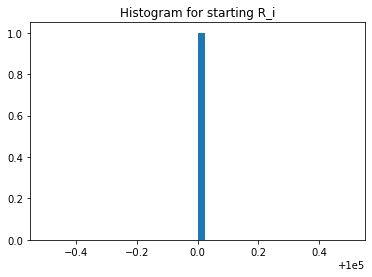

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([200000., 237502., 238820., ..., 192428., 149454., 146679.])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14762., 14849., 14811., 14670., 14810., 14764., 14858.,
       14706., 14715., 14808., 14720., 14667., 14768., 14678., 14760.,
       14758., 14813., 14763., 14765., 14856., 14710., 14716., 14672.,
       14802., 14804., 14708., 14766., 14711., 14806., 14851., 14756.,
       14674., 14807., 14677., 14761., 14754., 14719., 14725., 14665.,
       14803., 14671., 14721., 14637., 14717., 14852., 14859., 14684.,
       14661., 14757., 14723., 14905., 14627., 14718., 14767., 14707.,
       14799., 14638., 14801., 14714., 14681., 14589., 14675., 14809.,
       14709., 14812., 14668., 14805., 14713., 14628., 14676., 14669.,
       14673., 14759., 14855., 14815., 14800., 14680., 14634., 14705.,
       14752., 14770., 14816., 14629., 14857., 14860., 14726., 14619.,
       14724., 14904., 14712., 14722., 14683., 14755., 14727., 14771.,
       14818., 14795., 14631., 14640., 14750.])

In [25]:
experiments.UNI_Qj.unique()

array([200000., 148621., 149671., ..., 136999., 136025., 135074.])

In [26]:
experiments.UNI_Rj.unique()

array([100000., 134704., 133756., ..., 146171., 147221., 148261.])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([100000.])

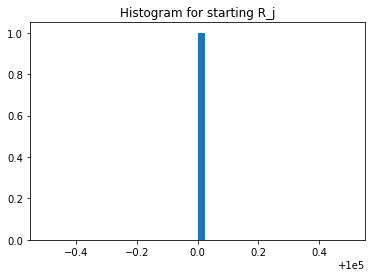

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100000.])

In [31]:
experiments.UNI_ji.unique()

array([100000.])

In [32]:
experiments.UNI_Sij.unique()

array([1.e+10])

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


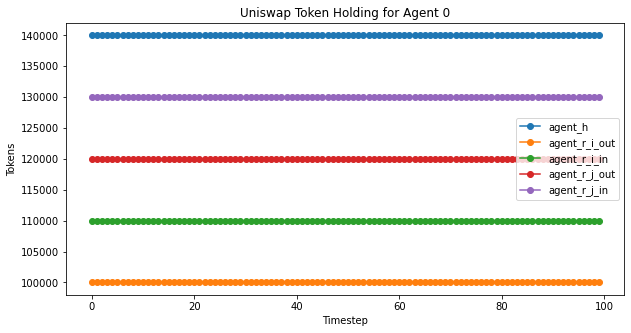

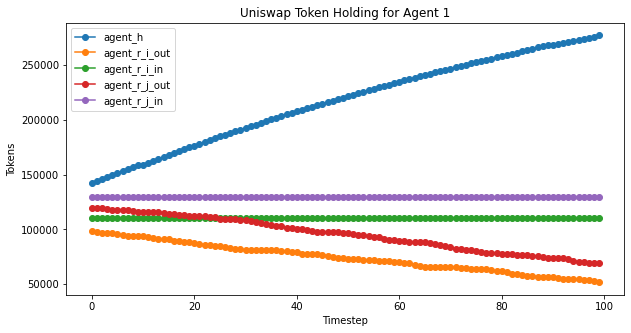

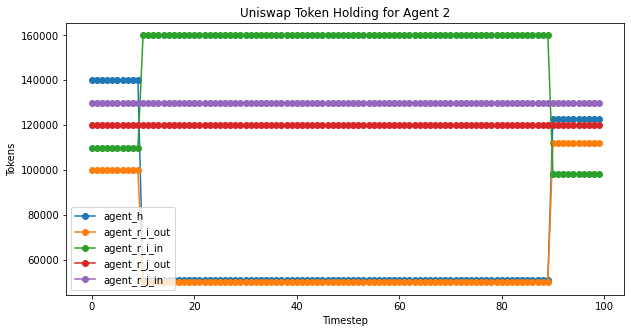

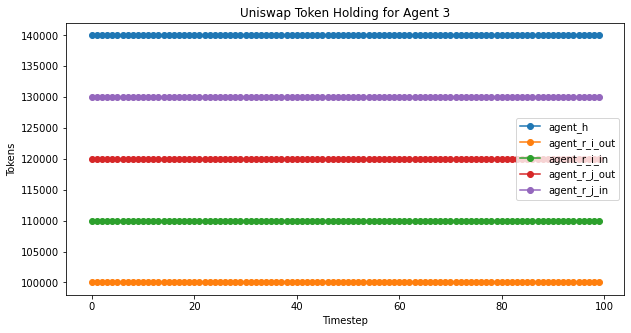

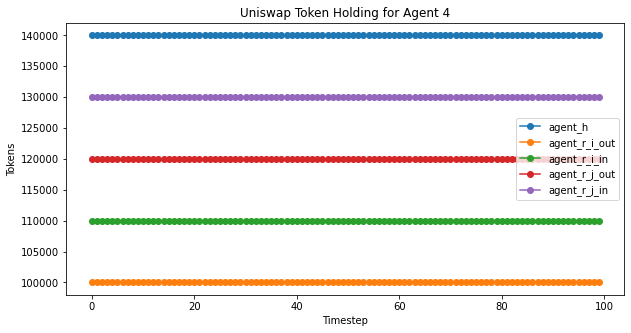

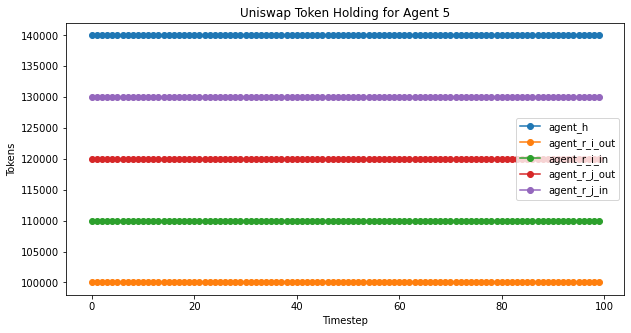

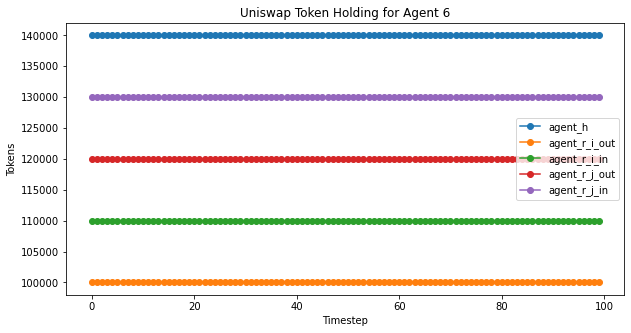

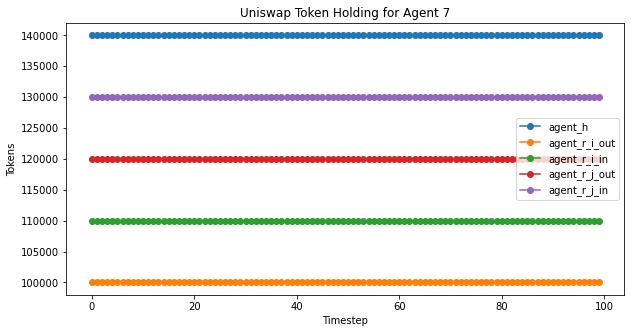

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


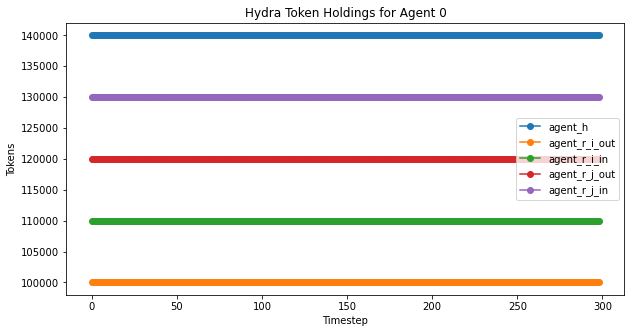

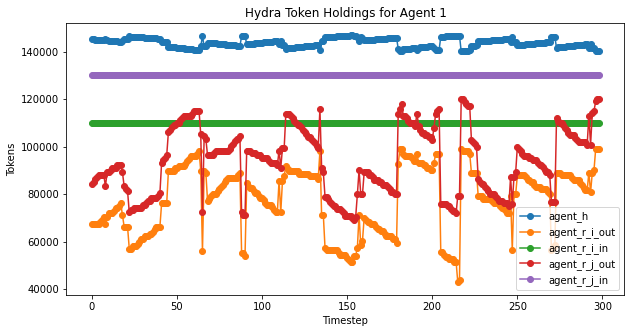

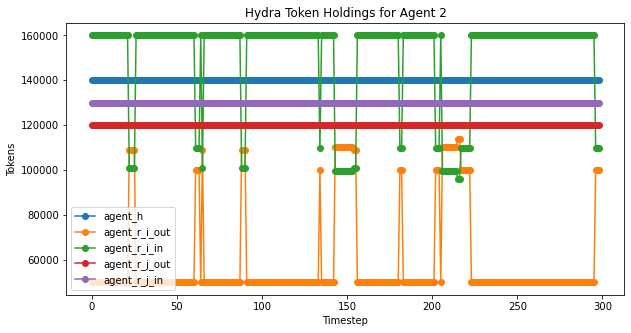

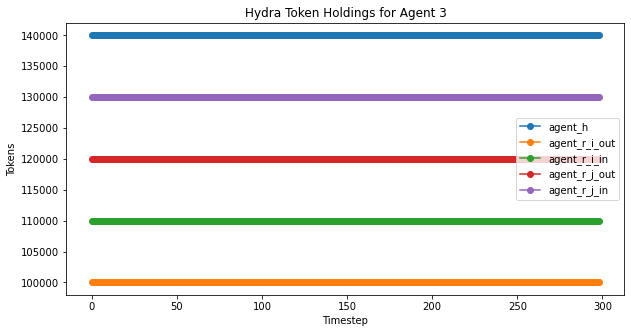

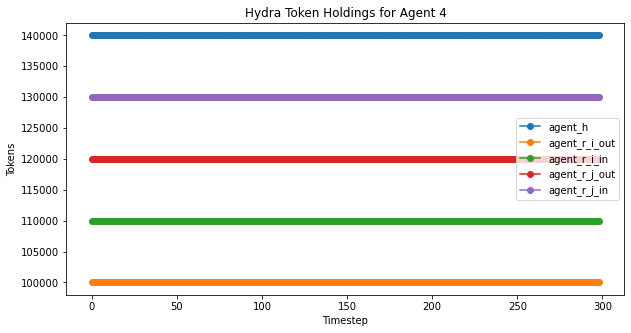

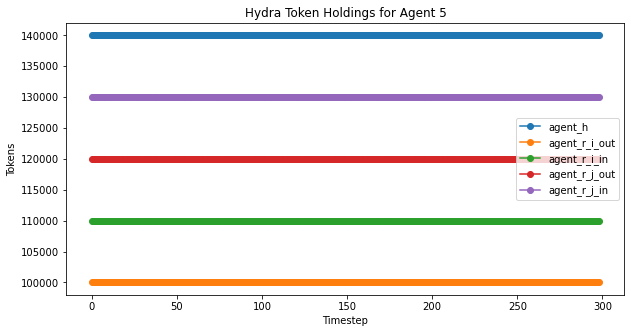

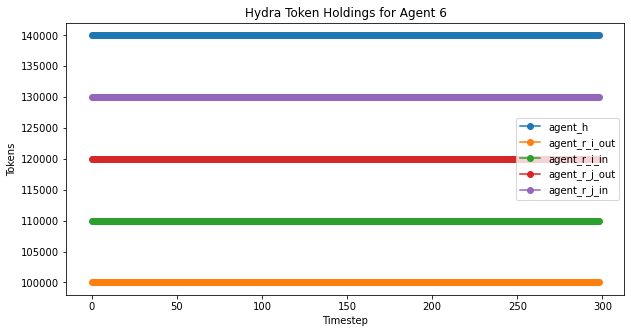

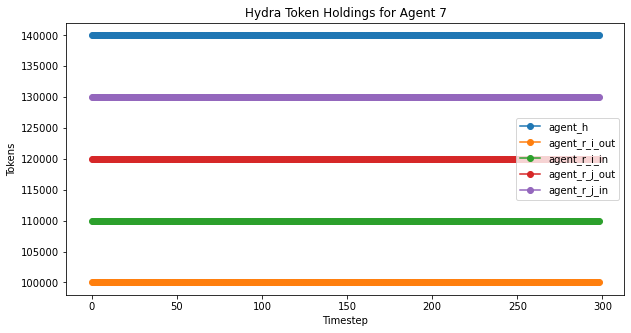

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

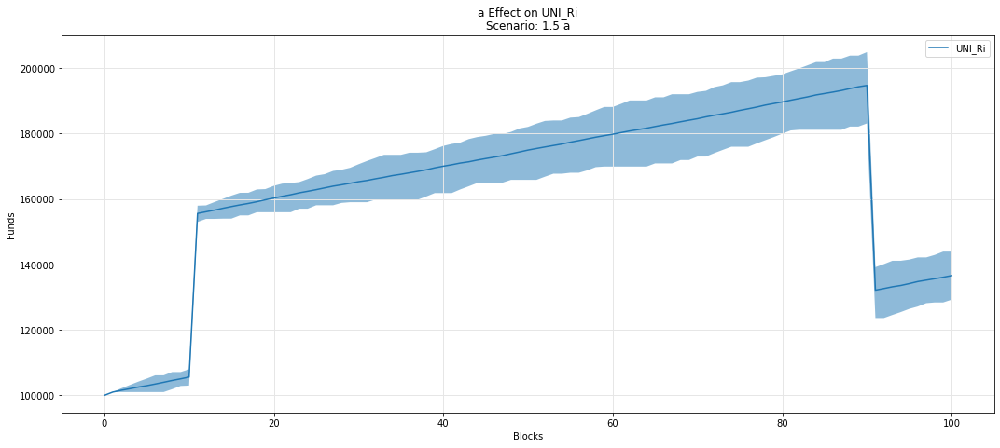

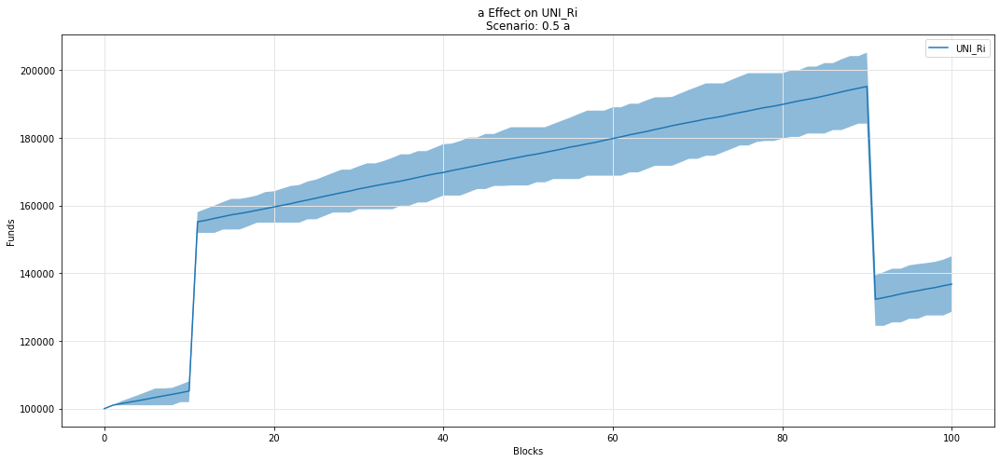

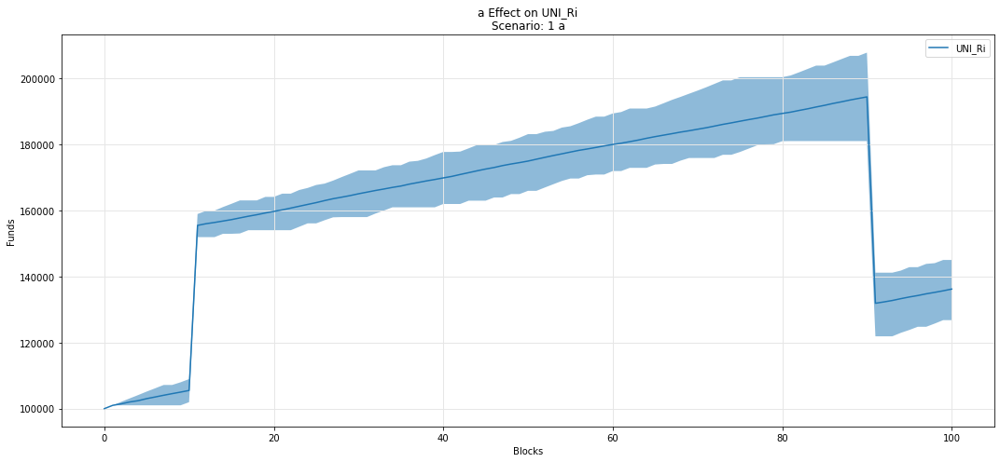

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

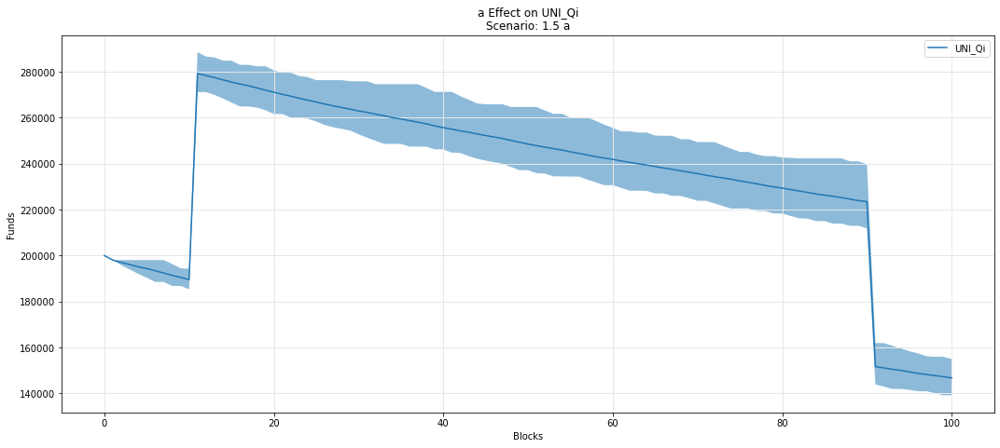

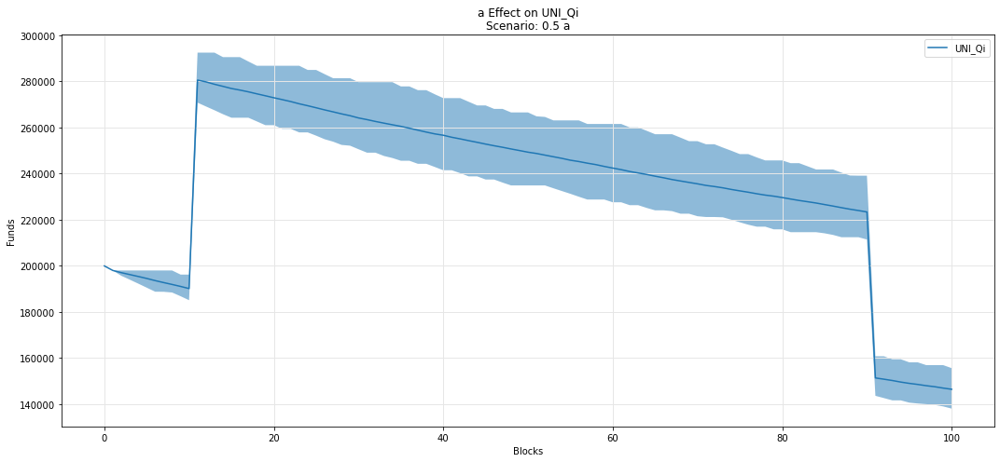

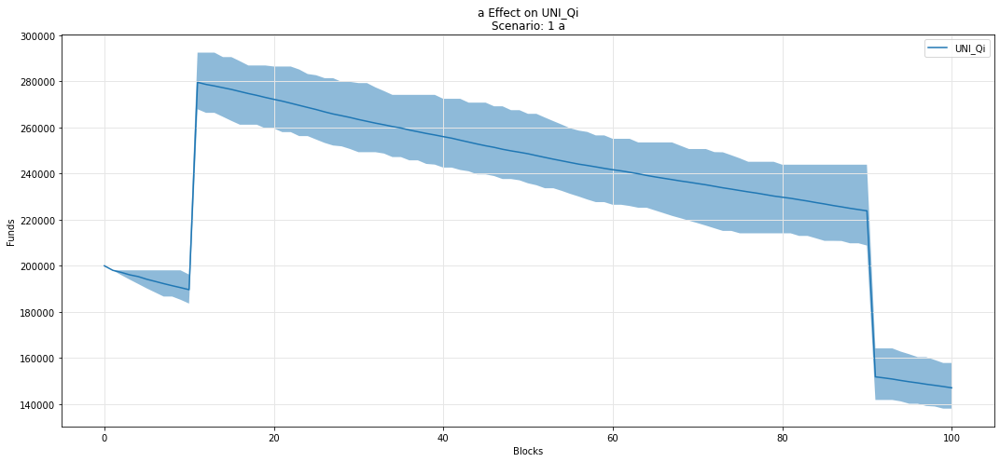

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

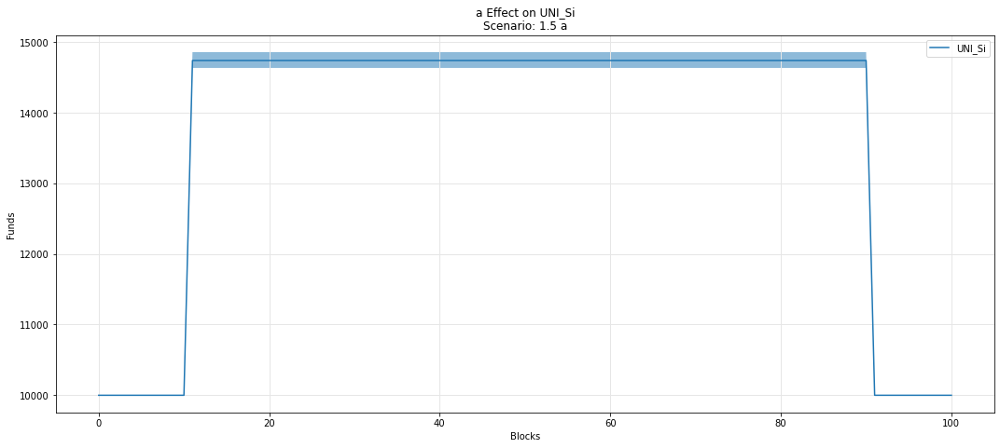

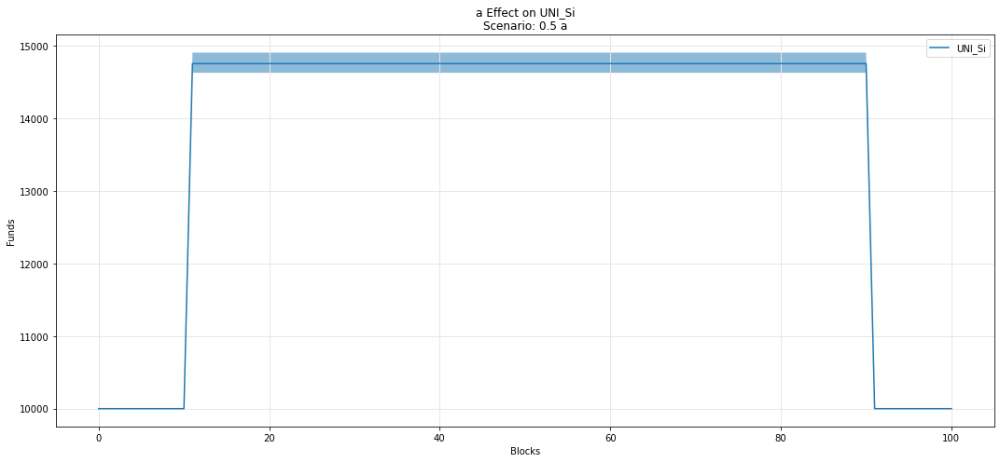

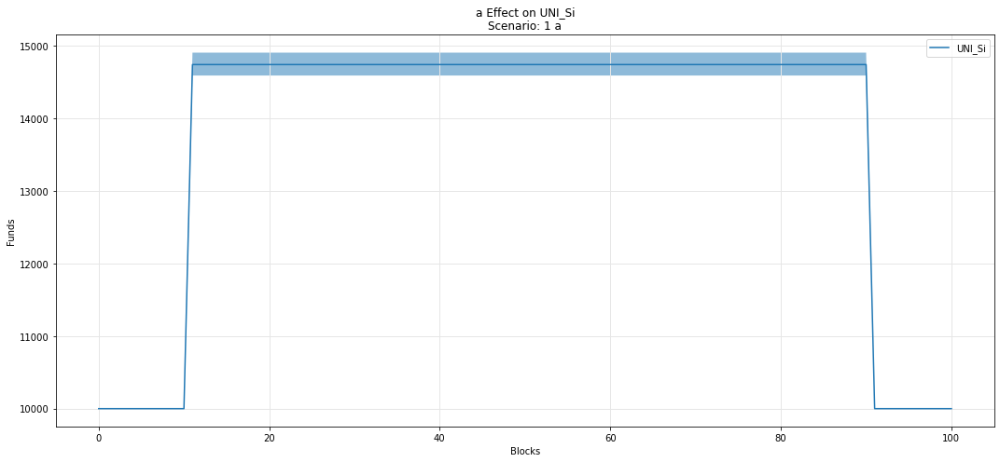

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

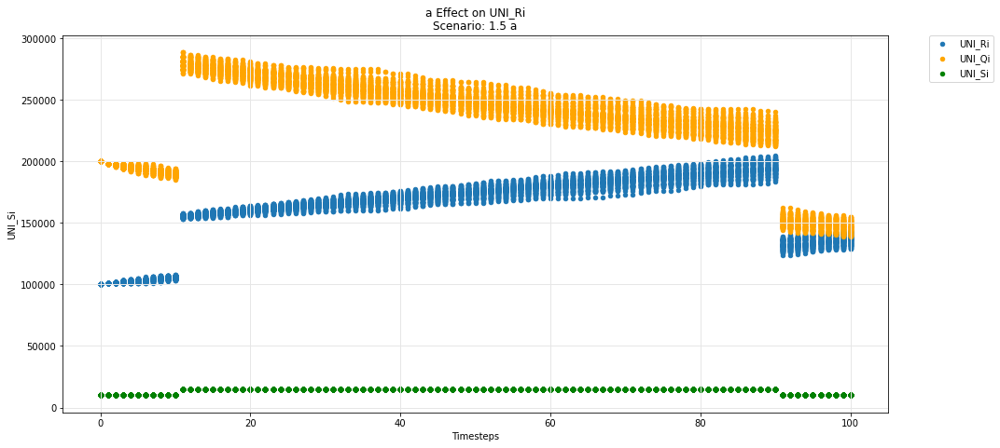

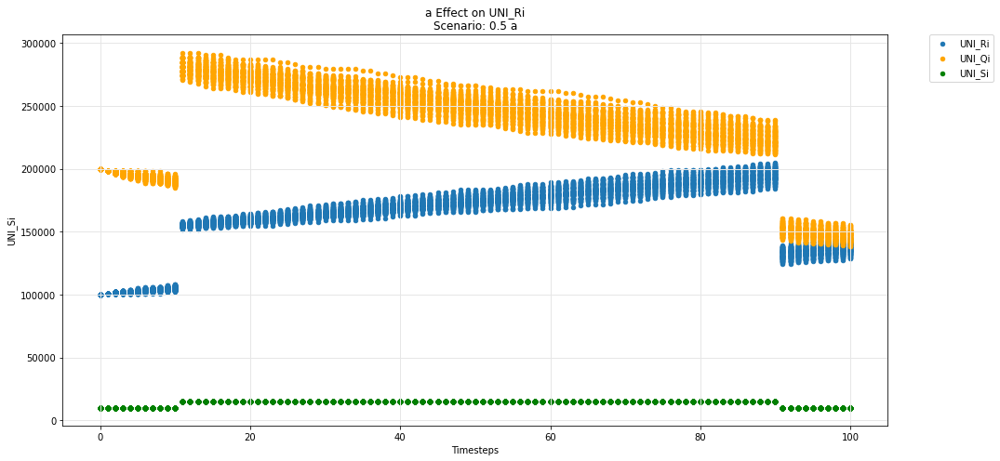

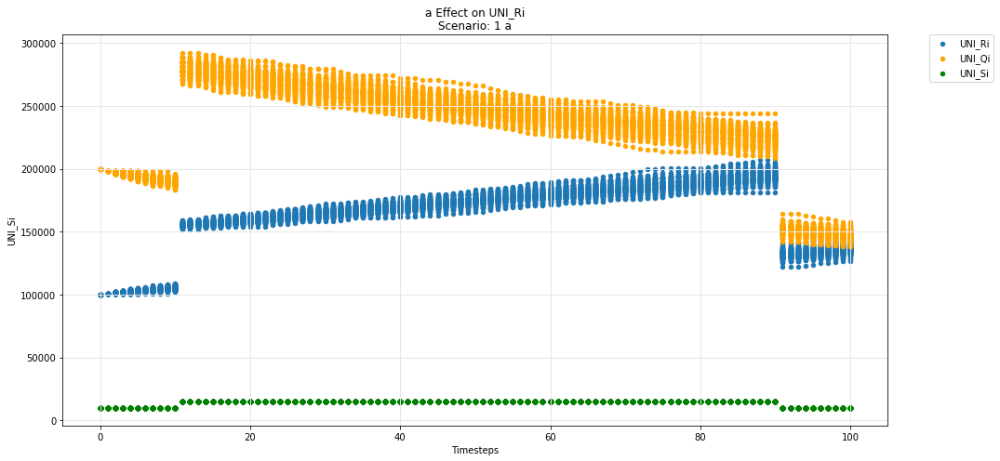

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

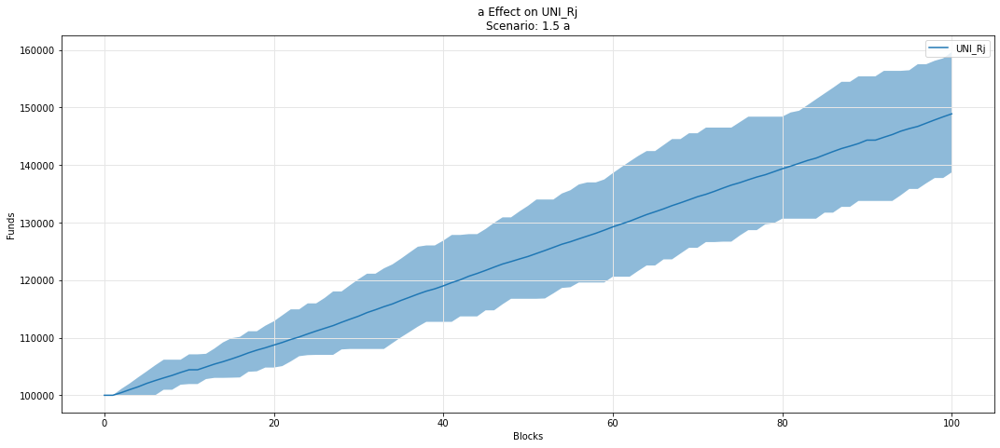

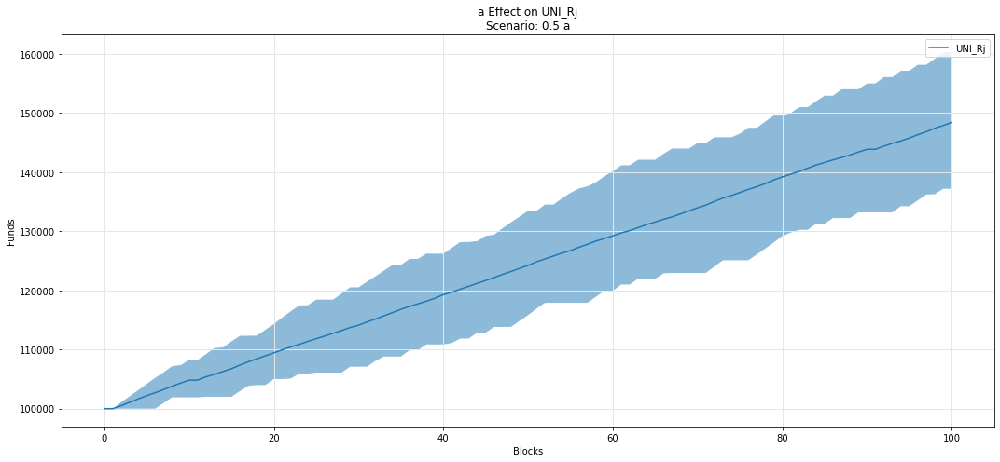

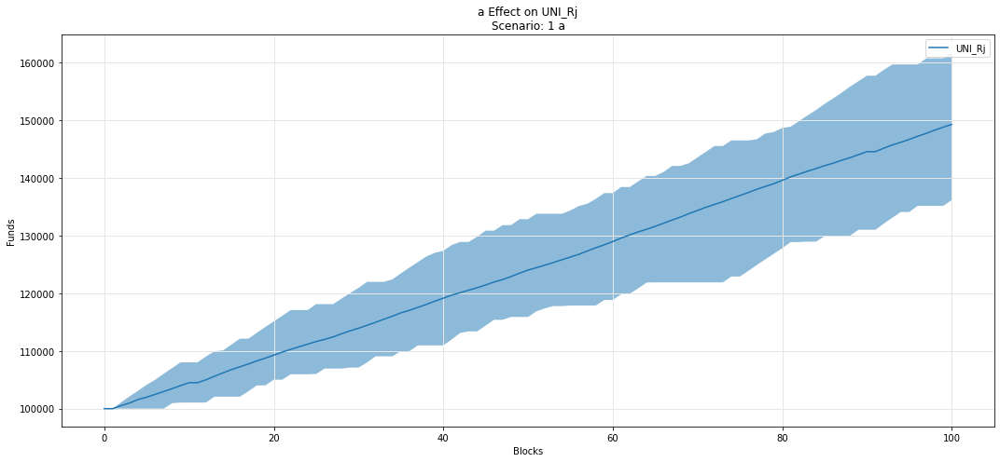

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

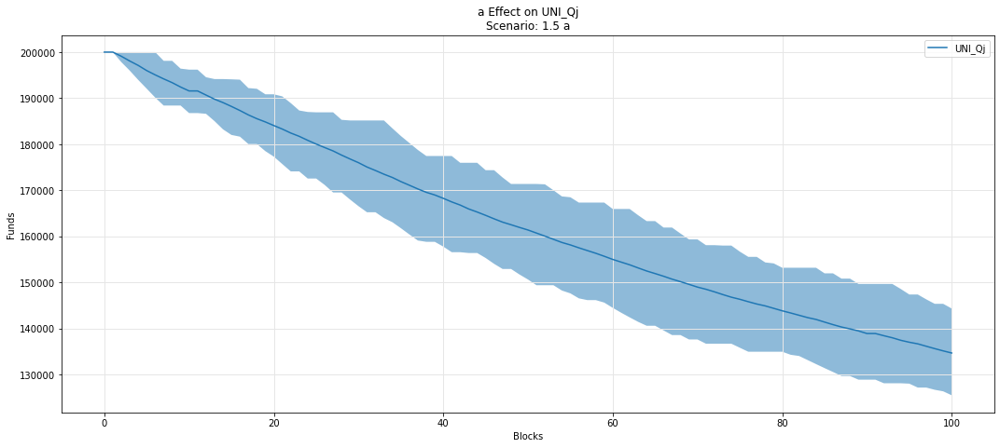

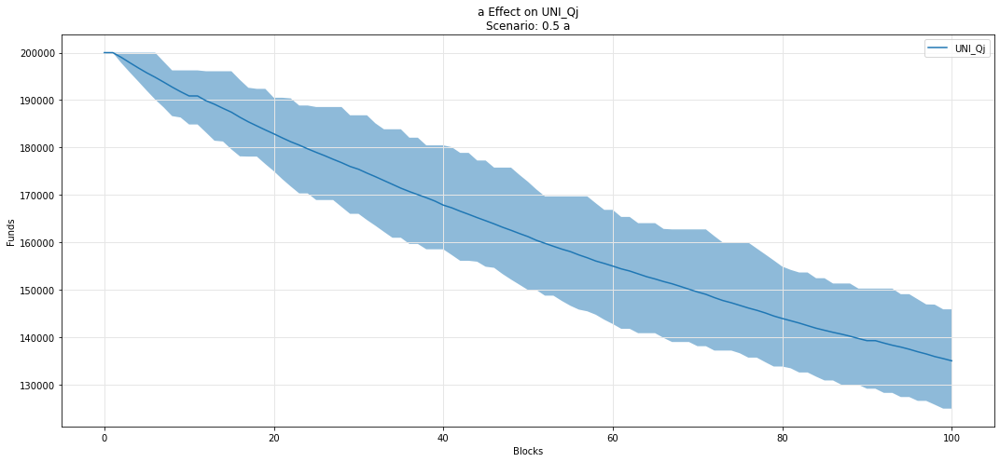

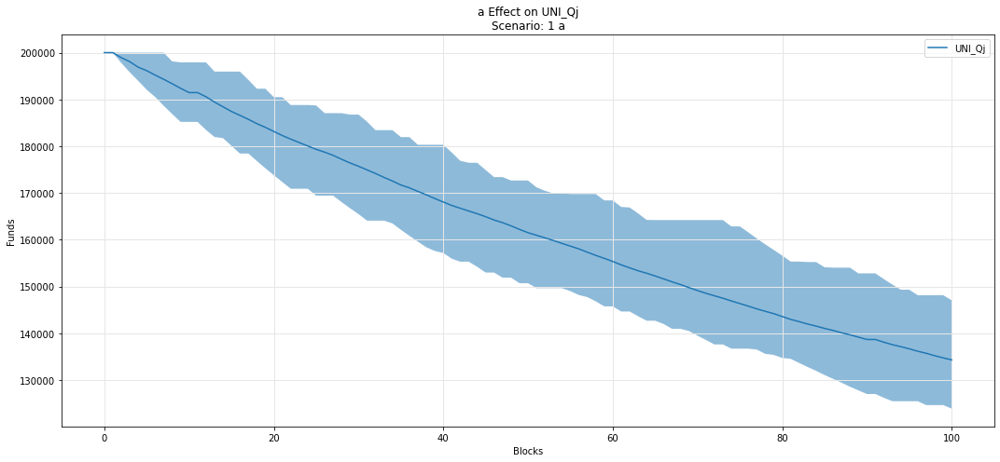

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

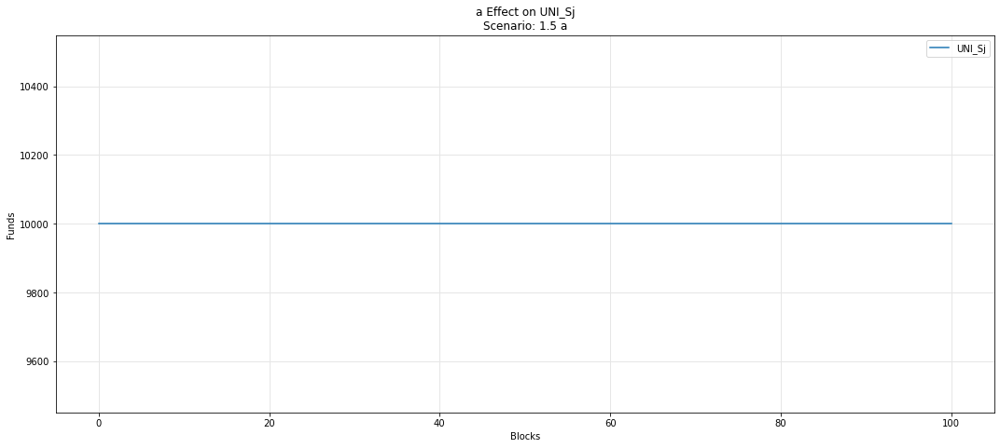

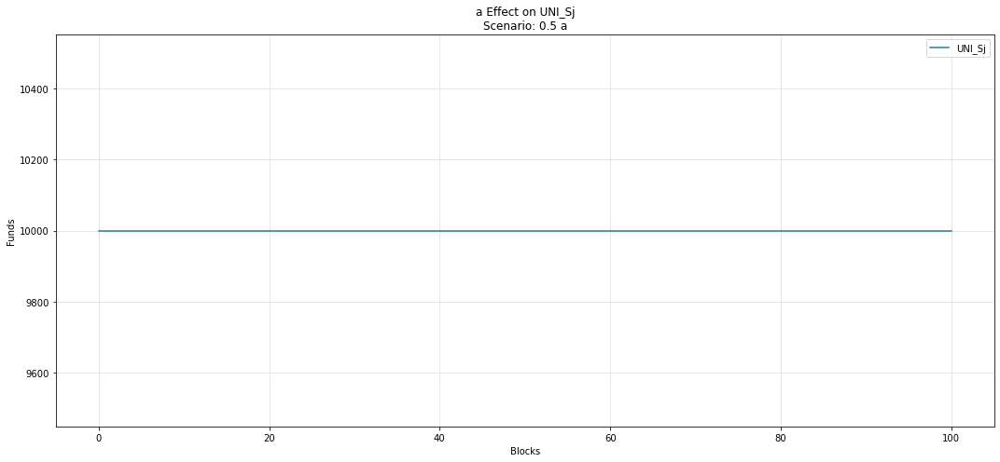

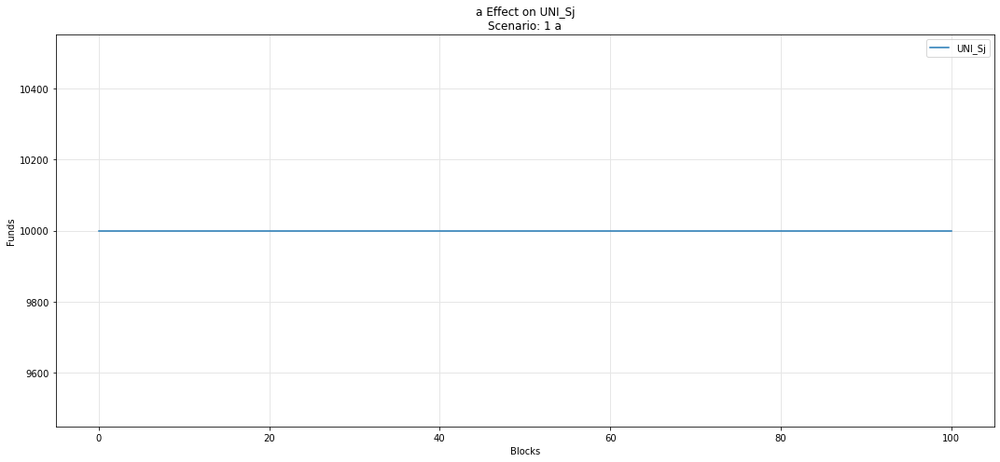

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

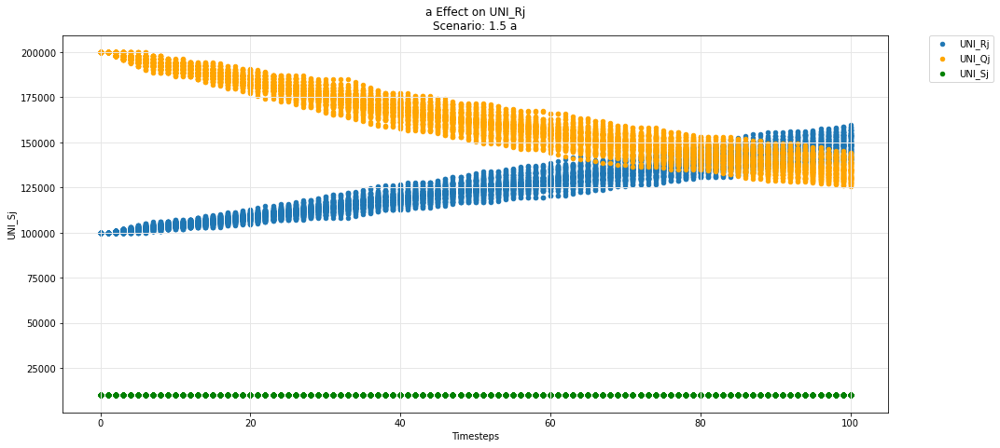

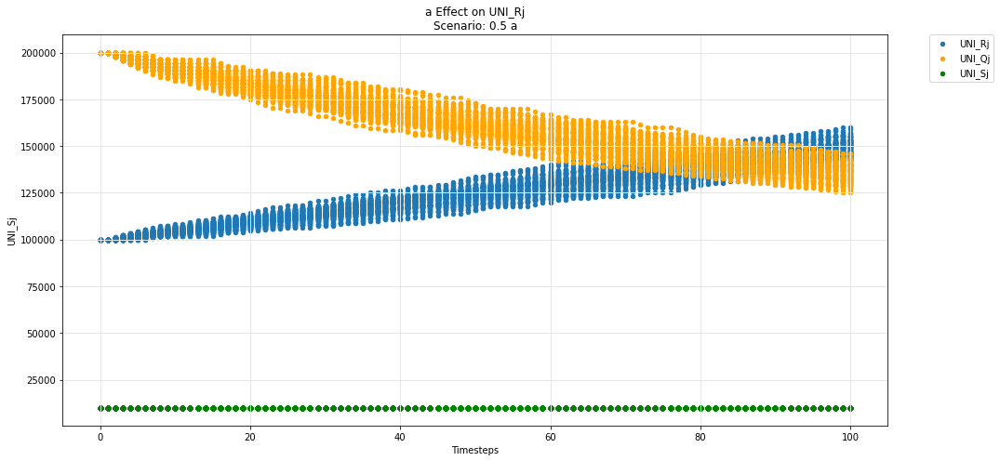

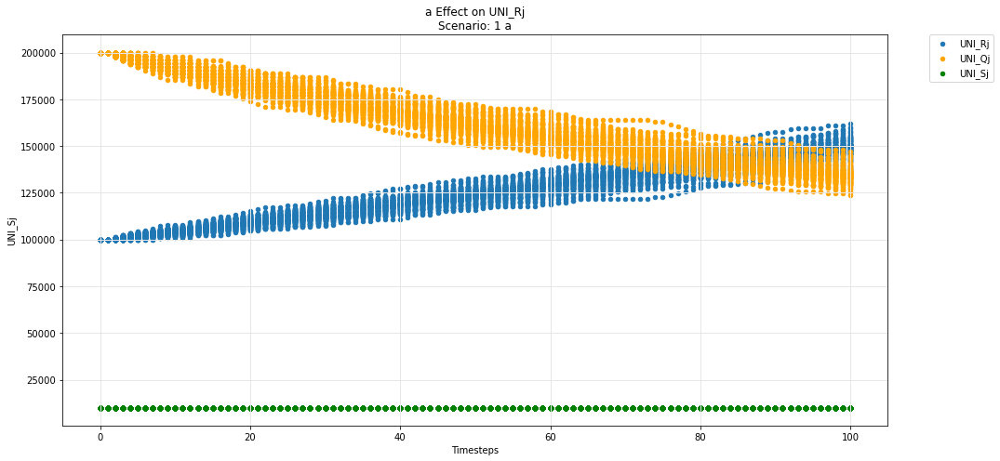

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

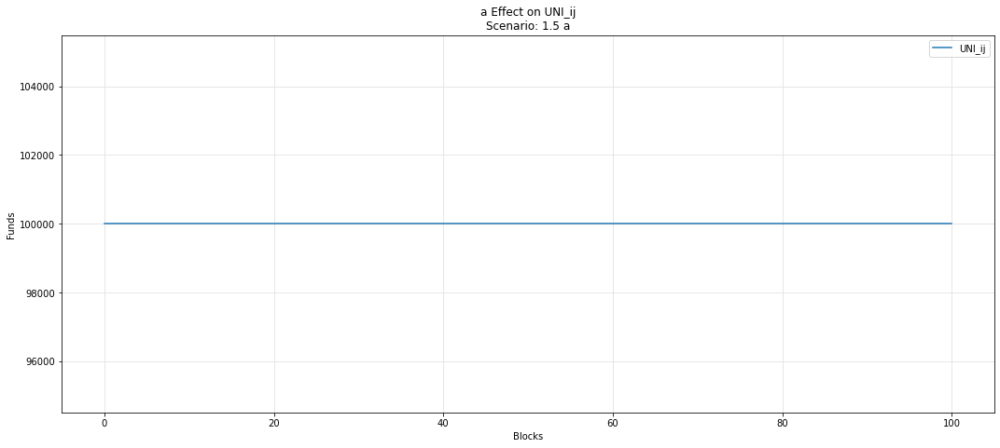

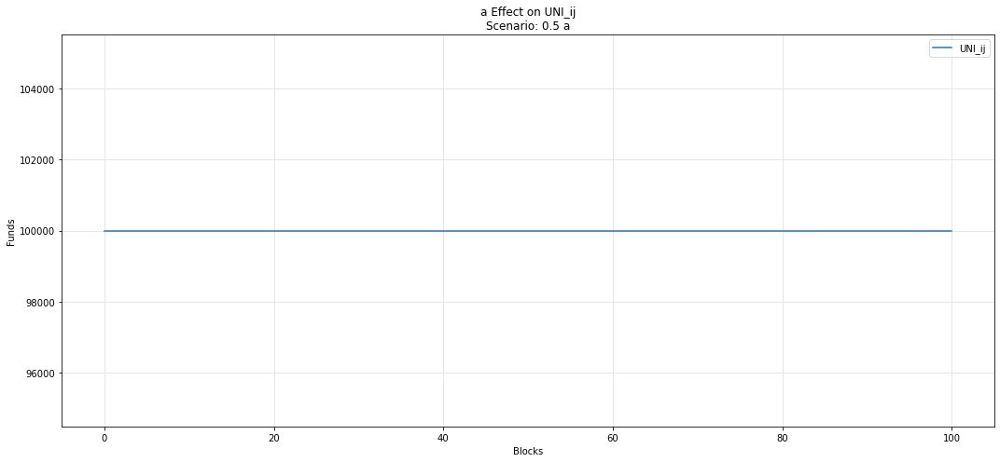

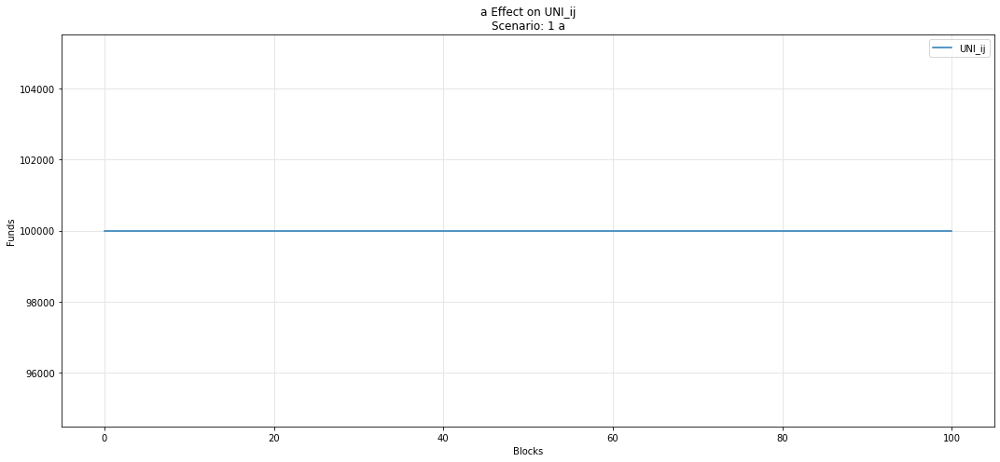

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

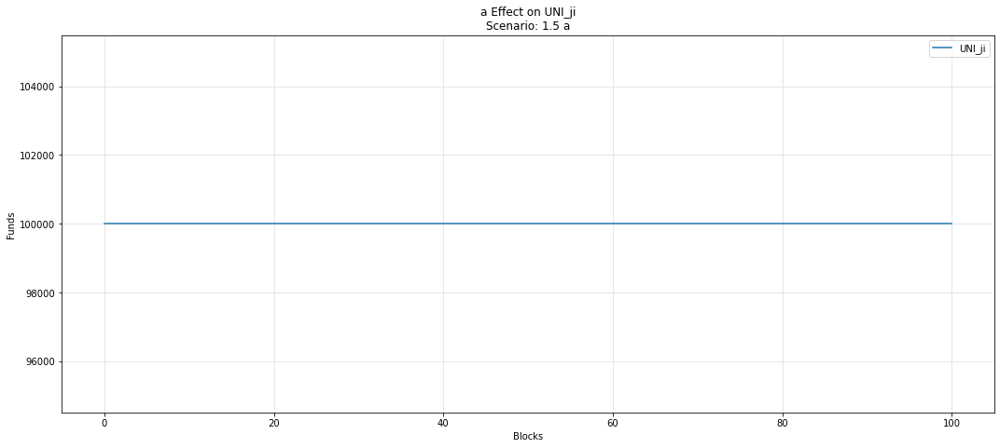

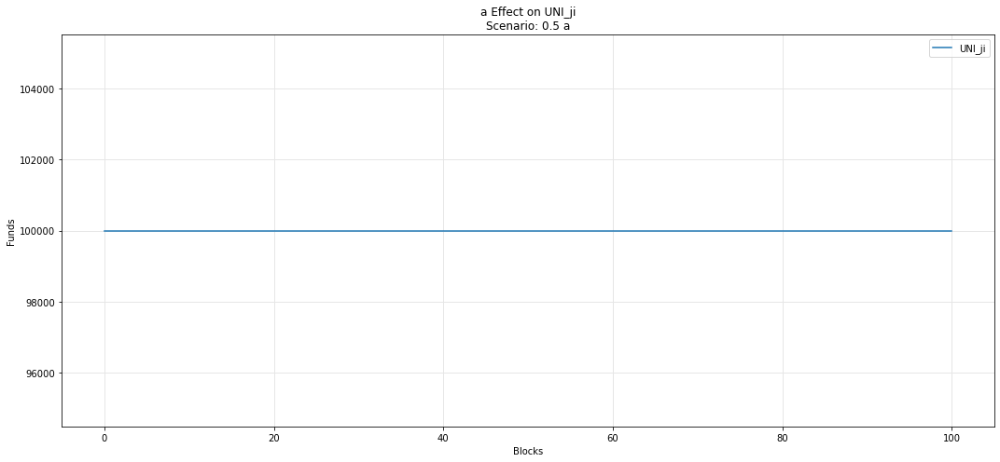

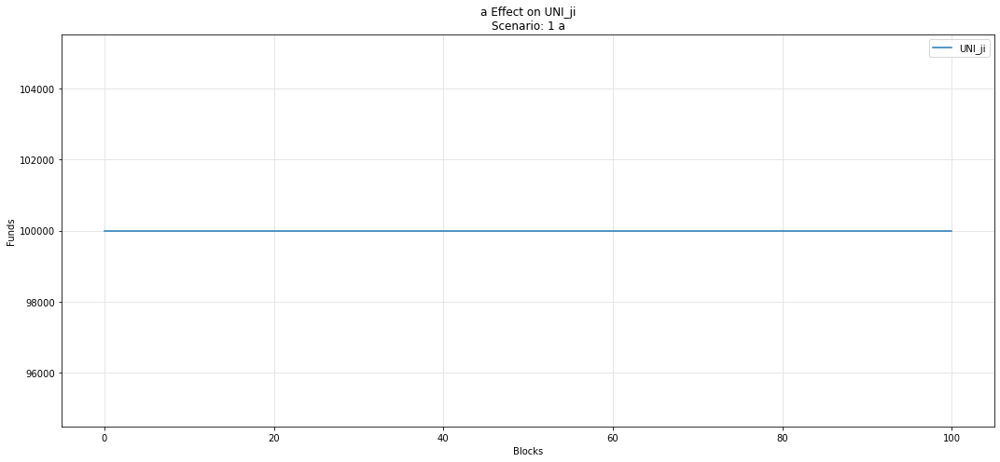

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

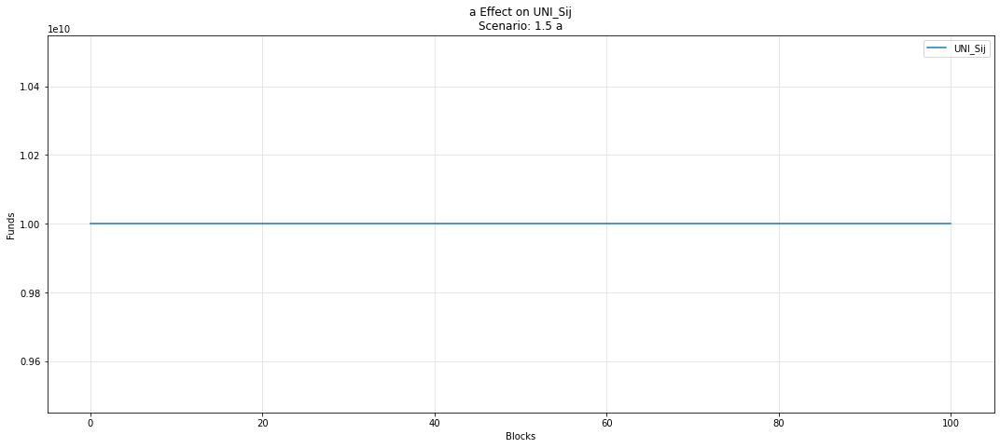

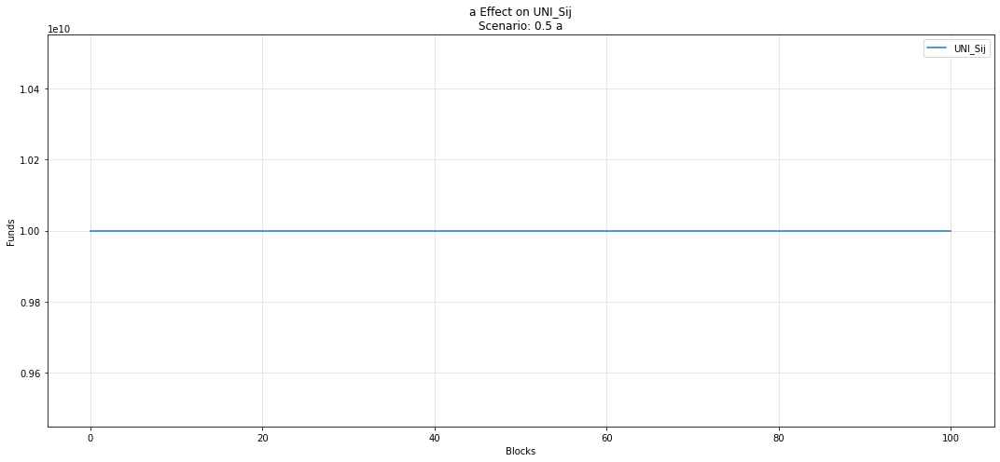

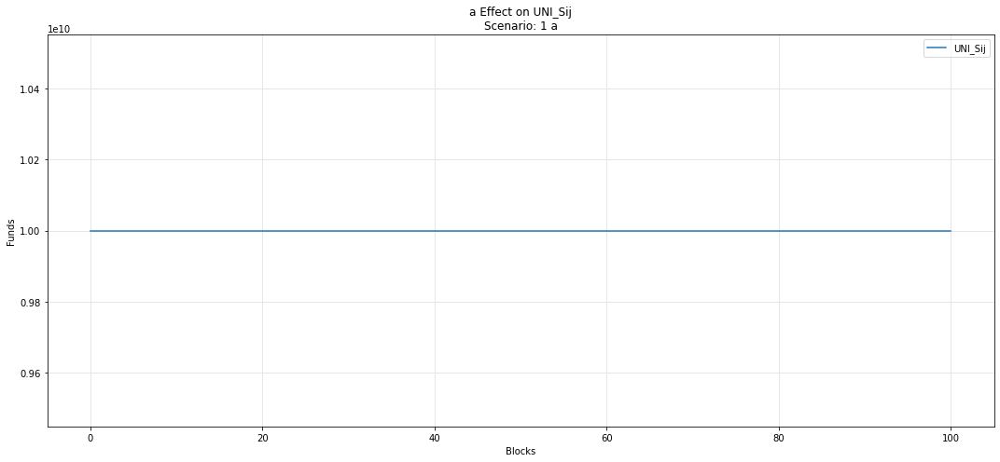

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

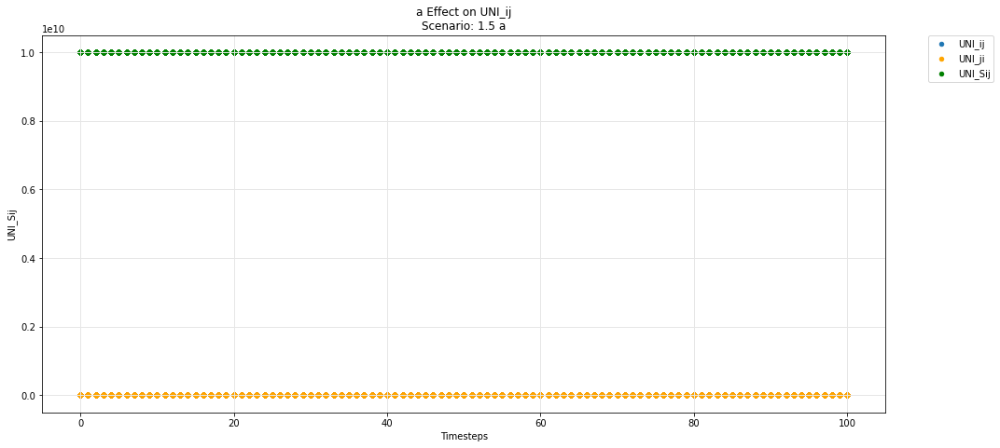

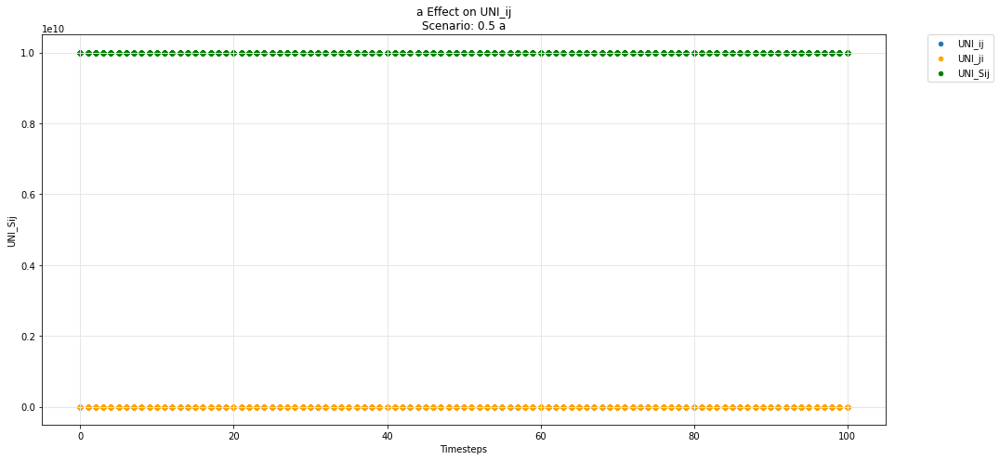

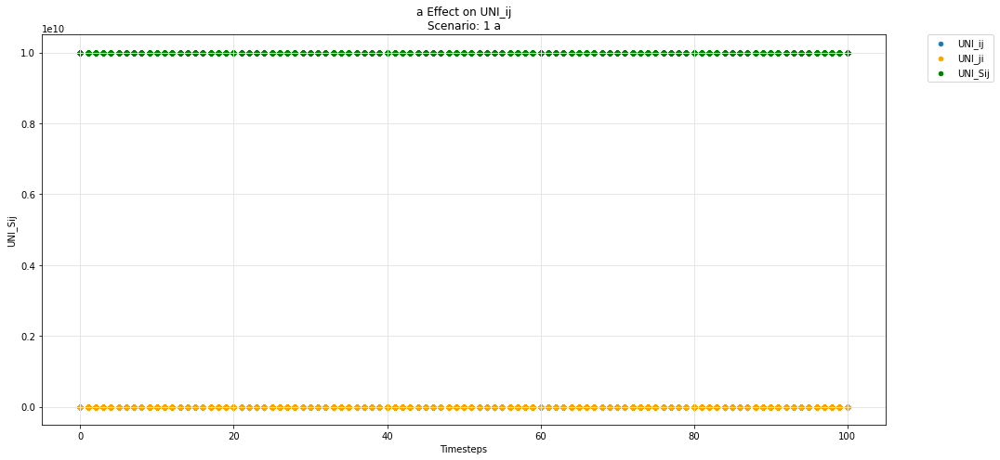

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

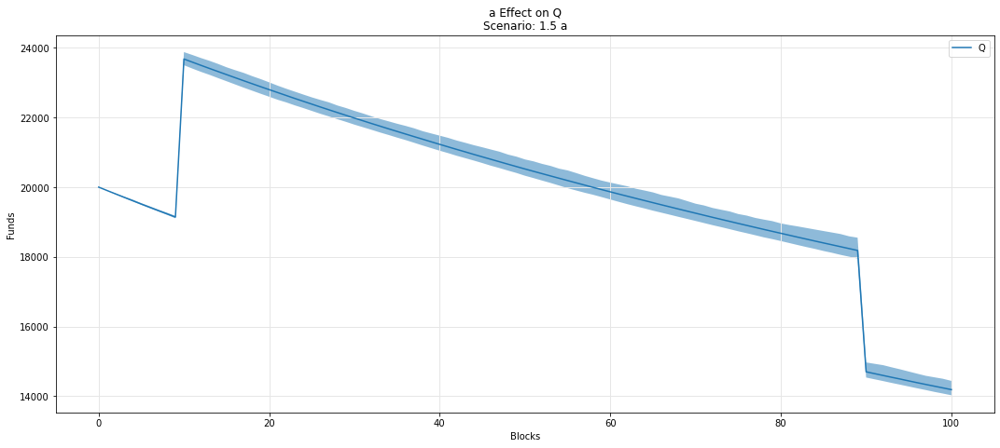

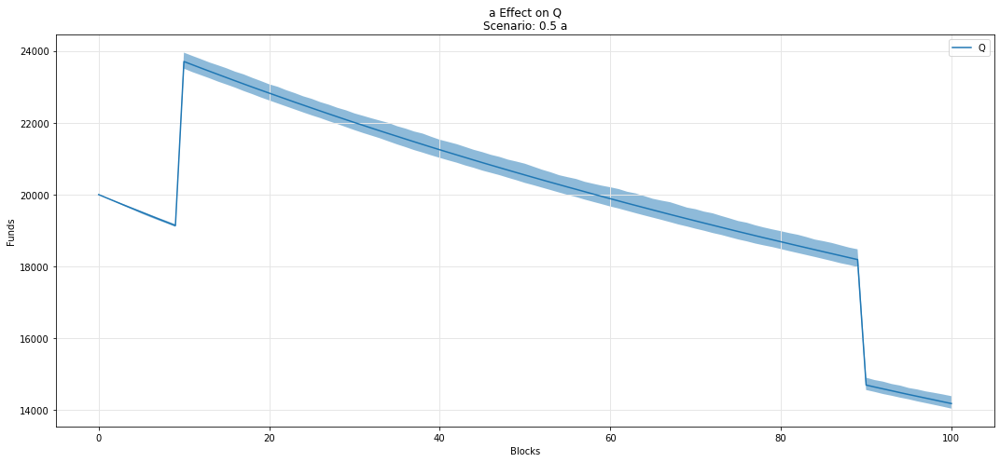

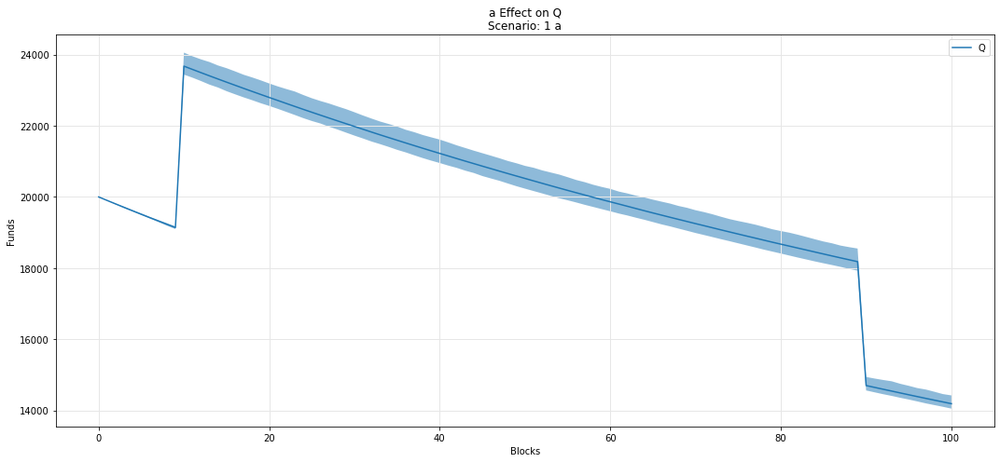

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

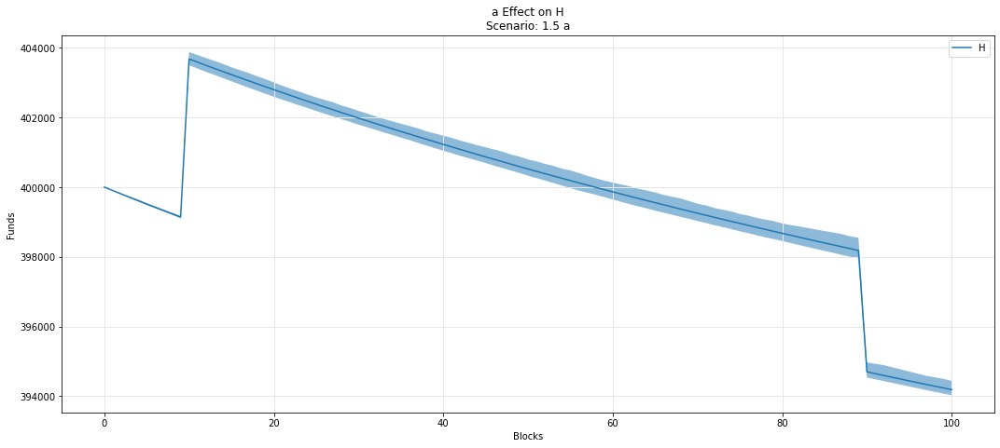

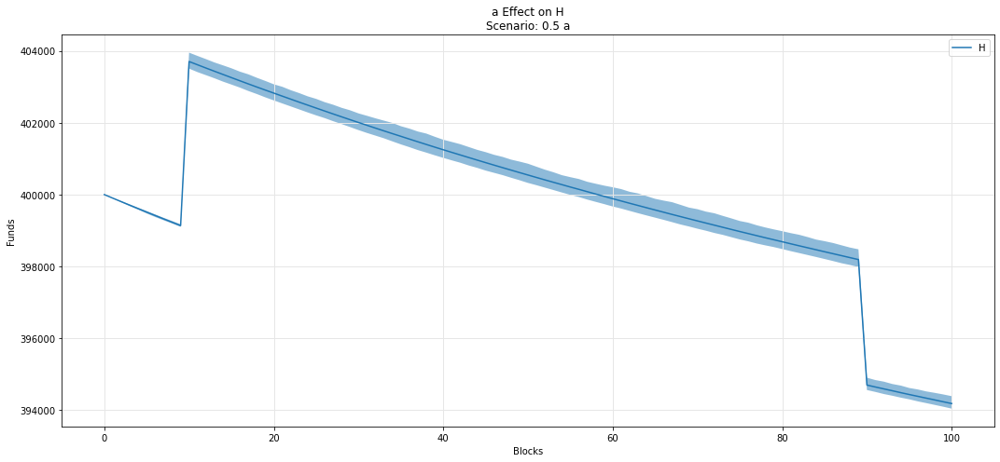

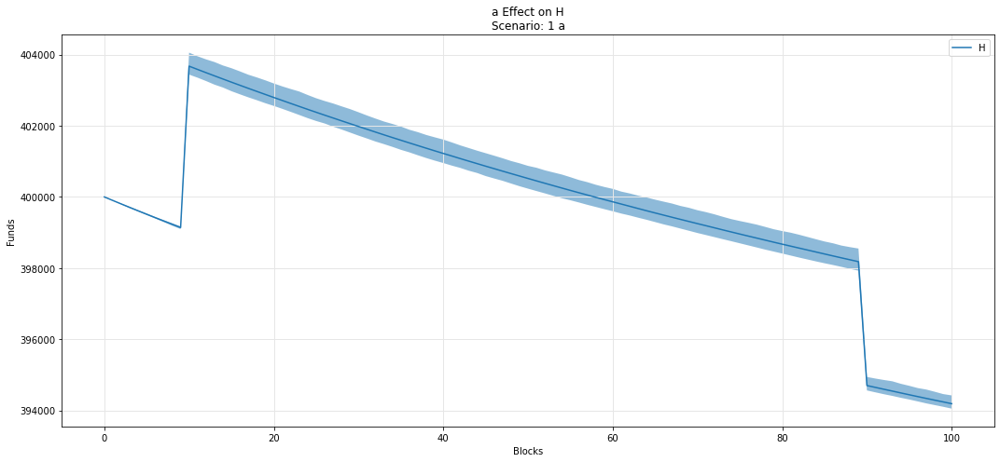

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

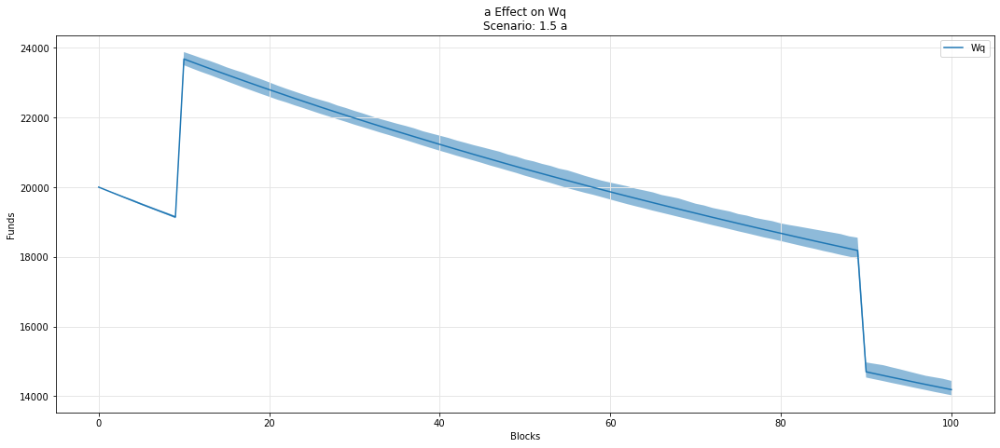

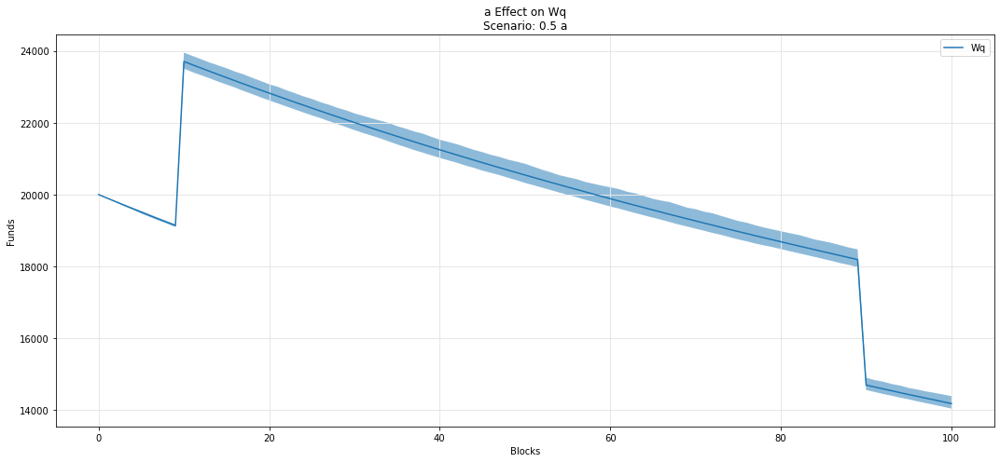

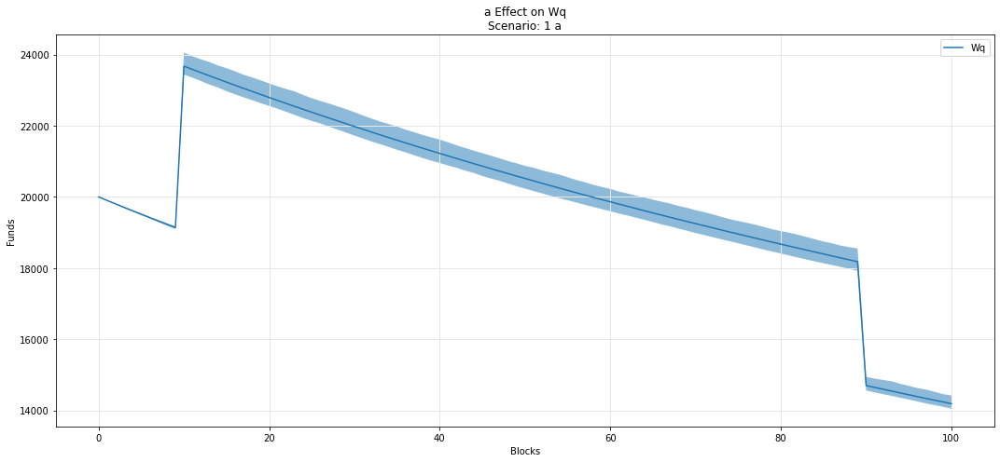

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

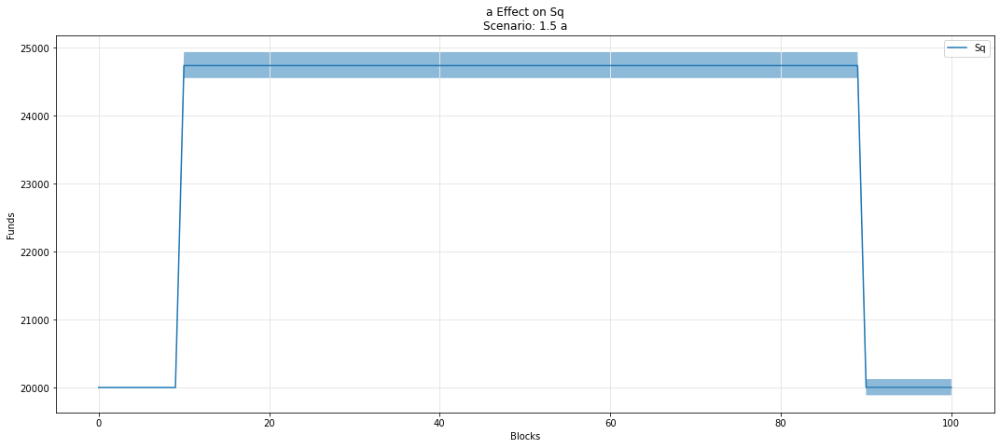

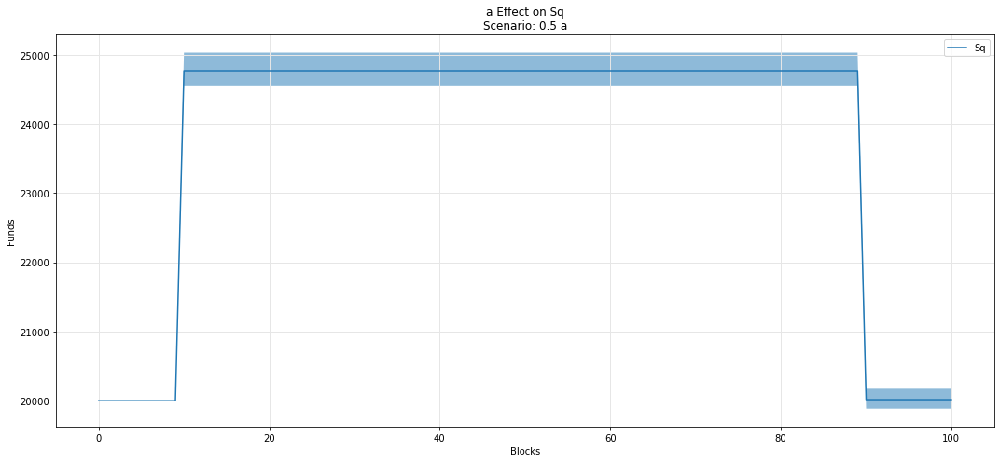

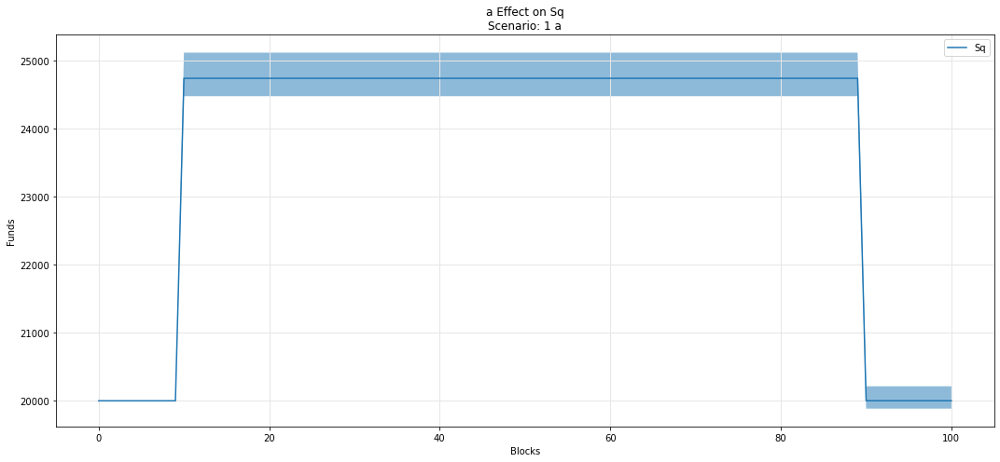

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

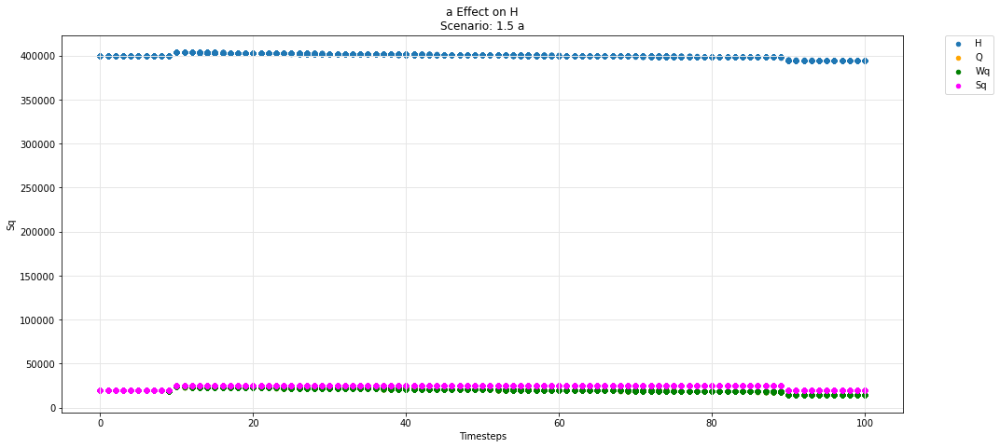

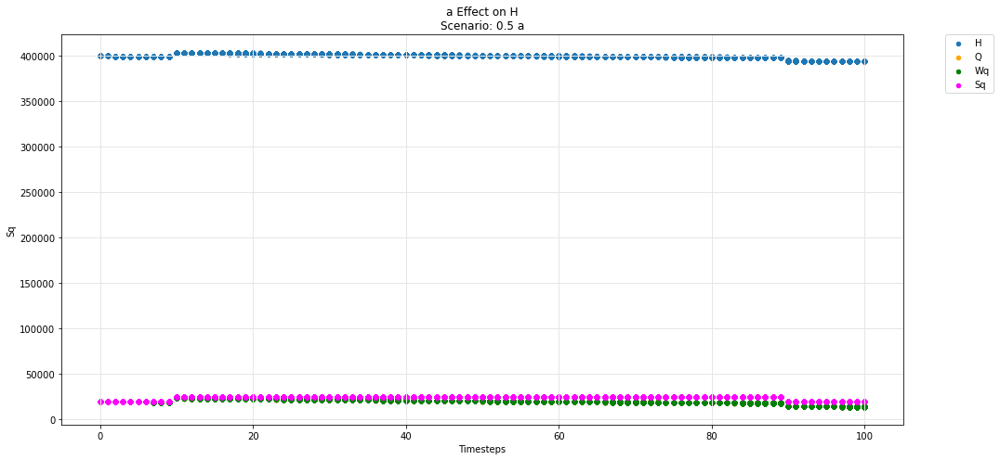

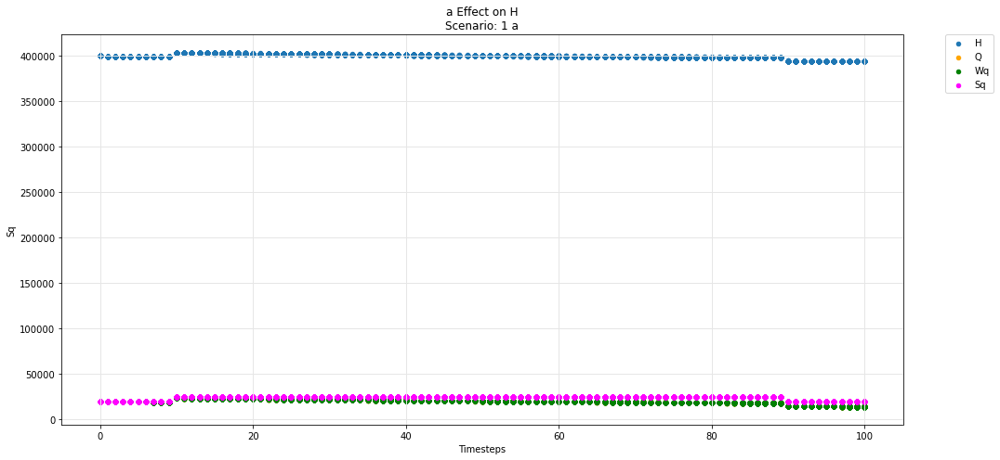

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

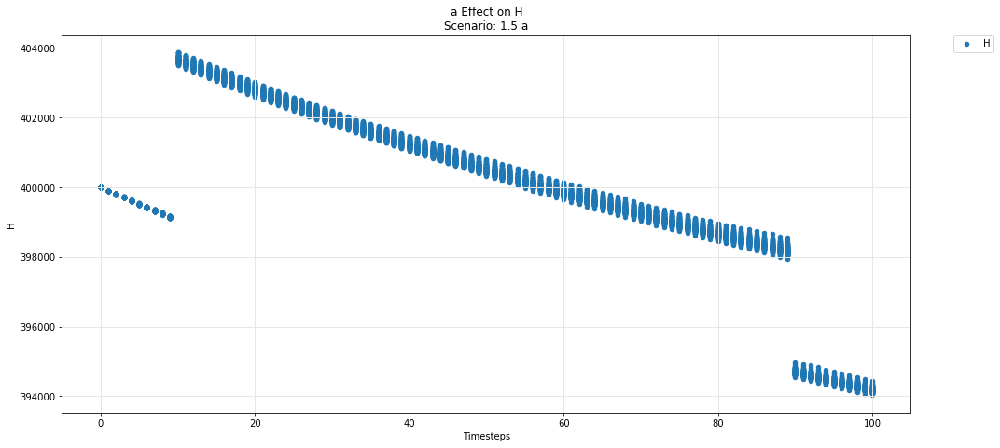

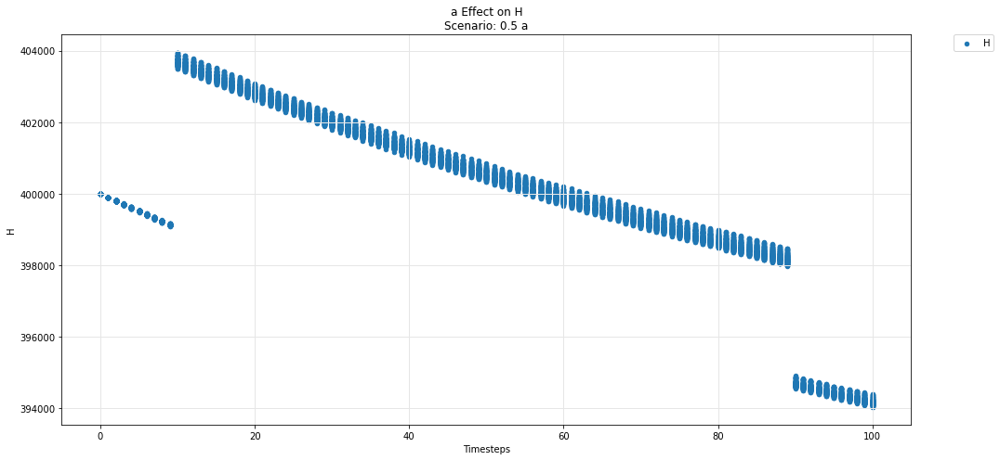

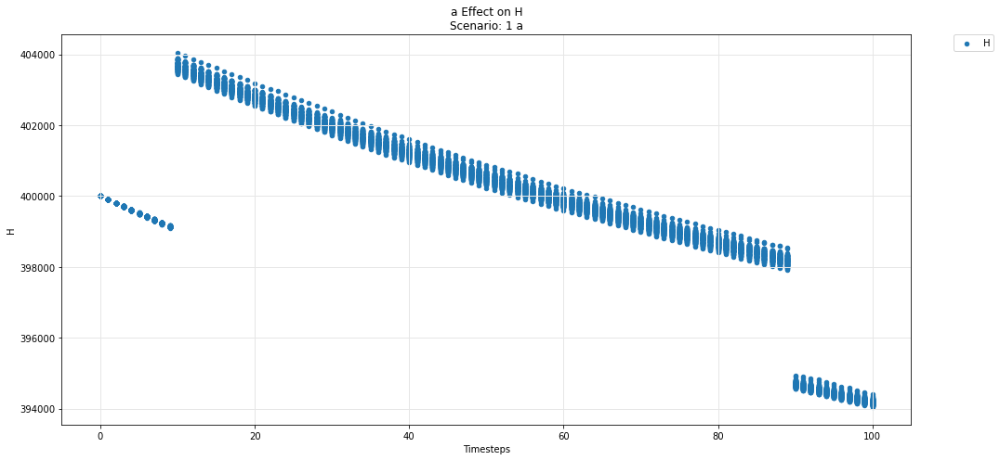

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

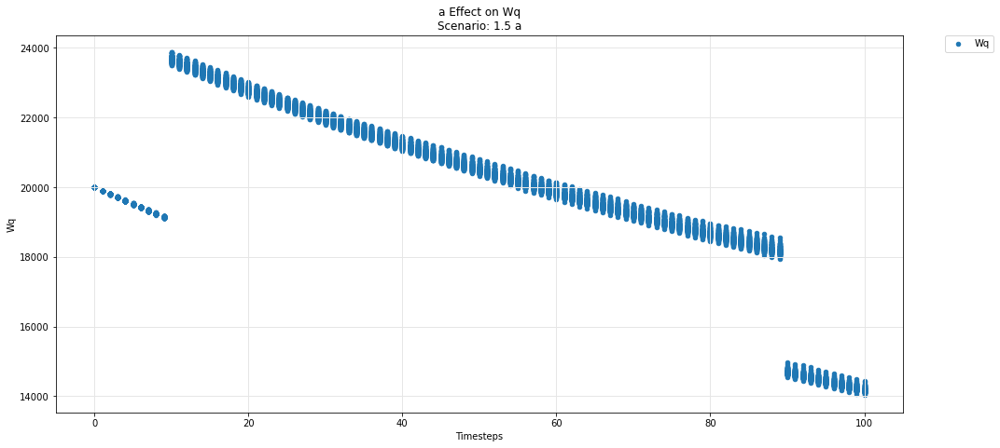

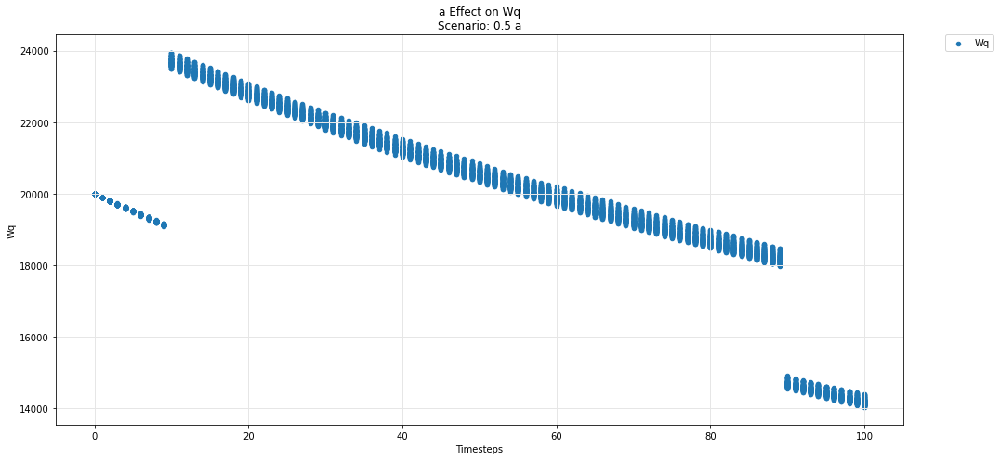

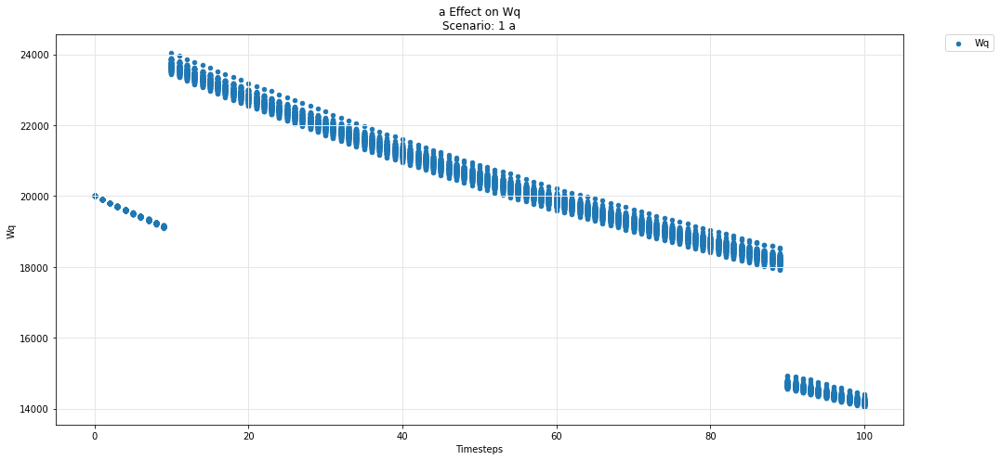

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

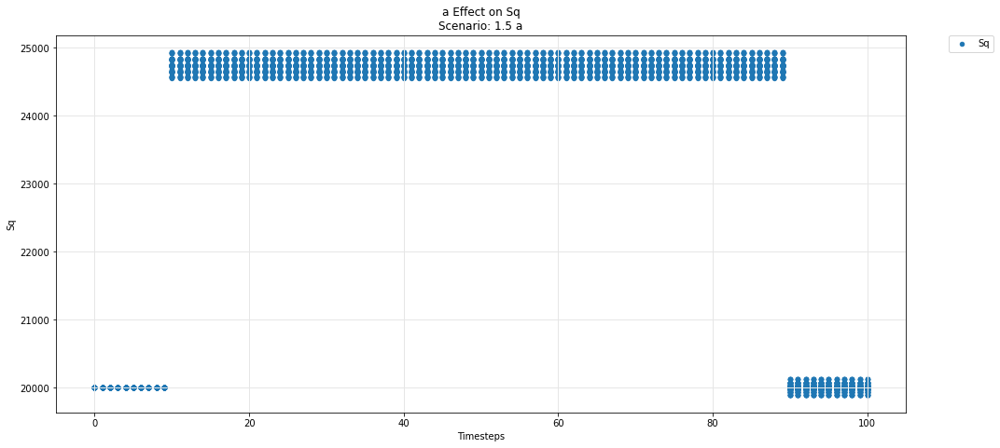

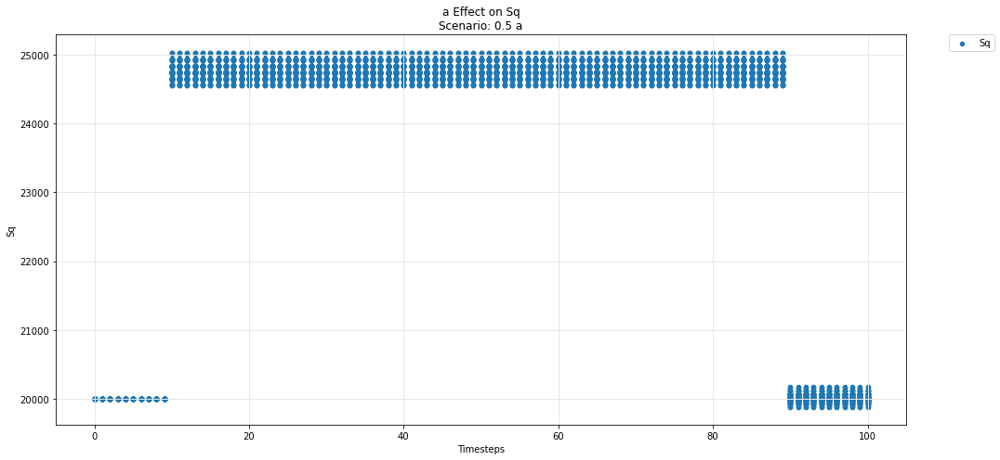

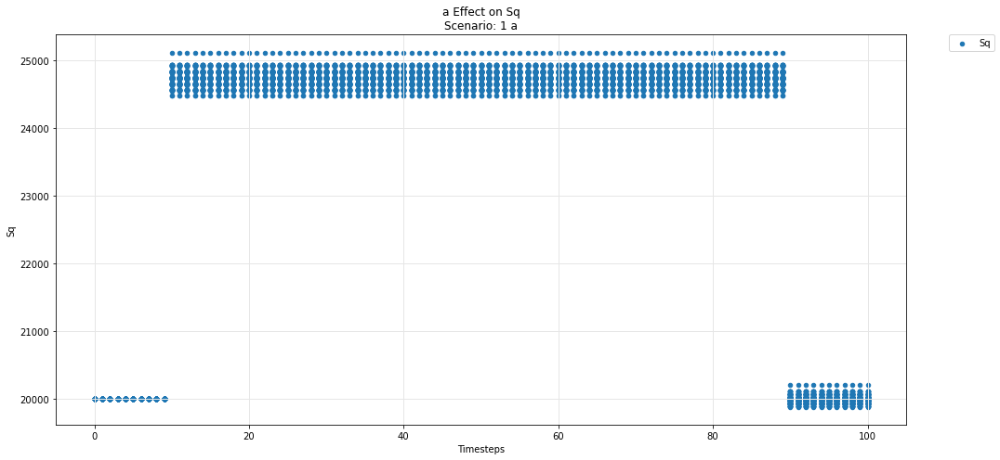

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

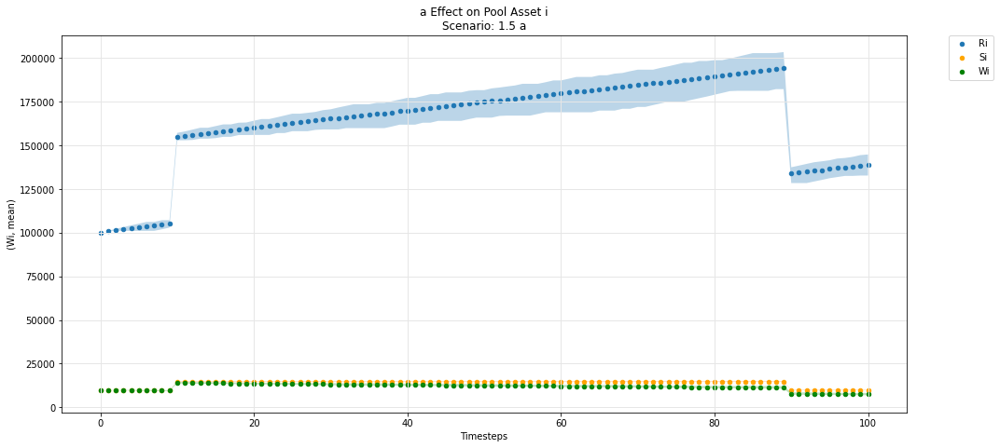

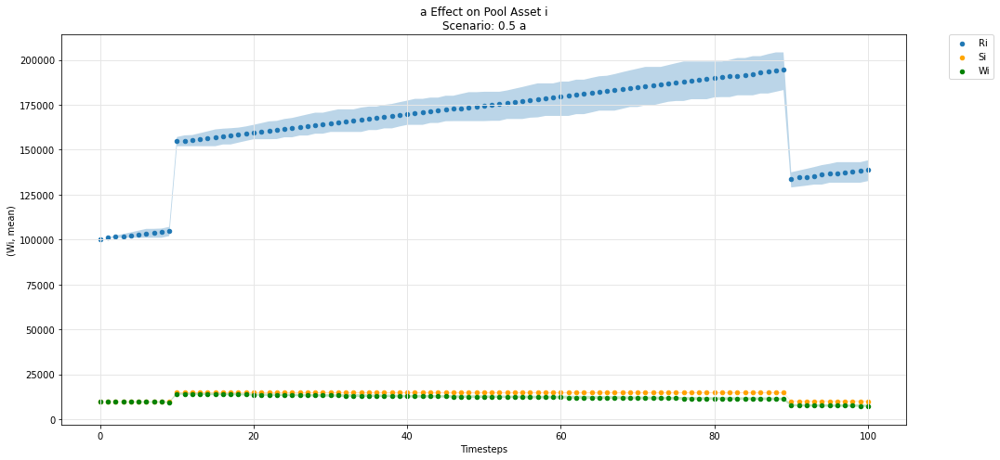

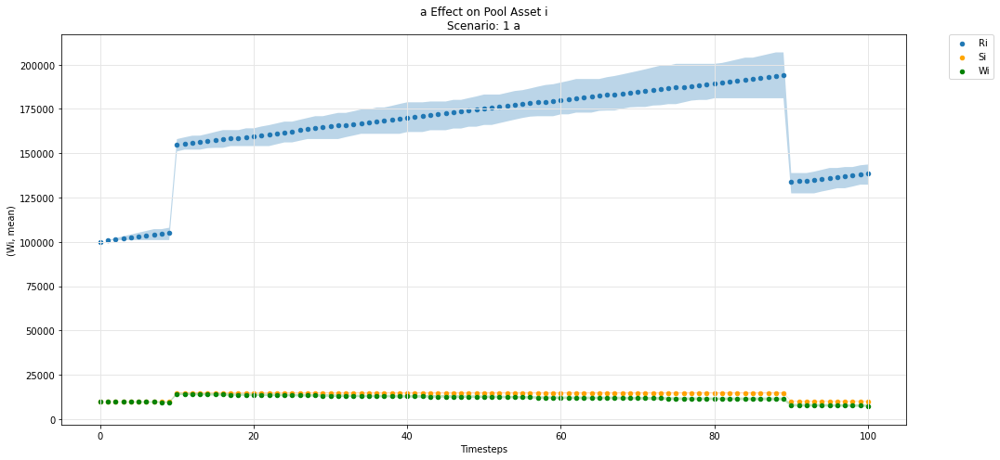

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

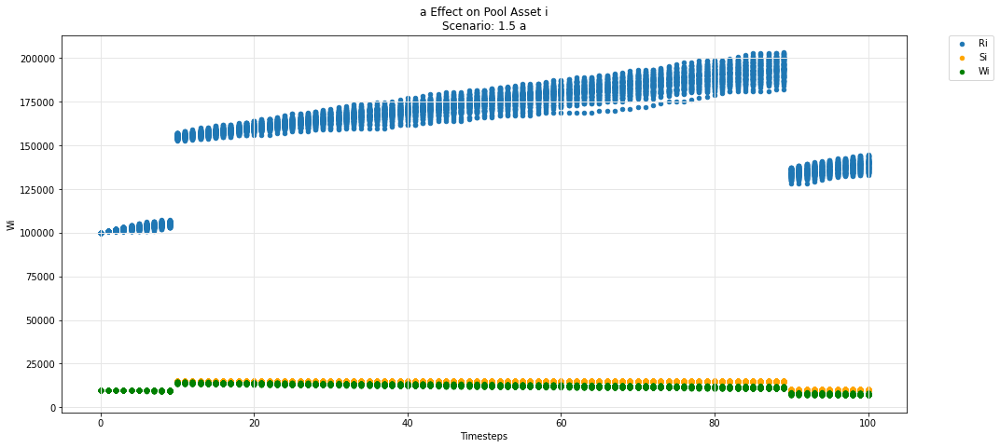

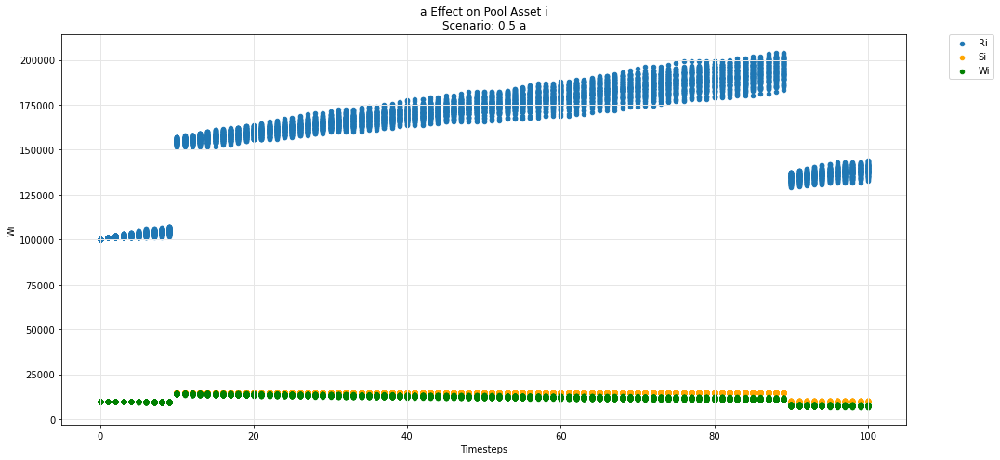

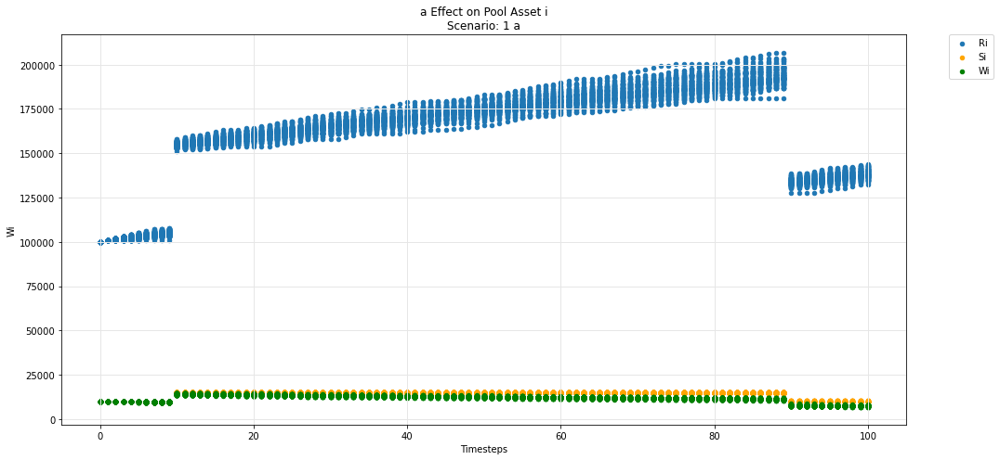

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

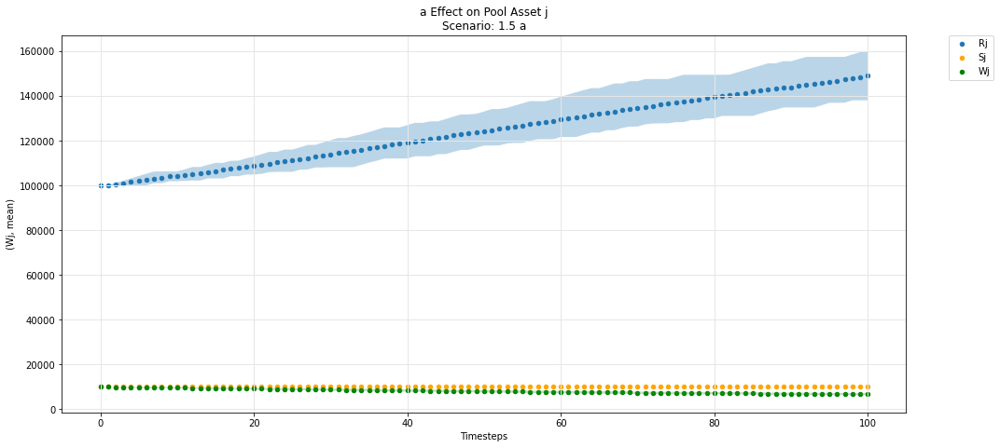

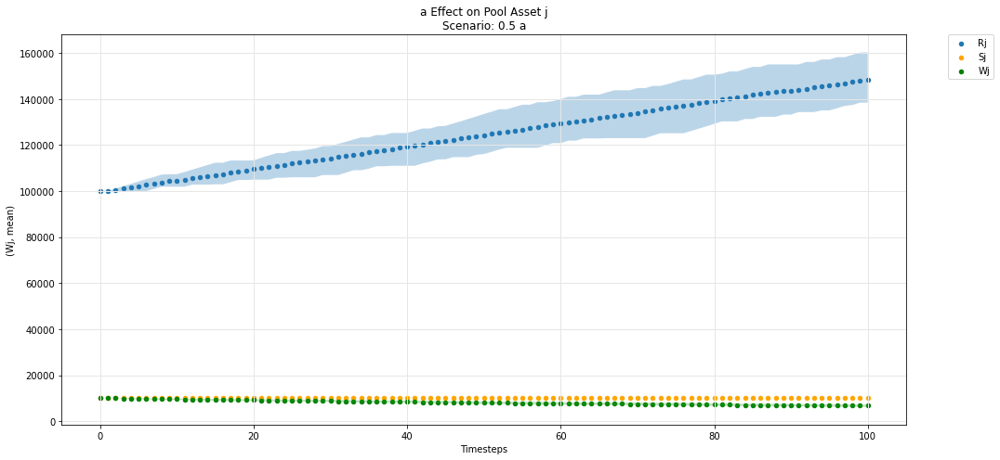

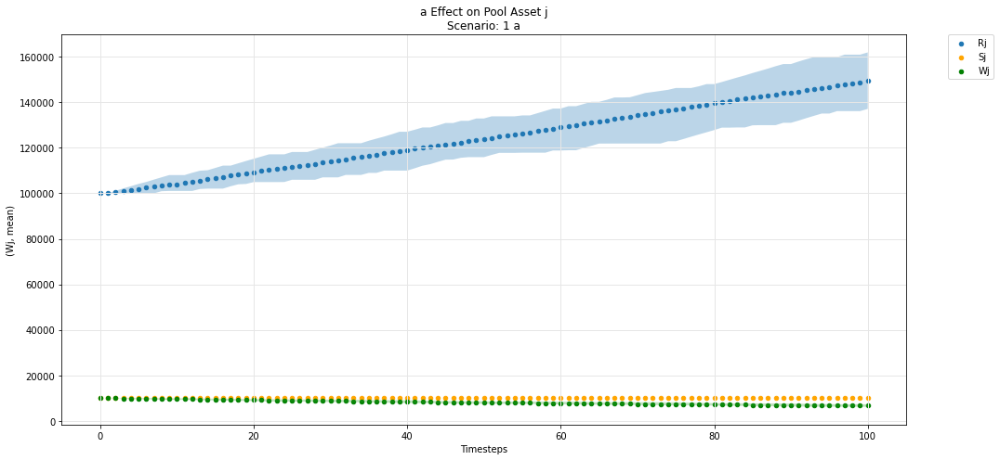

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

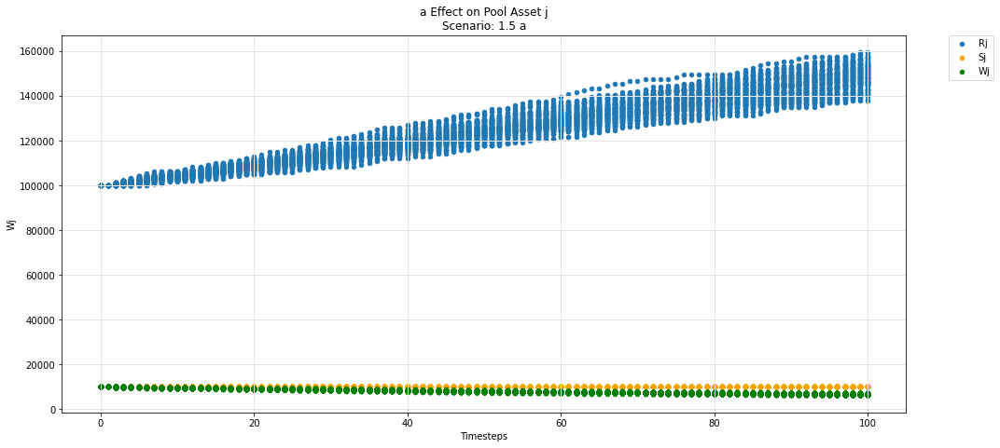

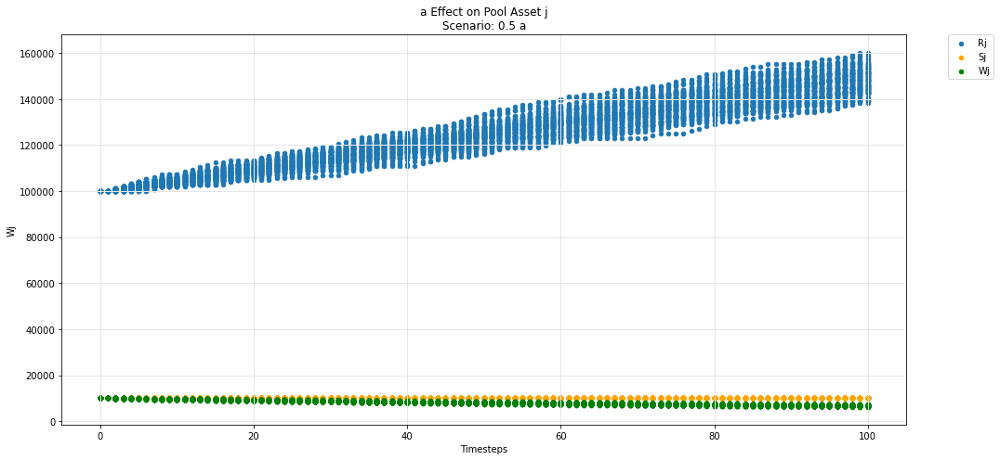

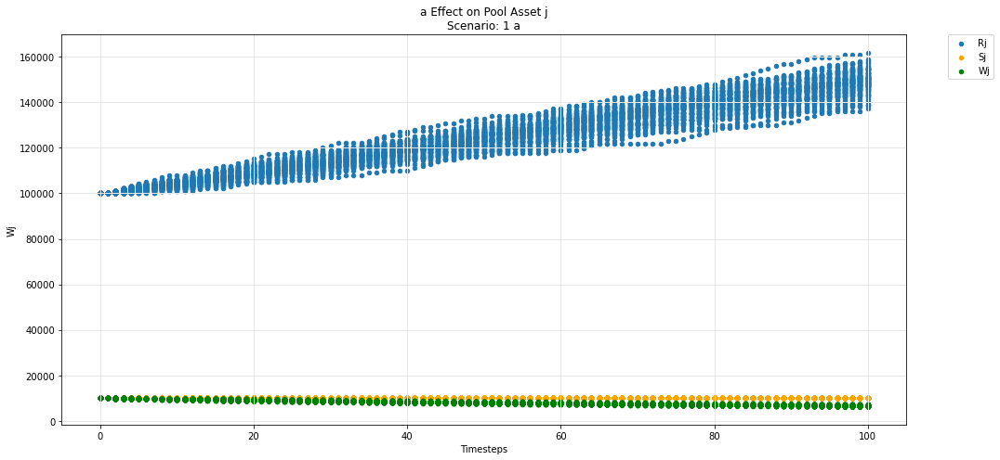

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

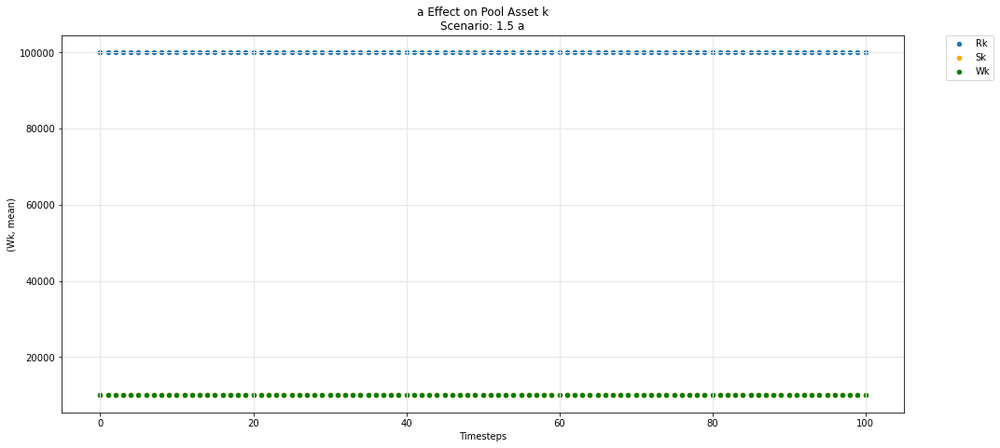

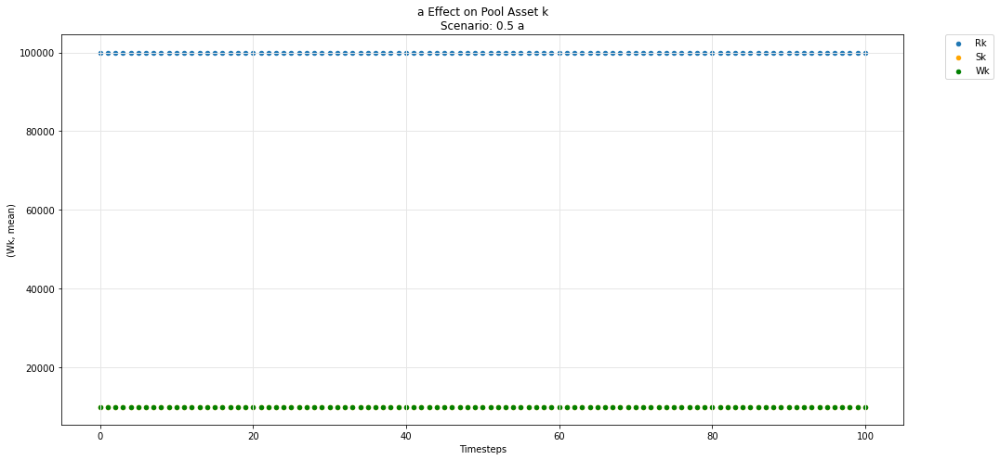

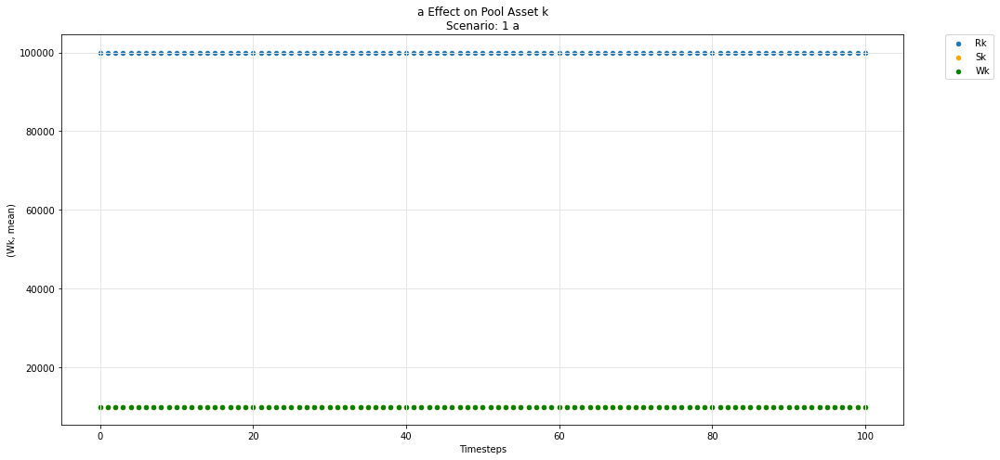

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

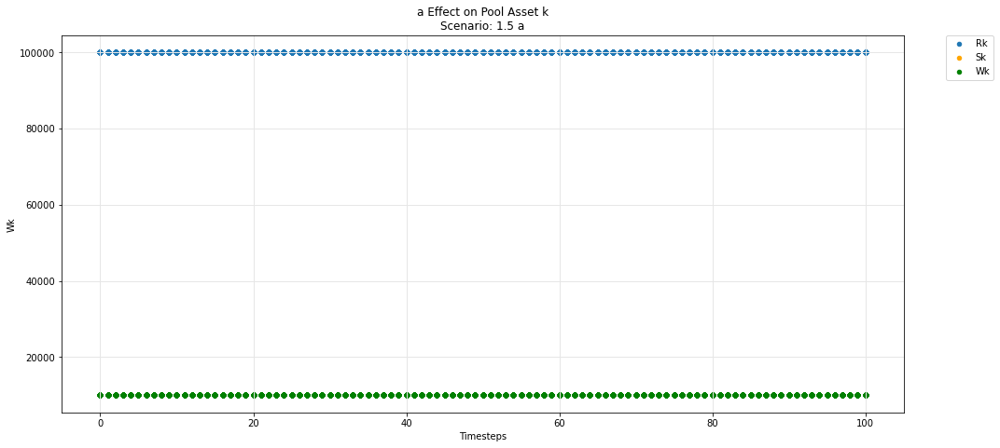

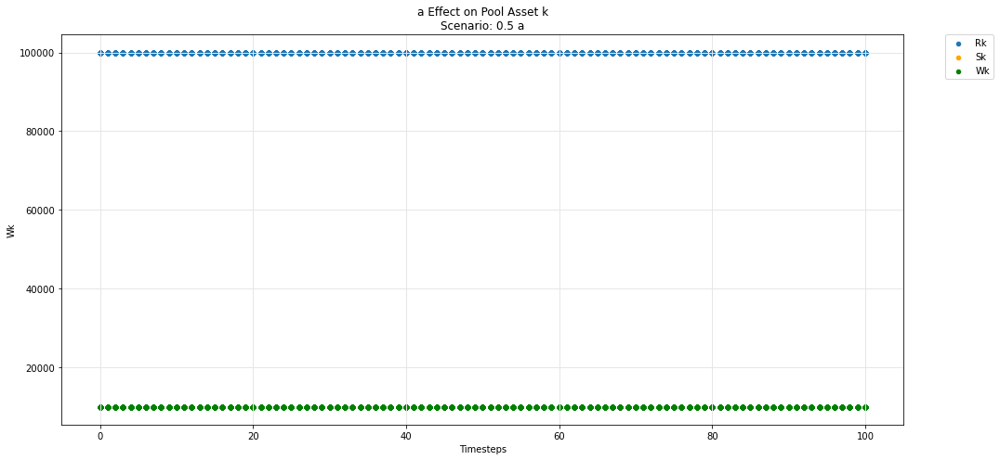

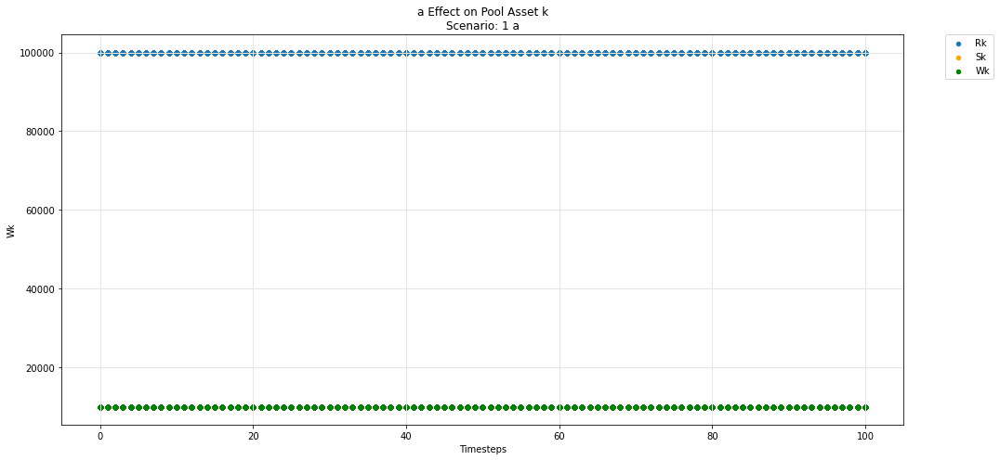

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

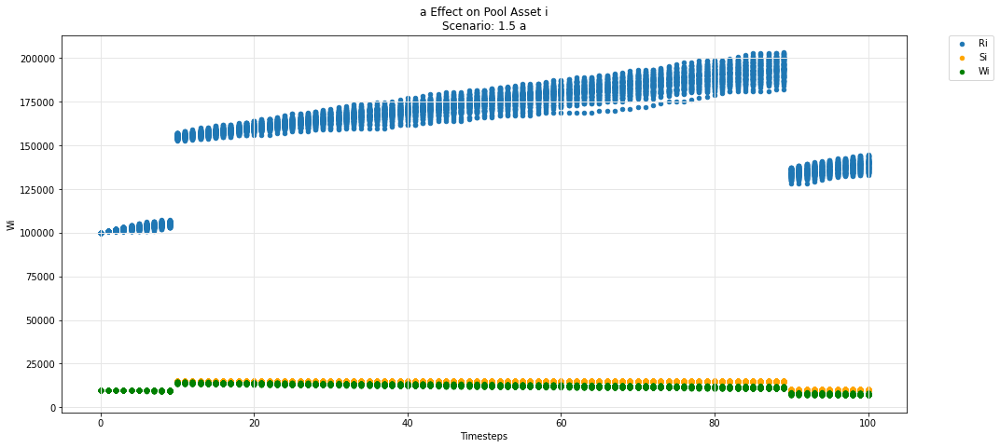

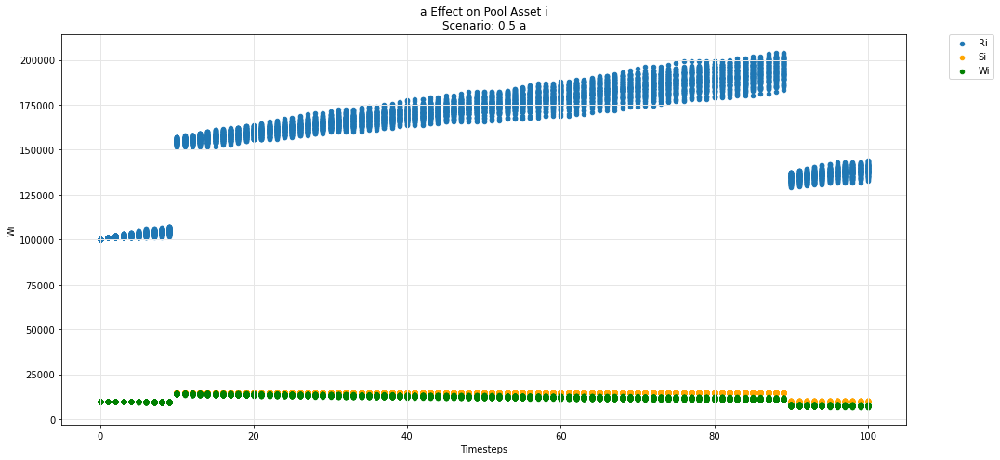

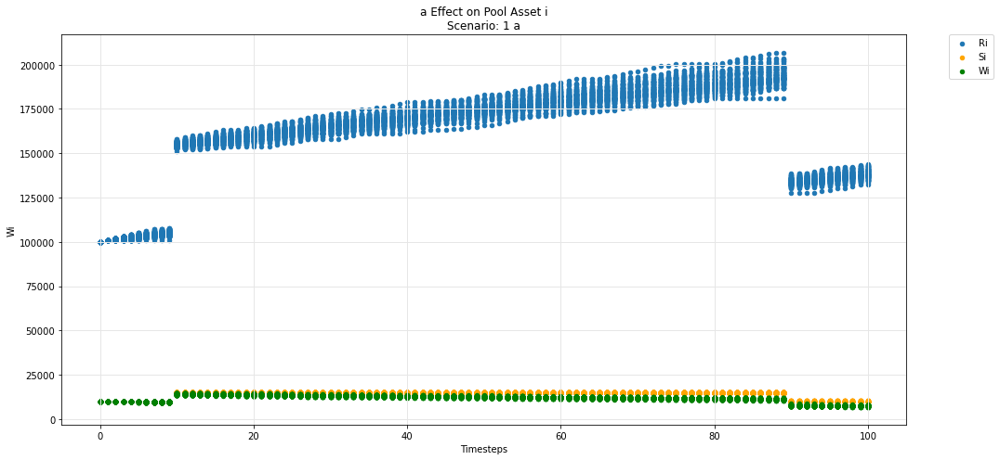

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

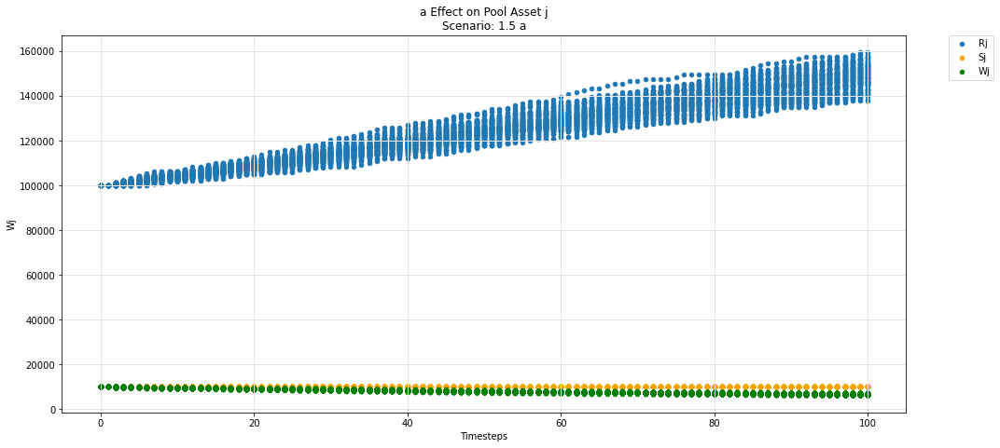

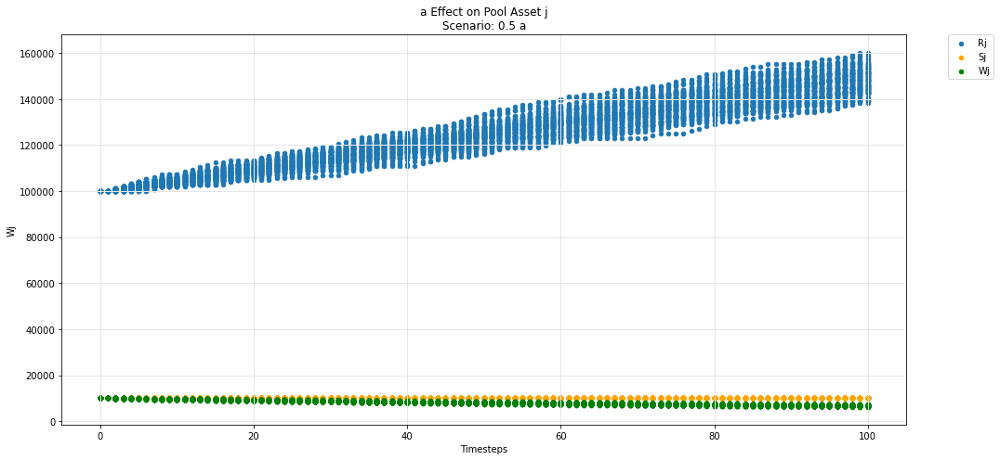

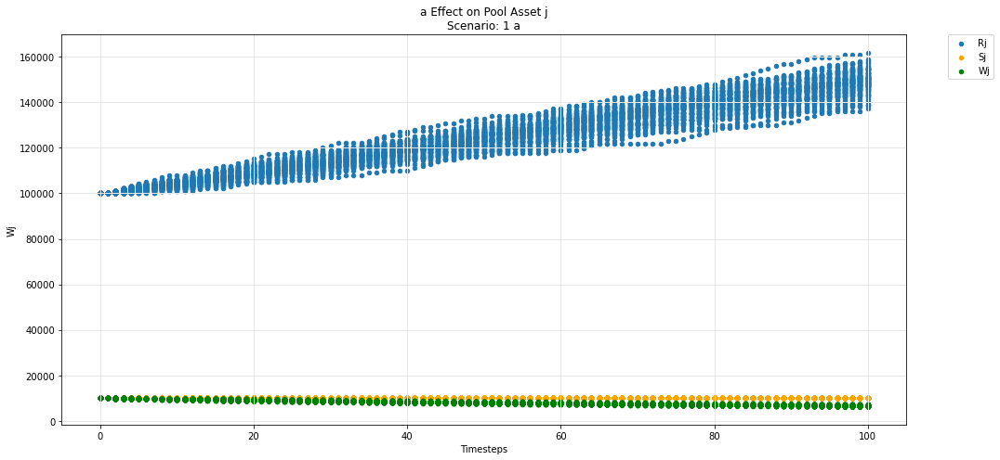

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

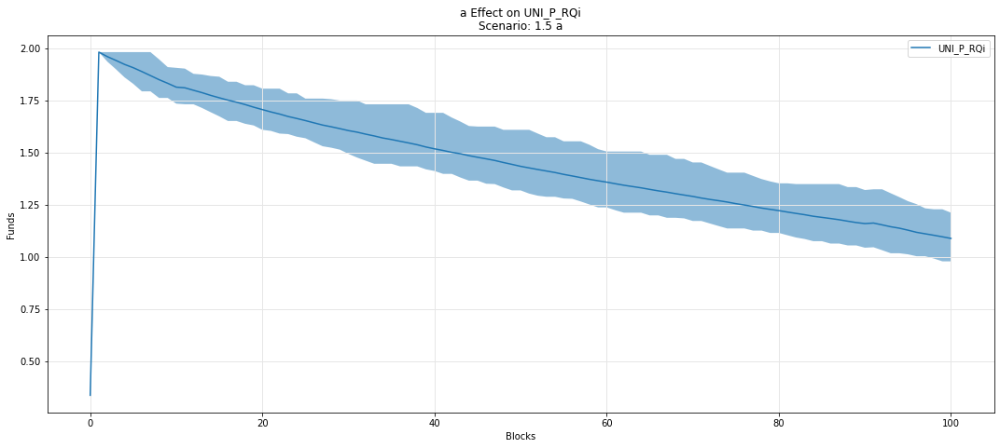

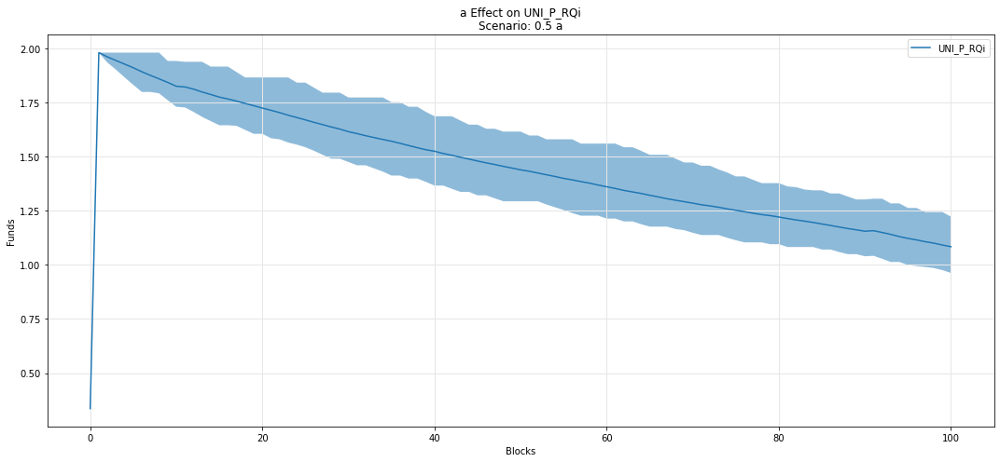

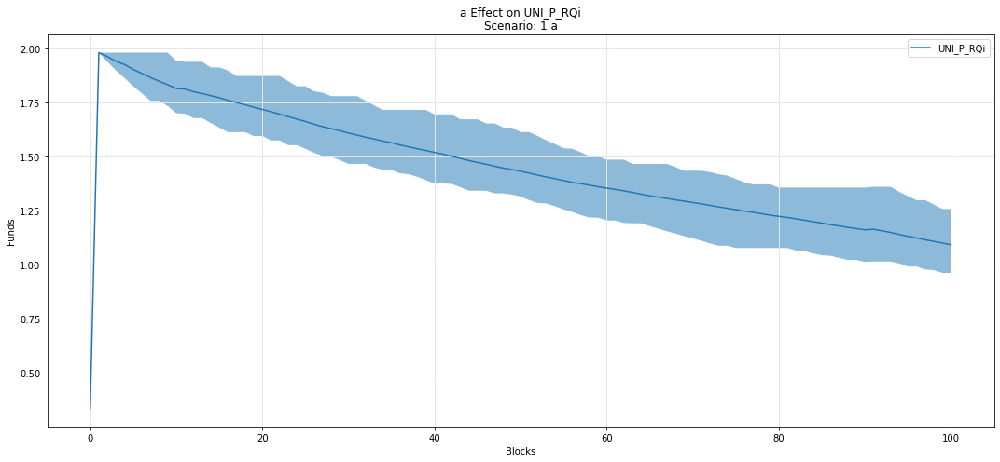

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

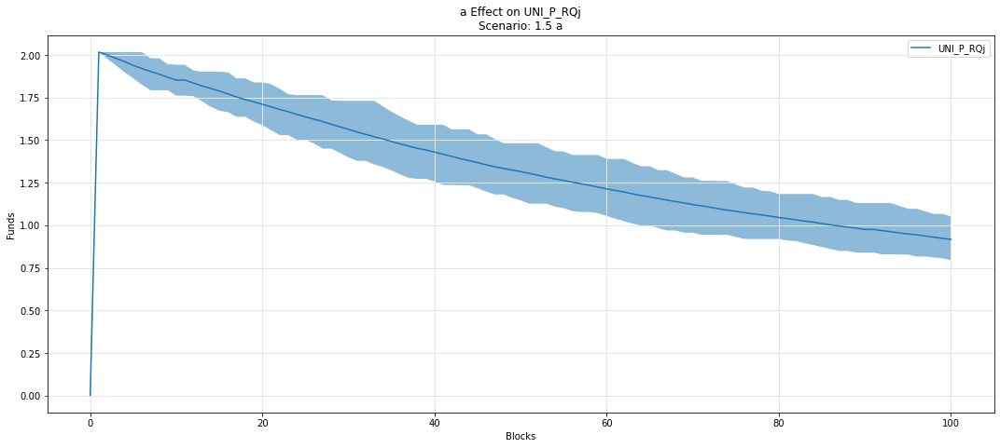

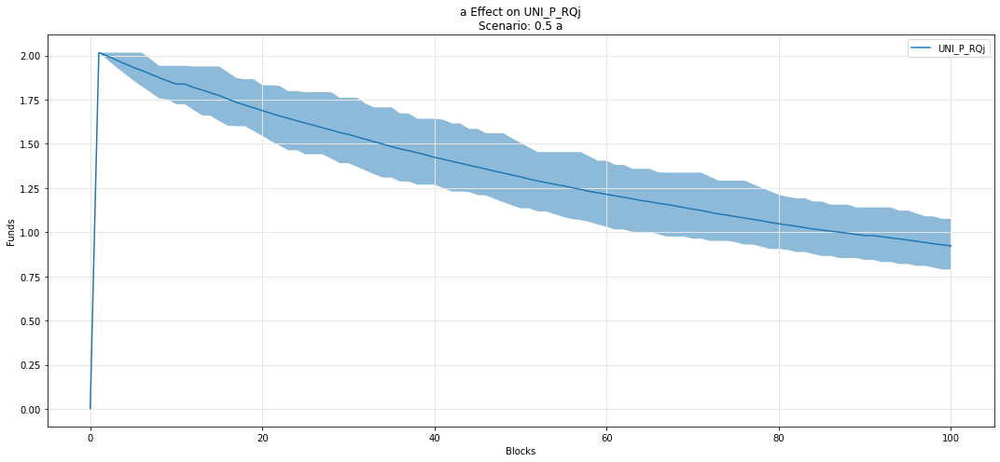

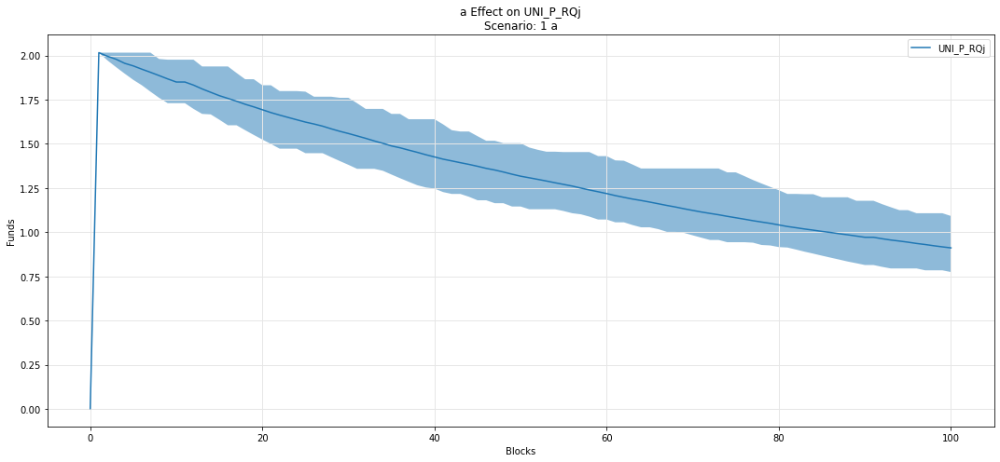

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

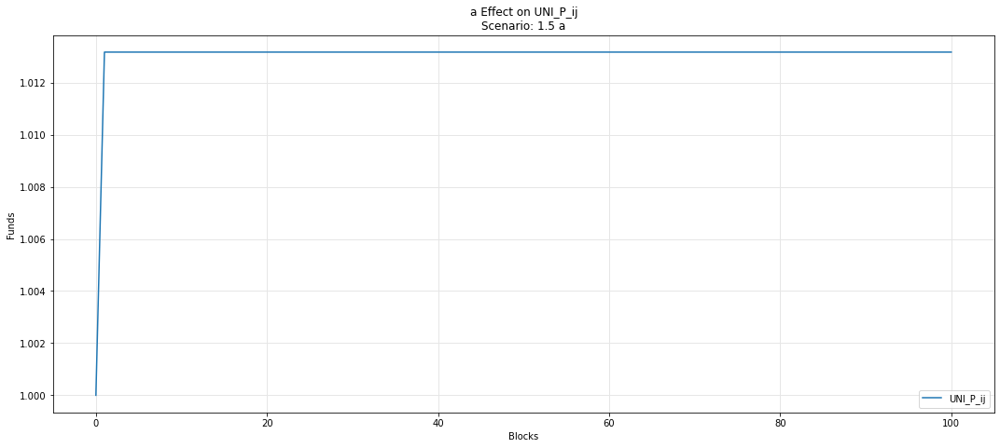

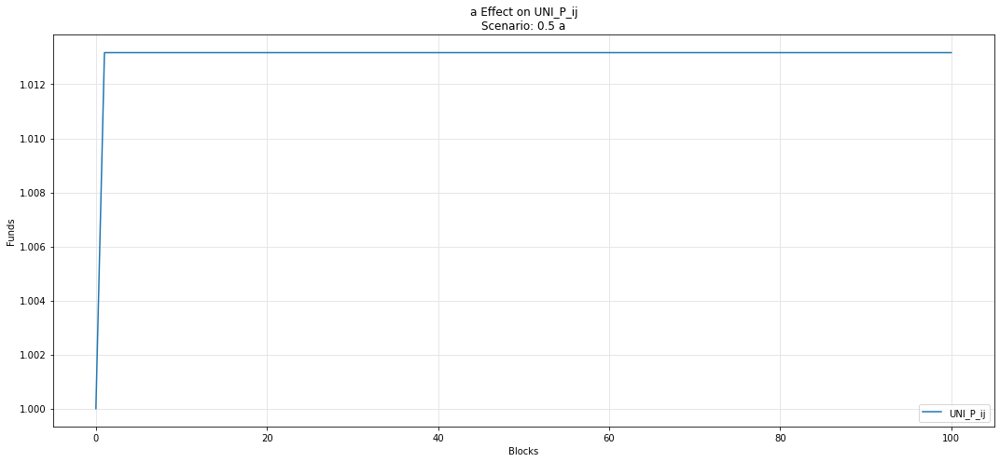

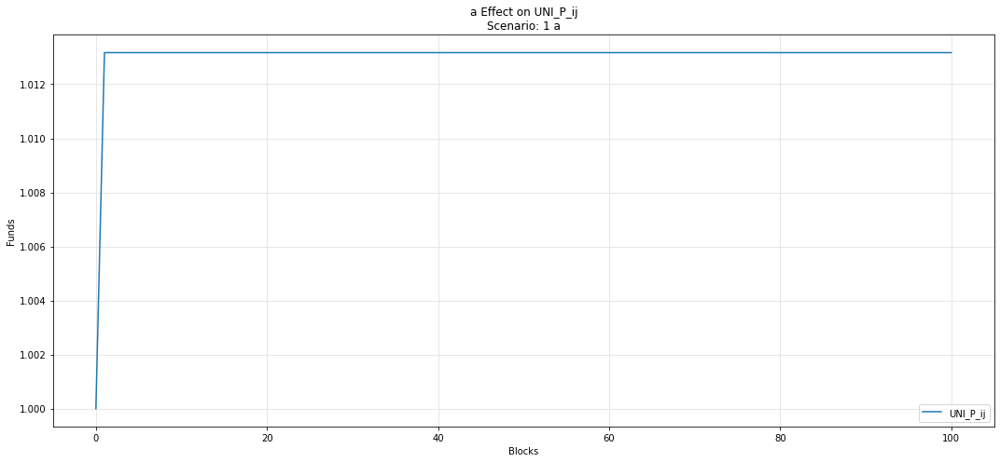

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

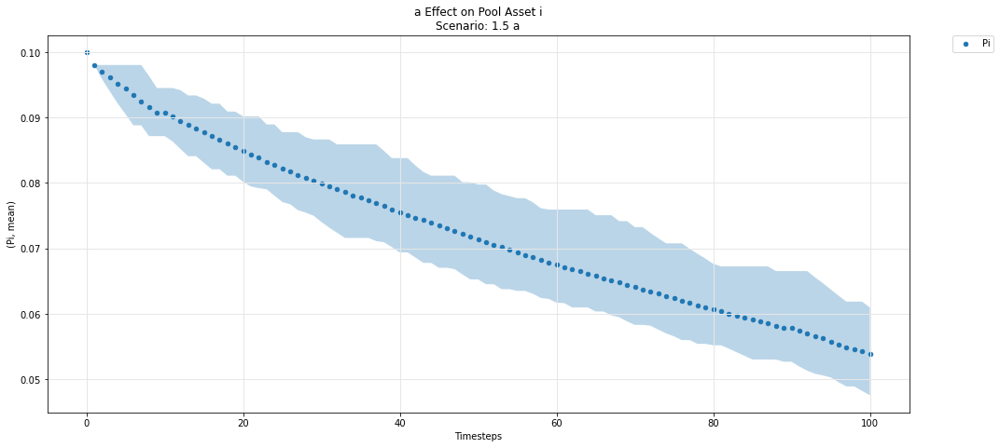

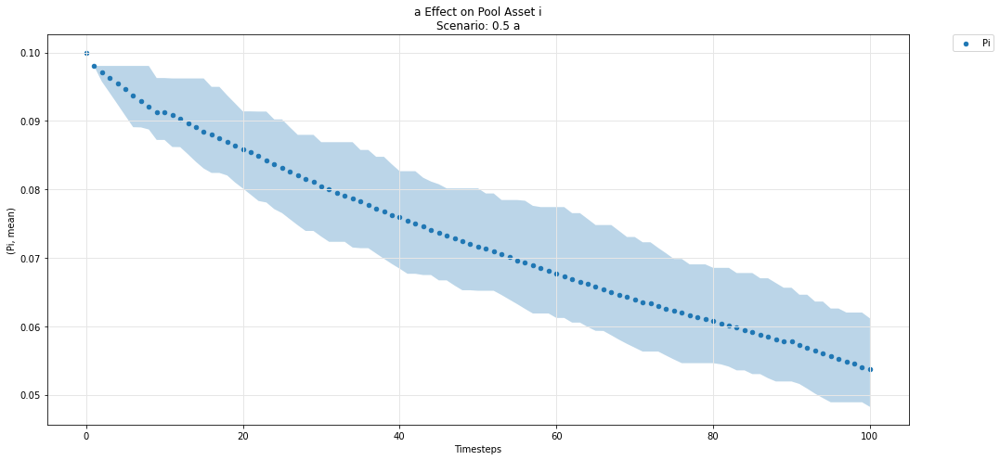

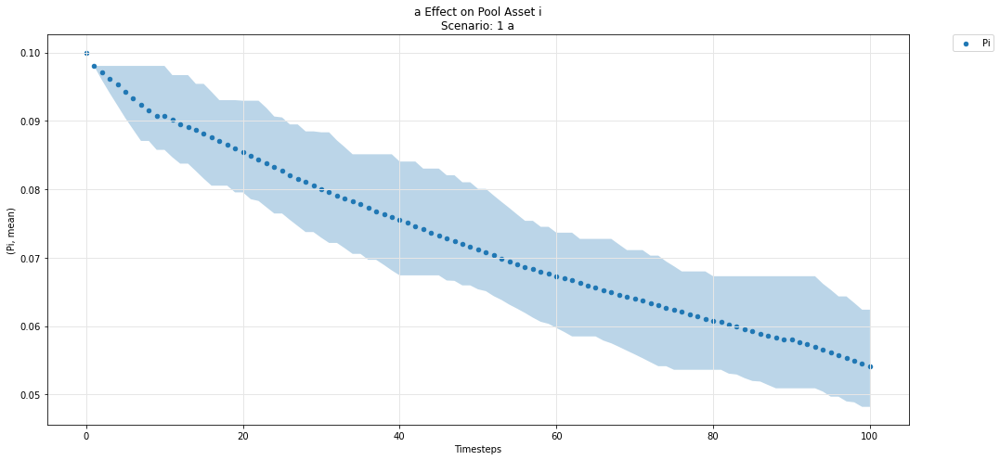

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

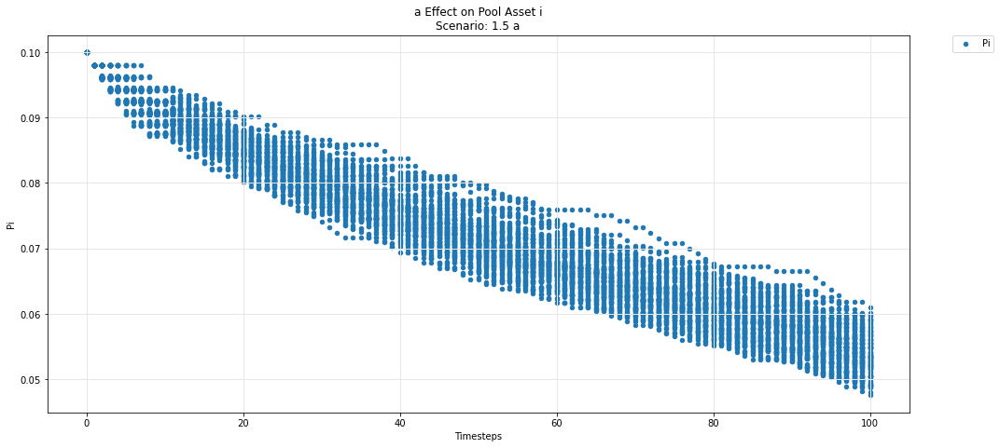

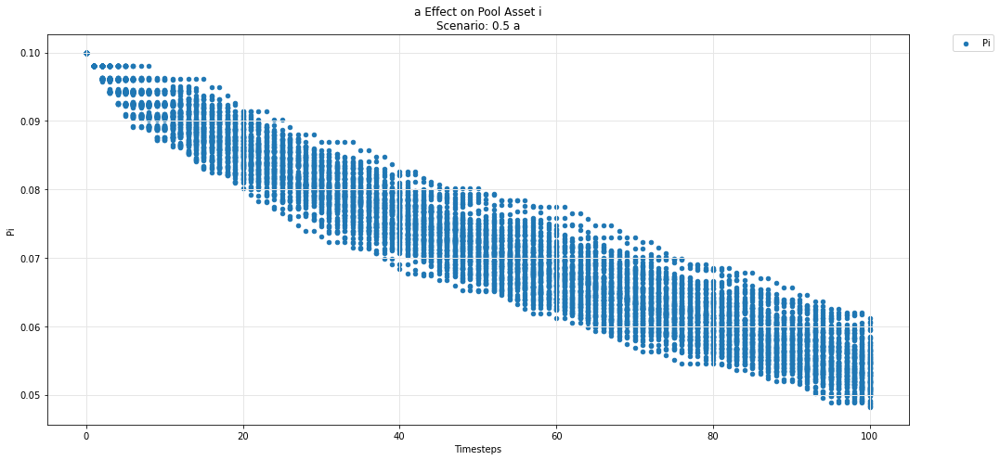

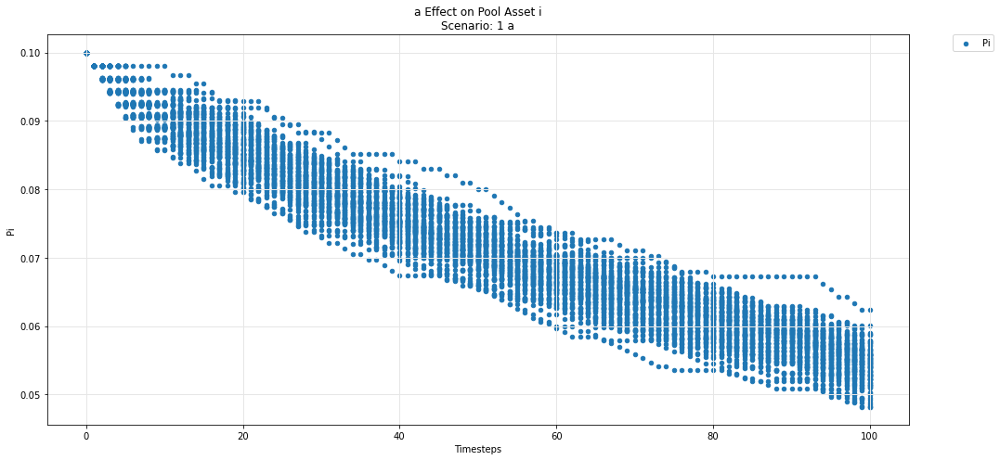

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

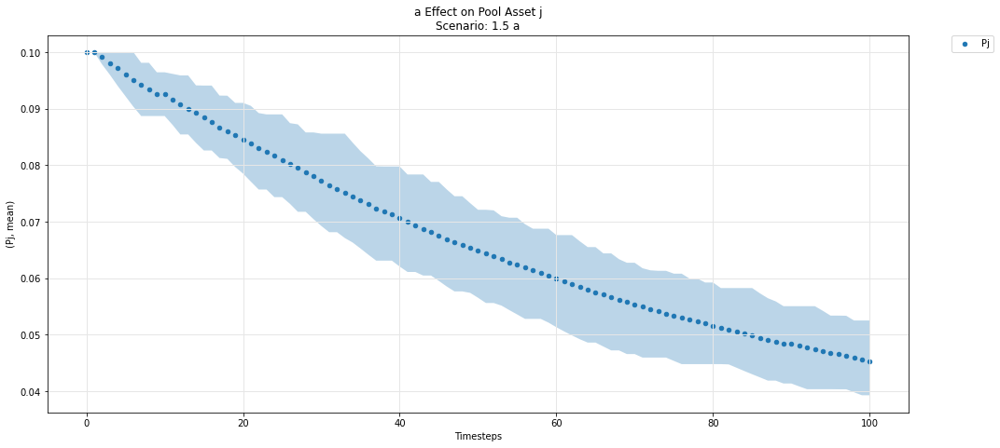

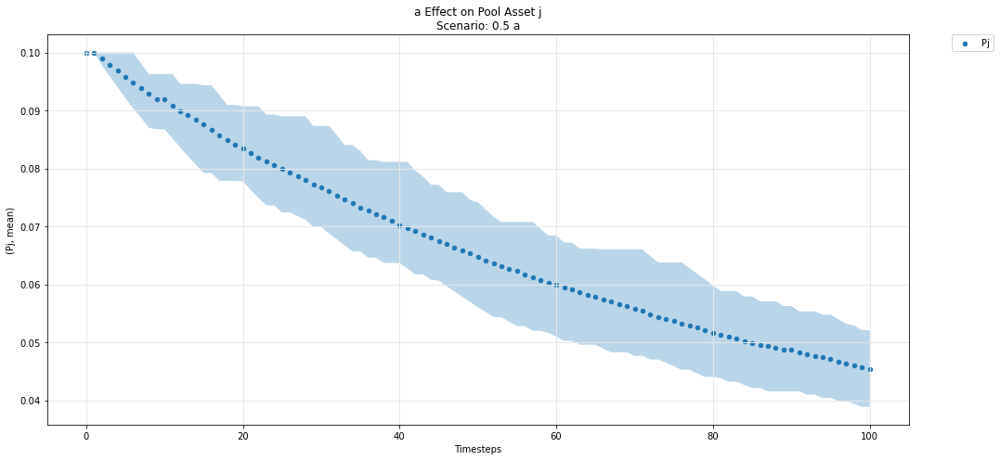

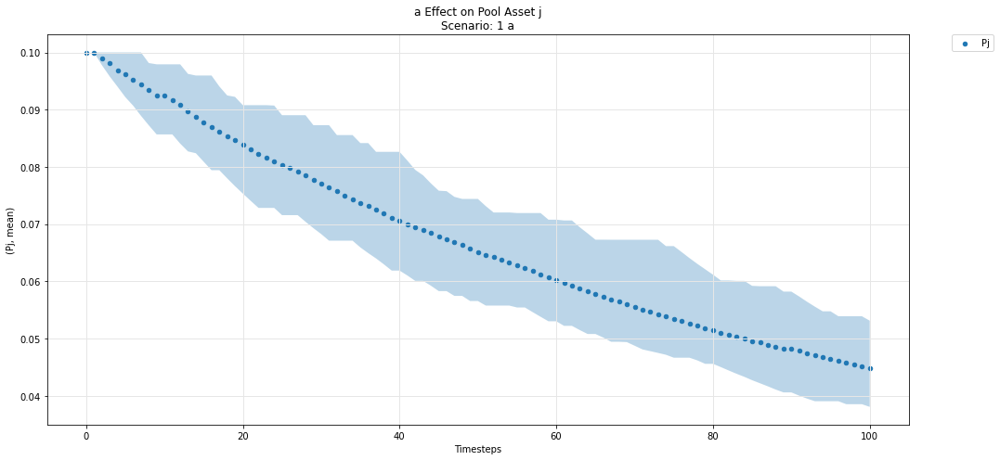

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

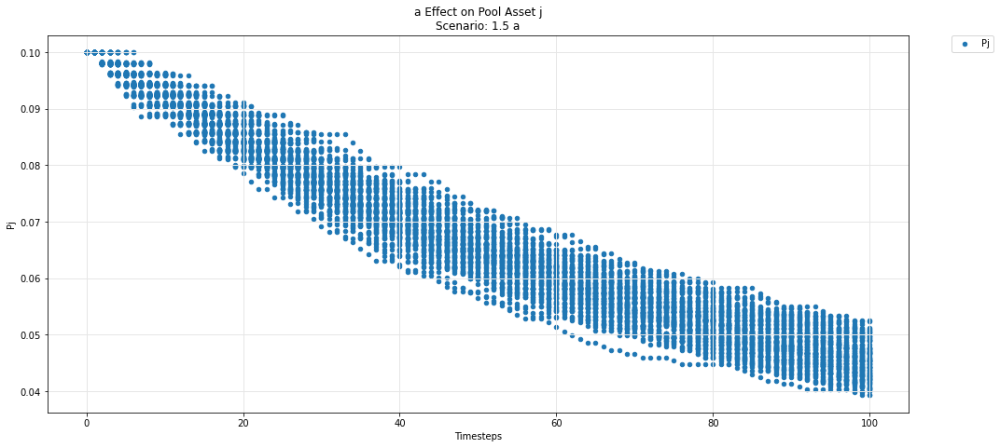

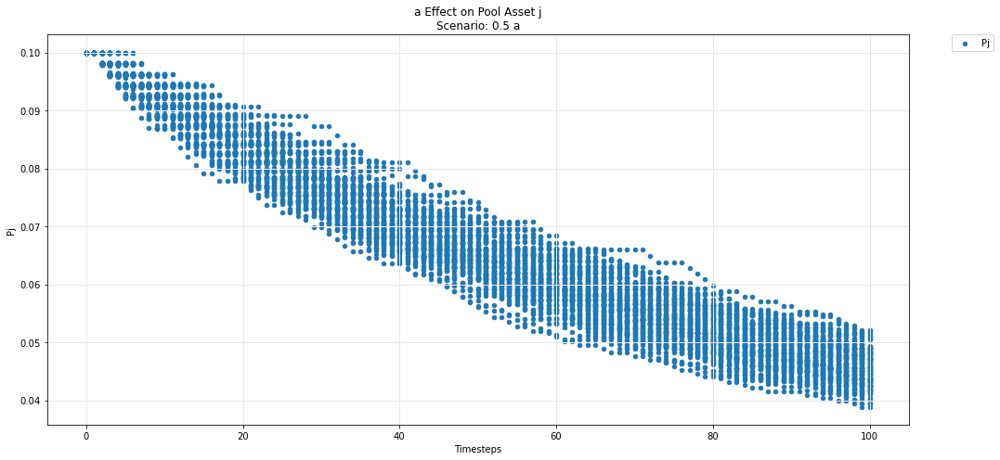

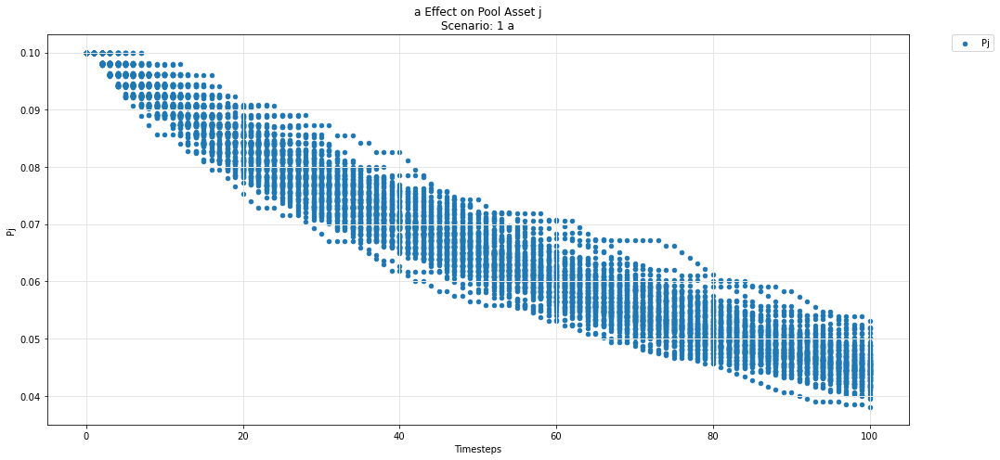

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

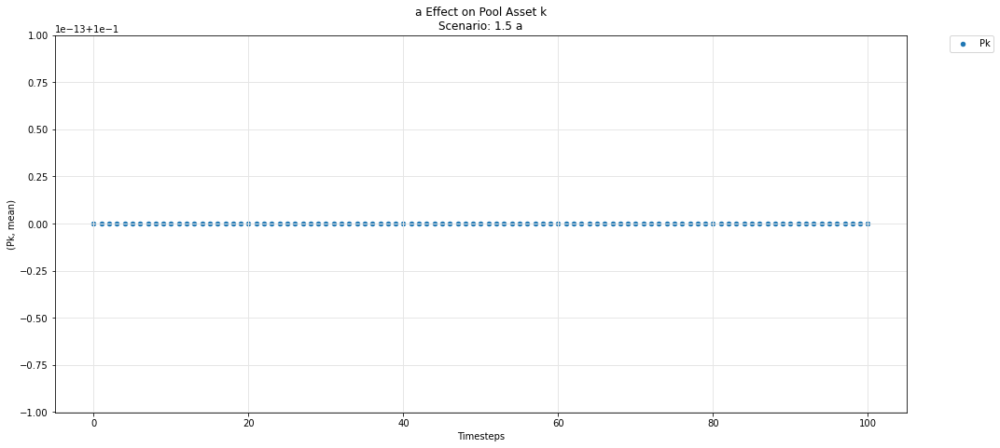

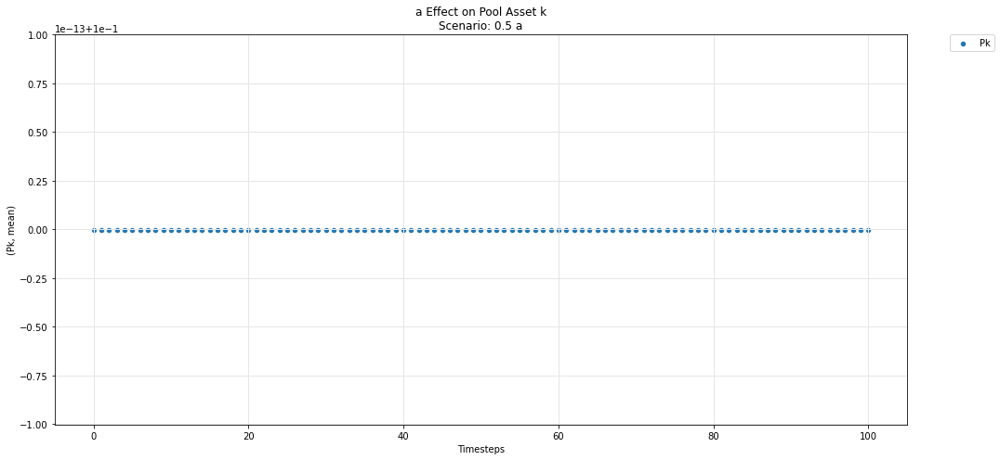

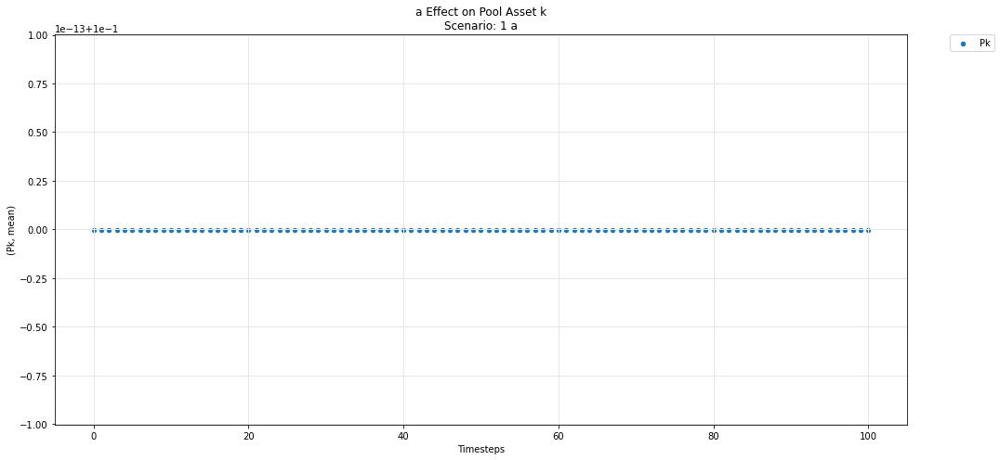

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

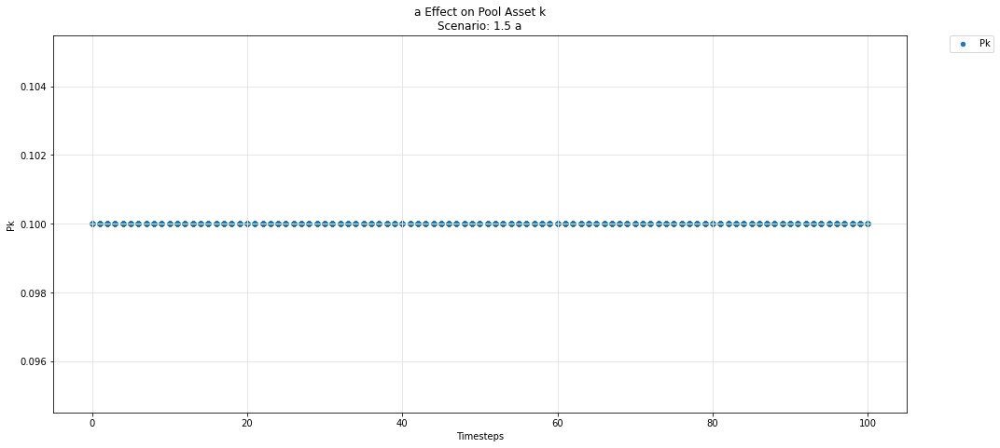

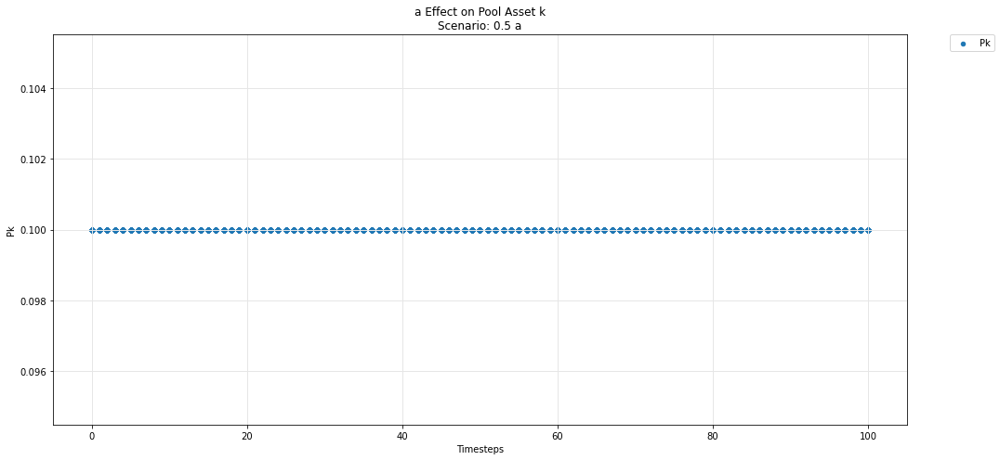

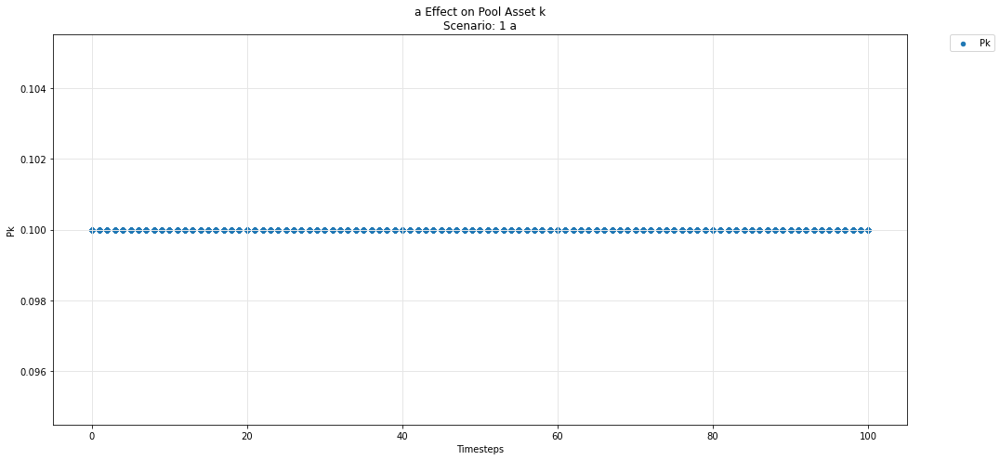

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')